# Face Generation
In this project, you'll use generative adversarial networks to generate new images of faces.
### Get the Data
You'll be using two datasets in this project:
- MNIST
- CelebA

Since the celebA dataset is complex and you're doing GANs in a project for the first time, we want you to test your neural network on MNIST before CelebA.  Running the GANs on MNIST will allow you to see how well your model trains sooner.

If you're using [FloydHub](https://www.floydhub.com/), set `data_dir` to "/input" and use the [FloydHub data ID](http://docs.floydhub.com/home/using_datasets/) "R5KrjnANiKVhLWAkpXhNBe".

In [1]:
data_dir = './data'

# FloydHub - Use with data ID "R5KrjnANiKVhLWAkpXhNBe"
#data_dir = '/input'


"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import helper

helper.download_extract('mnist', data_dir)
helper.download_extract('celeba', data_dir)

Found mnist Data
Found celeba Data


## Explore the Data
### MNIST
As you're aware, the [MNIST](http://yann.lecun.com/exdb/mnist/) dataset contains images of handwritten digits. You can view the first number of examples by changing `show_n_images`. 

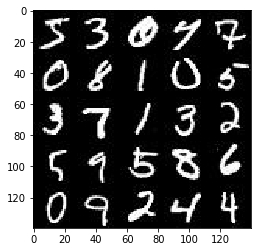

In [2]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
%matplotlib inline
import os
from glob import glob
from matplotlib import pyplot

mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'mnist/*.jpg'))[:show_n_images], 28, 28, 'L')
pyplot.imshow(helper.images_square_grid(mnist_images, 'L'), cmap='gray')

### CelebA
The [CelebFaces Attributes Dataset (CelebA)](http://mmlab.ie.cuhk.edu.hk/projects/CelebA.html) dataset contains over 200,000 celebrity images with annotations.  Since you're going to be generating faces, you won't need the annotations.  You can view the first number of examples by changing `show_n_images`.

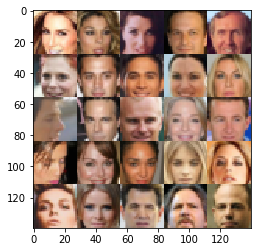

In [3]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'img_align_celeba/*.jpg'))[:show_n_images], 28, 28, 'RGB')
pyplot.imshow(helper.images_square_grid(mnist_images, 'RGB'))

## Preprocess the Data
Since the project's main focus is on building the GANs, we'll preprocess the data for you.  The values of the MNIST and CelebA dataset will be in the range of -0.5 to 0.5 of 28x28 dimensional images.  The CelebA images will be cropped to remove parts of the image that don't include a face, then resized down to 28x28.

The MNIST images are black and white images with a single [color channel](https://en.wikipedia.org/wiki/Channel_(digital_image%29) while the CelebA images have [3 color channels (RGB color channel)](https://en.wikipedia.org/wiki/Channel_(digital_image%29#RGB_Images).
## Build the Neural Network
You'll build the components necessary to build a GANs by implementing the following functions below:
- `model_inputs`
- `discriminator`
- `generator`
- `model_loss`
- `model_opt`
- `train`

### Check the Version of TensorFlow and Access to GPU
This will check to make sure you have the correct version of TensorFlow and access to a GPU

In [4]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
from distutils.version import LooseVersion
import warnings
import tensorflow as tf

# Check TensorFlow Version
assert LooseVersion(tf.__version__) >= LooseVersion('1.0'), 'Please use TensorFlow version 1.0 or newer.  You are using {}'.format(tf.__version__)
print('TensorFlow Version: {}'.format(tf.__version__))

# Check for a GPU
if not tf.test.gpu_device_name():
    warnings.warn('No GPU found. Please use a GPU to train your neural network.')
else:
    print('Default GPU Device: {}'.format(tf.test.gpu_device_name()))

TensorFlow Version: 1.2.1
Default GPU Device: /gpu:0


### Input
Implement the `model_inputs` function to create TF Placeholders for the Neural Network. It should create the following placeholders:
- Real input images placeholder with rank 4 using `image_width`, `image_height`, and `image_channels`.
- Z input placeholder with rank 2 using `z_dim`.
- Learning rate placeholder with rank 0.

Return the placeholders in the following the tuple (tensor of real input images, tensor of z data)

In [5]:
import problem_unittests as tests

def model_inputs(image_width, image_height, image_channels, z_dim):
    """
    Create the model inputs
    :param image_width: The input image width
    :param image_height: The input image height
    :param image_channels: The number of image channels
    :param z_dim: The dimension of Z
    :return: Tuple of (tensor of real input images, tensor of z data, learning rate)
    """
    # DONE: Implement Function
    inputs_real = tf.placeholder(tf.float32, (None, image_width, image_height, image_channels), name='input_real') 
    inputs_z = tf.placeholder(tf.float32, (None, z_dim), name='input_z')
    lr = tf.placeholder(tf.float32, name='learning_rate')
    
    return inputs_real, inputs_z, lr

"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_inputs(model_inputs)

ERROR:tensorflow:==================================
Object was never used (type <class 'tensorflow.python.framework.ops.Operation'>):
<tf.Operation 'assert_rank_2/Assert/Assert' type=Assert>
If you want to mark it as used call its "mark_used()" method.
It was originally created here:
['File "c:\\users\\peter\\anaconda3\\envs\\tflearn-gpu\\lib\\runpy.py", line 193, in _run_module_as_main\n    "__main__", mod_spec)', 'File "c:\\users\\peter\\anaconda3\\envs\\tflearn-gpu\\lib\\runpy.py", line 85, in _run_code\n    exec(code, run_globals)', 'File "c:\\users\\peter\\anaconda3\\envs\\tflearn-gpu\\lib\\site-packages\\ipykernel_launcher.py", line 16, in <module>\n    app.launch_new_instance()', 'File "c:\\users\\peter\\anaconda3\\envs\\tflearn-gpu\\lib\\site-packages\\traitlets\\config\\application.py", line 658, in launch_instance\n    app.start()', 'File "c:\\users\\peter\\anaconda3\\envs\\tflearn-gpu\\lib\\site-packages\\ipykernel\\kernelapp.py", line 477, in start\n    ioloop.IOLoop.instan

### Discriminator
Implement `discriminator` to create a discriminator neural network that discriminates on `images`.  This function should be able to reuse the variables in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "discriminator" to allow the variables to be reused.  The function should return a tuple of (tensor output of the discriminator, tensor logits of the discriminator).

In [6]:
# conv2d uses xavier initializer (as the None is transformed in a new glorot_uniform_initializer after line 220 in https://github.com/tensorflow/tensorflow/blob/r1.2/tensorflow/python/ops/variable_scope.py)
dnconv = 64
dropout_rate = 0.5
def discriminator(images, reuse=False, alpha=0.01):
    """
    Create the discriminator network
    :param images: Tensor of input image(s)
    :param reuse: Boolean if the weights should be reused
    :return: Tuple of (tensor output of the discriminator, tensor logits of the discriminator)
    """
    # DONE: Implement Function
    with tf.variable_scope('discriminator', reuse=reuse):
        # Input layer is 28 x 28 x out_channel_dim
        #print(images.get_shape().as_list())
        
        # conv to 14, 14
        x = tf.layers.conv2d(images, dnconv*4, 5, strides=2, padding='same')
        x = tf.layers.dropout(inputs=x, rate=dropout_rate, training=True)
        x = tf.maximum(alpha * x, x)
        #print(x.get_shape().as_list())
        
        # conv to 7, 7
        x = tf.layers.conv2d(x, dnconv*4, 5, strides=2, padding='same', use_bias=False)
        x = tf.layers.batch_normalization(x, training=True)
        x = tf.layers.dropout(inputs=x, rate=dropout_rate, training=True)
        x = tf.maximum(alpha * x, x)
        #print(x.get_shape().as_list())
        
        # conv to 4, 4
        x = tf.layers.conv2d(x, dnconv*8, 5, strides=2, padding='same', use_bias=False)
        x = tf.layers.batch_normalization(x, training=True)
        #x = tf.layers.dropout(inputs=x, rate=dropout_rate, training=True)
        x = tf.maximum(alpha * x, x)
        #print(x.get_shape().as_list())
        
        # flatten
        x = tf.reshape(x, (-1, 4*4*dnconv*8))
        #print(x.get_shape().as_list())
        
        # logits and output
        logits = tf.layers.dense(x, 1)
        out = tf.sigmoid(logits)
        
        
        return out, logits
    
"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_discriminator(discriminator, tf)

Tests Passed


### Generator
Implement `generator` to generate an image using `z`. This function should be able to reuse the variables in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "generator" to allow the variables to be reused. The function should return the generated 28 x 28 x `out_channel_dim` images.

In [7]:
gnconv = 64
dropout_rate = 0.5
def generator(z, out_channel_dim, is_train=True, alpha=0.02): # I put alpha parameter to this function call
    """
    Create the generator network
    :param z: Input z
    :param out_channel_dim: The number of channels in the output image
    :param is_train: Boolean if generator is being used for training
    :return: The tensor output of the generator
    """
    # DONE: Implement Function
    
    # auxiliar variables
    reuse = not is_train
    
    # scope for generator
    with tf.variable_scope('generator', reuse=reuse):
        # First fully connected layer
        x = tf.layers.dense(z, 4*4*gnconv*8)
        #print(x.get_shape().as_list())
        
        # batch normalization to 4x4
        x = tf.reshape(x, (-1, 4, 4, gnconv*8))
        x = tf.layers.batch_normalization(x, training=is_train)
        x = tf.layers.dropout(inputs=x, rate=dropout_rate, training=True)
        x = tf.maximum(alpha * x, x)
        #print(x.get_shape().as_list())
        
        # conv to 2x2
        #x = tf.layers.conv2d_transpose(x, gnconv*8, 5, strides=2, padding='same')
        #x = tf.layers.batch_normalization(x, training=is_train)
        #x = tf.layers.dropout(inputs=x, rate=dropout_rate, training=True)
        #x = tf.maximum(alpha * x, x)
        #print(x.get_shape().as_list())
        
        # conv to 4x4
        #x = tf.layers.conv2d_transpose(x, gnconv*8, 5, strides=2, padding='same')
        #x = tf.layers.batch_normalization(x, training=is_train)
        #x = tf.layers.dropout(inputs=x, rate=dropout_rate, training=True)
        #x = tf.maximum(alpha * x, x)
        #print(x.get_shape().as_list())

        # upsample to 7x7
        x = tf.image.resize_nearest_neighbor(x, (7,7))
        #print(x.get_shape().as_list())

        # conv to 7x7
        x = tf.layers.conv2d(x, gnconv*6, 5, padding='same')
        x = tf.layers.batch_normalization(x, training=is_train)
        x = tf.maximum(alpha * x, x)
        #print(x.get_shape().as_list())
        
        # upsample to 14x14
        x = tf.image.resize_nearest_neighbor(x, (14,14))
        #print(x.get_shape().as_list())

        # conv to 14x14
        x = tf.layers.conv2d(x, gnconv*4, 5, padding='same')
        x = tf.layers.batch_normalization(x, training=is_train)
        x = tf.maximum(alpha * x, x)
        #print(x.get_shape().as_list())
        
        
        # upsample to 28x28
        x = tf.image.resize_nearest_neighbor(x, (28,28))
        #print(x.get_shape().as_list())

        # Output layer, 28 x 28 x out_channel_dim (3 or 1, depending on the task - faces or minst)
        logits = tf.layers.conv2d(x, out_channel_dim, 5, padding='same')
        #print(logits.get_shape().as_list())
        
        out = tf.tanh(logits)
        
        return out

"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_generator(generator, tf)

Tests Passed


### Loss
Implement `model_loss` to build the GANs for training and calculate the loss.  The function should return a tuple of (discriminator loss, generator loss).  Use the following functions you implemented:
- `discriminator(images, reuse=False)`
- `generator(z, out_channel_dim, is_train=True)`

In [8]:
smooth = 0.1

def model_loss(input_real, input_z, out_channel_dim, alpha=0.02): # I put alpha parameter to this function call
    """
    Get the loss for the discriminator and generator
    :param input_real: Images from the real dataset
    :param input_z: Z input
    :param out_channel_dim: The number of channels in the output image
    :return: A tuple of (discriminator loss, generator loss)
    """
    # DONE: Implement Function
    
    # Just for reference:
    #   discriminator(images, reuse=False, alpha=0.01)
    #   generator(z, out_channel_dim, is_train=True, alpha=0.02): # I put alpha parameter to this function call
    
    g_out = generator(input_z, out_channel_dim, alpha=alpha)
    d_out_real, d_logits_real = discriminator(input_real, alpha=alpha)
    d_out_fake, d_logits_fake = discriminator(g_out, reuse=True, alpha=alpha)

    d_loss_real = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(
                                                        logits=d_logits_real,
                                                        labels=tf.ones_like(d_out_real) * (1. - smooth)))
    d_loss_fake = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(
                                                        logits=d_logits_fake,
                                                        labels=tf.zeros_like(d_out_fake)))
    d_loss = d_loss_real + d_loss_fake
    
    g_loss = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(
                                                        logits=d_logits_fake,
                                                        labels=tf.ones_like(d_out_fake)))

    return d_loss, g_loss

"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_loss(model_loss)

Tests Passed


### Optimization
Implement `model_opt` to create the optimization operations for the GANs. Use [`tf.trainable_variables`](https://www.tensorflow.org/api_docs/python/tf/trainable_variables) to get all the trainable variables.  Filter the variables with names that are in the discriminator and generator scope names.  The function should return a tuple of (discriminator training operation, generator training operation).

In [9]:
def model_opt(d_loss, g_loss, learning_rate, beta1):
    """
    Get optimization operations
    :param d_loss: Discriminator loss Tensor
    :param g_loss: Generator loss Tensor
    :param learning_rate: Learning Rate Placeholder
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :return: A tuple of (discriminator training operation, generator training operation)
    """
    # DONE: Implement Function
    
    # Get weights and bias to update
    t_vars = tf.trainable_variables()
    d_vars = [var for var in t_vars if var.name.startswith('discriminator')]
    g_vars = [var for var in t_vars if var.name.startswith('generator')]

    # Optimize
    with tf.control_dependencies(tf.get_collection(tf.GraphKeys.UPDATE_OPS)):
        d_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(d_loss, var_list=d_vars)
        g_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(g_loss, var_list=g_vars)

    return d_train_opt, g_train_opt


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_opt(model_opt, tf)

Tests Passed


## Neural Network Training
### Show Output
Use this function to show the current output of the generator during training. It will help you determine how well the GANs is training.

In [10]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import numpy as np

def show_generator_output(sess, n_images, input_z, out_channel_dim, image_mode):
    """
    Show example output for the generator
    :param sess: TensorFlow session
    :param n_images: Number of Images to display
    :param input_z: Input Z Tensor
    :param out_channel_dim: The number of channels in the output image
    :param image_mode: The mode to use for images ("RGB" or "L")
    """
    cmap = None if image_mode == 'RGB' else 'gray'
    z_dim = input_z.get_shape().as_list()[-1]
    example_z = np.random.uniform(-1, 1, size=[n_images, z_dim])

    samples = sess.run(
        generator(input_z, out_channel_dim, False),
        feed_dict={input_z: example_z})

    images_grid = helper.images_square_grid(samples, image_mode)
    pyplot.imshow(images_grid, cmap=cmap)
    pyplot.show()

### Train
Implement `train` to build and train the GANs.  Use the following functions you implemented:
- `model_inputs(image_width, image_height, image_channels, z_dim)`
- `model_loss(input_real, input_z, out_channel_dim)`
- `model_opt(d_loss, g_loss, learning_rate, beta1)`

Use the `show_generator_output` to show `generator` output while you train. Running `show_generator_output` for every batch will drastically increase training time and increase the size of the notebook.  It's recommended to print the `generator` output every 100 batches.

In [11]:
from datetime import datetime

print_every = 10
show_every = 100
n_images = 16
def train(epoch_count, batch_size, z_dim, learning_rate, beta1, get_batches, data_shape, data_image_mode):
    """
    Train the GAN
    :param epoch_count: Number of epochs
    :param batch_size: Batch Size
    :param z_dim: Z dimension
    :param learning_rate: Learning Rate
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :param get_batches: Function to get batches
    :param data_shape: Shape of the data
    :param data_image_mode: The image mode to use for images ("RGB" or "L")
    """
    # DONE: Build Model
    minput_real, minput_z, mlearning_rate = model_inputs(*data_shape[1:], z_dim)
    d_loss, g_loss = model_loss(minput_real, minput_z, data_shape[-1], alpha=0.02)
    d_opt, g_opt = model_opt(d_loss, g_loss, learning_rate, beta1)
    have_i_already_reset_the_default_graph = True

    # Auxiliar variables
    steps = 0
    out_channel_dim = 3 if data_image_mode == 'RGB' else 1
    sample_z = np.random.uniform(-1, 1, size=(n_images, z_dim))

    with tf.Session() as sess:
        sess.run(tf.global_variables_initializer())
        for epoch_i in range(epoch_count):    
            for batch_images in get_batches(batch_size):
                # DONE: Train Model
                steps += 1
                
                # rescale from [-.5, .5] to [-1., 1.]
                batch_images = batch_images * 2

                # Sample random noise for G
                batch_z = np.random.uniform(-1, 1, size=(batch_size, z_dim))

                # Run optimizers
                #_ = sess.run(net.d_opt, feed_dict={net.input_real: batch_images, net.input_z: batch_z, net.learning_rate : learning_rate})
                #_ = sess.run(net.g_opt, feed_dict={net.input_z: batch_z, net.learning_rate : learning_rate, net.input_real: batch_images})
                _ = sess.run(d_opt, feed_dict={minput_real: batch_images, minput_z: batch_z, mlearning_rate: learning_rate})
                _ = sess.run(g_opt, feed_dict={minput_z: batch_z, mlearning_rate: learning_rate, minput_real: batch_images})

                if steps % print_every == 0:
                    # At the end of each epoch, get the losses and print them out
                    #train_loss_d = net.d_loss.eval({net.input_z: batch_z, net.input_real: batch_images})
                    #train_loss_g = net.g_loss.eval({net.input_z: batch_z})
                    train_loss_d = d_loss.eval({minput_z: batch_z, minput_real: batch_images})
                    train_loss_g = g_loss.eval({minput_z: batch_z})

                    print("Timestamp {} - ".format(datetime.now().strftime('%Y%m%d-%H-%M-%S.%f')[:-3]),
                          "Epoch {}/{} - ".format(epoch_i+1, epochs),
                          "Step {} - ".format(steps),
                          "D Loss: {:.4f} -".format(train_loss_d),
                          "G Loss: {:.4f}".format(train_loss_g))

                if steps % show_every == 0:
                    show_generator_output(sess, n_images, minput_z, out_channel_dim, data_image_mode)

            # At the end of each epoch, get the losses and print them out
            if not (steps % show_every == 0):
                train_loss_d = d_loss.eval({minput_z: batch_z, minput_real: batch_images})
                train_loss_g = g_loss.eval({minput_z: batch_z})
                print("Timestamp {} - ".format(datetime.now().strftime('%Y%m%d-%H-%M-%S.%f')[:-3]),
                      "Epoch {}/{} - ".format(epoch_i+1, epochs),
                      "Step {} - ".format(steps),
                      "D Loss: {:.4f} -".format(train_loss_d),
                      "G Loss: {:.4f}".format(train_loss_g))

                show_generator_output(sess, n_images, minput_z, out_channel_dim, data_image_mode)
                

### MNIST
Test your GANs architecture on MNIST.  After 2 epochs, the GANs should be able to generate images that look like handwritten digits.  Make sure the loss of the generator is lower than the loss of the discriminator or close to 0.

Timestamp 20170804-21-10-55.938 -  Epoch 1/2 -  Step 10 -  D Loss: 1.9259 - G Loss: 1.1892
Timestamp 20170804-21-11-03.239 -  Epoch 1/2 -  Step 20 -  D Loss: 1.0745 - G Loss: 1.5677
Timestamp 20170804-21-11-10.511 -  Epoch 1/2 -  Step 30 -  D Loss: 2.1622 - G Loss: 0.7805
Timestamp 20170804-21-11-17.858 -  Epoch 1/2 -  Step 40 -  D Loss: 1.4216 - G Loss: 1.4764
Timestamp 20170804-21-11-25.111 -  Epoch 1/2 -  Step 50 -  D Loss: 1.2802 - G Loss: 1.6797
Timestamp 20170804-21-11-32.327 -  Epoch 1/2 -  Step 60 -  D Loss: 0.9381 - G Loss: 2.1835
Timestamp 20170804-21-11-39.584 -  Epoch 1/2 -  Step 70 -  D Loss: 0.8268 - G Loss: 2.8383
Timestamp 20170804-21-11-46.829 -  Epoch 1/2 -  Step 80 -  D Loss: 2.6893 - G Loss: 0.9009
Timestamp 20170804-21-11-54.058 -  Epoch 1/2 -  Step 90 -  D Loss: 1.5901 - G Loss: 0.9715
Timestamp 20170804-21-12-01.314 -  Epoch 1/2 -  Step 100 -  D Loss: 1.4040 - G Loss: 2.5793


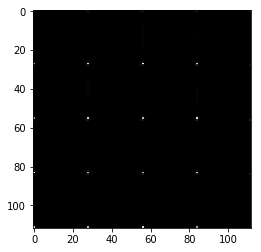

Timestamp 20170804-21-12-09.681 -  Epoch 1/2 -  Step 110 -  D Loss: 2.6970 - G Loss: 1.2031
Timestamp 20170804-21-12-16.976 -  Epoch 1/2 -  Step 120 -  D Loss: 1.3405 - G Loss: 1.4461
Timestamp 20170804-21-12-24.273 -  Epoch 1/2 -  Step 130 -  D Loss: 1.2051 - G Loss: 3.2659
Timestamp 20170804-21-12-31.641 -  Epoch 1/2 -  Step 140 -  D Loss: 1.6832 - G Loss: 2.2205
Timestamp 20170804-21-12-38.926 -  Epoch 1/2 -  Step 150 -  D Loss: 1.0664 - G Loss: 2.0068
Timestamp 20170804-21-12-46.187 -  Epoch 1/2 -  Step 160 -  D Loss: 2.2620 - G Loss: 1.2957
Timestamp 20170804-21-12-53.535 -  Epoch 1/2 -  Step 170 -  D Loss: 1.1753 - G Loss: 2.7796
Timestamp 20170804-21-13-00.981 -  Epoch 1/2 -  Step 180 -  D Loss: 1.5904 - G Loss: 1.5395
Timestamp 20170804-21-13-08.385 -  Epoch 1/2 -  Step 190 -  D Loss: 4.4616 - G Loss: 0.2492
Timestamp 20170804-21-13-15.885 -  Epoch 1/2 -  Step 200 -  D Loss: 1.4426 - G Loss: 1.8967


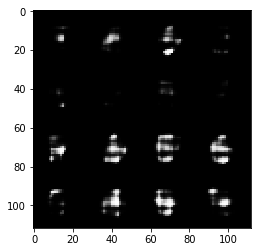

Timestamp 20170804-21-13-23.676 -  Epoch 1/2 -  Step 210 -  D Loss: 0.9754 - G Loss: 3.6808
Timestamp 20170804-21-13-31.094 -  Epoch 1/2 -  Step 220 -  D Loss: 1.5994 - G Loss: 1.5421
Timestamp 20170804-21-13-38.466 -  Epoch 1/2 -  Step 230 -  D Loss: 1.9744 - G Loss: 0.9807
Timestamp 20170804-21-13-45.842 -  Epoch 1/2 -  Step 240 -  D Loss: 1.7325 - G Loss: 1.8165
Timestamp 20170804-21-13-53.432 -  Epoch 1/2 -  Step 250 -  D Loss: 1.3466 - G Loss: 1.6313
Timestamp 20170804-21-14-00.860 -  Epoch 1/2 -  Step 260 -  D Loss: 1.7137 - G Loss: 0.6940
Timestamp 20170804-21-14-08.199 -  Epoch 1/2 -  Step 270 -  D Loss: 3.0542 - G Loss: 0.6488
Timestamp 20170804-21-14-15.535 -  Epoch 1/2 -  Step 280 -  D Loss: 1.2163 - G Loss: 1.4073
Timestamp 20170804-21-14-22.830 -  Epoch 1/2 -  Step 290 -  D Loss: 2.0365 - G Loss: 0.7653
Timestamp 20170804-21-14-30.147 -  Epoch 1/2 -  Step 300 -  D Loss: 0.8216 - G Loss: 1.3303


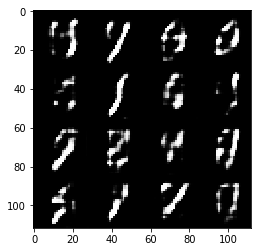

Timestamp 20170804-21-14-37.891 -  Epoch 1/2 -  Step 310 -  D Loss: 1.6558 - G Loss: 0.7040
Timestamp 20170804-21-14-45.206 -  Epoch 1/2 -  Step 320 -  D Loss: 1.0399 - G Loss: 1.2868
Timestamp 20170804-21-14-52.733 -  Epoch 1/2 -  Step 330 -  D Loss: 1.1896 - G Loss: 0.8080
Timestamp 20170804-21-15-00.088 -  Epoch 1/2 -  Step 340 -  D Loss: 1.0790 - G Loss: 1.4510
Timestamp 20170804-21-15-07.398 -  Epoch 1/2 -  Step 350 -  D Loss: 1.9580 - G Loss: 0.5878
Timestamp 20170804-21-15-14.771 -  Epoch 1/2 -  Step 360 -  D Loss: 1.3320 - G Loss: 0.5972
Timestamp 20170804-21-15-22.032 -  Epoch 1/2 -  Step 370 -  D Loss: 1.3116 - G Loss: 0.8592
Timestamp 20170804-21-15-29.406 -  Epoch 1/2 -  Step 380 -  D Loss: 1.6171 - G Loss: 1.3393
Timestamp 20170804-21-15-36.654 -  Epoch 1/2 -  Step 390 -  D Loss: 1.5390 - G Loss: 0.6721
Timestamp 20170804-21-15-44.006 -  Epoch 1/2 -  Step 400 -  D Loss: 1.6134 - G Loss: 0.4411


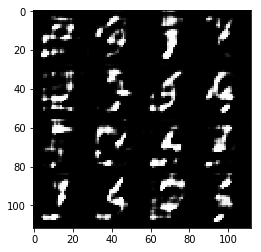

Timestamp 20170804-21-15-51.811 -  Epoch 1/2 -  Step 410 -  D Loss: 1.1883 - G Loss: 1.1498
Timestamp 20170804-21-15-59.082 -  Epoch 1/2 -  Step 420 -  D Loss: 1.4790 - G Loss: 0.8640
Timestamp 20170804-21-16-06.345 -  Epoch 1/2 -  Step 430 -  D Loss: 1.5388 - G Loss: 0.7045
Timestamp 20170804-21-16-13.680 -  Epoch 1/2 -  Step 440 -  D Loss: 0.9310 - G Loss: 0.8352
Timestamp 20170804-21-16-20.962 -  Epoch 1/2 -  Step 450 -  D Loss: 1.2956 - G Loss: 0.5873
Timestamp 20170804-21-16-28.322 -  Epoch 1/2 -  Step 460 -  D Loss: 0.9642 - G Loss: 0.9238
Timestamp 20170804-21-16-35.594 -  Epoch 1/2 -  Step 470 -  D Loss: 0.9181 - G Loss: 1.1023
Timestamp 20170804-21-16-43.128 -  Epoch 1/2 -  Step 480 -  D Loss: 1.2654 - G Loss: 1.2025
Timestamp 20170804-21-16-50.456 -  Epoch 1/2 -  Step 490 -  D Loss: 1.3722 - G Loss: 1.1377
Timestamp 20170804-21-16-57.788 -  Epoch 1/2 -  Step 500 -  D Loss: 1.1156 - G Loss: 1.4218


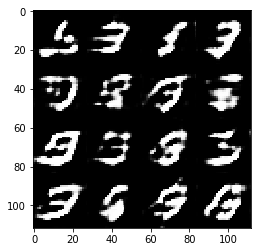

Timestamp 20170804-21-17-05.694 -  Epoch 1/2 -  Step 510 -  D Loss: 1.5415 - G Loss: 0.7241
Timestamp 20170804-21-17-13.053 -  Epoch 1/2 -  Step 520 -  D Loss: 1.6043 - G Loss: 0.8413
Timestamp 20170804-21-17-20.414 -  Epoch 1/2 -  Step 530 -  D Loss: 1.1078 - G Loss: 1.6977
Timestamp 20170804-21-17-27.857 -  Epoch 1/2 -  Step 540 -  D Loss: 0.9030 - G Loss: 1.2116
Timestamp 20170804-21-17-35.154 -  Epoch 1/2 -  Step 550 -  D Loss: 1.0025 - G Loss: 1.0444
Timestamp 20170804-21-17-42.561 -  Epoch 1/2 -  Step 560 -  D Loss: 1.2051 - G Loss: 1.3450
Timestamp 20170804-21-17-49.905 -  Epoch 1/2 -  Step 570 -  D Loss: 1.1583 - G Loss: 0.9273
Timestamp 20170804-21-17-57.276 -  Epoch 1/2 -  Step 580 -  D Loss: 1.2835 - G Loss: 1.0461
Timestamp 20170804-21-18-04.675 -  Epoch 1/2 -  Step 590 -  D Loss: 1.0344 - G Loss: 2.1597
Timestamp 20170804-21-18-12.197 -  Epoch 1/2 -  Step 600 -  D Loss: 0.9492 - G Loss: 1.5447


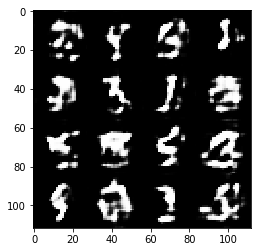

Timestamp 20170804-21-18-20.184 -  Epoch 1/2 -  Step 610 -  D Loss: 1.3562 - G Loss: 1.0428
Timestamp 20170804-21-18-27.682 -  Epoch 1/2 -  Step 620 -  D Loss: 1.1650 - G Loss: 1.4272
Timestamp 20170804-21-18-35.196 -  Epoch 1/2 -  Step 630 -  D Loss: 1.3472 - G Loss: 0.8334
Timestamp 20170804-21-18-42.492 -  Epoch 1/2 -  Step 640 -  D Loss: 1.4207 - G Loss: 1.2838
Timestamp 20170804-21-18-49.912 -  Epoch 1/2 -  Step 650 -  D Loss: 0.9405 - G Loss: 1.2631
Timestamp 20170804-21-18-57.378 -  Epoch 1/2 -  Step 660 -  D Loss: 1.6359 - G Loss: 1.0262
Timestamp 20170804-21-19-04.656 -  Epoch 1/2 -  Step 670 -  D Loss: 1.2349 - G Loss: 1.2818
Timestamp 20170804-21-19-12.106 -  Epoch 1/2 -  Step 680 -  D Loss: 0.9942 - G Loss: 0.9088
Timestamp 20170804-21-19-19.443 -  Epoch 1/2 -  Step 690 -  D Loss: 1.1374 - G Loss: 0.9283
Timestamp 20170804-21-19-26.683 -  Epoch 1/2 -  Step 700 -  D Loss: 1.2742 - G Loss: 0.7537


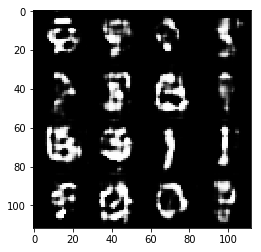

Timestamp 20170804-21-19-34.427 -  Epoch 1/2 -  Step 710 -  D Loss: 1.1175 - G Loss: 1.5348
Timestamp 20170804-21-19-41.779 -  Epoch 1/2 -  Step 720 -  D Loss: 1.0056 - G Loss: 1.1480
Timestamp 20170804-21-19-49.067 -  Epoch 1/2 -  Step 730 -  D Loss: 1.1868 - G Loss: 0.9969
Timestamp 20170804-21-19-56.343 -  Epoch 1/2 -  Step 740 -  D Loss: 1.1408 - G Loss: 1.2715
Timestamp 20170804-21-20-03.615 -  Epoch 1/2 -  Step 750 -  D Loss: 1.6668 - G Loss: 0.8998
Timestamp 20170804-21-20-10.847 -  Epoch 1/2 -  Step 760 -  D Loss: 0.8052 - G Loss: 1.6472
Timestamp 20170804-21-20-18.127 -  Epoch 1/2 -  Step 770 -  D Loss: 1.2868 - G Loss: 1.1307
Timestamp 20170804-21-20-25.446 -  Epoch 1/2 -  Step 780 -  D Loss: 1.0595 - G Loss: 1.1653
Timestamp 20170804-21-20-32.765 -  Epoch 1/2 -  Step 790 -  D Loss: 1.0975 - G Loss: 0.9312
Timestamp 20170804-21-20-40.038 -  Epoch 1/2 -  Step 800 -  D Loss: 1.5005 - G Loss: 1.4042


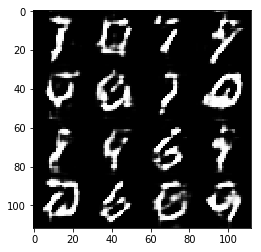

Timestamp 20170804-21-20-47.780 -  Epoch 1/2 -  Step 810 -  D Loss: 0.9559 - G Loss: 1.8653
Timestamp 20170804-21-20-55.059 -  Epoch 1/2 -  Step 820 -  D Loss: 1.2029 - G Loss: 1.4759
Timestamp 20170804-21-21-02.360 -  Epoch 1/2 -  Step 830 -  D Loss: 1.0955 - G Loss: 0.7958
Timestamp 20170804-21-21-09.598 -  Epoch 1/2 -  Step 840 -  D Loss: 1.1534 - G Loss: 1.3266
Timestamp 20170804-21-21-16.895 -  Epoch 1/2 -  Step 850 -  D Loss: 1.0415 - G Loss: 1.4231
Timestamp 20170804-21-21-24.148 -  Epoch 1/2 -  Step 860 -  D Loss: 1.2605 - G Loss: 1.5891
Timestamp 20170804-21-21-31.422 -  Epoch 1/2 -  Step 870 -  D Loss: 1.6062 - G Loss: 0.6422
Timestamp 20170804-21-21-38.742 -  Epoch 1/2 -  Step 880 -  D Loss: 1.2414 - G Loss: 0.5642
Timestamp 20170804-21-21-46.068 -  Epoch 1/2 -  Step 890 -  D Loss: 1.1221 - G Loss: 1.5313
Timestamp 20170804-21-21-53.456 -  Epoch 1/2 -  Step 900 -  D Loss: 1.6012 - G Loss: 1.3129


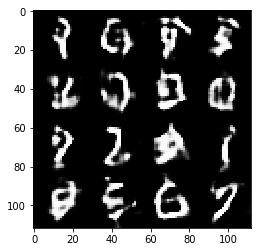

Timestamp 20170804-21-22-01.147 -  Epoch 1/2 -  Step 910 -  D Loss: 0.7774 - G Loss: 1.3766
Timestamp 20170804-21-22-08.628 -  Epoch 1/2 -  Step 920 -  D Loss: 1.1463 - G Loss: 1.6033
Timestamp 20170804-21-22-15.986 -  Epoch 1/2 -  Step 930 -  D Loss: 1.0977 - G Loss: 1.4849
Timestamp 20170804-21-22-23.251 -  Epoch 1/2 -  Step 940 -  D Loss: 1.5174 - G Loss: 1.2367
Timestamp 20170804-21-22-30.538 -  Epoch 1/2 -  Step 950 -  D Loss: 1.1289 - G Loss: 1.5025
Timestamp 20170804-21-22-37.825 -  Epoch 1/2 -  Step 960 -  D Loss: 1.4952 - G Loss: 0.4738
Timestamp 20170804-21-22-45.112 -  Epoch 1/2 -  Step 970 -  D Loss: 1.5106 - G Loss: 1.4347
Timestamp 20170804-21-22-52.385 -  Epoch 1/2 -  Step 980 -  D Loss: 1.0870 - G Loss: 1.1969
Timestamp 20170804-21-22-59.781 -  Epoch 1/2 -  Step 990 -  D Loss: 1.1998 - G Loss: 0.4854
Timestamp 20170804-21-23-07.125 -  Epoch 1/2 -  Step 1000 -  D Loss: 0.8865 - G Loss: 1.9131


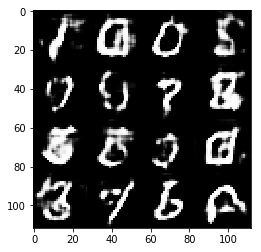

Timestamp 20170804-21-23-15.037 -  Epoch 1/2 -  Step 1010 -  D Loss: 1.2841 - G Loss: 0.4888
Timestamp 20170804-21-23-22.345 -  Epoch 1/2 -  Step 1020 -  D Loss: 1.2458 - G Loss: 0.7520
Timestamp 20170804-21-23-29.792 -  Epoch 1/2 -  Step 1030 -  D Loss: 1.2599 - G Loss: 0.4330
Timestamp 20170804-21-23-37.207 -  Epoch 1/2 -  Step 1040 -  D Loss: 1.0209 - G Loss: 1.5014
Timestamp 20170804-21-23-44.912 -  Epoch 1/2 -  Step 1050 -  D Loss: 1.1372 - G Loss: 1.9355
Timestamp 20170804-21-23-52.422 -  Epoch 1/2 -  Step 1060 -  D Loss: 0.8050 - G Loss: 1.4487
Timestamp 20170804-21-23-59.684 -  Epoch 1/2 -  Step 1070 -  D Loss: 0.9860 - G Loss: 1.0334
Timestamp 20170804-21-24-07.002 -  Epoch 1/2 -  Step 1080 -  D Loss: 1.0733 - G Loss: 1.2986
Timestamp 20170804-21-24-14.435 -  Epoch 1/2 -  Step 1090 -  D Loss: 1.1864 - G Loss: 1.4108
Timestamp 20170804-21-24-21.747 -  Epoch 1/2 -  Step 1100 -  D Loss: 1.0855 - G Loss: 0.9229


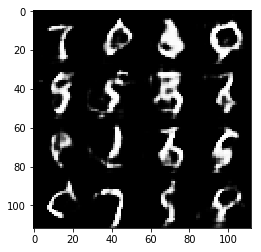

Timestamp 20170804-21-24-29.430 -  Epoch 1/2 -  Step 1110 -  D Loss: 1.3464 - G Loss: 1.2011
Timestamp 20170804-21-24-36.730 -  Epoch 1/2 -  Step 1120 -  D Loss: 0.8737 - G Loss: 1.2231
Timestamp 20170804-21-24-44.133 -  Epoch 1/2 -  Step 1130 -  D Loss: 0.9592 - G Loss: 1.7332
Timestamp 20170804-21-24-51.477 -  Epoch 1/2 -  Step 1140 -  D Loss: 1.3563 - G Loss: 0.9161
Timestamp 20170804-21-24-58.757 -  Epoch 1/2 -  Step 1150 -  D Loss: 0.9245 - G Loss: 0.9089
Timestamp 20170804-21-25-06.019 -  Epoch 1/2 -  Step 1160 -  D Loss: 1.6507 - G Loss: 0.7386
Timestamp 20170804-21-25-13.453 -  Epoch 1/2 -  Step 1170 -  D Loss: 1.3133 - G Loss: 0.9048
Timestamp 20170804-21-25-20.835 -  Epoch 1/2 -  Step 1180 -  D Loss: 1.0497 - G Loss: 0.8803
Timestamp 20170804-21-25-28.357 -  Epoch 1/2 -  Step 1190 -  D Loss: 0.9164 - G Loss: 1.3830
Timestamp 20170804-21-25-35.758 -  Epoch 1/2 -  Step 1200 -  D Loss: 1.2733 - G Loss: 0.9142


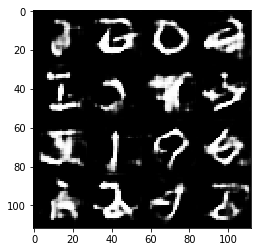

Timestamp 20170804-21-25-43.545 -  Epoch 1/2 -  Step 1210 -  D Loss: 0.9635 - G Loss: 0.9954
Timestamp 20170804-21-25-50.851 -  Epoch 1/2 -  Step 1220 -  D Loss: 1.2289 - G Loss: 0.8569
Timestamp 20170804-21-25-58.200 -  Epoch 1/2 -  Step 1230 -  D Loss: 0.9601 - G Loss: 1.1280
Timestamp 20170804-21-26-05.609 -  Epoch 1/2 -  Step 1240 -  D Loss: 1.4114 - G Loss: 0.8793
Timestamp 20170804-21-26-12.951 -  Epoch 1/2 -  Step 1250 -  D Loss: 1.0270 - G Loss: 1.2249
Timestamp 20170804-21-26-20.208 -  Epoch 1/2 -  Step 1260 -  D Loss: 0.9689 - G Loss: 1.8690
Timestamp 20170804-21-26-27.506 -  Epoch 1/2 -  Step 1270 -  D Loss: 0.8354 - G Loss: 1.1116
Timestamp 20170804-21-26-34.836 -  Epoch 1/2 -  Step 1280 -  D Loss: 1.0771 - G Loss: 0.9773
Timestamp 20170804-21-26-42.100 -  Epoch 1/2 -  Step 1290 -  D Loss: 1.3728 - G Loss: 1.0841
Timestamp 20170804-21-26-49.528 -  Epoch 1/2 -  Step 1300 -  D Loss: 1.3510 - G Loss: 1.3398


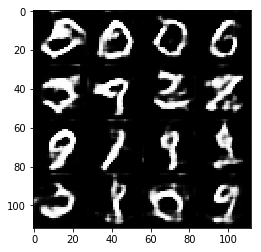

Timestamp 20170804-21-26-57.306 -  Epoch 1/2 -  Step 1310 -  D Loss: 1.6591 - G Loss: 0.9770
Timestamp 20170804-21-27-04.586 -  Epoch 1/2 -  Step 1320 -  D Loss: 1.2062 - G Loss: 1.2404
Timestamp 20170804-21-27-11.930 -  Epoch 1/2 -  Step 1330 -  D Loss: 1.2448 - G Loss: 1.1046
Timestamp 20170804-21-27-19.301 -  Epoch 1/2 -  Step 1340 -  D Loss: 1.0834 - G Loss: 1.2917
Timestamp 20170804-21-27-26.654 -  Epoch 1/2 -  Step 1350 -  D Loss: 1.0832 - G Loss: 0.7959
Timestamp 20170804-21-27-33.935 -  Epoch 1/2 -  Step 1360 -  D Loss: 1.3066 - G Loss: 0.9625
Timestamp 20170804-21-27-41.241 -  Epoch 1/2 -  Step 1370 -  D Loss: 1.1052 - G Loss: 0.8470
Timestamp 20170804-21-27-48.581 -  Epoch 1/2 -  Step 1380 -  D Loss: 1.0848 - G Loss: 1.0970
Timestamp 20170804-21-27-55.872 -  Epoch 1/2 -  Step 1390 -  D Loss: 1.4571 - G Loss: 1.1854
Timestamp 20170804-21-28-03.292 -  Epoch 1/2 -  Step 1400 -  D Loss: 1.0772 - G Loss: 0.9197


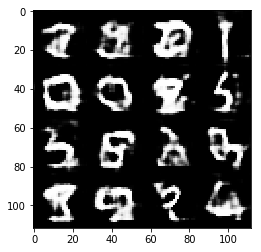

Timestamp 20170804-21-28-11.179 -  Epoch 1/2 -  Step 1410 -  D Loss: 1.4080 - G Loss: 0.7647
Timestamp 20170804-21-28-18.476 -  Epoch 1/2 -  Step 1420 -  D Loss: 1.1849 - G Loss: 1.3171
Timestamp 20170804-21-28-25.715 -  Epoch 1/2 -  Step 1430 -  D Loss: 1.2193 - G Loss: 1.0465
Timestamp 20170804-21-28-33.098 -  Epoch 1/2 -  Step 1440 -  D Loss: 1.1662 - G Loss: 0.8048
Timestamp 20170804-21-28-40.368 -  Epoch 1/2 -  Step 1450 -  D Loss: 1.0764 - G Loss: 0.9653
Timestamp 20170804-21-28-47.810 -  Epoch 1/2 -  Step 1460 -  D Loss: 1.1093 - G Loss: 1.1632
Timestamp 20170804-21-28-55.152 -  Epoch 1/2 -  Step 1470 -  D Loss: 1.1638 - G Loss: 1.0185
Timestamp 20170804-21-29-02.493 -  Epoch 1/2 -  Step 1480 -  D Loss: 1.3238 - G Loss: 0.9156
Timestamp 20170804-21-29-09.826 -  Epoch 1/2 -  Step 1490 -  D Loss: 1.0543 - G Loss: 1.6142
Timestamp 20170804-21-29-17.190 -  Epoch 1/2 -  Step 1500 -  D Loss: 1.4023 - G Loss: 0.8828


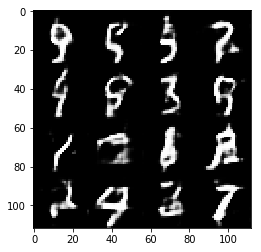

Timestamp 20170804-21-29-24.947 -  Epoch 1/2 -  Step 1510 -  D Loss: 1.1987 - G Loss: 0.7783
Timestamp 20170804-21-29-32.280 -  Epoch 1/2 -  Step 1520 -  D Loss: 1.5052 - G Loss: 0.7277
Timestamp 20170804-21-29-39.553 -  Epoch 1/2 -  Step 1530 -  D Loss: 0.9883 - G Loss: 1.0973
Timestamp 20170804-21-29-46.886 -  Epoch 1/2 -  Step 1540 -  D Loss: 1.3987 - G Loss: 0.8247
Timestamp 20170804-21-29-54.221 -  Epoch 1/2 -  Step 1550 -  D Loss: 1.2911 - G Loss: 0.8275
Timestamp 20170804-21-30-01.465 -  Epoch 1/2 -  Step 1560 -  D Loss: 1.0995 - G Loss: 0.5803
Timestamp 20170804-21-30-08.709 -  Epoch 1/2 -  Step 1570 -  D Loss: 1.2996 - G Loss: 1.4100
Timestamp 20170804-21-30-16.022 -  Epoch 1/2 -  Step 1580 -  D Loss: 1.4659 - G Loss: 0.9269
Timestamp 20170804-21-30-23.441 -  Epoch 1/2 -  Step 1590 -  D Loss: 1.0240 - G Loss: 0.9974
Timestamp 20170804-21-30-30.765 -  Epoch 1/2 -  Step 1600 -  D Loss: 1.3804 - G Loss: 0.7900


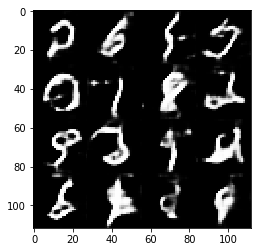

Timestamp 20170804-21-30-38.742 -  Epoch 1/2 -  Step 1610 -  D Loss: 0.9168 - G Loss: 1.5358
Timestamp 20170804-21-30-46.095 -  Epoch 1/2 -  Step 1620 -  D Loss: 0.9848 - G Loss: 1.2739
Timestamp 20170804-21-30-53.346 -  Epoch 1/2 -  Step 1630 -  D Loss: 1.1496 - G Loss: 1.1820
Timestamp 20170804-21-31-00.930 -  Epoch 1/2 -  Step 1640 -  D Loss: 1.3377 - G Loss: 1.0434
Timestamp 20170804-21-31-08.227 -  Epoch 1/2 -  Step 1650 -  D Loss: 0.7521 - G Loss: 1.4547
Timestamp 20170804-21-31-15.571 -  Epoch 1/2 -  Step 1660 -  D Loss: 0.9825 - G Loss: 1.3442
Timestamp 20170804-21-31-22.859 -  Epoch 1/2 -  Step 1670 -  D Loss: 0.8804 - G Loss: 0.9401
Timestamp 20170804-21-31-30.155 -  Epoch 1/2 -  Step 1680 -  D Loss: 0.9363 - G Loss: 1.5377
Timestamp 20170804-21-31-37.525 -  Epoch 1/2 -  Step 1690 -  D Loss: 1.0741 - G Loss: 1.1247
Timestamp 20170804-21-31-44.796 -  Epoch 1/2 -  Step 1700 -  D Loss: 1.0663 - G Loss: 1.1653


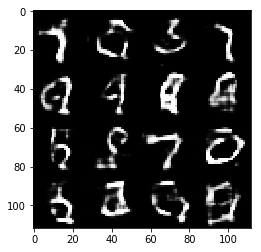

Timestamp 20170804-21-31-52.614 -  Epoch 1/2 -  Step 1710 -  D Loss: 0.8236 - G Loss: 1.5875
Timestamp 20170804-21-31-59.931 -  Epoch 1/2 -  Step 1720 -  D Loss: 0.7840 - G Loss: 1.7193
Timestamp 20170804-21-32-07.232 -  Epoch 1/2 -  Step 1730 -  D Loss: 0.7801 - G Loss: 1.0892
Timestamp 20170804-21-32-14.464 -  Epoch 1/2 -  Step 1740 -  D Loss: 1.5394 - G Loss: 1.1031
Timestamp 20170804-21-32-21.743 -  Epoch 1/2 -  Step 1750 -  D Loss: 0.9271 - G Loss: 1.0233
Timestamp 20170804-21-32-29.152 -  Epoch 1/2 -  Step 1760 -  D Loss: 1.1799 - G Loss: 1.1652
Timestamp 20170804-21-32-36.445 -  Epoch 1/2 -  Step 1770 -  D Loss: 1.1936 - G Loss: 0.9290
Timestamp 20170804-21-32-43.706 -  Epoch 1/2 -  Step 1780 -  D Loss: 0.9936 - G Loss: 1.6096
Timestamp 20170804-21-32-50.973 -  Epoch 1/2 -  Step 1790 -  D Loss: 1.5165 - G Loss: 0.6817
Timestamp 20170804-21-32-58.269 -  Epoch 1/2 -  Step 1800 -  D Loss: 1.3101 - G Loss: 0.7074


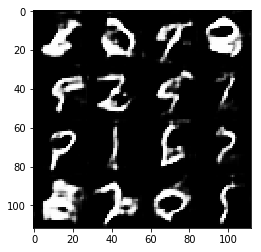

Timestamp 20170804-21-33-05.984 -  Epoch 1/2 -  Step 1810 -  D Loss: 0.9661 - G Loss: 1.6722
Timestamp 20170804-21-33-13.240 -  Epoch 1/2 -  Step 1820 -  D Loss: 1.0571 - G Loss: 1.3446
Timestamp 20170804-21-33-20.676 -  Epoch 1/2 -  Step 1830 -  D Loss: 1.0861 - G Loss: 1.3526
Timestamp 20170804-21-33-28.048 -  Epoch 1/2 -  Step 1840 -  D Loss: 0.9921 - G Loss: 1.2062
Timestamp 20170804-21-33-35.399 -  Epoch 1/2 -  Step 1850 -  D Loss: 1.2946 - G Loss: 1.4043
Timestamp 20170804-21-33-42.718 -  Epoch 1/2 -  Step 1860 -  D Loss: 1.5158 - G Loss: 1.1649
Timestamp 20170804-21-33-49.981 -  Epoch 1/2 -  Step 1870 -  D Loss: 1.0870 - G Loss: 1.0841
Timestamp 20170804-21-33-57.246 -  Epoch 1/2 -  Step 1880 -  D Loss: 1.3569 - G Loss: 1.3046
Timestamp 20170804-21-34-04.713 -  Epoch 1/2 -  Step 1890 -  D Loss: 1.6101 - G Loss: 0.9609
Timestamp 20170804-21-34-12.037 -  Epoch 1/2 -  Step 1900 -  D Loss: 0.7568 - G Loss: 1.1893


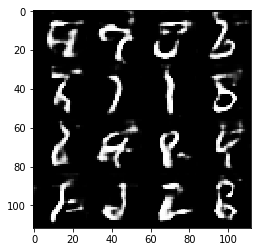

Timestamp 20170804-21-34-19.718 -  Epoch 1/2 -  Step 1910 -  D Loss: 0.7760 - G Loss: 1.5569
Timestamp 20170804-21-34-27.001 -  Epoch 1/2 -  Step 1920 -  D Loss: 1.1840 - G Loss: 1.4005
Timestamp 20170804-21-34-34.330 -  Epoch 1/2 -  Step 1930 -  D Loss: 1.3876 - G Loss: 1.0304
Timestamp 20170804-21-34-41.560 -  Epoch 1/2 -  Step 1940 -  D Loss: 1.3050 - G Loss: 1.4770
Timestamp 20170804-21-34-48.822 -  Epoch 1/2 -  Step 1950 -  D Loss: 1.0901 - G Loss: 1.1532
Timestamp 20170804-21-34-56.158 -  Epoch 1/2 -  Step 1960 -  D Loss: 1.5907 - G Loss: 0.7062
Timestamp 20170804-21-35-03.393 -  Epoch 1/2 -  Step 1970 -  D Loss: 0.8700 - G Loss: 1.3562
Timestamp 20170804-21-35-10.731 -  Epoch 1/2 -  Step 1980 -  D Loss: 0.9850 - G Loss: 0.8081
Timestamp 20170804-21-35-18.051 -  Epoch 1/2 -  Step 1990 -  D Loss: 1.0077 - G Loss: 1.2177
Timestamp 20170804-21-35-25.323 -  Epoch 1/2 -  Step 2000 -  D Loss: 1.4919 - G Loss: 1.5147


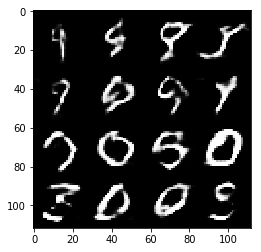

Timestamp 20170804-21-35-33.232 -  Epoch 1/2 -  Step 2010 -  D Loss: 1.2339 - G Loss: 0.8111
Timestamp 20170804-21-35-40.648 -  Epoch 1/2 -  Step 2020 -  D Loss: 1.0807 - G Loss: 1.5483
Timestamp 20170804-21-35-48.000 -  Epoch 1/2 -  Step 2030 -  D Loss: 1.4153 - G Loss: 1.3508
Timestamp 20170804-21-35-55.288 -  Epoch 1/2 -  Step 2040 -  D Loss: 1.0322 - G Loss: 0.9340
Timestamp 20170804-21-36-02.719 -  Epoch 1/2 -  Step 2050 -  D Loss: 1.2925 - G Loss: 0.9592
Timestamp 20170804-21-36-10.180 -  Epoch 1/2 -  Step 2060 -  D Loss: 1.1052 - G Loss: 1.3185
Timestamp 20170804-21-36-17.498 -  Epoch 1/2 -  Step 2070 -  D Loss: 1.0944 - G Loss: 0.9351
Timestamp 20170804-21-36-24.861 -  Epoch 1/2 -  Step 2080 -  D Loss: 1.5554 - G Loss: 1.0365
Timestamp 20170804-21-36-32.204 -  Epoch 1/2 -  Step 2090 -  D Loss: 1.1740 - G Loss: 1.7780
Timestamp 20170804-21-36-39.547 -  Epoch 1/2 -  Step 2100 -  D Loss: 1.2511 - G Loss: 1.4442


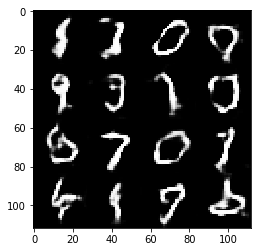

Timestamp 20170804-21-36-47.380 -  Epoch 1/2 -  Step 2110 -  D Loss: 1.1302 - G Loss: 1.0736
Timestamp 20170804-21-36-54.685 -  Epoch 1/2 -  Step 2120 -  D Loss: 0.9815 - G Loss: 1.3831
Timestamp 20170804-21-37-02.015 -  Epoch 1/2 -  Step 2130 -  D Loss: 0.9140 - G Loss: 1.3657
Timestamp 20170804-21-37-09.328 -  Epoch 1/2 -  Step 2140 -  D Loss: 1.1700 - G Loss: 1.4691
Timestamp 20170804-21-37-16.604 -  Epoch 1/2 -  Step 2150 -  D Loss: 0.9786 - G Loss: 0.6762
Timestamp 20170804-21-37-23.874 -  Epoch 1/2 -  Step 2160 -  D Loss: 1.2569 - G Loss: 0.8782
Timestamp 20170804-21-37-31.231 -  Epoch 1/2 -  Step 2170 -  D Loss: 0.9071 - G Loss: 1.3059
Timestamp 20170804-21-37-38.491 -  Epoch 1/2 -  Step 2180 -  D Loss: 1.5079 - G Loss: 0.8298
Timestamp 20170804-21-37-45.822 -  Epoch 1/2 -  Step 2190 -  D Loss: 1.3144 - G Loss: 1.2721
Timestamp 20170804-21-37-53.196 -  Epoch 1/2 -  Step 2200 -  D Loss: 1.0766 - G Loss: 1.3554


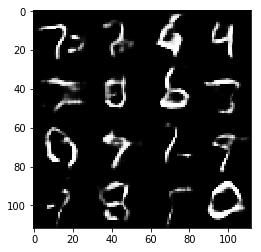

Timestamp 20170804-21-38-00.903 -  Epoch 1/2 -  Step 2210 -  D Loss: 1.1955 - G Loss: 1.1152
Timestamp 20170804-21-38-08.270 -  Epoch 1/2 -  Step 2220 -  D Loss: 0.8954 - G Loss: 1.2802
Timestamp 20170804-21-38-15.693 -  Epoch 1/2 -  Step 2230 -  D Loss: 1.2637 - G Loss: 1.4865
Timestamp 20170804-21-38-23.039 -  Epoch 1/2 -  Step 2240 -  D Loss: 0.9488 - G Loss: 1.2069
Timestamp 20170804-21-38-30.311 -  Epoch 1/2 -  Step 2250 -  D Loss: 1.4485 - G Loss: 0.7238
Timestamp 20170804-21-38-37.594 -  Epoch 1/2 -  Step 2260 -  D Loss: 0.9952 - G Loss: 1.4521
Timestamp 20170804-21-38-44.873 -  Epoch 1/2 -  Step 2270 -  D Loss: 1.0571 - G Loss: 1.0759
Timestamp 20170804-21-38-52.166 -  Epoch 1/2 -  Step 2280 -  D Loss: 1.0001 - G Loss: 1.2322
Timestamp 20170804-21-38-59.469 -  Epoch 1/2 -  Step 2290 -  D Loss: 1.1863 - G Loss: 1.1680
Timestamp 20170804-21-39-06.732 -  Epoch 1/2 -  Step 2300 -  D Loss: 1.0722 - G Loss: 1.0167


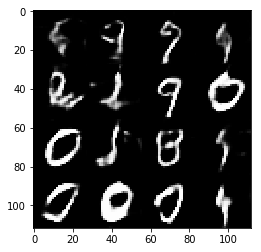

Timestamp 20170804-21-39-14.575 -  Epoch 1/2 -  Step 2310 -  D Loss: 1.1981 - G Loss: 1.0861
Timestamp 20170804-21-39-21.835 -  Epoch 1/2 -  Step 2320 -  D Loss: 1.0257 - G Loss: 1.2282
Timestamp 20170804-21-39-29.196 -  Epoch 1/2 -  Step 2330 -  D Loss: 1.1772 - G Loss: 0.8134
Timestamp 20170804-21-39-36.695 -  Epoch 1/2 -  Step 2340 -  D Loss: 0.8342 - G Loss: 1.4262
Timestamp 20170804-21-39-44.771 -  Epoch 1/2 -  Step 2350 -  D Loss: 1.1398 - G Loss: 1.5453
Timestamp 20170804-21-39-53.262 -  Epoch 1/2 -  Step 2360 -  D Loss: 1.0158 - G Loss: 0.9433
Timestamp 20170804-21-40-00.592 -  Epoch 1/2 -  Step 2370 -  D Loss: 1.1844 - G Loss: 0.8708
Timestamp 20170804-21-40-08.002 -  Epoch 1/2 -  Step 2380 -  D Loss: 1.5963 - G Loss: 0.9557
Timestamp 20170804-21-40-15.349 -  Epoch 1/2 -  Step 2390 -  D Loss: 1.2817 - G Loss: 1.2830
Timestamp 20170804-21-40-22.681 -  Epoch 1/2 -  Step 2400 -  D Loss: 1.0488 - G Loss: 1.2342


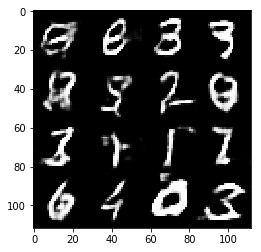

Timestamp 20170804-21-40-30.618 -  Epoch 1/2 -  Step 2410 -  D Loss: 1.0261 - G Loss: 1.3447
Timestamp 20170804-21-40-37.959 -  Epoch 1/2 -  Step 2420 -  D Loss: 1.1361 - G Loss: 0.7335
Timestamp 20170804-21-40-45.250 -  Epoch 1/2 -  Step 2430 -  D Loss: 1.0212 - G Loss: 1.3598
Timestamp 20170804-21-40-52.509 -  Epoch 1/2 -  Step 2440 -  D Loss: 1.4434 - G Loss: 0.8620
Timestamp 20170804-21-40-59.781 -  Epoch 1/2 -  Step 2450 -  D Loss: 1.2252 - G Loss: 0.8269
Timestamp 20170804-21-41-07.075 -  Epoch 1/2 -  Step 2460 -  D Loss: 0.9148 - G Loss: 1.0877
Timestamp 20170804-21-41-14.381 -  Epoch 1/2 -  Step 2470 -  D Loss: 1.1649 - G Loss: 0.7297
Timestamp 20170804-21-41-21.714 -  Epoch 1/2 -  Step 2480 -  D Loss: 0.9707 - G Loss: 1.6769
Timestamp 20170804-21-41-29.024 -  Epoch 1/2 -  Step 2490 -  D Loss: 1.3185 - G Loss: 1.0818
Timestamp 20170804-21-41-36.310 -  Epoch 1/2 -  Step 2500 -  D Loss: 1.3213 - G Loss: 0.6923


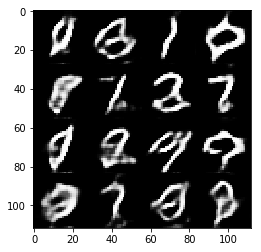

Timestamp 20170804-21-41-44.379 -  Epoch 1/2 -  Step 2510 -  D Loss: 0.8655 - G Loss: 1.5219
Timestamp 20170804-21-41-51.674 -  Epoch 1/2 -  Step 2520 -  D Loss: 1.2464 - G Loss: 0.5494
Timestamp 20170804-21-41-59.060 -  Epoch 1/2 -  Step 2530 -  D Loss: 0.9612 - G Loss: 1.6203
Timestamp 20170804-21-42-06.368 -  Epoch 1/2 -  Step 2540 -  D Loss: 1.0659 - G Loss: 1.6512
Timestamp 20170804-21-42-13.775 -  Epoch 1/2 -  Step 2550 -  D Loss: 1.0879 - G Loss: 1.3930
Timestamp 20170804-21-42-21.105 -  Epoch 1/2 -  Step 2560 -  D Loss: 0.9943 - G Loss: 0.9236
Timestamp 20170804-21-42-28.490 -  Epoch 1/2 -  Step 2570 -  D Loss: 1.1452 - G Loss: 1.3945
Timestamp 20170804-21-42-35.874 -  Epoch 1/2 -  Step 2580 -  D Loss: 0.9501 - G Loss: 1.5713
Timestamp 20170804-21-42-43.383 -  Epoch 1/2 -  Step 2590 -  D Loss: 1.0208 - G Loss: 1.1176
Timestamp 20170804-21-42-50.797 -  Epoch 1/2 -  Step 2600 -  D Loss: 0.8766 - G Loss: 1.0504


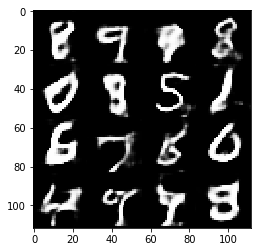

Timestamp 20170804-21-42-58.723 -  Epoch 1/2 -  Step 2610 -  D Loss: 1.0141 - G Loss: 1.1510
Timestamp 20170804-21-43-06.044 -  Epoch 1/2 -  Step 2620 -  D Loss: 1.1241 - G Loss: 0.7573
Timestamp 20170804-21-43-13.375 -  Epoch 1/2 -  Step 2630 -  D Loss: 1.1806 - G Loss: 1.2570
Timestamp 20170804-21-43-20.674 -  Epoch 1/2 -  Step 2640 -  D Loss: 0.8547 - G Loss: 1.1863
Timestamp 20170804-21-43-28.001 -  Epoch 1/2 -  Step 2650 -  D Loss: 1.2089 - G Loss: 0.8925
Timestamp 20170804-21-43-35.294 -  Epoch 1/2 -  Step 2660 -  D Loss: 1.0082 - G Loss: 1.3757
Timestamp 20170804-21-43-42.586 -  Epoch 1/2 -  Step 2670 -  D Loss: 1.1240 - G Loss: 1.2719
Timestamp 20170804-21-43-49.884 -  Epoch 1/2 -  Step 2680 -  D Loss: 1.4030 - G Loss: 1.1414
Timestamp 20170804-21-43-57.237 -  Epoch 1/2 -  Step 2690 -  D Loss: 0.9829 - G Loss: 0.7904
Timestamp 20170804-21-44-04.531 -  Epoch 1/2 -  Step 2700 -  D Loss: 1.1531 - G Loss: 0.9790


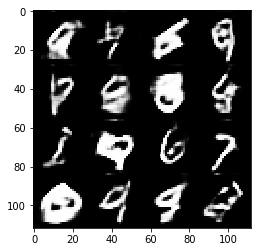

Timestamp 20170804-21-44-12.255 -  Epoch 1/2 -  Step 2710 -  D Loss: 1.0311 - G Loss: 1.2761
Timestamp 20170804-21-44-19.658 -  Epoch 1/2 -  Step 2720 -  D Loss: 0.8305 - G Loss: 1.6405
Timestamp 20170804-21-44-26.907 -  Epoch 1/2 -  Step 2730 -  D Loss: 1.2667 - G Loss: 1.6387
Timestamp 20170804-21-44-34.194 -  Epoch 1/2 -  Step 2740 -  D Loss: 1.2207 - G Loss: 0.8239
Timestamp 20170804-21-44-41.454 -  Epoch 1/2 -  Step 2750 -  D Loss: 1.0407 - G Loss: 1.0808
Timestamp 20170804-21-44-48.731 -  Epoch 1/2 -  Step 2760 -  D Loss: 0.8051 - G Loss: 1.5716
Timestamp 20170804-21-44-56.002 -  Epoch 1/2 -  Step 2770 -  D Loss: 0.9988 - G Loss: 1.6095
Timestamp 20170804-21-45-03.332 -  Epoch 1/2 -  Step 2780 -  D Loss: 0.7321 - G Loss: 1.1619
Timestamp 20170804-21-45-10.612 -  Epoch 1/2 -  Step 2790 -  D Loss: 0.8805 - G Loss: 1.9470
Timestamp 20170804-21-45-17.877 -  Epoch 1/2 -  Step 2800 -  D Loss: 0.8319 - G Loss: 1.4314


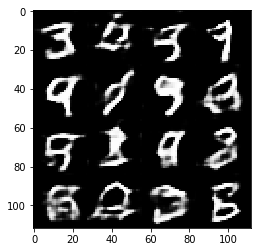

Timestamp 20170804-21-45-25.738 -  Epoch 1/2 -  Step 2810 -  D Loss: 0.7740 - G Loss: 0.8328
Timestamp 20170804-21-45-33.023 -  Epoch 1/2 -  Step 2820 -  D Loss: 0.9369 - G Loss: 1.2234
Timestamp 20170804-21-45-40.300 -  Epoch 1/2 -  Step 2830 -  D Loss: 1.0069 - G Loss: 1.7777
Timestamp 20170804-21-45-47.667 -  Epoch 1/2 -  Step 2840 -  D Loss: 1.0846 - G Loss: 0.8198
Timestamp 20170804-21-45-54.972 -  Epoch 1/2 -  Step 2850 -  D Loss: 1.3061 - G Loss: 0.8814
Timestamp 20170804-21-46-02.262 -  Epoch 1/2 -  Step 2860 -  D Loss: 1.1830 - G Loss: 1.4498
Timestamp 20170804-21-46-09.535 -  Epoch 1/2 -  Step 2870 -  D Loss: 0.8591 - G Loss: 1.1807
Timestamp 20170804-21-46-16.808 -  Epoch 1/2 -  Step 2880 -  D Loss: 1.1396 - G Loss: 1.4418
Timestamp 20170804-21-46-24.052 -  Epoch 1/2 -  Step 2890 -  D Loss: 1.3927 - G Loss: 0.6526
Timestamp 20170804-21-46-31.321 -  Epoch 1/2 -  Step 2900 -  D Loss: 1.5785 - G Loss: 1.0038


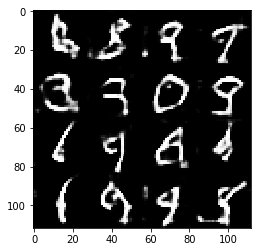

Timestamp 20170804-21-46-39.088 -  Epoch 1/2 -  Step 2910 -  D Loss: 1.1279 - G Loss: 1.3266
Timestamp 20170804-21-46-46.429 -  Epoch 1/2 -  Step 2920 -  D Loss: 1.2789 - G Loss: 1.2631
Timestamp 20170804-21-46-53.690 -  Epoch 1/2 -  Step 2930 -  D Loss: 1.1750 - G Loss: 1.0552
Timestamp 20170804-21-47-00.938 -  Epoch 1/2 -  Step 2940 -  D Loss: 0.9358 - G Loss: 0.8619
Timestamp 20170804-21-47-08.236 -  Epoch 1/2 -  Step 2950 -  D Loss: 1.0787 - G Loss: 1.2648
Timestamp 20170804-21-47-15.494 -  Epoch 1/2 -  Step 2960 -  D Loss: 1.1933 - G Loss: 0.9589
Timestamp 20170804-21-47-22.834 -  Epoch 1/2 -  Step 2970 -  D Loss: 1.2152 - G Loss: 1.0120
Timestamp 20170804-21-47-30.119 -  Epoch 1/2 -  Step 2980 -  D Loss: 1.0106 - G Loss: 1.8588
Timestamp 20170804-21-47-37.372 -  Epoch 1/2 -  Step 2990 -  D Loss: 1.3222 - G Loss: 1.6465
Timestamp 20170804-21-47-44.655 -  Epoch 1/2 -  Step 3000 -  D Loss: 1.2472 - G Loss: 0.6644


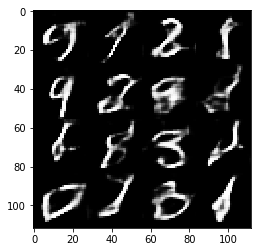

Timestamp 20170804-21-47-52.585 -  Epoch 1/2 -  Step 3010 -  D Loss: 1.0330 - G Loss: 1.1179
Timestamp 20170804-21-47-59.859 -  Epoch 1/2 -  Step 3020 -  D Loss: 1.0887 - G Loss: 0.6343
Timestamp 20170804-21-48-07.121 -  Epoch 1/2 -  Step 3030 -  D Loss: 1.2539 - G Loss: 1.4257
Timestamp 20170804-21-48-14.407 -  Epoch 1/2 -  Step 3040 -  D Loss: 0.9773 - G Loss: 1.0956
Timestamp 20170804-21-48-21.674 -  Epoch 1/2 -  Step 3050 -  D Loss: 1.1225 - G Loss: 0.7891
Timestamp 20170804-21-48-28.929 -  Epoch 1/2 -  Step 3060 -  D Loss: 1.3283 - G Loss: 0.5811
Timestamp 20170804-21-48-36.296 -  Epoch 1/2 -  Step 3070 -  D Loss: 1.0712 - G Loss: 1.1742
Timestamp 20170804-21-48-43.709 -  Epoch 1/2 -  Step 3080 -  D Loss: 0.9853 - G Loss: 1.2125
Timestamp 20170804-21-48-50.979 -  Epoch 1/2 -  Step 3090 -  D Loss: 0.7461 - G Loss: 1.5810
Timestamp 20170804-21-48-58.297 -  Epoch 1/2 -  Step 3100 -  D Loss: 1.2722 - G Loss: 1.3155


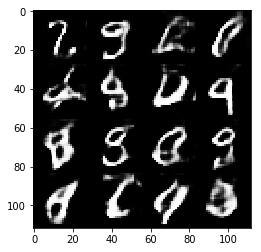

Timestamp 20170804-21-49-06.109 -  Epoch 1/2 -  Step 3110 -  D Loss: 0.8759 - G Loss: 0.8518
Timestamp 20170804-21-49-13.404 -  Epoch 1/2 -  Step 3120 -  D Loss: 1.4578 - G Loss: 1.2880
Timestamp 20170804-21-49-20.709 -  Epoch 1/2 -  Step 3130 -  D Loss: 1.2368 - G Loss: 0.8039
Timestamp 20170804-21-49-28.013 -  Epoch 1/2 -  Step 3140 -  D Loss: 1.1031 - G Loss: 1.1818
Timestamp 20170804-21-49-35.271 -  Epoch 1/2 -  Step 3150 -  D Loss: 0.8532 - G Loss: 1.5669
Timestamp 20170804-21-49-42.599 -  Epoch 1/2 -  Step 3160 -  D Loss: 0.9788 - G Loss: 0.8916
Timestamp 20170804-21-49-49.911 -  Epoch 1/2 -  Step 3170 -  D Loss: 1.1041 - G Loss: 1.2814
Timestamp 20170804-21-49-57.239 -  Epoch 1/2 -  Step 3180 -  D Loss: 1.1785 - G Loss: 1.4092
Timestamp 20170804-21-50-04.510 -  Epoch 1/2 -  Step 3190 -  D Loss: 1.3476 - G Loss: 0.5775
Timestamp 20170804-21-50-11.777 -  Epoch 1/2 -  Step 3200 -  D Loss: 1.4182 - G Loss: 0.8110


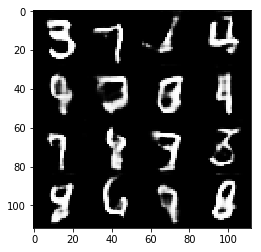

Timestamp 20170804-21-50-19.652 -  Epoch 1/2 -  Step 3210 -  D Loss: 0.9892 - G Loss: 1.4206
Timestamp 20170804-21-50-26.938 -  Epoch 1/2 -  Step 3220 -  D Loss: 1.2393 - G Loss: 1.1690
Timestamp 20170804-21-50-34.318 -  Epoch 1/2 -  Step 3230 -  D Loss: 1.6427 - G Loss: 1.5841
Timestamp 20170804-21-50-41.610 -  Epoch 1/2 -  Step 3240 -  D Loss: 0.7195 - G Loss: 1.1460
Timestamp 20170804-21-50-48.902 -  Epoch 1/2 -  Step 3250 -  D Loss: 0.8411 - G Loss: 1.6541
Timestamp 20170804-21-50-56.149 -  Epoch 1/2 -  Step 3260 -  D Loss: 1.6991 - G Loss: 0.7679
Timestamp 20170804-21-51-03.411 -  Epoch 1/2 -  Step 3270 -  D Loss: 0.9383 - G Loss: 0.9461
Timestamp 20170804-21-51-10.703 -  Epoch 1/2 -  Step 3280 -  D Loss: 1.0047 - G Loss: 1.5053
Timestamp 20170804-21-51-18.015 -  Epoch 1/2 -  Step 3290 -  D Loss: 1.1343 - G Loss: 1.2602
Timestamp 20170804-21-51-25.295 -  Epoch 1/2 -  Step 3300 -  D Loss: 0.9429 - G Loss: 1.1797


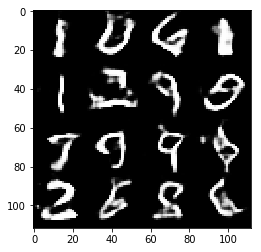

Timestamp 20170804-21-51-33.157 -  Epoch 1/2 -  Step 3310 -  D Loss: 1.3418 - G Loss: 0.9953
Timestamp 20170804-21-51-40.398 -  Epoch 1/2 -  Step 3320 -  D Loss: 0.9822 - G Loss: 1.0184
Timestamp 20170804-21-51-47.635 -  Epoch 1/2 -  Step 3330 -  D Loss: 0.8881 - G Loss: 0.9939
Timestamp 20170804-21-51-54.907 -  Epoch 1/2 -  Step 3340 -  D Loss: 1.1781 - G Loss: 1.7189
Timestamp 20170804-21-52-02.163 -  Epoch 1/2 -  Step 3350 -  D Loss: 1.0194 - G Loss: 1.1310
Timestamp 20170804-21-52-09.449 -  Epoch 1/2 -  Step 3360 -  D Loss: 0.9396 - G Loss: 0.8625
Timestamp 20170804-21-52-16.736 -  Epoch 1/2 -  Step 3370 -  D Loss: 0.8461 - G Loss: 1.1654
Timestamp 20170804-21-52-23.987 -  Epoch 1/2 -  Step 3380 -  D Loss: 1.2330 - G Loss: 0.9523
Timestamp 20170804-21-52-31.265 -  Epoch 1/2 -  Step 3390 -  D Loss: 1.1021 - G Loss: 1.0431
Timestamp 20170804-21-52-38.536 -  Epoch 1/2 -  Step 3400 -  D Loss: 1.0237 - G Loss: 1.4343


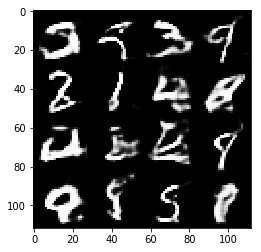

Timestamp 20170804-21-52-46.423 -  Epoch 1/2 -  Step 3410 -  D Loss: 1.2018 - G Loss: 1.0715
Timestamp 20170804-21-52-53.830 -  Epoch 1/2 -  Step 3420 -  D Loss: 1.1784 - G Loss: 1.0956
Timestamp 20170804-21-53-01.113 -  Epoch 1/2 -  Step 3430 -  D Loss: 0.6779 - G Loss: 1.5198
Timestamp 20170804-21-53-08.351 -  Epoch 1/2 -  Step 3440 -  D Loss: 1.1079 - G Loss: 1.3606
Timestamp 20170804-21-53-15.717 -  Epoch 1/2 -  Step 3450 -  D Loss: 1.1739 - G Loss: 1.0483
Timestamp 20170804-21-53-23.008 -  Epoch 1/2 -  Step 3460 -  D Loss: 1.1003 - G Loss: 1.3839
Timestamp 20170804-21-53-30.272 -  Epoch 1/2 -  Step 3470 -  D Loss: 0.9012 - G Loss: 1.2787
Timestamp 20170804-21-53-37.533 -  Epoch 1/2 -  Step 3480 -  D Loss: 1.1923 - G Loss: 1.0871
Timestamp 20170804-21-53-44.805 -  Epoch 1/2 -  Step 3490 -  D Loss: 1.0850 - G Loss: 1.0638
Timestamp 20170804-21-53-52.049 -  Epoch 1/2 -  Step 3500 -  D Loss: 0.8825 - G Loss: 1.8352


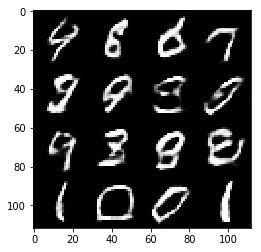

Timestamp 20170804-21-53-59.875 -  Epoch 1/2 -  Step 3510 -  D Loss: 1.0664 - G Loss: 1.3103
Timestamp 20170804-21-54-07.169 -  Epoch 1/2 -  Step 3520 -  D Loss: 0.8712 - G Loss: 1.2186
Timestamp 20170804-21-54-14.431 -  Epoch 1/2 -  Step 3530 -  D Loss: 1.1859 - G Loss: 0.7953
Timestamp 20170804-21-54-21.797 -  Epoch 1/2 -  Step 3540 -  D Loss: 0.7703 - G Loss: 1.0993
Timestamp 20170804-21-54-29.099 -  Epoch 1/2 -  Step 3550 -  D Loss: 0.8187 - G Loss: 1.5973
Timestamp 20170804-21-54-36.389 -  Epoch 1/2 -  Step 3560 -  D Loss: 0.9357 - G Loss: 1.4275
Timestamp 20170804-21-54-43.638 -  Epoch 1/2 -  Step 3570 -  D Loss: 0.8301 - G Loss: 1.4074
Timestamp 20170804-21-54-50.951 -  Epoch 1/2 -  Step 3580 -  D Loss: 0.6690 - G Loss: 1.9062
Timestamp 20170804-21-54-58.210 -  Epoch 1/2 -  Step 3590 -  D Loss: 1.0704 - G Loss: 0.8338
Timestamp 20170804-21-55-05.529 -  Epoch 1/2 -  Step 3600 -  D Loss: 0.8398 - G Loss: 0.9484


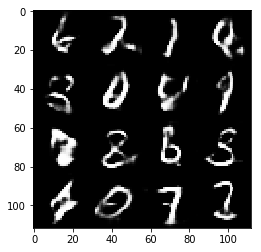

Timestamp 20170804-21-55-13.357 -  Epoch 1/2 -  Step 3610 -  D Loss: 0.9609 - G Loss: 1.7357
Timestamp 20170804-21-55-20.608 -  Epoch 1/2 -  Step 3620 -  D Loss: 1.0135 - G Loss: 1.6170
Timestamp 20170804-21-55-27.891 -  Epoch 1/2 -  Step 3630 -  D Loss: 0.6350 - G Loss: 1.6130
Timestamp 20170804-21-55-35.208 -  Epoch 1/2 -  Step 3640 -  D Loss: 0.8747 - G Loss: 1.2578
Timestamp 20170804-21-55-42.522 -  Epoch 1/2 -  Step 3650 -  D Loss: 1.0583 - G Loss: 0.7144
Timestamp 20170804-21-55-49.769 -  Epoch 1/2 -  Step 3660 -  D Loss: 1.0718 - G Loss: 1.1737
Timestamp 20170804-21-55-57.022 -  Epoch 1/2 -  Step 3670 -  D Loss: 1.5723 - G Loss: 0.8979
Timestamp 20170804-21-56-04.311 -  Epoch 1/2 -  Step 3680 -  D Loss: 1.2746 - G Loss: 1.1903
Timestamp 20170804-21-56-11.613 -  Epoch 1/2 -  Step 3690 -  D Loss: 1.2609 - G Loss: 0.6145
Timestamp 20170804-21-56-18.873 -  Epoch 1/2 -  Step 3700 -  D Loss: 0.8079 - G Loss: 1.2210


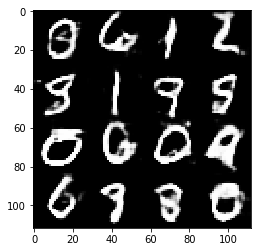

Timestamp 20170804-21-56-26.710 -  Epoch 1/2 -  Step 3710 -  D Loss: 1.2219 - G Loss: 1.0610
Timestamp 20170804-21-56-34.019 -  Epoch 1/2 -  Step 3720 -  D Loss: 0.8035 - G Loss: 1.9523
Timestamp 20170804-21-56-41.273 -  Epoch 1/2 -  Step 3730 -  D Loss: 1.1378 - G Loss: 1.0794
Timestamp 20170804-21-56-48.559 -  Epoch 1/2 -  Step 3740 -  D Loss: 0.9313 - G Loss: 1.4643
Timestamp 20170804-21-56-55.818 -  Epoch 1/2 -  Step 3750 -  D Loss: 0.7587 - G Loss: 1.5427
Timestamp 20170804-21-57-03.079 -  Epoch 1/2 -  Step 3760 -  D Loss: 1.0759 - G Loss: 1.4291
Timestamp 20170804-21-57-10.339 -  Epoch 1/2 -  Step 3770 -  D Loss: 0.9299 - G Loss: 2.1113
Timestamp 20170804-21-57-17.612 -  Epoch 1/2 -  Step 3780 -  D Loss: 0.8226 - G Loss: 0.8830
Timestamp 20170804-21-57-24.879 -  Epoch 1/2 -  Step 3790 -  D Loss: 0.8522 - G Loss: 1.4488
Timestamp 20170804-21-57-32.149 -  Epoch 1/2 -  Step 3800 -  D Loss: 0.9766 - G Loss: 1.0478


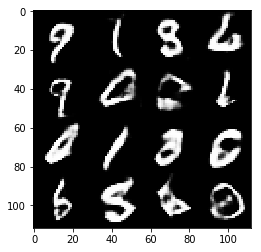

Timestamp 20170804-21-57-40.170 -  Epoch 1/2 -  Step 3810 -  D Loss: 1.1820 - G Loss: 0.6862
Timestamp 20170804-21-57-47.509 -  Epoch 1/2 -  Step 3820 -  D Loss: 0.9626 - G Loss: 1.7323
Timestamp 20170804-21-57-54.894 -  Epoch 1/2 -  Step 3830 -  D Loss: 0.8108 - G Loss: 1.8297
Timestamp 20170804-21-58-02.294 -  Epoch 1/2 -  Step 3840 -  D Loss: 1.0365 - G Loss: 0.7503
Timestamp 20170804-21-58-10.086 -  Epoch 1/2 -  Step 3850 -  D Loss: 1.0882 - G Loss: 1.5181
Timestamp 20170804-21-58-17.652 -  Epoch 1/2 -  Step 3860 -  D Loss: 1.0497 - G Loss: 1.3778
Timestamp 20170804-21-58-25.076 -  Epoch 1/2 -  Step 3870 -  D Loss: 1.2671 - G Loss: 0.8465
Timestamp 20170804-21-58-32.389 -  Epoch 1/2 -  Step 3880 -  D Loss: 1.3698 - G Loss: 0.6524
Timestamp 20170804-21-58-39.730 -  Epoch 1/2 -  Step 3890 -  D Loss: 0.8587 - G Loss: 1.2731
Timestamp 20170804-21-58-47.131 -  Epoch 1/2 -  Step 3900 -  D Loss: 1.4558 - G Loss: 1.5959


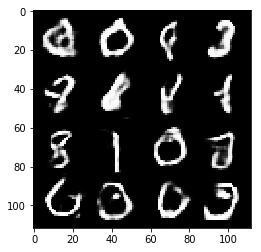

Timestamp 20170804-21-58-55.186 -  Epoch 1/2 -  Step 3910 -  D Loss: 1.1462 - G Loss: 1.3881
Timestamp 20170804-21-59-02.610 -  Epoch 1/2 -  Step 3920 -  D Loss: 0.9817 - G Loss: 2.2209
Timestamp 20170804-21-59-10.032 -  Epoch 1/2 -  Step 3930 -  D Loss: 0.8371 - G Loss: 1.8456
Timestamp 20170804-21-59-17.464 -  Epoch 1/2 -  Step 3940 -  D Loss: 1.1331 - G Loss: 1.2510
Timestamp 20170804-21-59-24.806 -  Epoch 1/2 -  Step 3950 -  D Loss: 1.7837 - G Loss: 1.2254
Timestamp 20170804-21-59-32.231 -  Epoch 1/2 -  Step 3960 -  D Loss: 1.1184 - G Loss: 1.1978
Timestamp 20170804-21-59-39.642 -  Epoch 1/2 -  Step 3970 -  D Loss: 1.1283 - G Loss: 0.7300
Timestamp 20170804-21-59-47.133 -  Epoch 1/2 -  Step 3980 -  D Loss: 0.9224 - G Loss: 1.3487
Timestamp 20170804-21-59-54.551 -  Epoch 1/2 -  Step 3990 -  D Loss: 1.1092 - G Loss: 0.8517
Timestamp 20170804-22-00-01.943 -  Epoch 1/2 -  Step 4000 -  D Loss: 1.1004 - G Loss: 1.1043


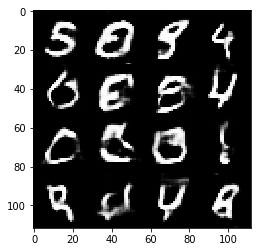

Timestamp 20170804-22-00-09.894 -  Epoch 1/2 -  Step 4010 -  D Loss: 1.1097 - G Loss: 1.3911
Timestamp 20170804-22-00-17.229 -  Epoch 1/2 -  Step 4020 -  D Loss: 0.8267 - G Loss: 1.3283
Timestamp 20170804-22-00-24.620 -  Epoch 1/2 -  Step 4030 -  D Loss: 1.1845 - G Loss: 1.0038
Timestamp 20170804-22-00-32.084 -  Epoch 1/2 -  Step 4040 -  D Loss: 1.2255 - G Loss: 1.1738
Timestamp 20170804-22-00-39.489 -  Epoch 1/2 -  Step 4050 -  D Loss: 0.9139 - G Loss: 1.8497
Timestamp 20170804-22-00-46.910 -  Epoch 1/2 -  Step 4060 -  D Loss: 1.0379 - G Loss: 1.2754
Timestamp 20170804-22-00-54.363 -  Epoch 1/2 -  Step 4070 -  D Loss: 0.8648 - G Loss: 1.4323
Timestamp 20170804-22-01-02.051 -  Epoch 1/2 -  Step 4080 -  D Loss: 0.7779 - G Loss: 1.5129
Timestamp 20170804-22-01-09.524 -  Epoch 1/2 -  Step 4090 -  D Loss: 1.2628 - G Loss: 1.6388
Timestamp 20170804-22-01-17.040 -  Epoch 1/2 -  Step 4100 -  D Loss: 1.2317 - G Loss: 1.0432


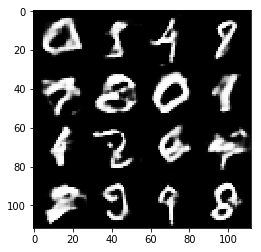

Timestamp 20170804-22-01-25.049 -  Epoch 1/2 -  Step 4110 -  D Loss: 1.3324 - G Loss: 1.5195
Timestamp 20170804-22-01-32.497 -  Epoch 1/2 -  Step 4120 -  D Loss: 0.7986 - G Loss: 1.5179
Timestamp 20170804-22-01-39.898 -  Epoch 1/2 -  Step 4130 -  D Loss: 0.7735 - G Loss: 1.6206
Timestamp 20170804-22-01-47.309 -  Epoch 1/2 -  Step 4140 -  D Loss: 0.8206 - G Loss: 1.0202
Timestamp 20170804-22-01-54.787 -  Epoch 1/2 -  Step 4150 -  D Loss: 0.9795 - G Loss: 1.8059
Timestamp 20170804-22-02-02.259 -  Epoch 1/2 -  Step 4160 -  D Loss: 1.7246 - G Loss: 0.4935
Timestamp 20170804-22-02-09.742 -  Epoch 1/2 -  Step 4170 -  D Loss: 0.8326 - G Loss: 1.6130
Timestamp 20170804-22-02-17.134 -  Epoch 1/2 -  Step 4180 -  D Loss: 1.5586 - G Loss: 1.1014
Timestamp 20170804-22-02-24.580 -  Epoch 1/2 -  Step 4190 -  D Loss: 0.8007 - G Loss: 1.2697
Timestamp 20170804-22-02-32.120 -  Epoch 1/2 -  Step 4200 -  D Loss: 0.8404 - G Loss: 0.8721


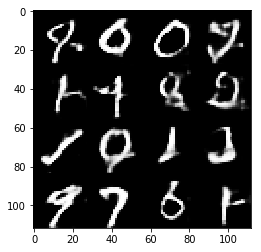

Timestamp 20170804-22-02-40.195 -  Epoch 1/2 -  Step 4210 -  D Loss: 1.0781 - G Loss: 1.0017
Timestamp 20170804-22-02-47.687 -  Epoch 1/2 -  Step 4220 -  D Loss: 0.7470 - G Loss: 2.1114
Timestamp 20170804-22-02-55.165 -  Epoch 1/2 -  Step 4230 -  D Loss: 1.1515 - G Loss: 0.8923
Timestamp 20170804-22-03-02.559 -  Epoch 1/2 -  Step 4240 -  D Loss: 0.8944 - G Loss: 1.2499
Timestamp 20170804-22-03-09.951 -  Epoch 1/2 -  Step 4250 -  D Loss: 0.9998 - G Loss: 0.8795
Timestamp 20170804-22-03-17.419 -  Epoch 1/2 -  Step 4260 -  D Loss: 1.1973 - G Loss: 0.7560
Timestamp 20170804-22-03-24.759 -  Epoch 1/2 -  Step 4270 -  D Loss: 1.0584 - G Loss: 1.1696
Timestamp 20170804-22-03-32.108 -  Epoch 1/2 -  Step 4280 -  D Loss: 1.1095 - G Loss: 1.0044
Timestamp 20170804-22-03-39.511 -  Epoch 1/2 -  Step 4290 -  D Loss: 0.8349 - G Loss: 1.8952
Timestamp 20170804-22-03-46.888 -  Epoch 1/2 -  Step 4300 -  D Loss: 0.6641 - G Loss: 1.9337


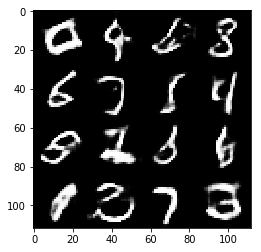

Timestamp 20170804-22-03-55.104 -  Epoch 1/2 -  Step 4310 -  D Loss: 1.2666 - G Loss: 1.3734
Timestamp 20170804-22-04-02.459 -  Epoch 1/2 -  Step 4320 -  D Loss: 1.2276 - G Loss: 0.6535
Timestamp 20170804-22-04-09.893 -  Epoch 1/2 -  Step 4330 -  D Loss: 1.1608 - G Loss: 1.3546
Timestamp 20170804-22-04-17.271 -  Epoch 1/2 -  Step 4340 -  D Loss: 1.3413 - G Loss: 0.7248
Timestamp 20170804-22-04-24.755 -  Epoch 1/2 -  Step 4350 -  D Loss: 1.1405 - G Loss: 1.0386
Timestamp 20170804-22-04-32.220 -  Epoch 1/2 -  Step 4360 -  D Loss: 0.7005 - G Loss: 1.5113
Timestamp 20170804-22-04-39.659 -  Epoch 1/2 -  Step 4370 -  D Loss: 0.5857 - G Loss: 1.6457
Timestamp 20170804-22-04-47.029 -  Epoch 1/2 -  Step 4380 -  D Loss: 0.9602 - G Loss: 1.0431
Timestamp 20170804-22-04-54.459 -  Epoch 1/2 -  Step 4390 -  D Loss: 1.3940 - G Loss: 1.4740
Timestamp 20170804-22-05-01.938 -  Epoch 1/2 -  Step 4400 -  D Loss: 1.0666 - G Loss: 1.8814


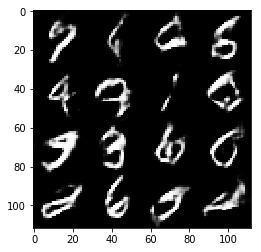

Timestamp 20170804-22-05-09.951 -  Epoch 1/2 -  Step 4410 -  D Loss: 1.2481 - G Loss: 1.5584
Timestamp 20170804-22-05-17.271 -  Epoch 1/2 -  Step 4420 -  D Loss: 1.0610 - G Loss: 1.0409
Timestamp 20170804-22-05-24.944 -  Epoch 1/2 -  Step 4430 -  D Loss: 1.4602 - G Loss: 0.9422
Timestamp 20170804-22-05-32.478 -  Epoch 1/2 -  Step 4440 -  D Loss: 0.9772 - G Loss: 1.1044
Timestamp 20170804-22-05-39.910 -  Epoch 1/2 -  Step 4450 -  D Loss: 1.1963 - G Loss: 1.2274
Timestamp 20170804-22-05-47.411 -  Epoch 1/2 -  Step 4460 -  D Loss: 0.7374 - G Loss: 1.2567
Timestamp 20170804-22-05-54.706 -  Epoch 1/2 -  Step 4470 -  D Loss: 0.8249 - G Loss: 1.7821
Timestamp 20170804-22-06-02.091 -  Epoch 1/2 -  Step 4480 -  D Loss: 1.1323 - G Loss: 0.9642
Timestamp 20170804-22-06-09.469 -  Epoch 1/2 -  Step 4490 -  D Loss: 0.6292 - G Loss: 1.5288
Timestamp 20170804-22-06-16.925 -  Epoch 1/2 -  Step 4500 -  D Loss: 0.6775 - G Loss: 2.1534


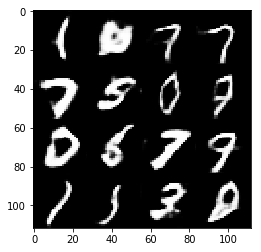

Timestamp 20170804-22-06-24.893 -  Epoch 1/2 -  Step 4510 -  D Loss: 0.6697 - G Loss: 1.4895
Timestamp 20170804-22-06-32.321 -  Epoch 1/2 -  Step 4520 -  D Loss: 0.6784 - G Loss: 1.1637
Timestamp 20170804-22-06-39.773 -  Epoch 1/2 -  Step 4530 -  D Loss: 0.7275 - G Loss: 1.1390
Timestamp 20170804-22-06-47.227 -  Epoch 1/2 -  Step 4540 -  D Loss: 1.4712 - G Loss: 1.2132
Timestamp 20170804-22-06-54.675 -  Epoch 1/2 -  Step 4550 -  D Loss: 0.9979 - G Loss: 1.2608
Timestamp 20170804-22-07-02.053 -  Epoch 1/2 -  Step 4560 -  D Loss: 1.0809 - G Loss: 0.9277
Timestamp 20170804-22-07-09.404 -  Epoch 1/2 -  Step 4570 -  D Loss: 0.9275 - G Loss: 0.9674
Timestamp 20170804-22-07-16.666 -  Epoch 1/2 -  Step 4580 -  D Loss: 0.6514 - G Loss: 2.0790
Timestamp 20170804-22-07-24.032 -  Epoch 1/2 -  Step 4590 -  D Loss: 2.0630 - G Loss: 0.8858
Timestamp 20170804-22-07-31.410 -  Epoch 1/2 -  Step 4600 -  D Loss: 1.1008 - G Loss: 0.6721


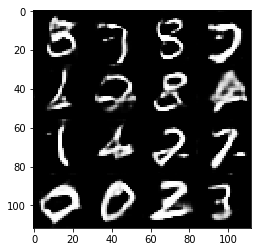

Timestamp 20170804-22-07-39.170 -  Epoch 1/2 -  Step 4610 -  D Loss: 1.0490 - G Loss: 0.9457
Timestamp 20170804-22-07-46.438 -  Epoch 1/2 -  Step 4620 -  D Loss: 1.1081 - G Loss: 1.5627
Timestamp 20170804-22-07-53.697 -  Epoch 1/2 -  Step 4630 -  D Loss: 0.9129 - G Loss: 1.4649
Timestamp 20170804-22-08-01.394 -  Epoch 1/2 -  Step 4640 -  D Loss: 1.0611 - G Loss: 1.2445
Timestamp 20170804-22-08-08.692 -  Epoch 1/2 -  Step 4650 -  D Loss: 1.2266 - G Loss: 0.8215
Timestamp 20170804-22-08-16.008 -  Epoch 1/2 -  Step 4660 -  D Loss: 1.0461 - G Loss: 1.1037
Timestamp 20170804-22-08-23.302 -  Epoch 1/2 -  Step 4670 -  D Loss: 0.9912 - G Loss: 1.1194
Timestamp 20170804-22-08-30.582 -  Epoch 1/2 -  Step 4680 -  D Loss: 1.0440 - G Loss: 0.8331
Timestamp 20170804-22-08-37.868 -  Epoch 1/2 -  Step 4690 -  D Loss: 1.2029 - G Loss: 1.0318
Timestamp 20170804-22-08-45.147 -  Epoch 1/2 -  Step 4700 -  D Loss: 0.6523 - G Loss: 2.1788


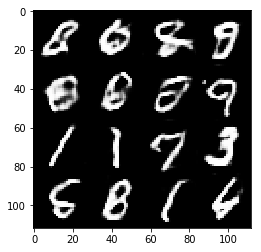

Timestamp 20170804-22-08-52.949 -  Epoch 1/2 -  Step 4710 -  D Loss: 0.7162 - G Loss: 1.4173
Timestamp 20170804-22-09-00.211 -  Epoch 1/2 -  Step 4720 -  D Loss: 0.9270 - G Loss: 2.1783
Timestamp 20170804-22-09-07.484 -  Epoch 1/2 -  Step 4730 -  D Loss: 1.0009 - G Loss: 1.5701
Timestamp 20170804-22-09-14.766 -  Epoch 1/2 -  Step 4740 -  D Loss: 0.9392 - G Loss: 1.6939
Timestamp 20170804-22-09-22.077 -  Epoch 1/2 -  Step 4750 -  D Loss: 1.1352 - G Loss: 1.1979
Timestamp 20170804-22-09-29.395 -  Epoch 1/2 -  Step 4760 -  D Loss: 1.4656 - G Loss: 1.0067
Timestamp 20170804-22-09-36.664 -  Epoch 1/2 -  Step 4770 -  D Loss: 0.7876 - G Loss: 1.6906
Timestamp 20170804-22-09-43.908 -  Epoch 1/2 -  Step 4780 -  D Loss: 0.7257 - G Loss: 1.2314
Timestamp 20170804-22-09-51.551 -  Epoch 1/2 -  Step 4790 -  D Loss: 0.9564 - G Loss: 1.7257
Timestamp 20170804-22-09-58.808 -  Epoch 1/2 -  Step 4800 -  D Loss: 0.6954 - G Loss: 1.4204


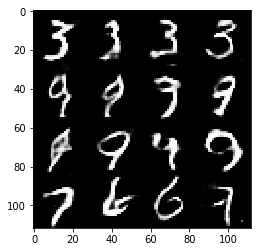

Timestamp 20170804-22-10-06.890 -  Epoch 1/2 -  Step 4810 -  D Loss: 0.8450 - G Loss: 1.7000
Timestamp 20170804-22-10-14.221 -  Epoch 1/2 -  Step 4820 -  D Loss: 1.1035 - G Loss: 0.9872
Timestamp 20170804-22-10-21.462 -  Epoch 1/2 -  Step 4830 -  D Loss: 0.8449 - G Loss: 1.9605
Timestamp 20170804-22-10-28.869 -  Epoch 1/2 -  Step 4840 -  D Loss: 0.8871 - G Loss: 1.7981
Timestamp 20170804-22-10-36.149 -  Epoch 1/2 -  Step 4850 -  D Loss: 1.6032 - G Loss: 0.6730
Timestamp 20170804-22-10-43.440 -  Epoch 1/2 -  Step 4860 -  D Loss: 1.3207 - G Loss: 0.5246
Timestamp 20170804-22-10-50.714 -  Epoch 1/2 -  Step 4870 -  D Loss: 1.0639 - G Loss: 0.9547
Timestamp 20170804-22-10-57.986 -  Epoch 1/2 -  Step 4880 -  D Loss: 0.9320 - G Loss: 1.2706
Timestamp 20170804-22-11-05.344 -  Epoch 1/2 -  Step 4890 -  D Loss: 0.8533 - G Loss: 2.0529
Timestamp 20170804-22-11-12.704 -  Epoch 1/2 -  Step 4900 -  D Loss: 0.6437 - G Loss: 1.6592


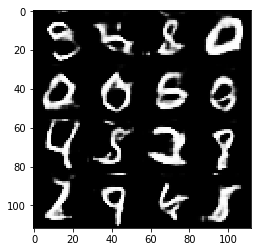

Timestamp 20170804-22-11-20.735 -  Epoch 1/2 -  Step 4910 -  D Loss: 0.8753 - G Loss: 1.3630
Timestamp 20170804-22-11-28.142 -  Epoch 1/2 -  Step 4920 -  D Loss: 1.0978 - G Loss: 1.0163
Timestamp 20170804-22-11-35.718 -  Epoch 1/2 -  Step 4930 -  D Loss: 1.0553 - G Loss: 1.7360
Timestamp 20170804-22-11-43.402 -  Epoch 1/2 -  Step 4940 -  D Loss: 0.8968 - G Loss: 1.0029
Timestamp 20170804-22-11-50.805 -  Epoch 1/2 -  Step 4950 -  D Loss: 0.7681 - G Loss: 1.0952
Timestamp 20170804-22-11-58.164 -  Epoch 1/2 -  Step 4960 -  D Loss: 1.2901 - G Loss: 1.0232
Timestamp 20170804-22-12-05.566 -  Epoch 1/2 -  Step 4970 -  D Loss: 1.2400 - G Loss: 1.0328
Timestamp 20170804-22-12-13.071 -  Epoch 1/2 -  Step 4980 -  D Loss: 1.1324 - G Loss: 0.4700
Timestamp 20170804-22-12-20.516 -  Epoch 1/2 -  Step 4990 -  D Loss: 1.5987 - G Loss: 0.9300
Timestamp 20170804-22-12-27.875 -  Epoch 1/2 -  Step 5000 -  D Loss: 0.7169 - G Loss: 1.7628


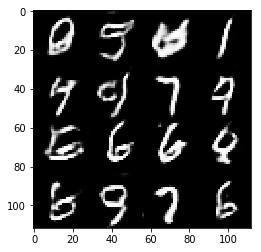

Timestamp 20170804-22-12-35.970 -  Epoch 1/2 -  Step 5010 -  D Loss: 0.8330 - G Loss: 1.8596
Timestamp 20170804-22-12-43.327 -  Epoch 1/2 -  Step 5020 -  D Loss: 1.0599 - G Loss: 1.1323
Timestamp 20170804-22-12-50.709 -  Epoch 1/2 -  Step 5030 -  D Loss: 1.6883 - G Loss: 0.6312
Timestamp 20170804-22-12-58.373 -  Epoch 1/2 -  Step 5040 -  D Loss: 1.4237 - G Loss: 0.7105
Timestamp 20170804-22-13-05.985 -  Epoch 1/2 -  Step 5050 -  D Loss: 1.0389 - G Loss: 0.8386
Timestamp 20170804-22-13-13.483 -  Epoch 1/2 -  Step 5060 -  D Loss: 1.4096 - G Loss: 1.7379
Timestamp 20170804-22-13-21.028 -  Epoch 1/2 -  Step 5070 -  D Loss: 0.9194 - G Loss: 1.1145
Timestamp 20170804-22-13-28.454 -  Epoch 1/2 -  Step 5080 -  D Loss: 1.0378 - G Loss: 0.8677
Timestamp 20170804-22-13-36.132 -  Epoch 1/2 -  Step 5090 -  D Loss: 0.8229 - G Loss: 1.4334
Timestamp 20170804-22-13-43.698 -  Epoch 1/2 -  Step 5100 -  D Loss: 1.1268 - G Loss: 1.0104


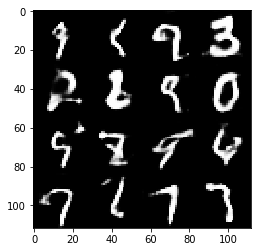

Timestamp 20170804-22-13-51.852 -  Epoch 1/2 -  Step 5110 -  D Loss: 0.9194 - G Loss: 1.3397
Timestamp 20170804-22-13-59.353 -  Epoch 1/2 -  Step 5120 -  D Loss: 1.0997 - G Loss: 1.0289
Timestamp 20170804-22-14-06.972 -  Epoch 1/2 -  Step 5130 -  D Loss: 1.0602 - G Loss: 1.6593
Timestamp 20170804-22-14-14.475 -  Epoch 1/2 -  Step 5140 -  D Loss: 1.2937 - G Loss: 1.5329
Timestamp 20170804-22-14-21.794 -  Epoch 1/2 -  Step 5150 -  D Loss: 1.0302 - G Loss: 1.2951
Timestamp 20170804-22-14-29.263 -  Epoch 1/2 -  Step 5160 -  D Loss: 0.9989 - G Loss: 1.6105
Timestamp 20170804-22-14-36.657 -  Epoch 1/2 -  Step 5170 -  D Loss: 0.8736 - G Loss: 1.3293
Timestamp 20170804-22-14-44.160 -  Epoch 1/2 -  Step 5180 -  D Loss: 1.1569 - G Loss: 1.9144
Timestamp 20170804-22-14-51.594 -  Epoch 1/2 -  Step 5190 -  D Loss: 0.8621 - G Loss: 1.6894
Timestamp 20170804-22-14-59.030 -  Epoch 1/2 -  Step 5200 -  D Loss: 1.2089 - G Loss: 0.9278


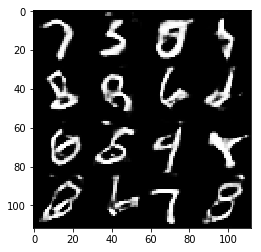

Timestamp 20170804-22-15-06.970 -  Epoch 1/2 -  Step 5210 -  D Loss: 0.7620 - G Loss: 1.3086
Timestamp 20170804-22-15-14.612 -  Epoch 1/2 -  Step 5220 -  D Loss: 0.8234 - G Loss: 1.0131
Timestamp 20170804-22-15-22.274 -  Epoch 1/2 -  Step 5230 -  D Loss: 1.0265 - G Loss: 1.2771
Timestamp 20170804-22-15-29.802 -  Epoch 1/2 -  Step 5240 -  D Loss: 0.8505 - G Loss: 1.6631
Timestamp 20170804-22-15-37.234 -  Epoch 1/2 -  Step 5250 -  D Loss: 0.6496 - G Loss: 1.4929
Timestamp 20170804-22-15-44.650 -  Epoch 1/2 -  Step 5260 -  D Loss: 0.6950 - G Loss: 1.5408
Timestamp 20170804-22-15-52.003 -  Epoch 1/2 -  Step 5270 -  D Loss: 0.8556 - G Loss: 1.0044
Timestamp 20170804-22-15-59.603 -  Epoch 1/2 -  Step 5280 -  D Loss: 1.2070 - G Loss: 0.9357
Timestamp 20170804-22-16-07.062 -  Epoch 1/2 -  Step 5290 -  D Loss: 0.9803 - G Loss: 1.5124
Timestamp 20170804-22-16-14.546 -  Epoch 1/2 -  Step 5300 -  D Loss: 0.6414 - G Loss: 1.6942


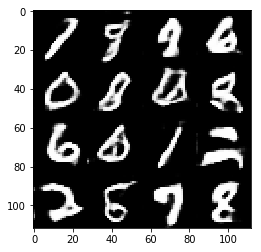

Timestamp 20170804-22-16-22.609 -  Epoch 1/2 -  Step 5310 -  D Loss: 1.0254 - G Loss: 1.4738
Timestamp 20170804-22-16-30.160 -  Epoch 1/2 -  Step 5320 -  D Loss: 0.9662 - G Loss: 1.1232
Timestamp 20170804-22-16-37.601 -  Epoch 1/2 -  Step 5330 -  D Loss: 0.8203 - G Loss: 1.1807
Timestamp 20170804-22-16-45.061 -  Epoch 1/2 -  Step 5340 -  D Loss: 1.1845 - G Loss: 1.9410
Timestamp 20170804-22-16-52.387 -  Epoch 1/2 -  Step 5350 -  D Loss: 0.7787 - G Loss: 1.2903
Timestamp 20170804-22-16-59.916 -  Epoch 1/2 -  Step 5360 -  D Loss: 1.1531 - G Loss: 1.7995
Timestamp 20170804-22-17-07.405 -  Epoch 1/2 -  Step 5370 -  D Loss: 0.5678 - G Loss: 2.0199
Timestamp 20170804-22-17-14.852 -  Epoch 1/2 -  Step 5380 -  D Loss: 1.2368 - G Loss: 1.4730
Timestamp 20170804-22-17-22.572 -  Epoch 1/2 -  Step 5390 -  D Loss: 1.1556 - G Loss: 1.4455
Timestamp 20170804-22-17-30.031 -  Epoch 1/2 -  Step 5400 -  D Loss: 1.3219 - G Loss: 1.8037


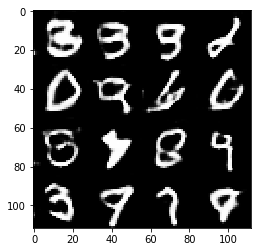

Timestamp 20170804-22-17-37.971 -  Epoch 1/2 -  Step 5410 -  D Loss: 0.9221 - G Loss: 1.6684
Timestamp 20170804-22-17-45.367 -  Epoch 1/2 -  Step 5420 -  D Loss: 0.6180 - G Loss: 1.1441
Timestamp 20170804-22-17-52.835 -  Epoch 1/2 -  Step 5430 -  D Loss: 1.2414 - G Loss: 0.9753
Timestamp 20170804-22-18-00.305 -  Epoch 1/2 -  Step 5440 -  D Loss: 0.9944 - G Loss: 1.0635
Timestamp 20170804-22-18-07.878 -  Epoch 1/2 -  Step 5450 -  D Loss: 0.5994 - G Loss: 1.8191
Timestamp 20170804-22-18-15.383 -  Epoch 1/2 -  Step 5460 -  D Loss: 1.2331 - G Loss: 0.8501
Timestamp 20170804-22-18-22.857 -  Epoch 1/2 -  Step 5470 -  D Loss: 0.9437 - G Loss: 1.8167
Timestamp 20170804-22-18-30.388 -  Epoch 1/2 -  Step 5480 -  D Loss: 0.9148 - G Loss: 1.7230
Timestamp 20170804-22-18-37.866 -  Epoch 1/2 -  Step 5490 -  D Loss: 1.0232 - G Loss: 1.8947
Timestamp 20170804-22-18-45.344 -  Epoch 1/2 -  Step 5500 -  D Loss: 0.8217 - G Loss: 1.3774


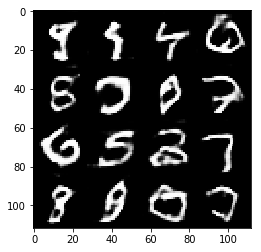

Timestamp 20170804-22-18-53.515 -  Epoch 1/2 -  Step 5510 -  D Loss: 0.8528 - G Loss: 1.7706
Timestamp 20170804-22-19-00.884 -  Epoch 1/2 -  Step 5520 -  D Loss: 1.0628 - G Loss: 0.9602
Timestamp 20170804-22-19-08.392 -  Epoch 1/2 -  Step 5530 -  D Loss: 1.1508 - G Loss: 0.7716
Timestamp 20170804-22-19-15.889 -  Epoch 1/2 -  Step 5540 -  D Loss: 1.0403 - G Loss: 1.5965
Timestamp 20170804-22-19-23.319 -  Epoch 1/2 -  Step 5550 -  D Loss: 0.8095 - G Loss: 0.8451
Timestamp 20170804-22-19-30.752 -  Epoch 1/2 -  Step 5560 -  D Loss: 0.7054 - G Loss: 0.7634
Timestamp 20170804-22-19-38.055 -  Epoch 1/2 -  Step 5570 -  D Loss: 0.9380 - G Loss: 1.4926
Timestamp 20170804-22-19-45.443 -  Epoch 1/2 -  Step 5580 -  D Loss: 0.7982 - G Loss: 1.8556
Timestamp 20170804-22-19-52.776 -  Epoch 1/2 -  Step 5590 -  D Loss: 0.8373 - G Loss: 1.4700
Timestamp 20170804-22-20-00.275 -  Epoch 1/2 -  Step 5600 -  D Loss: 0.9515 - G Loss: 1.6201


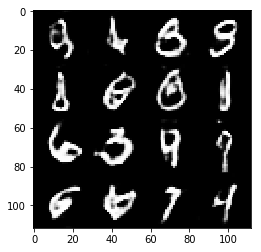

Timestamp 20170804-22-20-08.392 -  Epoch 1/2 -  Step 5610 -  D Loss: 1.2337 - G Loss: 1.3528
Timestamp 20170804-22-20-16.019 -  Epoch 1/2 -  Step 5620 -  D Loss: 0.7280 - G Loss: 1.9849
Timestamp 20170804-22-20-23.523 -  Epoch 1/2 -  Step 5630 -  D Loss: 0.6629 - G Loss: 1.2807
Timestamp 20170804-22-20-30.998 -  Epoch 1/2 -  Step 5640 -  D Loss: 0.8966 - G Loss: 1.3014
Timestamp 20170804-22-20-38.475 -  Epoch 1/2 -  Step 5650 -  D Loss: 0.9045 - G Loss: 1.0904
Timestamp 20170804-22-20-46.214 -  Epoch 1/2 -  Step 5660 -  D Loss: 0.9452 - G Loss: 1.2073
Timestamp 20170804-22-20-53.573 -  Epoch 1/2 -  Step 5670 -  D Loss: 0.8464 - G Loss: 1.6943
Timestamp 20170804-22-21-00.923 -  Epoch 1/2 -  Step 5680 -  D Loss: 0.6900 - G Loss: 1.3678
Timestamp 20170804-22-21-08.464 -  Epoch 1/2 -  Step 5690 -  D Loss: 0.9932 - G Loss: 1.4001
Timestamp 20170804-22-21-15.799 -  Epoch 1/2 -  Step 5700 -  D Loss: 1.0517 - G Loss: 1.7197


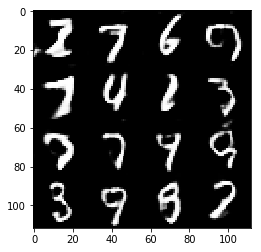

Timestamp 20170804-22-21-23.840 -  Epoch 1/2 -  Step 5710 -  D Loss: 0.7853 - G Loss: 1.5752
Timestamp 20170804-22-21-31.280 -  Epoch 1/2 -  Step 5720 -  D Loss: 0.8414 - G Loss: 1.6547
Timestamp 20170804-22-21-38.610 -  Epoch 1/2 -  Step 5730 -  D Loss: 0.7025 - G Loss: 2.6982
Timestamp 20170804-22-21-45.995 -  Epoch 1/2 -  Step 5740 -  D Loss: 0.5880 - G Loss: 1.7774
Timestamp 20170804-22-21-53.483 -  Epoch 1/2 -  Step 5750 -  D Loss: 1.0413 - G Loss: 1.3165
Timestamp 20170804-22-22-00.959 -  Epoch 1/2 -  Step 5760 -  D Loss: 1.2160 - G Loss: 0.9650
Timestamp 20170804-22-22-08.404 -  Epoch 1/2 -  Step 5770 -  D Loss: 0.7239 - G Loss: 1.6165
Timestamp 20170804-22-22-15.904 -  Epoch 1/2 -  Step 5780 -  D Loss: 0.5783 - G Loss: 2.2285
Timestamp 20170804-22-22-23.335 -  Epoch 1/2 -  Step 5790 -  D Loss: 0.8157 - G Loss: 1.3561
Timestamp 20170804-22-22-30.805 -  Epoch 1/2 -  Step 5800 -  D Loss: 1.0840 - G Loss: 2.3127


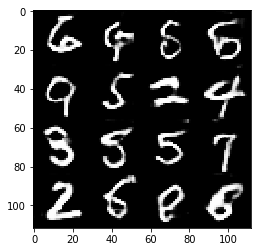

Timestamp 20170804-22-22-39.266 -  Epoch 1/2 -  Step 5810 -  D Loss: 0.5741 - G Loss: 1.6496
Timestamp 20170804-22-22-46.811 -  Epoch 1/2 -  Step 5820 -  D Loss: 0.7383 - G Loss: 1.7770
Timestamp 20170804-22-22-54.542 -  Epoch 1/2 -  Step 5830 -  D Loss: 0.8375 - G Loss: 0.8130
Timestamp 20170804-22-23-02.017 -  Epoch 1/2 -  Step 5840 -  D Loss: 0.9112 - G Loss: 1.3588
Timestamp 20170804-22-23-09.319 -  Epoch 1/2 -  Step 5850 -  D Loss: 0.9257 - G Loss: 1.1855
Timestamp 20170804-22-23-16.638 -  Epoch 1/2 -  Step 5860 -  D Loss: 1.0766 - G Loss: 1.5582
Timestamp 20170804-22-23-24.090 -  Epoch 1/2 -  Step 5870 -  D Loss: 0.8882 - G Loss: 1.1567
Timestamp 20170804-22-23-31.545 -  Epoch 1/2 -  Step 5880 -  D Loss: 0.6129 - G Loss: 1.4536
Timestamp 20170804-22-23-39.015 -  Epoch 1/2 -  Step 5890 -  D Loss: 1.1421 - G Loss: 1.1679
Timestamp 20170804-22-23-46.596 -  Epoch 1/2 -  Step 5900 -  D Loss: 1.0716 - G Loss: 1.7338


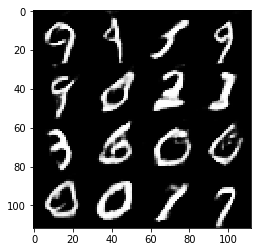

Timestamp 20170804-22-23-54.690 -  Epoch 1/2 -  Step 5910 -  D Loss: 0.7689 - G Loss: 1.5620
Timestamp 20170804-22-24-02.098 -  Epoch 1/2 -  Step 5920 -  D Loss: 1.0113 - G Loss: 1.1126
Timestamp 20170804-22-24-09.722 -  Epoch 1/2 -  Step 5930 -  D Loss: 0.8280 - G Loss: 2.4322
Timestamp 20170804-22-24-17.003 -  Epoch 1/2 -  Step 5940 -  D Loss: 0.7532 - G Loss: 1.8540
Timestamp 20170804-22-24-24.376 -  Epoch 1/2 -  Step 5950 -  D Loss: 0.5903 - G Loss: 0.9758
Timestamp 20170804-22-24-31.807 -  Epoch 1/2 -  Step 5960 -  D Loss: 1.5599 - G Loss: 0.7895
Timestamp 20170804-22-24-39.266 -  Epoch 1/2 -  Step 5970 -  D Loss: 1.1747 - G Loss: 1.2192
Timestamp 20170804-22-24-46.759 -  Epoch 1/2 -  Step 5980 -  D Loss: 1.2812 - G Loss: 1.6900
Timestamp 20170804-22-24-54.176 -  Epoch 1/2 -  Step 5990 -  D Loss: 1.1000 - G Loss: 1.4439
Timestamp 20170804-22-25-01.542 -  Epoch 1/2 -  Step 6000 -  D Loss: 1.0343 - G Loss: 1.3177


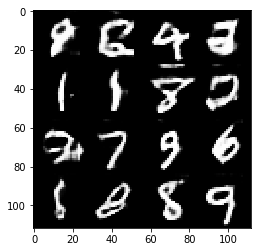

Timestamp 20170804-22-25-09.450 -  Epoch 1/2 -  Step 6010 -  D Loss: 1.0147 - G Loss: 1.8043
Timestamp 20170804-22-25-16.875 -  Epoch 1/2 -  Step 6020 -  D Loss: 0.6954 - G Loss: 2.1498
Timestamp 20170804-22-25-24.302 -  Epoch 1/2 -  Step 6030 -  D Loss: 0.8607 - G Loss: 3.7903
Timestamp 20170804-22-25-31.673 -  Epoch 1/2 -  Step 6040 -  D Loss: 1.2670 - G Loss: 1.3005
Timestamp 20170804-22-25-39.107 -  Epoch 1/2 -  Step 6050 -  D Loss: 0.7839 - G Loss: 1.5301
Timestamp 20170804-22-25-46.636 -  Epoch 1/2 -  Step 6060 -  D Loss: 0.7730 - G Loss: 1.6573
Timestamp 20170804-22-25-54.151 -  Epoch 1/2 -  Step 6070 -  D Loss: 1.0496 - G Loss: 1.4544
Timestamp 20170804-22-26-01.573 -  Epoch 1/2 -  Step 6080 -  D Loss: 0.8931 - G Loss: 2.2556
Timestamp 20170804-22-26-09.083 -  Epoch 1/2 -  Step 6090 -  D Loss: 0.4420 - G Loss: 2.8713
Timestamp 20170804-22-26-16.676 -  Epoch 1/2 -  Step 6100 -  D Loss: 0.9001 - G Loss: 2.2663


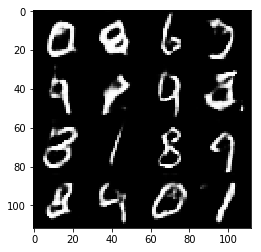

Timestamp 20170804-22-26-24.918 -  Epoch 1/2 -  Step 6110 -  D Loss: 1.2682 - G Loss: 1.6430
Timestamp 20170804-22-26-32.415 -  Epoch 1/2 -  Step 6120 -  D Loss: 0.7369 - G Loss: 1.5357
Timestamp 20170804-22-26-39.933 -  Epoch 1/2 -  Step 6130 -  D Loss: 1.3367 - G Loss: 0.8641
Timestamp 20170804-22-26-47.429 -  Epoch 1/2 -  Step 6140 -  D Loss: 0.6016 - G Loss: 2.0530
Timestamp 20170804-22-26-54.796 -  Epoch 1/2 -  Step 6150 -  D Loss: 0.6561 - G Loss: 1.9334
Timestamp 20170804-22-27-02.097 -  Epoch 1/2 -  Step 6160 -  D Loss: 1.2126 - G Loss: 1.6708
Timestamp 20170804-22-27-09.465 -  Epoch 1/2 -  Step 6170 -  D Loss: 0.6472 - G Loss: 1.1391
Timestamp 20170804-22-27-17.097 -  Epoch 1/2 -  Step 6180 -  D Loss: 0.9413 - G Loss: 0.9428
Timestamp 20170804-22-27-24.513 -  Epoch 1/2 -  Step 6190 -  D Loss: 0.9993 - G Loss: 1.2772
Timestamp 20170804-22-27-31.961 -  Epoch 1/2 -  Step 6200 -  D Loss: 0.9508 - G Loss: 0.6212


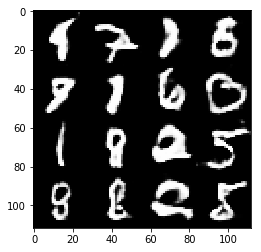

Timestamp 20170804-22-27-40.276 -  Epoch 1/2 -  Step 6210 -  D Loss: 1.6431 - G Loss: 1.0920
Timestamp 20170804-22-27-47.748 -  Epoch 1/2 -  Step 6220 -  D Loss: 0.8043 - G Loss: 1.5665
Timestamp 20170804-22-27-55.131 -  Epoch 1/2 -  Step 6230 -  D Loss: 0.9628 - G Loss: 1.0935
Timestamp 20170804-22-28-02.666 -  Epoch 1/2 -  Step 6240 -  D Loss: 1.1367 - G Loss: 1.0592
Timestamp 20170804-22-28-10.058 -  Epoch 1/2 -  Step 6250 -  D Loss: 0.6468 - G Loss: 2.2216
Timestamp 20170804-22-28-17.554 -  Epoch 1/2 -  Step 6260 -  D Loss: 1.3773 - G Loss: 1.6036
Timestamp 20170804-22-28-24.937 -  Epoch 1/2 -  Step 6270 -  D Loss: 0.9047 - G Loss: 1.3075
Timestamp 20170804-22-28-32.422 -  Epoch 1/2 -  Step 6280 -  D Loss: 0.9379 - G Loss: 0.6789
Timestamp 20170804-22-28-39.835 -  Epoch 1/2 -  Step 6290 -  D Loss: 0.9392 - G Loss: 1.2661
Timestamp 20170804-22-28-47.303 -  Epoch 1/2 -  Step 6300 -  D Loss: 0.7355 - G Loss: 1.4106


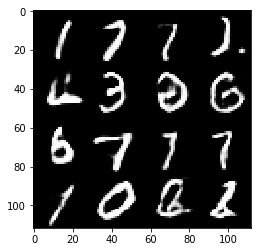

Timestamp 20170804-22-28-55.306 -  Epoch 1/2 -  Step 6310 -  D Loss: 0.9899 - G Loss: 1.7787
Timestamp 20170804-22-29-02.720 -  Epoch 1/2 -  Step 6320 -  D Loss: 0.7570 - G Loss: 1.8067
Timestamp 20170804-22-29-10.416 -  Epoch 1/2 -  Step 6330 -  D Loss: 0.8477 - G Loss: 1.2074
Timestamp 20170804-22-29-17.843 -  Epoch 1/2 -  Step 6340 -  D Loss: 0.8191 - G Loss: 1.0373
Timestamp 20170804-22-29-25.297 -  Epoch 1/2 -  Step 6350 -  D Loss: 0.6698 - G Loss: 1.8684
Timestamp 20170804-22-29-32.914 -  Epoch 1/2 -  Step 6360 -  D Loss: 0.9657 - G Loss: 1.6168
Timestamp 20170804-22-29-40.317 -  Epoch 1/2 -  Step 6370 -  D Loss: 0.9975 - G Loss: 1.0059
Timestamp 20170804-22-29-47.709 -  Epoch 1/2 -  Step 6380 -  D Loss: 0.5794 - G Loss: 1.9523
Timestamp 20170804-22-29-55.021 -  Epoch 1/2 -  Step 6390 -  D Loss: 1.2292 - G Loss: 0.5868
Timestamp 20170804-22-30-02.429 -  Epoch 1/2 -  Step 6400 -  D Loss: 1.0296 - G Loss: 1.5650


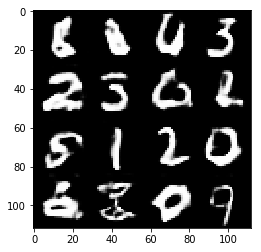

Timestamp 20170804-22-30-10.410 -  Epoch 1/2 -  Step 6410 -  D Loss: 0.9480 - G Loss: 1.3221
Timestamp 20170804-22-30-17.977 -  Epoch 1/2 -  Step 6420 -  D Loss: 0.8188 - G Loss: 1.4947
Timestamp 20170804-22-30-25.465 -  Epoch 1/2 -  Step 6430 -  D Loss: 0.6590 - G Loss: 1.3448
Timestamp 20170804-22-30-32.896 -  Epoch 1/2 -  Step 6440 -  D Loss: 0.7427 - G Loss: 1.7168
Timestamp 20170804-22-30-40.219 -  Epoch 1/2 -  Step 6450 -  D Loss: 0.9351 - G Loss: 1.0132
Timestamp 20170804-22-30-47.880 -  Epoch 1/2 -  Step 6460 -  D Loss: 0.6842 - G Loss: 1.5493
Timestamp 20170804-22-30-55.403 -  Epoch 1/2 -  Step 6470 -  D Loss: 1.1432 - G Loss: 1.4444
Timestamp 20170804-22-31-02.804 -  Epoch 1/2 -  Step 6480 -  D Loss: 0.8205 - G Loss: 1.7107
Timestamp 20170804-22-31-10.250 -  Epoch 1/2 -  Step 6490 -  D Loss: 1.6855 - G Loss: 0.8395
Timestamp 20170804-22-31-17.687 -  Epoch 1/2 -  Step 6500 -  D Loss: 0.6898 - G Loss: 1.5543


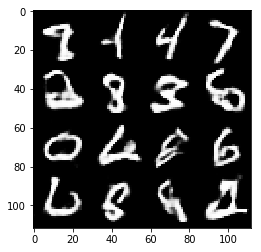

Timestamp 20170804-22-31-25.770 -  Epoch 1/2 -  Step 6510 -  D Loss: 0.9637 - G Loss: 1.0183
Timestamp 20170804-22-31-33.182 -  Epoch 1/2 -  Step 6520 -  D Loss: 0.7356 - G Loss: 1.8100
Timestamp 20170804-22-31-40.709 -  Epoch 1/2 -  Step 6530 -  D Loss: 1.2131 - G Loss: 1.1420
Timestamp 20170804-22-31-48.086 -  Epoch 1/2 -  Step 6540 -  D Loss: 1.2485 - G Loss: 1.2478
Timestamp 20170804-22-31-55.545 -  Epoch 1/2 -  Step 6550 -  D Loss: 1.0568 - G Loss: 1.5247
Timestamp 20170804-22-32-03.271 -  Epoch 1/2 -  Step 6560 -  D Loss: 0.8571 - G Loss: 2.5342
Timestamp 20170804-22-32-10.706 -  Epoch 1/2 -  Step 6570 -  D Loss: 0.8739 - G Loss: 0.9804
Timestamp 20170804-22-32-18.161 -  Epoch 1/2 -  Step 6580 -  D Loss: 0.9537 - G Loss: 1.3745
Timestamp 20170804-22-32-25.602 -  Epoch 1/2 -  Step 6590 -  D Loss: 1.5530 - G Loss: 0.6721
Timestamp 20170804-22-32-33.185 -  Epoch 1/2 -  Step 6600 -  D Loss: 0.8232 - G Loss: 1.8102


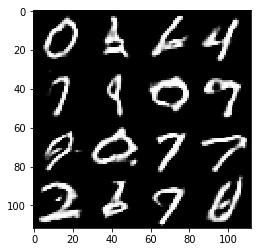

Timestamp 20170804-22-32-41.218 -  Epoch 1/2 -  Step 6610 -  D Loss: 0.4909 - G Loss: 2.5923
Timestamp 20170804-22-32-48.611 -  Epoch 1/2 -  Step 6620 -  D Loss: 0.6502 - G Loss: 2.1627
Timestamp 20170804-22-32-56.171 -  Epoch 1/2 -  Step 6630 -  D Loss: 1.2328 - G Loss: 0.9029
Timestamp 20170804-22-33-03.633 -  Epoch 1/2 -  Step 6640 -  D Loss: 1.1447 - G Loss: 1.1987
Timestamp 20170804-22-33-11.004 -  Epoch 1/2 -  Step 6650 -  D Loss: 0.8114 - G Loss: 1.9364
Timestamp 20170804-22-33-18.589 -  Epoch 1/2 -  Step 6660 -  D Loss: 0.5124 - G Loss: 2.2701
Timestamp 20170804-22-33-26.039 -  Epoch 1/2 -  Step 6670 -  D Loss: 0.8769 - G Loss: 2.6212
Timestamp 20170804-22-33-33.550 -  Epoch 1/2 -  Step 6680 -  D Loss: 1.4709 - G Loss: 0.7984
Timestamp 20170804-22-33-41.013 -  Epoch 1/2 -  Step 6690 -  D Loss: 1.0755 - G Loss: 0.6712
Timestamp 20170804-22-33-48.675 -  Epoch 1/2 -  Step 6700 -  D Loss: 0.6967 - G Loss: 2.0390


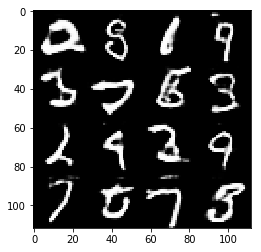

Timestamp 20170804-22-33-56.735 -  Epoch 1/2 -  Step 6710 -  D Loss: 0.6236 - G Loss: 1.5879
Timestamp 20170804-22-34-04.256 -  Epoch 1/2 -  Step 6720 -  D Loss: 0.9360 - G Loss: 2.8396
Timestamp 20170804-22-34-11.712 -  Epoch 1/2 -  Step 6730 -  D Loss: 0.5621 - G Loss: 1.5036
Timestamp 20170804-22-34-19.120 -  Epoch 1/2 -  Step 6740 -  D Loss: 0.8756 - G Loss: 1.3786
Timestamp 20170804-22-34-26.538 -  Epoch 1/2 -  Step 6750 -  D Loss: 0.6015 - G Loss: 1.6680
Timestamp 20170804-22-34-33.883 -  Epoch 1/2 -  Step 6760 -  D Loss: 0.6708 - G Loss: 1.6485
Timestamp 20170804-22-34-41.212 -  Epoch 1/2 -  Step 6770 -  D Loss: 1.1025 - G Loss: 1.4966
Timestamp 20170804-22-34-48.635 -  Epoch 1/2 -  Step 6780 -  D Loss: 1.0609 - G Loss: 1.0793
Timestamp 20170804-22-34-56.335 -  Epoch 1/2 -  Step 6790 -  D Loss: 1.0495 - G Loss: 1.0598
Timestamp 20170804-22-35-03.815 -  Epoch 1/2 -  Step 6800 -  D Loss: 0.8381 - G Loss: 1.7813


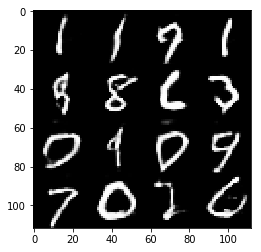

Timestamp 20170804-22-35-11.764 -  Epoch 1/2 -  Step 6810 -  D Loss: 0.6462 - G Loss: 2.9309
Timestamp 20170804-22-35-19.149 -  Epoch 1/2 -  Step 6820 -  D Loss: 0.8053 - G Loss: 1.7714
Timestamp 20170804-22-35-26.498 -  Epoch 1/2 -  Step 6830 -  D Loss: 1.0112 - G Loss: 3.5944
Timestamp 20170804-22-35-33.758 -  Epoch 1/2 -  Step 6840 -  D Loss: 0.9209 - G Loss: 1.7900
Timestamp 20170804-22-35-41.358 -  Epoch 1/2 -  Step 6850 -  D Loss: 0.7842 - G Loss: 1.8598
Timestamp 20170804-22-35-48.780 -  Epoch 1/2 -  Step 6860 -  D Loss: 1.1379 - G Loss: 0.6895
Timestamp 20170804-22-35-56.152 -  Epoch 1/2 -  Step 6870 -  D Loss: 0.5560 - G Loss: 2.4012
Timestamp 20170804-22-36-03.446 -  Epoch 1/2 -  Step 6880 -  D Loss: 0.6759 - G Loss: 1.8533
Timestamp 20170804-22-36-10.869 -  Epoch 1/2 -  Step 6890 -  D Loss: 0.9637 - G Loss: 0.8491
Timestamp 20170804-22-36-18.248 -  Epoch 1/2 -  Step 6900 -  D Loss: 0.7159 - G Loss: 2.2296


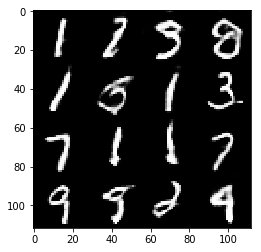

Timestamp 20170804-22-36-26.144 -  Epoch 1/2 -  Step 6910 -  D Loss: 1.1628 - G Loss: 0.7480
Timestamp 20170804-22-36-33.501 -  Epoch 1/2 -  Step 6920 -  D Loss: 1.0287 - G Loss: 0.9233
Timestamp 20170804-22-36-40.789 -  Epoch 1/2 -  Step 6930 -  D Loss: 0.8061 - G Loss: 1.6634
Timestamp 20170804-22-36-48.328 -  Epoch 1/2 -  Step 6940 -  D Loss: 0.4650 - G Loss: 2.5282
Timestamp 20170804-22-36-55.631 -  Epoch 1/2 -  Step 6950 -  D Loss: 1.1916 - G Loss: 1.2073
Timestamp 20170804-22-37-02.935 -  Epoch 1/2 -  Step 6960 -  D Loss: 1.0789 - G Loss: 1.0254
Timestamp 20170804-22-37-10.258 -  Epoch 1/2 -  Step 6970 -  D Loss: 0.8543 - G Loss: 1.0874
Timestamp 20170804-22-37-17.543 -  Epoch 1/2 -  Step 6980 -  D Loss: 1.2601 - G Loss: 1.4200
Timestamp 20170804-22-37-24.797 -  Epoch 1/2 -  Step 6990 -  D Loss: 1.1401 - G Loss: 1.4048
Timestamp 20170804-22-37-32.125 -  Epoch 1/2 -  Step 7000 -  D Loss: 1.0806 - G Loss: 1.2598


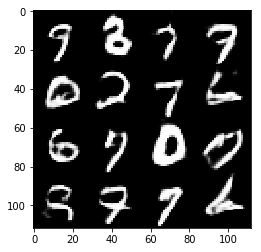

Timestamp 20170804-22-37-40.042 -  Epoch 1/2 -  Step 7010 -  D Loss: 1.0122 - G Loss: 1.2927
Timestamp 20170804-22-37-47.388 -  Epoch 1/2 -  Step 7020 -  D Loss: 0.9903 - G Loss: 1.4755
Timestamp 20170804-22-37-54.718 -  Epoch 1/2 -  Step 7030 -  D Loss: 1.0490 - G Loss: 1.5418
Timestamp 20170804-22-38-02.050 -  Epoch 1/2 -  Step 7040 -  D Loss: 0.7858 - G Loss: 1.5701
Timestamp 20170804-22-38-09.366 -  Epoch 1/2 -  Step 7050 -  D Loss: 1.7492 - G Loss: 0.7417
Timestamp 20170804-22-38-16.705 -  Epoch 1/2 -  Step 7060 -  D Loss: 0.8830 - G Loss: 2.2941
Timestamp 20170804-22-38-23.973 -  Epoch 1/2 -  Step 7070 -  D Loss: 0.8459 - G Loss: 1.9880
Timestamp 20170804-22-38-31.268 -  Epoch 1/2 -  Step 7080 -  D Loss: 0.8936 - G Loss: 1.4422
Timestamp 20170804-22-38-38.574 -  Epoch 1/2 -  Step 7090 -  D Loss: 1.0354 - G Loss: 2.0633
Timestamp 20170804-22-38-45.864 -  Epoch 1/2 -  Step 7100 -  D Loss: 0.8231 - G Loss: 1.0868


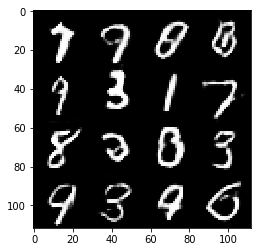

Timestamp 20170804-22-38-53.847 -  Epoch 1/2 -  Step 7110 -  D Loss: 1.1312 - G Loss: 1.8319
Timestamp 20170804-22-39-01.107 -  Epoch 1/2 -  Step 7120 -  D Loss: 0.6994 - G Loss: 1.4515
Timestamp 20170804-22-39-08.718 -  Epoch 1/2 -  Step 7130 -  D Loss: 0.7995 - G Loss: 1.4263
Timestamp 20170804-22-39-16.064 -  Epoch 1/2 -  Step 7140 -  D Loss: 0.9025 - G Loss: 1.0888
Timestamp 20170804-22-39-23.362 -  Epoch 1/2 -  Step 7150 -  D Loss: 0.8820 - G Loss: 1.1515
Timestamp 20170804-22-39-30.644 -  Epoch 1/2 -  Step 7160 -  D Loss: 1.1525 - G Loss: 1.4470
Timestamp 20170804-22-39-37.925 -  Epoch 1/2 -  Step 7170 -  D Loss: 1.0420 - G Loss: 1.4900
Timestamp 20170804-22-39-45.185 -  Epoch 1/2 -  Step 7180 -  D Loss: 0.8709 - G Loss: 2.0190
Timestamp 20170804-22-39-52.511 -  Epoch 1/2 -  Step 7190 -  D Loss: 0.6074 - G Loss: 2.1468
Timestamp 20170804-22-39-59.834 -  Epoch 1/2 -  Step 7200 -  D Loss: 0.5571 - G Loss: 2.2812


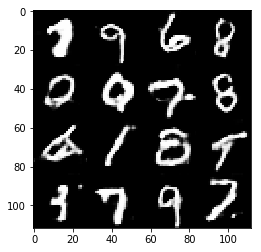

Timestamp 20170804-22-40-07.940 -  Epoch 1/2 -  Step 7210 -  D Loss: 0.9080 - G Loss: 1.5717
Timestamp 20170804-22-40-15.232 -  Epoch 1/2 -  Step 7220 -  D Loss: 1.1731 - G Loss: 1.2650
Timestamp 20170804-22-40-22.588 -  Epoch 1/2 -  Step 7230 -  D Loss: 0.9812 - G Loss: 3.3885
Timestamp 20170804-22-40-29.913 -  Epoch 1/2 -  Step 7240 -  D Loss: 0.7800 - G Loss: 1.6437
Timestamp 20170804-22-40-37.170 -  Epoch 1/2 -  Step 7250 -  D Loss: 0.9093 - G Loss: 1.3859
Timestamp 20170804-22-40-44.526 -  Epoch 1/2 -  Step 7260 -  D Loss: 0.9869 - G Loss: 0.8179
Timestamp 20170804-22-40-51.783 -  Epoch 1/2 -  Step 7270 -  D Loss: 0.5715 - G Loss: 1.8106
Timestamp 20170804-22-40-59.036 -  Epoch 1/2 -  Step 7280 -  D Loss: 0.7210 - G Loss: 2.5684
Timestamp 20170804-22-41-06.338 -  Epoch 1/2 -  Step 7290 -  D Loss: 0.8448 - G Loss: 1.2940
Timestamp 20170804-22-41-13.613 -  Epoch 1/2 -  Step 7300 -  D Loss: 0.7766 - G Loss: 0.9659


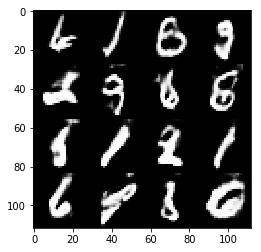

Timestamp 20170804-22-41-21.554 -  Epoch 1/2 -  Step 7310 -  D Loss: 1.0107 - G Loss: 1.4539
Timestamp 20170804-22-41-28.833 -  Epoch 1/2 -  Step 7320 -  D Loss: 1.3033 - G Loss: 0.8413
Timestamp 20170804-22-41-36.167 -  Epoch 1/2 -  Step 7330 -  D Loss: 1.0298 - G Loss: 1.6463
Timestamp 20170804-22-41-43.424 -  Epoch 1/2 -  Step 7340 -  D Loss: 0.7527 - G Loss: 0.9069
Timestamp 20170804-22-41-50.700 -  Epoch 1/2 -  Step 7350 -  D Loss: 0.6523 - G Loss: 1.6761
Timestamp 20170804-22-41-57.988 -  Epoch 1/2 -  Step 7360 -  D Loss: 0.5264 - G Loss: 2.1218
Timestamp 20170804-22-42-05.313 -  Epoch 1/2 -  Step 7370 -  D Loss: 0.7956 - G Loss: 2.0169
Timestamp 20170804-22-42-12.575 -  Epoch 1/2 -  Step 7380 -  D Loss: 1.0554 - G Loss: 1.2692
Timestamp 20170804-22-42-19.863 -  Epoch 1/2 -  Step 7390 -  D Loss: 0.9231 - G Loss: 1.5460
Timestamp 20170804-22-42-27.239 -  Epoch 1/2 -  Step 7400 -  D Loss: 0.8591 - G Loss: 1.8621


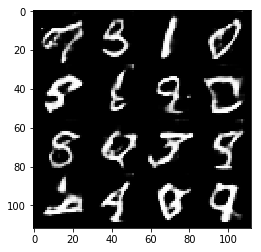

Timestamp 20170804-22-42-35.152 -  Epoch 1/2 -  Step 7410 -  D Loss: 0.9439 - G Loss: 1.0413
Timestamp 20170804-22-42-42.439 -  Epoch 1/2 -  Step 7420 -  D Loss: 1.0035 - G Loss: 1.8967
Timestamp 20170804-22-42-49.858 -  Epoch 1/2 -  Step 7430 -  D Loss: 0.7611 - G Loss: 2.3945
Timestamp 20170804-22-42-57.143 -  Epoch 1/2 -  Step 7440 -  D Loss: 1.1390 - G Loss: 1.3339
Timestamp 20170804-22-43-04.428 -  Epoch 1/2 -  Step 7450 -  D Loss: 0.4627 - G Loss: 1.8886
Timestamp 20170804-22-43-11.737 -  Epoch 1/2 -  Step 7460 -  D Loss: 0.8551 - G Loss: 2.1148
Timestamp 20170804-22-43-19.026 -  Epoch 1/2 -  Step 7470 -  D Loss: 0.9991 - G Loss: 1.2708
Timestamp 20170804-22-43-26.313 -  Epoch 1/2 -  Step 7480 -  D Loss: 0.7173 - G Loss: 1.8367
Timestamp 20170804-22-43-33.671 -  Epoch 1/2 -  Step 7490 -  D Loss: 1.0809 - G Loss: 1.8548
Timestamp 20170804-22-43-41.009 -  Epoch 1/2 -  Step 7500 -  D Loss: 0.5732 - G Loss: 2.1314


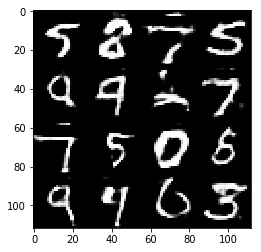

Timestamp 20170804-22-43-48.904 -  Epoch 2/2 -  Step 7510 -  D Loss: 0.7565 - G Loss: 1.6270
Timestamp 20170804-22-43-56.160 -  Epoch 2/2 -  Step 7520 -  D Loss: 0.9058 - G Loss: 3.1518
Timestamp 20170804-22-44-03.416 -  Epoch 2/2 -  Step 7530 -  D Loss: 1.5190 - G Loss: 1.0059
Timestamp 20170804-22-44-10.668 -  Epoch 2/2 -  Step 7540 -  D Loss: 1.2932 - G Loss: 1.7625
Timestamp 20170804-22-44-17.939 -  Epoch 2/2 -  Step 7550 -  D Loss: 0.9436 - G Loss: 1.8526
Timestamp 20170804-22-44-25.183 -  Epoch 2/2 -  Step 7560 -  D Loss: 0.7192 - G Loss: 2.4045
Timestamp 20170804-22-44-32.430 -  Epoch 2/2 -  Step 7570 -  D Loss: 0.6940 - G Loss: 2.1609
Timestamp 20170804-22-44-39.672 -  Epoch 2/2 -  Step 7580 -  D Loss: 0.7059 - G Loss: 1.7450
Timestamp 20170804-22-44-46.931 -  Epoch 2/2 -  Step 7590 -  D Loss: 0.7858 - G Loss: 1.2073
Timestamp 20170804-22-44-54.161 -  Epoch 2/2 -  Step 7600 -  D Loss: 0.8951 - G Loss: 1.5985


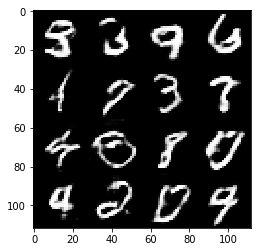

Timestamp 20170804-22-45-02.059 -  Epoch 2/2 -  Step 7610 -  D Loss: 1.0774 - G Loss: 2.9034
Timestamp 20170804-22-45-09.313 -  Epoch 2/2 -  Step 7620 -  D Loss: 1.0773 - G Loss: 1.6657
Timestamp 20170804-22-45-16.558 -  Epoch 2/2 -  Step 7630 -  D Loss: 1.0598 - G Loss: 1.3142
Timestamp 20170804-22-45-23.810 -  Epoch 2/2 -  Step 7640 -  D Loss: 0.8730 - G Loss: 1.1239
Timestamp 20170804-22-45-31.055 -  Epoch 2/2 -  Step 7650 -  D Loss: 0.7618 - G Loss: 1.7869
Timestamp 20170804-22-45-38.290 -  Epoch 2/2 -  Step 7660 -  D Loss: 0.7840 - G Loss: 1.5488
Timestamp 20170804-22-45-45.525 -  Epoch 2/2 -  Step 7670 -  D Loss: 0.8838 - G Loss: 1.2072
Timestamp 20170804-22-45-52.776 -  Epoch 2/2 -  Step 7680 -  D Loss: 0.6987 - G Loss: 3.1717
Timestamp 20170804-22-46-00.011 -  Epoch 2/2 -  Step 7690 -  D Loss: 0.7122 - G Loss: 2.2504
Timestamp 20170804-22-46-07.282 -  Epoch 2/2 -  Step 7700 -  D Loss: 1.0323 - G Loss: 2.8969


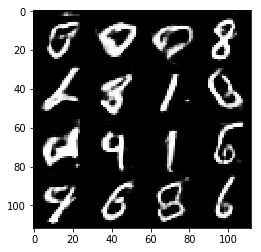

Timestamp 20170804-22-46-15.151 -  Epoch 2/2 -  Step 7710 -  D Loss: 0.8378 - G Loss: 1.9020
Timestamp 20170804-22-46-22.403 -  Epoch 2/2 -  Step 7720 -  D Loss: 1.0401 - G Loss: 1.0313
Timestamp 20170804-22-46-29.652 -  Epoch 2/2 -  Step 7730 -  D Loss: 1.2116 - G Loss: 1.2177
Timestamp 20170804-22-46-36.899 -  Epoch 2/2 -  Step 7740 -  D Loss: 0.8137 - G Loss: 1.1563
Timestamp 20170804-22-46-44.148 -  Epoch 2/2 -  Step 7750 -  D Loss: 0.9019 - G Loss: 1.0068
Timestamp 20170804-22-46-51.385 -  Epoch 2/2 -  Step 7760 -  D Loss: 0.7627 - G Loss: 2.2891
Timestamp 20170804-22-46-58.637 -  Epoch 2/2 -  Step 7770 -  D Loss: 0.8451 - G Loss: 1.6395
Timestamp 20170804-22-47-05.884 -  Epoch 2/2 -  Step 7780 -  D Loss: 0.8941 - G Loss: 1.3529
Timestamp 20170804-22-47-13.136 -  Epoch 2/2 -  Step 7790 -  D Loss: 0.7055 - G Loss: 1.0894
Timestamp 20170804-22-47-20.369 -  Epoch 2/2 -  Step 7800 -  D Loss: 0.7847 - G Loss: 1.9162


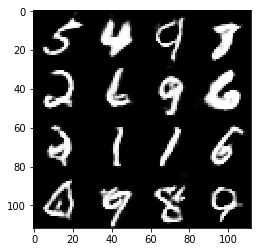

Timestamp 20170804-22-47-28.269 -  Epoch 2/2 -  Step 7810 -  D Loss: 0.6234 - G Loss: 2.2687
Timestamp 20170804-22-47-35.514 -  Epoch 2/2 -  Step 7820 -  D Loss: 1.1255 - G Loss: 2.1481
Timestamp 20170804-22-47-42.762 -  Epoch 2/2 -  Step 7830 -  D Loss: 0.9690 - G Loss: 1.2471
Timestamp 20170804-22-47-50.016 -  Epoch 2/2 -  Step 7840 -  D Loss: 1.4929 - G Loss: 0.8750
Timestamp 20170804-22-47-57.263 -  Epoch 2/2 -  Step 7850 -  D Loss: 0.9038 - G Loss: 1.0077
Timestamp 20170804-22-48-04.511 -  Epoch 2/2 -  Step 7860 -  D Loss: 1.0081 - G Loss: 2.7117
Timestamp 20170804-22-48-11.748 -  Epoch 2/2 -  Step 7870 -  D Loss: 0.6093 - G Loss: 2.9153
Timestamp 20170804-22-48-18.990 -  Epoch 2/2 -  Step 7880 -  D Loss: 0.7531 - G Loss: 2.5206
Timestamp 20170804-22-48-26.228 -  Epoch 2/2 -  Step 7890 -  D Loss: 0.8419 - G Loss: 1.5426
Timestamp 20170804-22-48-33.475 -  Epoch 2/2 -  Step 7900 -  D Loss: 0.7545 - G Loss: 1.3722


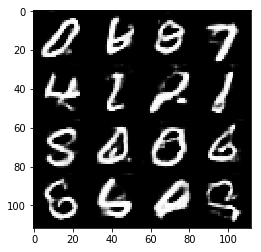

Timestamp 20170804-22-48-41.404 -  Epoch 2/2 -  Step 7910 -  D Loss: 1.3097 - G Loss: 0.7528
Timestamp 20170804-22-48-48.655 -  Epoch 2/2 -  Step 7920 -  D Loss: 0.7489 - G Loss: 1.8071
Timestamp 20170804-22-48-55.924 -  Epoch 2/2 -  Step 7930 -  D Loss: 0.9979 - G Loss: 1.6415
Timestamp 20170804-22-49-03.189 -  Epoch 2/2 -  Step 7940 -  D Loss: 0.4615 - G Loss: 1.5917
Timestamp 20170804-22-49-10.445 -  Epoch 2/2 -  Step 7950 -  D Loss: 0.9683 - G Loss: 1.4094
Timestamp 20170804-22-49-17.682 -  Epoch 2/2 -  Step 7960 -  D Loss: 0.5925 - G Loss: 2.6876
Timestamp 20170804-22-49-24.933 -  Epoch 2/2 -  Step 7970 -  D Loss: 1.0330 - G Loss: 1.2271
Timestamp 20170804-22-49-32.173 -  Epoch 2/2 -  Step 7980 -  D Loss: 0.8499 - G Loss: 0.7678
Timestamp 20170804-22-49-39.425 -  Epoch 2/2 -  Step 7990 -  D Loss: 0.6538 - G Loss: 1.7496
Timestamp 20170804-22-49-46.671 -  Epoch 2/2 -  Step 8000 -  D Loss: 0.7111 - G Loss: 2.0809


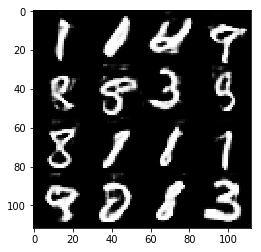

Timestamp 20170804-22-49-54.545 -  Epoch 2/2 -  Step 8010 -  D Loss: 0.6371 - G Loss: 1.8108
Timestamp 20170804-22-50-01.805 -  Epoch 2/2 -  Step 8020 -  D Loss: 1.0482 - G Loss: 1.6697
Timestamp 20170804-22-50-09.048 -  Epoch 2/2 -  Step 8030 -  D Loss: 0.9940 - G Loss: 1.2717
Timestamp 20170804-22-50-16.282 -  Epoch 2/2 -  Step 8040 -  D Loss: 0.8439 - G Loss: 1.8135
Timestamp 20170804-22-50-23.517 -  Epoch 2/2 -  Step 8050 -  D Loss: 0.9136 - G Loss: 2.5067
Timestamp 20170804-22-50-30.768 -  Epoch 2/2 -  Step 8060 -  D Loss: 1.1104 - G Loss: 1.6256
Timestamp 20170804-22-50-38.030 -  Epoch 2/2 -  Step 8070 -  D Loss: 0.8409 - G Loss: 1.6333
Timestamp 20170804-22-50-45.279 -  Epoch 2/2 -  Step 8080 -  D Loss: 0.7170 - G Loss: 2.1429
Timestamp 20170804-22-50-52.525 -  Epoch 2/2 -  Step 8090 -  D Loss: 0.8389 - G Loss: 1.5182
Timestamp 20170804-22-50-59.749 -  Epoch 2/2 -  Step 8100 -  D Loss: 0.9038 - G Loss: 1.3254


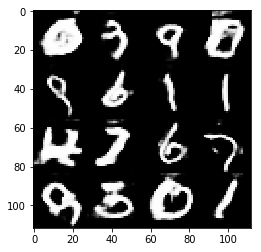

Timestamp 20170804-22-51-07.663 -  Epoch 2/2 -  Step 8110 -  D Loss: 0.6805 - G Loss: 2.0532
Timestamp 20170804-22-51-14.904 -  Epoch 2/2 -  Step 8120 -  D Loss: 1.0391 - G Loss: 2.0987
Timestamp 20170804-22-51-22.158 -  Epoch 2/2 -  Step 8130 -  D Loss: 0.6855 - G Loss: 1.2901
Timestamp 20170804-22-51-29.412 -  Epoch 2/2 -  Step 8140 -  D Loss: 0.8201 - G Loss: 1.9929
Timestamp 20170804-22-51-36.656 -  Epoch 2/2 -  Step 8150 -  D Loss: 0.5227 - G Loss: 1.7446
Timestamp 20170804-22-51-43.902 -  Epoch 2/2 -  Step 8160 -  D Loss: 0.7638 - G Loss: 1.8736
Timestamp 20170804-22-51-51.149 -  Epoch 2/2 -  Step 8170 -  D Loss: 0.8923 - G Loss: 2.1358
Timestamp 20170804-22-51-58.403 -  Epoch 2/2 -  Step 8180 -  D Loss: 1.2566 - G Loss: 0.9977
Timestamp 20170804-22-52-05.658 -  Epoch 2/2 -  Step 8190 -  D Loss: 0.6055 - G Loss: 1.7169
Timestamp 20170804-22-52-12.908 -  Epoch 2/2 -  Step 8200 -  D Loss: 0.9083 - G Loss: 1.9985


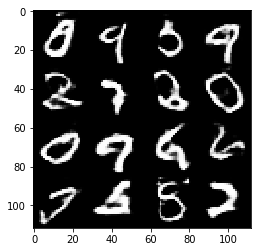

Timestamp 20170804-22-52-20.798 -  Epoch 2/2 -  Step 8210 -  D Loss: 0.8245 - G Loss: 1.0385
Timestamp 20170804-22-52-28.033 -  Epoch 2/2 -  Step 8220 -  D Loss: 0.6460 - G Loss: 1.4925
Timestamp 20170804-22-52-35.270 -  Epoch 2/2 -  Step 8230 -  D Loss: 1.0463 - G Loss: 0.8567
Timestamp 20170804-22-52-42.518 -  Epoch 2/2 -  Step 8240 -  D Loss: 1.3219 - G Loss: 0.7437
Timestamp 20170804-22-52-49.755 -  Epoch 2/2 -  Step 8250 -  D Loss: 0.7158 - G Loss: 2.1483
Timestamp 20170804-22-52-57.003 -  Epoch 2/2 -  Step 8260 -  D Loss: 0.7106 - G Loss: 1.4054
Timestamp 20170804-22-53-04.267 -  Epoch 2/2 -  Step 8270 -  D Loss: 0.6857 - G Loss: 1.2752
Timestamp 20170804-22-53-11.522 -  Epoch 2/2 -  Step 8280 -  D Loss: 0.6288 - G Loss: 3.7865
Timestamp 20170804-22-53-18.767 -  Epoch 2/2 -  Step 8290 -  D Loss: 1.1710 - G Loss: 1.5301
Timestamp 20170804-22-53-26.015 -  Epoch 2/2 -  Step 8300 -  D Loss: 0.6830 - G Loss: 1.3097


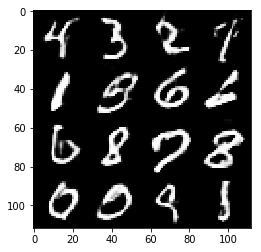

Timestamp 20170804-22-53-33.887 -  Epoch 2/2 -  Step 8310 -  D Loss: 0.4835 - G Loss: 2.5343
Timestamp 20170804-22-53-41.144 -  Epoch 2/2 -  Step 8320 -  D Loss: 1.0040 - G Loss: 1.9373
Timestamp 20170804-22-53-48.378 -  Epoch 2/2 -  Step 8330 -  D Loss: 0.9605 - G Loss: 2.2181
Timestamp 20170804-22-53-55.635 -  Epoch 2/2 -  Step 8340 -  D Loss: 1.1165 - G Loss: 1.0245
Timestamp 20170804-22-54-02.896 -  Epoch 2/2 -  Step 8350 -  D Loss: 0.5396 - G Loss: 2.0923
Timestamp 20170804-22-54-10.140 -  Epoch 2/2 -  Step 8360 -  D Loss: 0.7125 - G Loss: 1.1315
Timestamp 20170804-22-54-17.391 -  Epoch 2/2 -  Step 8370 -  D Loss: 0.9025 - G Loss: 1.5147
Timestamp 20170804-22-54-24.658 -  Epoch 2/2 -  Step 8380 -  D Loss: 0.7337 - G Loss: 1.2338
Timestamp 20170804-22-54-31.889 -  Epoch 2/2 -  Step 8390 -  D Loss: 0.7029 - G Loss: 2.2209
Timestamp 20170804-22-54-39.129 -  Epoch 2/2 -  Step 8400 -  D Loss: 0.7938 - G Loss: 1.6304


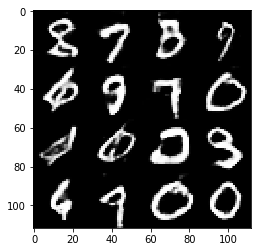

Timestamp 20170804-22-54-47.391 -  Epoch 2/2 -  Step 8410 -  D Loss: 0.5645 - G Loss: 2.1245
Timestamp 20170804-22-54-54.651 -  Epoch 2/2 -  Step 8420 -  D Loss: 1.0468 - G Loss: 2.3822
Timestamp 20170804-22-55-01.885 -  Epoch 2/2 -  Step 8430 -  D Loss: 0.9241 - G Loss: 2.1069
Timestamp 20170804-22-55-09.118 -  Epoch 2/2 -  Step 8440 -  D Loss: 0.5786 - G Loss: 0.9642
Timestamp 20170804-22-55-16.369 -  Epoch 2/2 -  Step 8450 -  D Loss: 0.8456 - G Loss: 1.1790
Timestamp 20170804-22-55-23.609 -  Epoch 2/2 -  Step 8460 -  D Loss: 1.3959 - G Loss: 0.8678
Timestamp 20170804-22-55-30.873 -  Epoch 2/2 -  Step 8470 -  D Loss: 0.9895 - G Loss: 2.1860
Timestamp 20170804-22-55-38.129 -  Epoch 2/2 -  Step 8480 -  D Loss: 1.1181 - G Loss: 1.5294
Timestamp 20170804-22-55-45.386 -  Epoch 2/2 -  Step 8490 -  D Loss: 0.9847 - G Loss: 1.3463
Timestamp 20170804-22-55-52.647 -  Epoch 2/2 -  Step 8500 -  D Loss: 0.7128 - G Loss: 2.5355


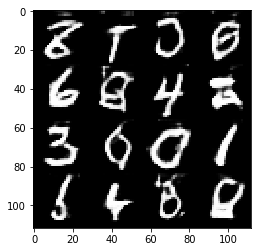

Timestamp 20170804-22-56-00.538 -  Epoch 2/2 -  Step 8510 -  D Loss: 0.7230 - G Loss: 2.4498
Timestamp 20170804-22-56-07.794 -  Epoch 2/2 -  Step 8520 -  D Loss: 0.6217 - G Loss: 2.5573
Timestamp 20170804-22-56-15.033 -  Epoch 2/2 -  Step 8530 -  D Loss: 1.3357 - G Loss: 0.8493
Timestamp 20170804-22-56-22.288 -  Epoch 2/2 -  Step 8540 -  D Loss: 0.7925 - G Loss: 2.7657
Timestamp 20170804-22-56-29.535 -  Epoch 2/2 -  Step 8550 -  D Loss: 0.7308 - G Loss: 1.4370
Timestamp 20170804-22-56-36.796 -  Epoch 2/2 -  Step 8560 -  D Loss: 0.8450 - G Loss: 1.4587
Timestamp 20170804-22-56-44.051 -  Epoch 2/2 -  Step 8570 -  D Loss: 1.6165 - G Loss: 1.0004
Timestamp 20170804-22-56-51.313 -  Epoch 2/2 -  Step 8580 -  D Loss: 0.8254 - G Loss: 1.4397
Timestamp 20170804-22-56-58.574 -  Epoch 2/2 -  Step 8590 -  D Loss: 0.8301 - G Loss: 2.0553
Timestamp 20170804-22-57-05.821 -  Epoch 2/2 -  Step 8600 -  D Loss: 1.0267 - G Loss: 1.0742


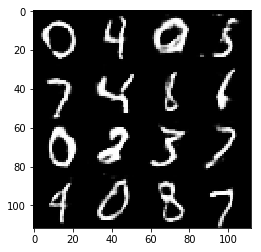

Timestamp 20170804-22-57-13.697 -  Epoch 2/2 -  Step 8610 -  D Loss: 0.9182 - G Loss: 2.1617
Timestamp 20170804-22-57-20.936 -  Epoch 2/2 -  Step 8620 -  D Loss: 0.5210 - G Loss: 2.6167
Timestamp 20170804-22-57-28.195 -  Epoch 2/2 -  Step 8630 -  D Loss: 0.8021 - G Loss: 1.8236
Timestamp 20170804-22-57-35.441 -  Epoch 2/2 -  Step 8640 -  D Loss: 1.5050 - G Loss: 1.7627
Timestamp 20170804-22-57-42.694 -  Epoch 2/2 -  Step 8650 -  D Loss: 0.7762 - G Loss: 1.5013
Timestamp 20170804-22-57-49.934 -  Epoch 2/2 -  Step 8660 -  D Loss: 0.7317 - G Loss: 0.8483
Timestamp 20170804-22-57-57.173 -  Epoch 2/2 -  Step 8670 -  D Loss: 0.6203 - G Loss: 1.6986
Timestamp 20170804-22-58-04.432 -  Epoch 2/2 -  Step 8680 -  D Loss: 0.7835 - G Loss: 1.8818
Timestamp 20170804-22-58-11.688 -  Epoch 2/2 -  Step 8690 -  D Loss: 0.9817 - G Loss: 0.9082
Timestamp 20170804-22-58-18.953 -  Epoch 2/2 -  Step 8700 -  D Loss: 1.1370 - G Loss: 0.9645


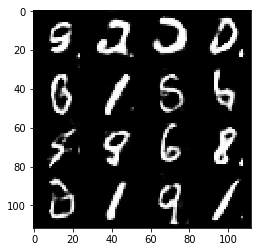

Timestamp 20170804-22-58-26.871 -  Epoch 2/2 -  Step 8710 -  D Loss: 0.9051 - G Loss: 1.6335
Timestamp 20170804-22-58-34.117 -  Epoch 2/2 -  Step 8720 -  D Loss: 1.3462 - G Loss: 1.1935
Timestamp 20170804-22-58-41.371 -  Epoch 2/2 -  Step 8730 -  D Loss: 0.9145 - G Loss: 2.1554
Timestamp 20170804-22-58-48.623 -  Epoch 2/2 -  Step 8740 -  D Loss: 0.8893 - G Loss: 2.2524
Timestamp 20170804-22-58-55.871 -  Epoch 2/2 -  Step 8750 -  D Loss: 1.2038 - G Loss: 2.1358
Timestamp 20170804-22-59-03.131 -  Epoch 2/2 -  Step 8760 -  D Loss: 0.5902 - G Loss: 1.7392
Timestamp 20170804-22-59-10.370 -  Epoch 2/2 -  Step 8770 -  D Loss: 0.7042 - G Loss: 2.2196
Timestamp 20170804-22-59-17.643 -  Epoch 2/2 -  Step 8780 -  D Loss: 1.2612 - G Loss: 1.1226
Timestamp 20170804-22-59-24.887 -  Epoch 2/2 -  Step 8790 -  D Loss: 0.7138 - G Loss: 1.7520
Timestamp 20170804-22-59-32.145 -  Epoch 2/2 -  Step 8800 -  D Loss: 1.0886 - G Loss: 1.6082


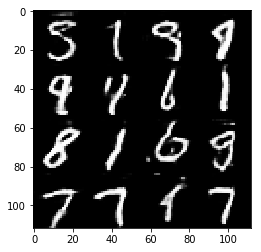

Timestamp 20170804-22-59-40.032 -  Epoch 2/2 -  Step 8810 -  D Loss: 0.9076 - G Loss: 1.5001
Timestamp 20170804-22-59-47.297 -  Epoch 2/2 -  Step 8820 -  D Loss: 1.0184 - G Loss: 1.3954
Timestamp 20170804-22-59-54.529 -  Epoch 2/2 -  Step 8830 -  D Loss: 0.8459 - G Loss: 1.0603
Timestamp 20170804-23-00-01.786 -  Epoch 2/2 -  Step 8840 -  D Loss: 1.2557 - G Loss: 2.0536
Timestamp 20170804-23-00-09.050 -  Epoch 2/2 -  Step 8850 -  D Loss: 1.1451 - G Loss: 0.7420
Timestamp 20170804-23-00-16.307 -  Epoch 2/2 -  Step 8860 -  D Loss: 0.5764 - G Loss: 1.8764
Timestamp 20170804-23-00-23.547 -  Epoch 2/2 -  Step 8870 -  D Loss: 1.2272 - G Loss: 1.0288
Timestamp 20170804-23-00-30.791 -  Epoch 2/2 -  Step 8880 -  D Loss: 0.6984 - G Loss: 3.2077
Timestamp 20170804-23-00-38.040 -  Epoch 2/2 -  Step 8890 -  D Loss: 0.7199 - G Loss: 2.3046
Timestamp 20170804-23-00-45.275 -  Epoch 2/2 -  Step 8900 -  D Loss: 1.0522 - G Loss: 1.7495


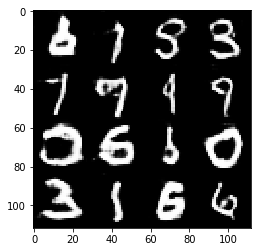

Timestamp 20170804-23-00-53.204 -  Epoch 2/2 -  Step 8910 -  D Loss: 0.7242 - G Loss: 2.5073
Timestamp 20170804-23-01-00.451 -  Epoch 2/2 -  Step 8920 -  D Loss: 0.5281 - G Loss: 4.1101
Timestamp 20170804-23-01-07.690 -  Epoch 2/2 -  Step 8930 -  D Loss: 0.5083 - G Loss: 2.5074
Timestamp 20170804-23-01-14.943 -  Epoch 2/2 -  Step 8940 -  D Loss: 0.7790 - G Loss: 1.8535
Timestamp 20170804-23-01-22.185 -  Epoch 2/2 -  Step 8950 -  D Loss: 0.6336 - G Loss: 2.2046
Timestamp 20170804-23-01-29.447 -  Epoch 2/2 -  Step 8960 -  D Loss: 0.6873 - G Loss: 1.2562
Timestamp 20170804-23-01-36.685 -  Epoch 2/2 -  Step 8970 -  D Loss: 0.8783 - G Loss: 1.2465
Timestamp 20170804-23-01-43.944 -  Epoch 2/2 -  Step 8980 -  D Loss: 0.7000 - G Loss: 1.1462
Timestamp 20170804-23-01-51.188 -  Epoch 2/2 -  Step 8990 -  D Loss: 0.5985 - G Loss: 2.6651
Timestamp 20170804-23-01-58.448 -  Epoch 2/2 -  Step 9000 -  D Loss: 1.1080 - G Loss: 1.7972


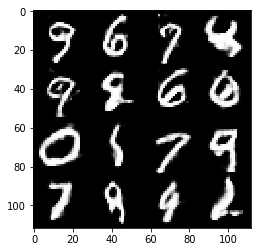

Timestamp 20170804-23-02-06.347 -  Epoch 2/2 -  Step 9010 -  D Loss: 0.5868 - G Loss: 1.9831
Timestamp 20170804-23-02-13.604 -  Epoch 2/2 -  Step 9020 -  D Loss: 1.1199 - G Loss: 2.5635
Timestamp 20170804-23-02-20.862 -  Epoch 2/2 -  Step 9030 -  D Loss: 0.5903 - G Loss: 2.9838
Timestamp 20170804-23-02-28.119 -  Epoch 2/2 -  Step 9040 -  D Loss: 0.7764 - G Loss: 2.6910
Timestamp 20170804-23-02-35.374 -  Epoch 2/2 -  Step 9050 -  D Loss: 1.0348 - G Loss: 1.0122
Timestamp 20170804-23-02-42.630 -  Epoch 2/2 -  Step 9060 -  D Loss: 0.5695 - G Loss: 1.8110
Timestamp 20170804-23-02-49.892 -  Epoch 2/2 -  Step 9070 -  D Loss: 0.6004 - G Loss: 2.6065
Timestamp 20170804-23-02-57.129 -  Epoch 2/2 -  Step 9080 -  D Loss: 0.9000 - G Loss: 1.3581
Timestamp 20170804-23-03-04.388 -  Epoch 2/2 -  Step 9090 -  D Loss: 0.5846 - G Loss: 2.5677
Timestamp 20170804-23-03-11.643 -  Epoch 2/2 -  Step 9100 -  D Loss: 0.5883 - G Loss: 2.4950


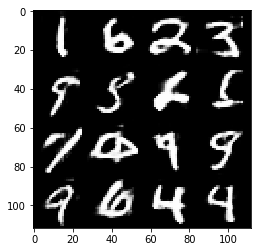

Timestamp 20170804-23-03-19.558 -  Epoch 2/2 -  Step 9110 -  D Loss: 0.8389 - G Loss: 1.3416
Timestamp 20170804-23-03-26.789 -  Epoch 2/2 -  Step 9120 -  D Loss: 1.2761 - G Loss: 1.5853
Timestamp 20170804-23-03-34.035 -  Epoch 2/2 -  Step 9130 -  D Loss: 0.4704 - G Loss: 2.7042
Timestamp 20170804-23-03-41.272 -  Epoch 2/2 -  Step 9140 -  D Loss: 0.8689 - G Loss: 2.2939
Timestamp 20170804-23-03-48.531 -  Epoch 2/2 -  Step 9150 -  D Loss: 0.7886 - G Loss: 1.9628
Timestamp 20170804-23-03-55.788 -  Epoch 2/2 -  Step 9160 -  D Loss: 0.5470 - G Loss: 1.2375
Timestamp 20170804-23-04-03.035 -  Epoch 2/2 -  Step 9170 -  D Loss: 0.6268 - G Loss: 2.8855
Timestamp 20170804-23-04-10.286 -  Epoch 2/2 -  Step 9180 -  D Loss: 1.0210 - G Loss: 1.7734
Timestamp 20170804-23-04-17.536 -  Epoch 2/2 -  Step 9190 -  D Loss: 0.5874 - G Loss: 2.7123
Timestamp 20170804-23-04-24.788 -  Epoch 2/2 -  Step 9200 -  D Loss: 0.9682 - G Loss: 2.2115


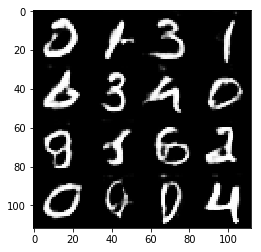

Timestamp 20170804-23-04-32.690 -  Epoch 2/2 -  Step 9210 -  D Loss: 0.9379 - G Loss: 1.8159
Timestamp 20170804-23-04-39.932 -  Epoch 2/2 -  Step 9220 -  D Loss: 0.8672 - G Loss: 1.2691
Timestamp 20170804-23-04-47.177 -  Epoch 2/2 -  Step 9230 -  D Loss: 0.9885 - G Loss: 1.8118
Timestamp 20170804-23-04-54.419 -  Epoch 2/2 -  Step 9240 -  D Loss: 0.7947 - G Loss: 2.1232
Timestamp 20170804-23-05-01.666 -  Epoch 2/2 -  Step 9250 -  D Loss: 0.5897 - G Loss: 3.0188
Timestamp 20170804-23-05-08.918 -  Epoch 2/2 -  Step 9260 -  D Loss: 1.4661 - G Loss: 0.7039
Timestamp 20170804-23-05-16.163 -  Epoch 2/2 -  Step 9270 -  D Loss: 1.2144 - G Loss: 1.5208
Timestamp 20170804-23-05-23.399 -  Epoch 2/2 -  Step 9280 -  D Loss: 0.7587 - G Loss: 0.8850
Timestamp 20170804-23-05-30.641 -  Epoch 2/2 -  Step 9290 -  D Loss: 0.9432 - G Loss: 1.5848
Timestamp 20170804-23-05-37.856 -  Epoch 2/2 -  Step 9300 -  D Loss: 0.8596 - G Loss: 1.8752


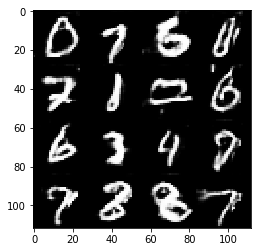

Timestamp 20170804-23-05-45.775 -  Epoch 2/2 -  Step 9310 -  D Loss: 0.5082 - G Loss: 1.8964
Timestamp 20170804-23-05-53.012 -  Epoch 2/2 -  Step 9320 -  D Loss: 0.5426 - G Loss: 1.9006
Timestamp 20170804-23-06-00.245 -  Epoch 2/2 -  Step 9330 -  D Loss: 0.5258 - G Loss: 2.1137
Timestamp 20170804-23-06-07.508 -  Epoch 2/2 -  Step 9340 -  D Loss: 0.5933 - G Loss: 3.0719
Timestamp 20170804-23-06-14.751 -  Epoch 2/2 -  Step 9350 -  D Loss: 0.6671 - G Loss: 1.7472
Timestamp 20170804-23-06-22.014 -  Epoch 2/2 -  Step 9360 -  D Loss: 1.1652 - G Loss: 1.8333
Timestamp 20170804-23-06-29.268 -  Epoch 2/2 -  Step 9370 -  D Loss: 1.1827 - G Loss: 2.5542
Timestamp 20170804-23-06-36.514 -  Epoch 2/2 -  Step 9380 -  D Loss: 0.4647 - G Loss: 1.8318
Timestamp 20170804-23-06-43.750 -  Epoch 2/2 -  Step 9390 -  D Loss: 0.7760 - G Loss: 1.2814
Timestamp 20170804-23-06-50.995 -  Epoch 2/2 -  Step 9400 -  D Loss: 0.7080 - G Loss: 2.0873


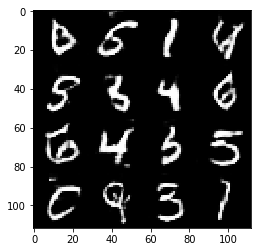

Timestamp 20170804-23-06-58.972 -  Epoch 2/2 -  Step 9410 -  D Loss: 0.5082 - G Loss: 1.7515
Timestamp 20170804-23-07-06.204 -  Epoch 2/2 -  Step 9420 -  D Loss: 0.3913 - G Loss: 3.9402
Timestamp 20170804-23-07-13.441 -  Epoch 2/2 -  Step 9430 -  D Loss: 0.5275 - G Loss: 1.7605
Timestamp 20170804-23-07-20.676 -  Epoch 2/2 -  Step 9440 -  D Loss: 0.9914 - G Loss: 2.2318
Timestamp 20170804-23-07-27.918 -  Epoch 2/2 -  Step 9450 -  D Loss: 1.0007 - G Loss: 1.3392
Timestamp 20170804-23-07-35.169 -  Epoch 2/2 -  Step 9460 -  D Loss: 1.2352 - G Loss: 0.8360
Timestamp 20170804-23-07-42.437 -  Epoch 2/2 -  Step 9470 -  D Loss: 0.6195 - G Loss: 2.4988
Timestamp 20170804-23-07-49.679 -  Epoch 2/2 -  Step 9480 -  D Loss: 0.8311 - G Loss: 1.2304
Timestamp 20170804-23-07-56.919 -  Epoch 2/2 -  Step 9490 -  D Loss: 0.6877 - G Loss: 1.4551
Timestamp 20170804-23-08-04.164 -  Epoch 2/2 -  Step 9500 -  D Loss: 0.7040 - G Loss: 2.1783


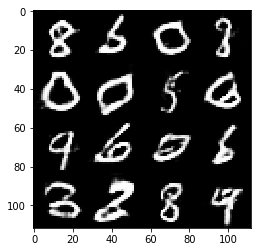

Timestamp 20170804-23-08-12.085 -  Epoch 2/2 -  Step 9510 -  D Loss: 0.9108 - G Loss: 1.7024
Timestamp 20170804-23-08-19.368 -  Epoch 2/2 -  Step 9520 -  D Loss: 0.6423 - G Loss: 1.4351
Timestamp 20170804-23-08-26.595 -  Epoch 2/2 -  Step 9530 -  D Loss: 0.6186 - G Loss: 2.7753
Timestamp 20170804-23-08-33.844 -  Epoch 2/2 -  Step 9540 -  D Loss: 0.7202 - G Loss: 2.3060
Timestamp 20170804-23-08-41.098 -  Epoch 2/2 -  Step 9550 -  D Loss: 0.8374 - G Loss: 2.0484
Timestamp 20170804-23-08-48.343 -  Epoch 2/2 -  Step 9560 -  D Loss: 1.2485 - G Loss: 0.9589
Timestamp 20170804-23-08-55.603 -  Epoch 2/2 -  Step 9570 -  D Loss: 0.7791 - G Loss: 1.6407
Timestamp 20170804-23-09-02.854 -  Epoch 2/2 -  Step 9580 -  D Loss: 0.6523 - G Loss: 1.4136
Timestamp 20170804-23-09-10.107 -  Epoch 2/2 -  Step 9590 -  D Loss: 0.6110 - G Loss: 1.5917
Timestamp 20170804-23-09-17.359 -  Epoch 2/2 -  Step 9600 -  D Loss: 0.6594 - G Loss: 0.5189


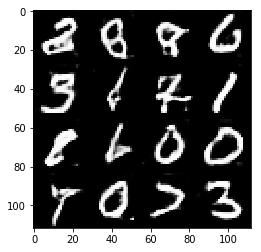

Timestamp 20170804-23-09-25.275 -  Epoch 2/2 -  Step 9610 -  D Loss: 0.7448 - G Loss: 2.0905
Timestamp 20170804-23-09-32.529 -  Epoch 2/2 -  Step 9620 -  D Loss: 0.6422 - G Loss: 1.3318
Timestamp 20170804-23-09-39.790 -  Epoch 2/2 -  Step 9630 -  D Loss: 0.7591 - G Loss: 0.9564
Timestamp 20170804-23-09-47.041 -  Epoch 2/2 -  Step 9640 -  D Loss: 0.6197 - G Loss: 1.8506
Timestamp 20170804-23-09-54.288 -  Epoch 2/2 -  Step 9650 -  D Loss: 0.6856 - G Loss: 1.3921
Timestamp 20170804-23-10-01.527 -  Epoch 2/2 -  Step 9660 -  D Loss: 0.7790 - G Loss: 2.1693
Timestamp 20170804-23-10-08.782 -  Epoch 2/2 -  Step 9670 -  D Loss: 0.7364 - G Loss: 2.0070
Timestamp 20170804-23-10-16.015 -  Epoch 2/2 -  Step 9680 -  D Loss: 0.8347 - G Loss: 1.6257
Timestamp 20170804-23-10-23.258 -  Epoch 2/2 -  Step 9690 -  D Loss: 0.8793 - G Loss: 1.1480
Timestamp 20170804-23-10-30.502 -  Epoch 2/2 -  Step 9700 -  D Loss: 0.7269 - G Loss: 1.6225


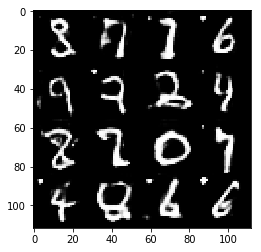

Timestamp 20170804-23-10-38.400 -  Epoch 2/2 -  Step 9710 -  D Loss: 1.0072 - G Loss: 1.9277
Timestamp 20170804-23-10-45.649 -  Epoch 2/2 -  Step 9720 -  D Loss: 0.7213 - G Loss: 1.5099
Timestamp 20170804-23-10-52.907 -  Epoch 2/2 -  Step 9730 -  D Loss: 0.7272 - G Loss: 1.7850
Timestamp 20170804-23-11-00.150 -  Epoch 2/2 -  Step 9740 -  D Loss: 0.7839 - G Loss: 2.3973
Timestamp 20170804-23-11-07.391 -  Epoch 2/2 -  Step 9750 -  D Loss: 1.2435 - G Loss: 1.5788
Timestamp 20170804-23-11-14.634 -  Epoch 2/2 -  Step 9760 -  D Loss: 0.7552 - G Loss: 2.8266
Timestamp 20170804-23-11-21.878 -  Epoch 2/2 -  Step 9770 -  D Loss: 0.9484 - G Loss: 2.0247
Timestamp 20170804-23-11-29.124 -  Epoch 2/2 -  Step 9780 -  D Loss: 0.5919 - G Loss: 2.0574
Timestamp 20170804-23-11-36.365 -  Epoch 2/2 -  Step 9790 -  D Loss: 1.1522 - G Loss: 1.0644
Timestamp 20170804-23-11-43.602 -  Epoch 2/2 -  Step 9800 -  D Loss: 0.9424 - G Loss: 1.8267


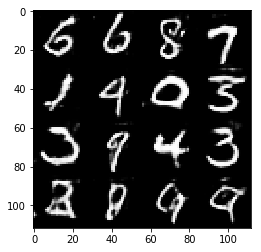

Timestamp 20170804-23-11-51.524 -  Epoch 2/2 -  Step 9810 -  D Loss: 1.1964 - G Loss: 1.2473
Timestamp 20170804-23-11-58.765 -  Epoch 2/2 -  Step 9820 -  D Loss: 1.1075 - G Loss: 1.6866
Timestamp 20170804-23-12-06.018 -  Epoch 2/2 -  Step 9830 -  D Loss: 0.7946 - G Loss: 2.6807
Timestamp 20170804-23-12-13.276 -  Epoch 2/2 -  Step 9840 -  D Loss: 0.6654 - G Loss: 2.1941
Timestamp 20170804-23-12-20.526 -  Epoch 2/2 -  Step 9850 -  D Loss: 0.9162 - G Loss: 1.7951
Timestamp 20170804-23-12-27.761 -  Epoch 2/2 -  Step 9860 -  D Loss: 0.9785 - G Loss: 3.0055
Timestamp 20170804-23-12-35.015 -  Epoch 2/2 -  Step 9870 -  D Loss: 0.7922 - G Loss: 1.5419
Timestamp 20170804-23-12-42.260 -  Epoch 2/2 -  Step 9880 -  D Loss: 0.8014 - G Loss: 2.4451
Timestamp 20170804-23-12-49.507 -  Epoch 2/2 -  Step 9890 -  D Loss: 1.1808 - G Loss: 1.3083
Timestamp 20170804-23-12-56.749 -  Epoch 2/2 -  Step 9900 -  D Loss: 0.9123 - G Loss: 3.2293


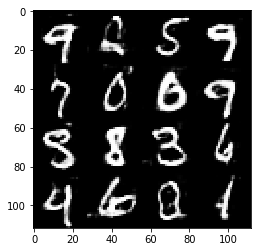

Timestamp 20170804-23-13-04.709 -  Epoch 2/2 -  Step 9910 -  D Loss: 0.5649 - G Loss: 1.5995
Timestamp 20170804-23-13-11.966 -  Epoch 2/2 -  Step 9920 -  D Loss: 0.9986 - G Loss: 1.5132
Timestamp 20170804-23-13-19.222 -  Epoch 2/2 -  Step 9930 -  D Loss: 0.7750 - G Loss: 1.8639
Timestamp 20170804-23-13-26.468 -  Epoch 2/2 -  Step 9940 -  D Loss: 0.8531 - G Loss: 1.6801
Timestamp 20170804-23-13-33.730 -  Epoch 2/2 -  Step 9950 -  D Loss: 0.4578 - G Loss: 1.9884
Timestamp 20170804-23-13-41.022 -  Epoch 2/2 -  Step 9960 -  D Loss: 0.4594 - G Loss: 2.9100
Timestamp 20170804-23-13-48.281 -  Epoch 2/2 -  Step 9970 -  D Loss: 0.7291 - G Loss: 1.8526
Timestamp 20170804-23-13-55.543 -  Epoch 2/2 -  Step 9980 -  D Loss: 0.7743 - G Loss: 1.7168
Timestamp 20170804-23-14-02.793 -  Epoch 2/2 -  Step 9990 -  D Loss: 0.5092 - G Loss: 1.4880
Timestamp 20170804-23-14-10.046 -  Epoch 2/2 -  Step 10000 -  D Loss: 1.4019 - G Loss: 1.4452


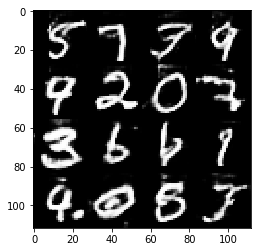

Timestamp 20170804-23-14-17.994 -  Epoch 2/2 -  Step 10010 -  D Loss: 0.8264 - G Loss: 0.8751
Timestamp 20170804-23-14-25.260 -  Epoch 2/2 -  Step 10020 -  D Loss: 1.4975 - G Loss: 1.0048
Timestamp 20170804-23-14-32.510 -  Epoch 2/2 -  Step 10030 -  D Loss: 1.0235 - G Loss: 1.2916
Timestamp 20170804-23-14-39.764 -  Epoch 2/2 -  Step 10040 -  D Loss: 0.9101 - G Loss: 1.2972
Timestamp 20170804-23-14-47.015 -  Epoch 2/2 -  Step 10050 -  D Loss: 0.9970 - G Loss: 1.4137
Timestamp 20170804-23-14-54.281 -  Epoch 2/2 -  Step 10060 -  D Loss: 0.9087 - G Loss: 1.9849
Timestamp 20170804-23-15-01.532 -  Epoch 2/2 -  Step 10070 -  D Loss: 0.6812 - G Loss: 2.1792
Timestamp 20170804-23-15-08.790 -  Epoch 2/2 -  Step 10080 -  D Loss: 0.5839 - G Loss: 2.1936
Timestamp 20170804-23-15-16.035 -  Epoch 2/2 -  Step 10090 -  D Loss: 0.7161 - G Loss: 1.9701
Timestamp 20170804-23-15-23.291 -  Epoch 2/2 -  Step 10100 -  D Loss: 0.5895 - G Loss: 2.2437


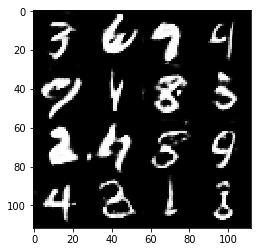

Timestamp 20170804-23-15-31.276 -  Epoch 2/2 -  Step 10110 -  D Loss: 0.6453 - G Loss: 1.9702
Timestamp 20170804-23-15-38.526 -  Epoch 2/2 -  Step 10120 -  D Loss: 1.0972 - G Loss: 2.3432
Timestamp 20170804-23-15-45.775 -  Epoch 2/2 -  Step 10130 -  D Loss: 0.6524 - G Loss: 2.4985
Timestamp 20170804-23-15-53.031 -  Epoch 2/2 -  Step 10140 -  D Loss: 0.7017 - G Loss: 1.8502
Timestamp 20170804-23-16-00.281 -  Epoch 2/2 -  Step 10150 -  D Loss: 0.9418 - G Loss: 1.8141
Timestamp 20170804-23-16-07.535 -  Epoch 2/2 -  Step 10160 -  D Loss: 0.7782 - G Loss: 1.6181
Timestamp 20170804-23-16-14.772 -  Epoch 2/2 -  Step 10170 -  D Loss: 0.8578 - G Loss: 2.4182
Timestamp 20170804-23-16-22.023 -  Epoch 2/2 -  Step 10180 -  D Loss: 1.1500 - G Loss: 0.7752
Timestamp 20170804-23-16-29.278 -  Epoch 2/2 -  Step 10190 -  D Loss: 0.6104 - G Loss: 1.3181
Timestamp 20170804-23-16-36.527 -  Epoch 2/2 -  Step 10200 -  D Loss: 0.8166 - G Loss: 1.9657


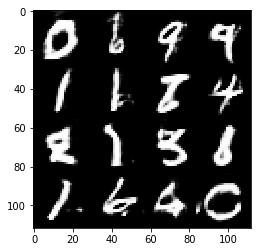

Timestamp 20170804-23-16-44.461 -  Epoch 2/2 -  Step 10210 -  D Loss: 0.8579 - G Loss: 2.0634
Timestamp 20170804-23-16-51.731 -  Epoch 2/2 -  Step 10220 -  D Loss: 0.6655 - G Loss: 2.0099
Timestamp 20170804-23-16-58.993 -  Epoch 2/2 -  Step 10230 -  D Loss: 0.6092 - G Loss: 1.6399
Timestamp 20170804-23-17-06.232 -  Epoch 2/2 -  Step 10240 -  D Loss: 0.6529 - G Loss: 1.2258
Timestamp 20170804-23-17-13.478 -  Epoch 2/2 -  Step 10250 -  D Loss: 0.5362 - G Loss: 3.4603
Timestamp 20170804-23-17-20.715 -  Epoch 2/2 -  Step 10260 -  D Loss: 0.5920 - G Loss: 2.3785
Timestamp 20170804-23-17-27.962 -  Epoch 2/2 -  Step 10270 -  D Loss: 0.7514 - G Loss: 2.4353
Timestamp 20170804-23-17-35.214 -  Epoch 2/2 -  Step 10280 -  D Loss: 0.5257 - G Loss: 2.3299
Timestamp 20170804-23-17-42.444 -  Epoch 2/2 -  Step 10290 -  D Loss: 0.9481 - G Loss: 1.0694
Timestamp 20170804-23-17-49.698 -  Epoch 2/2 -  Step 10300 -  D Loss: 1.0306 - G Loss: 2.9096


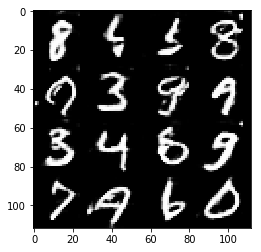

Timestamp 20170804-23-17-57.642 -  Epoch 2/2 -  Step 10310 -  D Loss: 0.8101 - G Loss: 0.7831
Timestamp 20170804-23-18-04.887 -  Epoch 2/2 -  Step 10320 -  D Loss: 1.0757 - G Loss: 2.0379
Timestamp 20170804-23-18-12.133 -  Epoch 2/2 -  Step 10330 -  D Loss: 0.6080 - G Loss: 1.9251
Timestamp 20170804-23-18-19.384 -  Epoch 2/2 -  Step 10340 -  D Loss: 0.8470 - G Loss: 0.7913
Timestamp 20170804-23-18-26.631 -  Epoch 2/2 -  Step 10350 -  D Loss: 0.5913 - G Loss: 1.9417
Timestamp 20170804-23-18-33.892 -  Epoch 2/2 -  Step 10360 -  D Loss: 0.5863 - G Loss: 1.7434
Timestamp 20170804-23-18-41.147 -  Epoch 2/2 -  Step 10370 -  D Loss: 0.8245 - G Loss: 0.9422
Timestamp 20170804-23-18-48.394 -  Epoch 2/2 -  Step 10380 -  D Loss: 0.5613 - G Loss: 2.9766
Timestamp 20170804-23-18-55.654 -  Epoch 2/2 -  Step 10390 -  D Loss: 1.0032 - G Loss: 0.8841
Timestamp 20170804-23-19-02.907 -  Epoch 2/2 -  Step 10400 -  D Loss: 1.3846 - G Loss: 0.2250


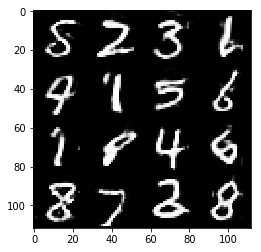

Timestamp 20170804-23-19-10.857 -  Epoch 2/2 -  Step 10410 -  D Loss: 0.7441 - G Loss: 1.0263
Timestamp 20170804-23-19-18.108 -  Epoch 2/2 -  Step 10420 -  D Loss: 0.7847 - G Loss: 1.9615
Timestamp 20170804-23-19-25.359 -  Epoch 2/2 -  Step 10430 -  D Loss: 1.2351 - G Loss: 0.9182
Timestamp 20170804-23-19-32.610 -  Epoch 2/2 -  Step 10440 -  D Loss: 0.7832 - G Loss: 1.2222
Timestamp 20170804-23-19-39.853 -  Epoch 2/2 -  Step 10450 -  D Loss: 0.5986 - G Loss: 1.9785
Timestamp 20170804-23-19-47.112 -  Epoch 2/2 -  Step 10460 -  D Loss: 0.5213 - G Loss: 2.0914
Timestamp 20170804-23-19-54.374 -  Epoch 2/2 -  Step 10470 -  D Loss: 0.8718 - G Loss: 1.7716
Timestamp 20170804-23-20-01.639 -  Epoch 2/2 -  Step 10480 -  D Loss: 0.6083 - G Loss: 1.4567
Timestamp 20170804-23-20-08.892 -  Epoch 2/2 -  Step 10490 -  D Loss: 0.6659 - G Loss: 1.2844
Timestamp 20170804-23-20-16.142 -  Epoch 2/2 -  Step 10500 -  D Loss: 0.8087 - G Loss: 1.0222


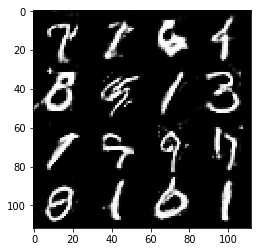

Timestamp 20170804-23-20-24.079 -  Epoch 2/2 -  Step 10510 -  D Loss: 0.5883 - G Loss: 1.5334
Timestamp 20170804-23-20-31.347 -  Epoch 2/2 -  Step 10520 -  D Loss: 0.8026 - G Loss: 0.8573
Timestamp 20170804-23-20-38.589 -  Epoch 2/2 -  Step 10530 -  D Loss: 0.7341 - G Loss: 1.5014
Timestamp 20170804-23-20-45.844 -  Epoch 2/2 -  Step 10540 -  D Loss: 0.7958 - G Loss: 2.2452
Timestamp 20170804-23-20-53.079 -  Epoch 2/2 -  Step 10550 -  D Loss: 0.7765 - G Loss: 1.1583
Timestamp 20170804-23-21-00.329 -  Epoch 2/2 -  Step 10560 -  D Loss: 0.6388 - G Loss: 2.2568
Timestamp 20170804-23-21-07.570 -  Epoch 2/2 -  Step 10570 -  D Loss: 1.0235 - G Loss: 1.0963
Timestamp 20170804-23-21-14.814 -  Epoch 2/2 -  Step 10580 -  D Loss: 0.5627 - G Loss: 1.8921
Timestamp 20170804-23-21-22.055 -  Epoch 2/2 -  Step 10590 -  D Loss: 0.5209 - G Loss: 2.8971
Timestamp 20170804-23-21-29.295 -  Epoch 2/2 -  Step 10600 -  D Loss: 0.7602 - G Loss: 1.4707


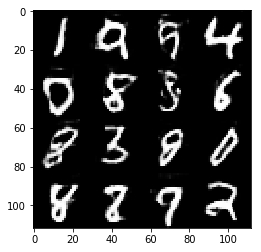

Timestamp 20170804-23-21-37.221 -  Epoch 2/2 -  Step 10610 -  D Loss: 1.0351 - G Loss: 0.8883
Timestamp 20170804-23-21-44.470 -  Epoch 2/2 -  Step 10620 -  D Loss: 0.9163 - G Loss: 1.3986
Timestamp 20170804-23-21-51.736 -  Epoch 2/2 -  Step 10630 -  D Loss: 0.7971 - G Loss: 0.4962
Timestamp 20170804-23-21-58.989 -  Epoch 2/2 -  Step 10640 -  D Loss: 0.7558 - G Loss: 1.4996
Timestamp 20170804-23-22-06.251 -  Epoch 2/2 -  Step 10650 -  D Loss: 1.2175 - G Loss: 1.2608
Timestamp 20170804-23-22-13.504 -  Epoch 2/2 -  Step 10660 -  D Loss: 0.6435 - G Loss: 1.9592
Timestamp 20170804-23-22-20.768 -  Epoch 2/2 -  Step 10670 -  D Loss: 1.2682 - G Loss: 1.4664
Timestamp 20170804-23-22-28.018 -  Epoch 2/2 -  Step 10680 -  D Loss: 1.0211 - G Loss: 1.2849
Timestamp 20170804-23-22-35.281 -  Epoch 2/2 -  Step 10690 -  D Loss: 0.9296 - G Loss: 1.2014
Timestamp 20170804-23-22-42.519 -  Epoch 2/2 -  Step 10700 -  D Loss: 1.2269 - G Loss: 1.2338


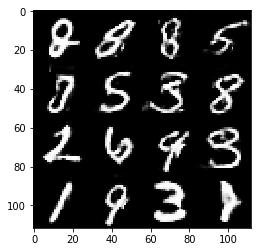

Timestamp 20170804-23-22-50.449 -  Epoch 2/2 -  Step 10710 -  D Loss: 0.7543 - G Loss: 1.8879
Timestamp 20170804-23-22-57.696 -  Epoch 2/2 -  Step 10720 -  D Loss: 0.9681 - G Loss: 1.9744
Timestamp 20170804-23-23-04.936 -  Epoch 2/2 -  Step 10730 -  D Loss: 0.9883 - G Loss: 0.8789
Timestamp 20170804-23-23-12.176 -  Epoch 2/2 -  Step 10740 -  D Loss: 0.4716 - G Loss: 2.7906
Timestamp 20170804-23-23-19.424 -  Epoch 2/2 -  Step 10750 -  D Loss: 0.8631 - G Loss: 1.8745
Timestamp 20170804-23-23-26.669 -  Epoch 2/2 -  Step 10760 -  D Loss: 0.9030 - G Loss: 2.1618
Timestamp 20170804-23-23-33.938 -  Epoch 2/2 -  Step 10770 -  D Loss: 0.6474 - G Loss: 2.8590
Timestamp 20170804-23-23-41.188 -  Epoch 2/2 -  Step 10780 -  D Loss: 1.3099 - G Loss: 3.7160
Timestamp 20170804-23-23-48.445 -  Epoch 2/2 -  Step 10790 -  D Loss: 0.5792 - G Loss: 1.0794
Timestamp 20170804-23-23-55.692 -  Epoch 2/2 -  Step 10800 -  D Loss: 0.9307 - G Loss: 0.7974


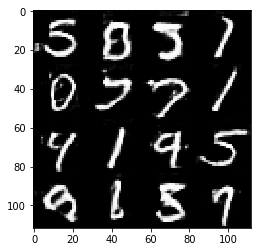

Timestamp 20170804-23-24-03.626 -  Epoch 2/2 -  Step 10810 -  D Loss: 0.7030 - G Loss: 1.6416
Timestamp 20170804-23-24-10.865 -  Epoch 2/2 -  Step 10820 -  D Loss: 0.8349 - G Loss: 0.9120
Timestamp 20170804-23-24-18.134 -  Epoch 2/2 -  Step 10830 -  D Loss: 0.6277 - G Loss: 2.3066
Timestamp 20170804-23-24-25.383 -  Epoch 2/2 -  Step 10840 -  D Loss: 0.5104 - G Loss: 3.0944
Timestamp 20170804-23-24-32.637 -  Epoch 2/2 -  Step 10850 -  D Loss: 0.8923 - G Loss: 1.3182
Timestamp 20170804-23-24-39.891 -  Epoch 2/2 -  Step 10860 -  D Loss: 0.7556 - G Loss: 1.7906
Timestamp 20170804-23-24-47.133 -  Epoch 2/2 -  Step 10870 -  D Loss: 0.7512 - G Loss: 2.0708
Timestamp 20170804-23-24-54.376 -  Epoch 2/2 -  Step 10880 -  D Loss: 1.0595 - G Loss: 2.6483
Timestamp 20170804-23-25-01.637 -  Epoch 2/2 -  Step 10890 -  D Loss: 0.8422 - G Loss: 1.1893
Timestamp 20170804-23-25-08.891 -  Epoch 2/2 -  Step 10900 -  D Loss: 1.1205 - G Loss: 2.6346


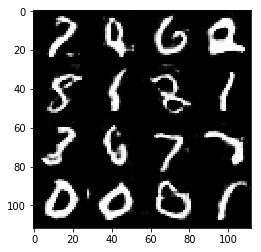

Timestamp 20170804-23-25-17.222 -  Epoch 2/2 -  Step 10910 -  D Loss: 0.5706 - G Loss: 2.5138
Timestamp 20170804-23-25-24.481 -  Epoch 2/2 -  Step 10920 -  D Loss: 1.2860 - G Loss: 1.5542
Timestamp 20170804-23-25-31.723 -  Epoch 2/2 -  Step 10930 -  D Loss: 0.8178 - G Loss: 3.1310
Timestamp 20170804-23-25-38.961 -  Epoch 2/2 -  Step 10940 -  D Loss: 1.2370 - G Loss: 1.8459
Timestamp 20170804-23-25-46.211 -  Epoch 2/2 -  Step 10950 -  D Loss: 0.9157 - G Loss: 0.9617
Timestamp 20170804-23-25-53.469 -  Epoch 2/2 -  Step 10960 -  D Loss: 0.6724 - G Loss: 1.9134
Timestamp 20170804-23-26-00.720 -  Epoch 2/2 -  Step 10970 -  D Loss: 0.5881 - G Loss: 2.1067
Timestamp 20170804-23-26-07.975 -  Epoch 2/2 -  Step 10980 -  D Loss: 1.0596 - G Loss: 1.1711
Timestamp 20170804-23-26-15.208 -  Epoch 2/2 -  Step 10990 -  D Loss: 1.4289 - G Loss: 0.4815
Timestamp 20170804-23-26-22.454 -  Epoch 2/2 -  Step 11000 -  D Loss: 1.0038 - G Loss: 0.7533


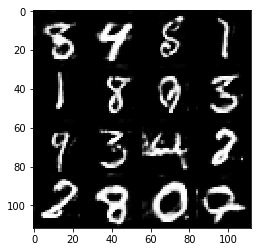

Timestamp 20170804-23-26-30.379 -  Epoch 2/2 -  Step 11010 -  D Loss: 0.8542 - G Loss: 1.9619
Timestamp 20170804-23-26-37.643 -  Epoch 2/2 -  Step 11020 -  D Loss: 0.6850 - G Loss: 1.3141
Timestamp 20170804-23-26-44.899 -  Epoch 2/2 -  Step 11030 -  D Loss: 0.9088 - G Loss: 1.1150
Timestamp 20170804-23-26-52.186 -  Epoch 2/2 -  Step 11040 -  D Loss: 0.6886 - G Loss: 1.5555
Timestamp 20170804-23-26-59.460 -  Epoch 2/2 -  Step 11050 -  D Loss: 0.9578 - G Loss: 1.4043
Timestamp 20170804-23-27-06.738 -  Epoch 2/2 -  Step 11060 -  D Loss: 0.8251 - G Loss: 1.3795
Timestamp 20170804-23-27-14.005 -  Epoch 2/2 -  Step 11070 -  D Loss: 0.9050 - G Loss: 1.7880
Timestamp 20170804-23-27-21.252 -  Epoch 2/2 -  Step 11080 -  D Loss: 0.5077 - G Loss: 1.8224
Timestamp 20170804-23-27-28.489 -  Epoch 2/2 -  Step 11090 -  D Loss: 1.0600 - G Loss: 1.2327
Timestamp 20170804-23-27-35.728 -  Epoch 2/2 -  Step 11100 -  D Loss: 0.6703 - G Loss: 1.9515


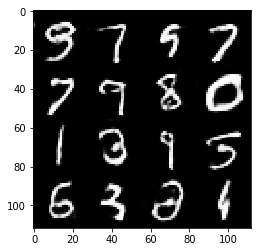

Timestamp 20170804-23-27-43.676 -  Epoch 2/2 -  Step 11110 -  D Loss: 0.6821 - G Loss: 1.3044
Timestamp 20170804-23-27-50.937 -  Epoch 2/2 -  Step 11120 -  D Loss: 0.5657 - G Loss: 2.4539
Timestamp 20170804-23-27-58.178 -  Epoch 2/2 -  Step 11130 -  D Loss: 0.7225 - G Loss: 2.2519
Timestamp 20170804-23-28-05.430 -  Epoch 2/2 -  Step 11140 -  D Loss: 0.6913 - G Loss: 0.7712
Timestamp 20170804-23-28-12.670 -  Epoch 2/2 -  Step 11150 -  D Loss: 0.6136 - G Loss: 1.4761
Timestamp 20170804-23-28-19.917 -  Epoch 2/2 -  Step 11160 -  D Loss: 1.0475 - G Loss: 1.7114
Timestamp 20170804-23-28-27.165 -  Epoch 2/2 -  Step 11170 -  D Loss: 1.4035 - G Loss: 0.2841
Timestamp 20170804-23-28-34.418 -  Epoch 2/2 -  Step 11180 -  D Loss: 0.7912 - G Loss: 1.7510
Timestamp 20170804-23-28-41.666 -  Epoch 2/2 -  Step 11190 -  D Loss: 0.9911 - G Loss: 1.2280
Timestamp 20170804-23-28-48.909 -  Epoch 2/2 -  Step 11200 -  D Loss: 1.0045 - G Loss: 0.9819


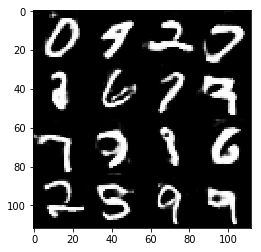

Timestamp 20170804-23-28-56.848 -  Epoch 2/2 -  Step 11210 -  D Loss: 1.2245 - G Loss: 1.7721
Timestamp 20170804-23-29-04.100 -  Epoch 2/2 -  Step 11220 -  D Loss: 1.1088 - G Loss: 1.8418
Timestamp 20170804-23-29-11.348 -  Epoch 2/2 -  Step 11230 -  D Loss: 0.7562 - G Loss: 2.6290
Timestamp 20170804-23-29-18.600 -  Epoch 2/2 -  Step 11240 -  D Loss: 0.9449 - G Loss: 1.4284
Timestamp 20170804-23-29-25.849 -  Epoch 2/2 -  Step 11250 -  D Loss: 0.6309 - G Loss: 2.4012
Timestamp 20170804-23-29-33.093 -  Epoch 2/2 -  Step 11260 -  D Loss: 0.7323 - G Loss: 2.0300
Timestamp 20170804-23-29-40.339 -  Epoch 2/2 -  Step 11270 -  D Loss: 0.8394 - G Loss: 1.6126
Timestamp 20170804-23-29-47.607 -  Epoch 2/2 -  Step 11280 -  D Loss: 1.0164 - G Loss: 1.1712
Timestamp 20170804-23-29-54.862 -  Epoch 2/2 -  Step 11290 -  D Loss: 1.0200 - G Loss: 1.7436
Timestamp 20170804-23-30-02.096 -  Epoch 2/2 -  Step 11300 -  D Loss: 0.9007 - G Loss: 2.3135


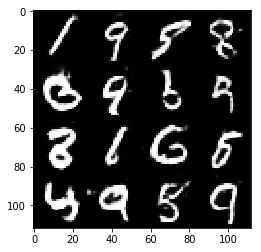

Timestamp 20170804-23-30-10.025 -  Epoch 2/2 -  Step 11310 -  D Loss: 1.4547 - G Loss: 1.1594
Timestamp 20170804-23-30-17.272 -  Epoch 2/2 -  Step 11320 -  D Loss: 0.8266 - G Loss: 1.9994
Timestamp 20170804-23-30-24.524 -  Epoch 2/2 -  Step 11330 -  D Loss: 0.8528 - G Loss: 2.0701
Timestamp 20170804-23-30-31.774 -  Epoch 2/2 -  Step 11340 -  D Loss: 0.6673 - G Loss: 2.1044
Timestamp 20170804-23-30-39.009 -  Epoch 2/2 -  Step 11350 -  D Loss: 0.7789 - G Loss: 1.8631
Timestamp 20170804-23-30-46.256 -  Epoch 2/2 -  Step 11360 -  D Loss: 0.7695 - G Loss: 2.0273
Timestamp 20170804-23-30-53.487 -  Epoch 2/2 -  Step 11370 -  D Loss: 0.4643 - G Loss: 1.5198
Timestamp 20170804-23-31-00.720 -  Epoch 2/2 -  Step 11380 -  D Loss: 0.6828 - G Loss: 2.3441
Timestamp 20170804-23-31-07.959 -  Epoch 2/2 -  Step 11390 -  D Loss: 0.6996 - G Loss: 1.7870
Timestamp 20170804-23-31-15.196 -  Epoch 2/2 -  Step 11400 -  D Loss: 0.8036 - G Loss: 0.9413


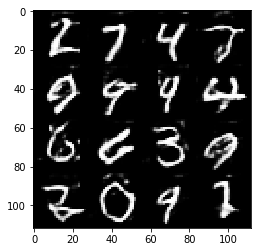

Timestamp 20170804-23-31-23.154 -  Epoch 2/2 -  Step 11410 -  D Loss: 0.7659 - G Loss: 1.7155
Timestamp 20170804-23-31-30.406 -  Epoch 2/2 -  Step 11420 -  D Loss: 1.6734 - G Loss: 2.3992
Timestamp 20170804-23-31-37.652 -  Epoch 2/2 -  Step 11430 -  D Loss: 0.6897 - G Loss: 1.3545
Timestamp 20170804-23-31-44.912 -  Epoch 2/2 -  Step 11440 -  D Loss: 0.7820 - G Loss: 1.4547
Timestamp 20170804-23-31-52.165 -  Epoch 2/2 -  Step 11450 -  D Loss: 1.0772 - G Loss: 1.9173
Timestamp 20170804-23-31-59.411 -  Epoch 2/2 -  Step 11460 -  D Loss: 1.0418 - G Loss: 0.8906
Timestamp 20170804-23-32-06.666 -  Epoch 2/2 -  Step 11470 -  D Loss: 0.4719 - G Loss: 1.9889
Timestamp 20170804-23-32-13.896 -  Epoch 2/2 -  Step 11480 -  D Loss: 0.8947 - G Loss: 1.0287
Timestamp 20170804-23-32-21.154 -  Epoch 2/2 -  Step 11490 -  D Loss: 1.0282 - G Loss: 2.0308
Timestamp 20170804-23-32-28.395 -  Epoch 2/2 -  Step 11500 -  D Loss: 0.7475 - G Loss: 1.8392


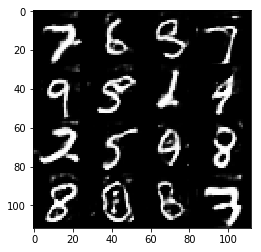

Timestamp 20170804-23-32-36.333 -  Epoch 2/2 -  Step 11510 -  D Loss: 0.4754 - G Loss: 1.7088
Timestamp 20170804-23-32-43.602 -  Epoch 2/2 -  Step 11520 -  D Loss: 0.4966 - G Loss: 3.1666
Timestamp 20170804-23-32-50.842 -  Epoch 2/2 -  Step 11530 -  D Loss: 0.5624 - G Loss: 1.5984
Timestamp 20170804-23-32-58.097 -  Epoch 2/2 -  Step 11540 -  D Loss: 0.5230 - G Loss: 2.3887
Timestamp 20170804-23-33-05.344 -  Epoch 2/2 -  Step 11550 -  D Loss: 0.6621 - G Loss: 2.2063
Timestamp 20170804-23-33-12.603 -  Epoch 2/2 -  Step 11560 -  D Loss: 0.6724 - G Loss: 1.4859
Timestamp 20170804-23-33-19.873 -  Epoch 2/2 -  Step 11570 -  D Loss: 0.9717 - G Loss: 0.7371
Timestamp 20170804-23-33-27.120 -  Epoch 2/2 -  Step 11580 -  D Loss: 0.7070 - G Loss: 1.8382
Timestamp 20170804-23-33-34.388 -  Epoch 2/2 -  Step 11590 -  D Loss: 0.7192 - G Loss: 1.8863
Timestamp 20170804-23-33-41.630 -  Epoch 2/2 -  Step 11600 -  D Loss: 0.5171 - G Loss: 2.3213


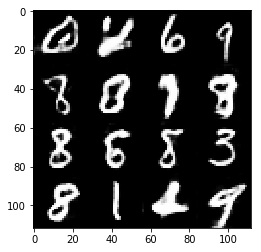

Timestamp 20170804-23-33-49.631 -  Epoch 2/2 -  Step 11610 -  D Loss: 0.8470 - G Loss: 1.2327
Timestamp 20170804-23-33-56.885 -  Epoch 2/2 -  Step 11620 -  D Loss: 0.5788 - G Loss: 3.0497
Timestamp 20170804-23-34-04.135 -  Epoch 2/2 -  Step 11630 -  D Loss: 0.3999 - G Loss: 2.7632
Timestamp 20170804-23-34-11.367 -  Epoch 2/2 -  Step 11640 -  D Loss: 0.4811 - G Loss: 3.0517
Timestamp 20170804-23-34-18.603 -  Epoch 2/2 -  Step 11650 -  D Loss: 0.8278 - G Loss: 2.2356
Timestamp 20170804-23-34-25.824 -  Epoch 2/2 -  Step 11660 -  D Loss: 2.2122 - G Loss: 1.7107
Timestamp 20170804-23-34-33.049 -  Epoch 2/2 -  Step 11670 -  D Loss: 1.2666 - G Loss: 2.4412
Timestamp 20170804-23-34-40.269 -  Epoch 2/2 -  Step 11680 -  D Loss: 0.5571 - G Loss: 2.1183
Timestamp 20170804-23-34-47.495 -  Epoch 2/2 -  Step 11690 -  D Loss: 1.0161 - G Loss: 1.1072
Timestamp 20170804-23-34-54.721 -  Epoch 2/2 -  Step 11700 -  D Loss: 0.7578 - G Loss: 0.7428


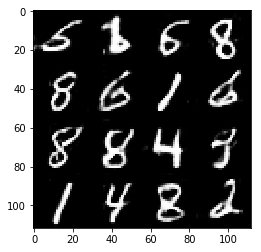

Timestamp 20170804-23-35-02.560 -  Epoch 2/2 -  Step 11710 -  D Loss: 1.1998 - G Loss: 1.3596
Timestamp 20170804-23-35-09.784 -  Epoch 2/2 -  Step 11720 -  D Loss: 0.9818 - G Loss: 0.7260
Timestamp 20170804-23-35-17.007 -  Epoch 2/2 -  Step 11730 -  D Loss: 1.1275 - G Loss: 2.0427
Timestamp 20170804-23-35-24.227 -  Epoch 2/2 -  Step 11740 -  D Loss: 0.8682 - G Loss: 1.4228
Timestamp 20170804-23-35-31.447 -  Epoch 2/2 -  Step 11750 -  D Loss: 0.7662 - G Loss: 1.4208
Timestamp 20170804-23-35-38.679 -  Epoch 2/2 -  Step 11760 -  D Loss: 0.7777 - G Loss: 1.3388
Timestamp 20170804-23-35-45.900 -  Epoch 2/2 -  Step 11770 -  D Loss: 0.8568 - G Loss: 1.7562
Timestamp 20170804-23-35-53.108 -  Epoch 2/2 -  Step 11780 -  D Loss: 0.4801 - G Loss: 2.5469
Timestamp 20170804-23-36-00.323 -  Epoch 2/2 -  Step 11790 -  D Loss: 0.6989 - G Loss: 1.6137
Timestamp 20170804-23-36-07.540 -  Epoch 2/2 -  Step 11800 -  D Loss: 0.5751 - G Loss: 1.8476


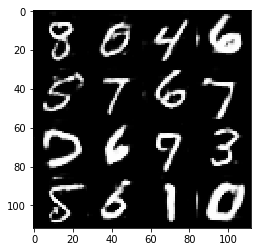

Timestamp 20170804-23-36-15.378 -  Epoch 2/2 -  Step 11810 -  D Loss: 1.1753 - G Loss: 2.2375
Timestamp 20170804-23-36-22.636 -  Epoch 2/2 -  Step 11820 -  D Loss: 1.4426 - G Loss: 2.2392
Timestamp 20170804-23-36-29.889 -  Epoch 2/2 -  Step 11830 -  D Loss: 0.8011 - G Loss: 0.5393
Timestamp 20170804-23-36-37.139 -  Epoch 2/2 -  Step 11840 -  D Loss: 1.1479 - G Loss: 1.0292
Timestamp 20170804-23-36-44.389 -  Epoch 2/2 -  Step 11850 -  D Loss: 0.8900 - G Loss: 2.7299
Timestamp 20170804-23-36-51.597 -  Epoch 2/2 -  Step 11860 -  D Loss: 0.5636 - G Loss: 2.9810
Timestamp 20170804-23-36-58.821 -  Epoch 2/2 -  Step 11870 -  D Loss: 1.1124 - G Loss: 0.8307
Timestamp 20170804-23-37-06.034 -  Epoch 2/2 -  Step 11880 -  D Loss: 0.5857 - G Loss: 1.1497
Timestamp 20170804-23-37-13.245 -  Epoch 2/2 -  Step 11890 -  D Loss: 1.3450 - G Loss: 1.2409
Timestamp 20170804-23-37-20.472 -  Epoch 2/2 -  Step 11900 -  D Loss: 0.9316 - G Loss: 2.6976


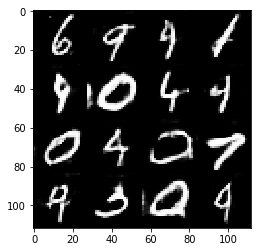

Timestamp 20170804-23-37-28.349 -  Epoch 2/2 -  Step 11910 -  D Loss: 0.4799 - G Loss: 1.4530
Timestamp 20170804-23-37-35.573 -  Epoch 2/2 -  Step 11920 -  D Loss: 0.9148 - G Loss: 1.3871
Timestamp 20170804-23-37-42.784 -  Epoch 2/2 -  Step 11930 -  D Loss: 0.6224 - G Loss: 1.4621
Timestamp 20170804-23-37-50.001 -  Epoch 2/2 -  Step 11940 -  D Loss: 1.3137 - G Loss: 1.3233
Timestamp 20170804-23-37-57.221 -  Epoch 2/2 -  Step 11950 -  D Loss: 0.5988 - G Loss: 1.8401
Timestamp 20170804-23-38-04.443 -  Epoch 2/2 -  Step 11960 -  D Loss: 0.6132 - G Loss: 3.2359
Timestamp 20170804-23-38-11.662 -  Epoch 2/2 -  Step 11970 -  D Loss: 1.0211 - G Loss: 1.1704
Timestamp 20170804-23-38-18.875 -  Epoch 2/2 -  Step 11980 -  D Loss: 0.6379 - G Loss: 2.1111
Timestamp 20170804-23-38-26.099 -  Epoch 2/2 -  Step 11990 -  D Loss: 0.7178 - G Loss: 2.4399
Timestamp 20170804-23-38-33.305 -  Epoch 2/2 -  Step 12000 -  D Loss: 0.5095 - G Loss: 3.0028


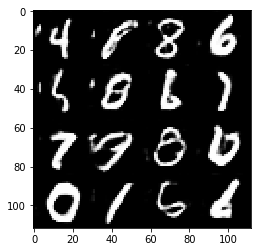

Timestamp 20170804-23-38-41.186 -  Epoch 2/2 -  Step 12010 -  D Loss: 0.7146 - G Loss: 1.7349
Timestamp 20170804-23-38-48.398 -  Epoch 2/2 -  Step 12020 -  D Loss: 0.7215 - G Loss: 0.9533
Timestamp 20170804-23-38-55.623 -  Epoch 2/2 -  Step 12030 -  D Loss: 0.5181 - G Loss: 3.2310
Timestamp 20170804-23-39-02.838 -  Epoch 2/2 -  Step 12040 -  D Loss: 0.9702 - G Loss: 1.8024
Timestamp 20170804-23-39-10.128 -  Epoch 2/2 -  Step 12050 -  D Loss: 0.8192 - G Loss: 1.6281
Timestamp 20170804-23-50-19.529 -  Epoch 2/2 -  Step 12060 -  D Loss: 0.9456 - G Loss: 1.2809
Timestamp 20170804-23-50-26.769 -  Epoch 2/2 -  Step 12070 -  D Loss: 0.8636 - G Loss: 2.2198
Timestamp 20170804-23-50-33.982 -  Epoch 2/2 -  Step 12080 -  D Loss: 0.8115 - G Loss: 1.8839
Timestamp 20170804-23-50-41.216 -  Epoch 2/2 -  Step 12090 -  D Loss: 1.0668 - G Loss: 1.9265
Timestamp 20170804-23-50-48.445 -  Epoch 2/2 -  Step 12100 -  D Loss: 0.4713 - G Loss: 1.8313


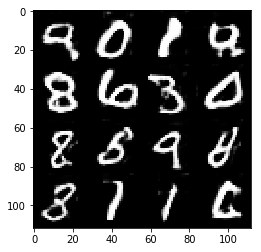

Timestamp 20170804-23-50-56.407 -  Epoch 2/2 -  Step 12110 -  D Loss: 0.7068 - G Loss: 1.0014
Timestamp 20170804-23-51-03.611 -  Epoch 2/2 -  Step 12120 -  D Loss: 0.5373 - G Loss: 3.1359
Timestamp 20170804-23-51-10.813 -  Epoch 2/2 -  Step 12130 -  D Loss: 0.7870 - G Loss: 2.7195
Timestamp 20170804-23-51-18.017 -  Epoch 2/2 -  Step 12140 -  D Loss: 0.4617 - G Loss: 2.3181
Timestamp 20170804-23-51-25.237 -  Epoch 2/2 -  Step 12150 -  D Loss: 0.7644 - G Loss: 1.6732
Timestamp 20170804-23-51-32.445 -  Epoch 2/2 -  Step 12160 -  D Loss: 0.6397 - G Loss: 2.0169
Timestamp 20170804-23-51-39.656 -  Epoch 2/2 -  Step 12170 -  D Loss: 0.9600 - G Loss: 1.3000
Timestamp 20170804-23-51-46.866 -  Epoch 2/2 -  Step 12180 -  D Loss: 0.4863 - G Loss: 4.0174
Timestamp 20170804-23-51-54.059 -  Epoch 2/2 -  Step 12190 -  D Loss: 1.5292 - G Loss: 0.7883
Timestamp 20170804-23-52-01.279 -  Epoch 2/2 -  Step 12200 -  D Loss: 0.6058 - G Loss: 2.6587


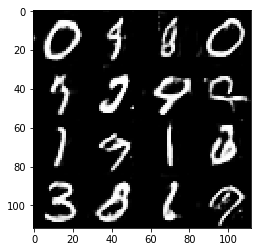

Timestamp 20170804-23-52-09.225 -  Epoch 2/2 -  Step 12210 -  D Loss: 0.5279 - G Loss: 1.8620
Timestamp 20170804-23-52-16.436 -  Epoch 2/2 -  Step 12220 -  D Loss: 0.8475 - G Loss: 2.4663
Timestamp 20170804-23-52-23.642 -  Epoch 2/2 -  Step 12230 -  D Loss: 0.6544 - G Loss: 1.9982
Timestamp 20170804-23-52-30.852 -  Epoch 2/2 -  Step 12240 -  D Loss: 0.9655 - G Loss: 1.8206
Timestamp 20170804-23-52-38.069 -  Epoch 2/2 -  Step 12250 -  D Loss: 0.5807 - G Loss: 2.8444
Timestamp 20170804-23-52-45.273 -  Epoch 2/2 -  Step 12260 -  D Loss: 0.5384 - G Loss: 1.2637
Timestamp 20170804-23-52-52.476 -  Epoch 2/2 -  Step 12270 -  D Loss: 0.6085 - G Loss: 2.3092
Timestamp 20170804-23-52-59.681 -  Epoch 2/2 -  Step 12280 -  D Loss: 0.7680 - G Loss: 1.8848
Timestamp 20170804-23-53-06.894 -  Epoch 2/2 -  Step 12290 -  D Loss: 0.7096 - G Loss: 2.3095
Timestamp 20170804-23-53-14.101 -  Epoch 2/2 -  Step 12300 -  D Loss: 0.6242 - G Loss: 2.3979


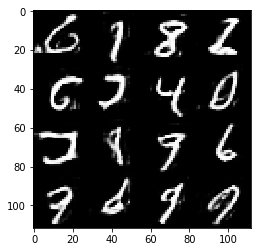

Timestamp 20170804-23-53-22.053 -  Epoch 2/2 -  Step 12310 -  D Loss: 0.6063 - G Loss: 2.2174
Timestamp 20170804-23-53-29.272 -  Epoch 2/2 -  Step 12320 -  D Loss: 0.8300 - G Loss: 1.6655
Timestamp 20170804-23-53-36.467 -  Epoch 2/2 -  Step 12330 -  D Loss: 0.7639 - G Loss: 1.6799
Timestamp 20170804-23-53-43.664 -  Epoch 2/2 -  Step 12340 -  D Loss: 0.6883 - G Loss: 2.3754
Timestamp 20170804-23-53-50.878 -  Epoch 2/2 -  Step 12350 -  D Loss: 1.6541 - G Loss: 0.8332
Timestamp 20170804-23-53-58.091 -  Epoch 2/2 -  Step 12360 -  D Loss: 0.7968 - G Loss: 1.4743
Timestamp 20170804-23-54-05.292 -  Epoch 2/2 -  Step 12370 -  D Loss: 0.6384 - G Loss: 1.4396
Timestamp 20170804-23-54-12.501 -  Epoch 2/2 -  Step 12380 -  D Loss: 0.6005 - G Loss: 2.6392
Timestamp 20170804-23-54-19.712 -  Epoch 2/2 -  Step 12390 -  D Loss: 0.7076 - G Loss: 1.8002
Timestamp 20170804-23-54-26.928 -  Epoch 2/2 -  Step 12400 -  D Loss: 0.7506 - G Loss: 2.0542


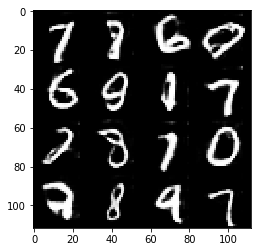

Timestamp 20170804-23-54-34.849 -  Epoch 2/2 -  Step 12410 -  D Loss: 0.6304 - G Loss: 1.5070
Timestamp 20170804-23-54-42.074 -  Epoch 2/2 -  Step 12420 -  D Loss: 0.6028 - G Loss: 1.2128
Timestamp 20170804-23-54-49.286 -  Epoch 2/2 -  Step 12430 -  D Loss: 0.5093 - G Loss: 1.6241
Timestamp 20170804-23-54-56.484 -  Epoch 2/2 -  Step 12440 -  D Loss: 0.4647 - G Loss: 2.5556
Timestamp 20170804-23-55-03.692 -  Epoch 2/2 -  Step 12450 -  D Loss: 0.4991 - G Loss: 1.2444
Timestamp 20170804-23-55-10.897 -  Epoch 2/2 -  Step 12460 -  D Loss: 0.6822 - G Loss: 2.5699
Timestamp 20170804-23-55-18.091 -  Epoch 2/2 -  Step 12470 -  D Loss: 0.6026 - G Loss: 1.7560
Timestamp 20170804-23-55-25.305 -  Epoch 2/2 -  Step 12480 -  D Loss: 0.5492 - G Loss: 1.9749
Timestamp 20170804-23-55-32.524 -  Epoch 2/2 -  Step 12490 -  D Loss: 0.9107 - G Loss: 0.8916
Timestamp 20170804-23-55-39.729 -  Epoch 2/2 -  Step 12500 -  D Loss: 0.7842 - G Loss: 3.2768


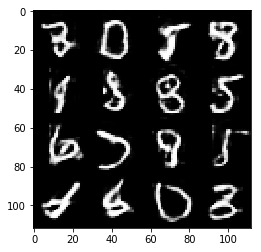

Timestamp 20170804-23-55-47.645 -  Epoch 2/2 -  Step 12510 -  D Loss: 0.8853 - G Loss: 1.4925
Timestamp 20170804-23-55-54.840 -  Epoch 2/2 -  Step 12520 -  D Loss: 0.9552 - G Loss: 1.2778
Timestamp 20170804-23-56-02.056 -  Epoch 2/2 -  Step 12530 -  D Loss: 0.9563 - G Loss: 0.6512
Timestamp 20170804-23-56-09.267 -  Epoch 2/2 -  Step 12540 -  D Loss: 0.4334 - G Loss: 3.5657
Timestamp 20170804-23-56-16.494 -  Epoch 2/2 -  Step 12550 -  D Loss: 0.5442 - G Loss: 1.8889
Timestamp 20170804-23-56-23.708 -  Epoch 2/2 -  Step 12560 -  D Loss: 0.4802 - G Loss: 1.3071
Timestamp 20170804-23-56-30.909 -  Epoch 2/2 -  Step 12570 -  D Loss: 0.7186 - G Loss: 2.4382
Timestamp 20170804-23-56-38.109 -  Epoch 2/2 -  Step 12580 -  D Loss: 0.5807 - G Loss: 1.5992
Timestamp 20170804-23-56-45.300 -  Epoch 2/2 -  Step 12590 -  D Loss: 0.6958 - G Loss: 1.3689
Timestamp 20170804-23-56-52.523 -  Epoch 2/2 -  Step 12600 -  D Loss: 0.7498 - G Loss: 1.5220


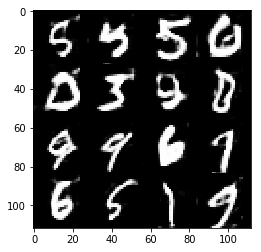

Timestamp 20170804-23-57-00.439 -  Epoch 2/2 -  Step 12610 -  D Loss: 0.7069 - G Loss: 2.5198
Timestamp 20170804-23-57-07.673 -  Epoch 2/2 -  Step 12620 -  D Loss: 0.6217 - G Loss: 2.3339
Timestamp 20170804-23-57-14.887 -  Epoch 2/2 -  Step 12630 -  D Loss: 0.8053 - G Loss: 2.4538
Timestamp 20170804-23-57-22.103 -  Epoch 2/2 -  Step 12640 -  D Loss: 0.8481 - G Loss: 1.4840
Timestamp 20170804-23-57-29.305 -  Epoch 2/2 -  Step 12650 -  D Loss: 0.6391 - G Loss: 1.8328
Timestamp 20170804-23-57-36.530 -  Epoch 2/2 -  Step 12660 -  D Loss: 0.9147 - G Loss: 1.2062
Timestamp 20170804-23-57-43.736 -  Epoch 2/2 -  Step 12670 -  D Loss: 0.5209 - G Loss: 2.2882
Timestamp 20170804-23-57-50.936 -  Epoch 2/2 -  Step 12680 -  D Loss: 0.9289 - G Loss: 2.2255
Timestamp 20170804-23-57-58.151 -  Epoch 2/2 -  Step 12690 -  D Loss: 1.3257 - G Loss: 1.3899
Timestamp 20170804-23-58-05.357 -  Epoch 2/2 -  Step 12700 -  D Loss: 0.8046 - G Loss: 1.0436


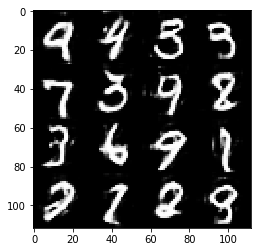

Timestamp 20170804-23-58-13.244 -  Epoch 2/2 -  Step 12710 -  D Loss: 0.5623 - G Loss: 2.1710
Timestamp 20170804-23-58-20.449 -  Epoch 2/2 -  Step 12720 -  D Loss: 0.6189 - G Loss: 4.3881
Timestamp 20170804-23-58-27.668 -  Epoch 2/2 -  Step 12730 -  D Loss: 0.5644 - G Loss: 2.0384
Timestamp 20170804-23-58-34.877 -  Epoch 2/2 -  Step 12740 -  D Loss: 0.5111 - G Loss: 2.5413
Timestamp 20170804-23-58-42.098 -  Epoch 2/2 -  Step 12750 -  D Loss: 0.8179 - G Loss: 2.0855
Timestamp 20170804-23-58-49.317 -  Epoch 2/2 -  Step 12760 -  D Loss: 0.5078 - G Loss: 2.2641
Timestamp 20170804-23-58-56.527 -  Epoch 2/2 -  Step 12770 -  D Loss: 0.4579 - G Loss: 3.7028
Timestamp 20170804-23-59-03.727 -  Epoch 2/2 -  Step 12780 -  D Loss: 1.1497 - G Loss: 0.8170
Timestamp 20170804-23-59-10.944 -  Epoch 2/2 -  Step 12790 -  D Loss: 0.6663 - G Loss: 0.9369
Timestamp 20170804-23-59-18.182 -  Epoch 2/2 -  Step 12800 -  D Loss: 0.9526 - G Loss: 1.9830


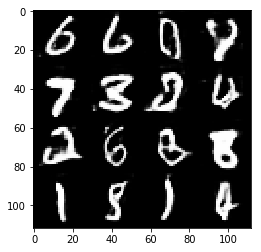

Timestamp 20170804-23-59-26.234 -  Epoch 2/2 -  Step 12810 -  D Loss: 0.6967 - G Loss: 1.3341
Timestamp 20170804-23-59-33.459 -  Epoch 2/2 -  Step 12820 -  D Loss: 0.8757 - G Loss: 1.7844
Timestamp 20170804-23-59-40.676 -  Epoch 2/2 -  Step 12830 -  D Loss: 0.9030 - G Loss: 0.5900
Timestamp 20170804-23-59-47.887 -  Epoch 2/2 -  Step 12840 -  D Loss: 1.0937 - G Loss: 1.2425
Timestamp 20170804-23-59-55.110 -  Epoch 2/2 -  Step 12850 -  D Loss: 0.7565 - G Loss: 1.7143
Timestamp 20170805-00-00-02.333 -  Epoch 2/2 -  Step 12860 -  D Loss: 0.6381 - G Loss: 1.3410
Timestamp 20170805-00-00-09.546 -  Epoch 2/2 -  Step 12870 -  D Loss: 1.2025 - G Loss: 1.2959
Timestamp 20170805-00-00-16.811 -  Epoch 2/2 -  Step 12880 -  D Loss: 1.1007 - G Loss: 1.2829
Timestamp 20170805-00-00-24.027 -  Epoch 2/2 -  Step 12890 -  D Loss: 1.0351 - G Loss: 0.9051
Timestamp 20170805-00-00-31.244 -  Epoch 2/2 -  Step 12900 -  D Loss: 0.9194 - G Loss: 3.3396


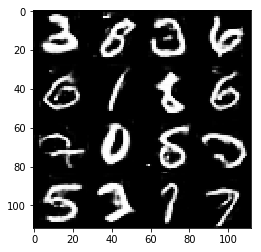

Timestamp 20170805-00-00-39.183 -  Epoch 2/2 -  Step 12910 -  D Loss: 0.7440 - G Loss: 2.6418
Timestamp 20170805-00-00-46.401 -  Epoch 2/2 -  Step 12920 -  D Loss: 0.6629 - G Loss: 1.7439
Timestamp 20170805-00-00-53.614 -  Epoch 2/2 -  Step 12930 -  D Loss: 0.8939 - G Loss: 1.3207
Timestamp 20170805-00-01-00.819 -  Epoch 2/2 -  Step 12940 -  D Loss: 0.7612 - G Loss: 0.6228
Timestamp 20170805-00-01-08.030 -  Epoch 2/2 -  Step 12950 -  D Loss: 0.5543 - G Loss: 2.6793
Timestamp 20170805-00-01-15.235 -  Epoch 2/2 -  Step 12960 -  D Loss: 1.2380 - G Loss: 0.7728
Timestamp 20170805-00-01-22.450 -  Epoch 2/2 -  Step 12970 -  D Loss: 0.5195 - G Loss: 2.1424
Timestamp 20170805-00-01-29.657 -  Epoch 2/2 -  Step 12980 -  D Loss: 1.2141 - G Loss: 1.5366
Timestamp 20170805-00-01-36.874 -  Epoch 2/2 -  Step 12990 -  D Loss: 0.5732 - G Loss: 2.6980
Timestamp 20170805-00-01-44.093 -  Epoch 2/2 -  Step 13000 -  D Loss: 0.7609 - G Loss: 1.0596


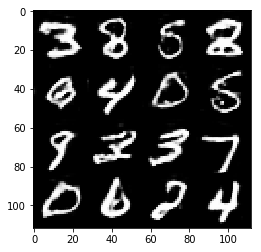

Timestamp 20170805-00-01-52.041 -  Epoch 2/2 -  Step 13010 -  D Loss: 0.9124 - G Loss: 1.4693
Timestamp 20170805-00-01-59.243 -  Epoch 2/2 -  Step 13020 -  D Loss: 0.6004 - G Loss: 1.3790
Timestamp 20170805-00-02-06.442 -  Epoch 2/2 -  Step 13030 -  D Loss: 0.6291 - G Loss: 1.8801
Timestamp 20170805-00-02-13.660 -  Epoch 2/2 -  Step 13040 -  D Loss: 0.6100 - G Loss: 2.5533
Timestamp 20170805-00-02-20.876 -  Epoch 2/2 -  Step 13050 -  D Loss: 0.9215 - G Loss: 1.1183
Timestamp 20170805-00-02-28.088 -  Epoch 2/2 -  Step 13060 -  D Loss: 0.5478 - G Loss: 2.8432
Timestamp 20170805-00-02-35.306 -  Epoch 2/2 -  Step 13070 -  D Loss: 0.9150 - G Loss: 0.9739
Timestamp 20170805-00-02-42.513 -  Epoch 2/2 -  Step 13080 -  D Loss: 0.7302 - G Loss: 1.7462
Timestamp 20170805-00-02-49.740 -  Epoch 2/2 -  Step 13090 -  D Loss: 0.5262 - G Loss: 2.1461
Timestamp 20170805-00-02-56.958 -  Epoch 2/2 -  Step 13100 -  D Loss: 0.9094 - G Loss: 1.9613


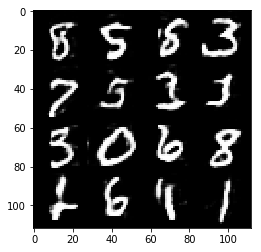

Timestamp 20170805-00-03-04.931 -  Epoch 2/2 -  Step 13110 -  D Loss: 0.6774 - G Loss: 0.6140
Timestamp 20170805-00-03-12.145 -  Epoch 2/2 -  Step 13120 -  D Loss: 0.5490 - G Loss: 1.7037
Timestamp 20170805-00-03-19.371 -  Epoch 2/2 -  Step 13130 -  D Loss: 0.8385 - G Loss: 2.3684
Timestamp 20170805-00-03-26.576 -  Epoch 2/2 -  Step 13140 -  D Loss: 1.0782 - G Loss: 1.8088
Timestamp 20170805-00-03-33.795 -  Epoch 2/2 -  Step 13150 -  D Loss: 0.6799 - G Loss: 2.8167
Timestamp 20170805-00-03-41.022 -  Epoch 2/2 -  Step 13160 -  D Loss: 0.7126 - G Loss: 1.2789
Timestamp 20170805-00-03-48.225 -  Epoch 2/2 -  Step 13170 -  D Loss: 0.6691 - G Loss: 0.9375
Timestamp 20170805-00-03-55.434 -  Epoch 2/2 -  Step 13180 -  D Loss: 0.6667 - G Loss: 1.1004
Timestamp 20170805-00-04-02.647 -  Epoch 2/2 -  Step 13190 -  D Loss: 0.9146 - G Loss: 2.9156
Timestamp 20170805-00-04-09.857 -  Epoch 2/2 -  Step 13200 -  D Loss: 0.4952 - G Loss: 0.7807


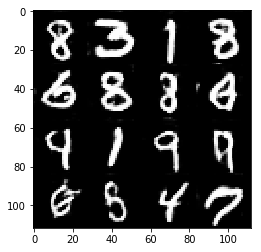

Timestamp 20170805-00-04-17.772 -  Epoch 2/2 -  Step 13210 -  D Loss: 0.5941 - G Loss: 2.2223
Timestamp 20170805-00-04-24.976 -  Epoch 2/2 -  Step 13220 -  D Loss: 0.7757 - G Loss: 0.8199
Timestamp 20170805-00-04-32.189 -  Epoch 2/2 -  Step 13230 -  D Loss: 0.7842 - G Loss: 3.2453
Timestamp 20170805-00-04-39.406 -  Epoch 2/2 -  Step 13240 -  D Loss: 0.7828 - G Loss: 2.2010
Timestamp 20170805-00-04-46.608 -  Epoch 2/2 -  Step 13250 -  D Loss: 1.0181 - G Loss: 2.4326
Timestamp 20170805-00-04-53.813 -  Epoch 2/2 -  Step 13260 -  D Loss: 0.7009 - G Loss: 1.5964
Timestamp 20170805-00-05-01.006 -  Epoch 2/2 -  Step 13270 -  D Loss: 0.7435 - G Loss: 1.9252
Timestamp 20170805-00-05-08.224 -  Epoch 2/2 -  Step 13280 -  D Loss: 0.9244 - G Loss: 1.8711
Timestamp 20170805-00-05-15.445 -  Epoch 2/2 -  Step 13290 -  D Loss: 0.5344 - G Loss: 1.8006
Timestamp 20170805-00-05-22.672 -  Epoch 2/2 -  Step 13300 -  D Loss: 0.8447 - G Loss: 1.6999


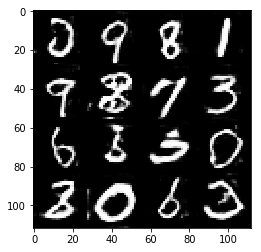

Timestamp 20170805-00-05-30.581 -  Epoch 2/2 -  Step 13310 -  D Loss: 0.8133 - G Loss: 2.5970
Timestamp 20170805-00-05-37.799 -  Epoch 2/2 -  Step 13320 -  D Loss: 0.8608 - G Loss: 2.2435
Timestamp 20170805-00-05-45.014 -  Epoch 2/2 -  Step 13330 -  D Loss: 0.9866 - G Loss: 1.4904
Timestamp 20170805-00-05-52.238 -  Epoch 2/2 -  Step 13340 -  D Loss: 0.5676 - G Loss: 1.7529
Timestamp 20170805-00-05-59.448 -  Epoch 2/2 -  Step 13350 -  D Loss: 0.9216 - G Loss: 1.8880
Timestamp 20170805-00-06-06.666 -  Epoch 2/2 -  Step 13360 -  D Loss: 0.8531 - G Loss: 2.1938
Timestamp 20170805-00-06-13.898 -  Epoch 2/2 -  Step 13370 -  D Loss: 0.8420 - G Loss: 3.6747
Timestamp 20170805-00-06-21.093 -  Epoch 2/2 -  Step 13380 -  D Loss: 0.5758 - G Loss: 2.1365
Timestamp 20170805-00-06-28.312 -  Epoch 2/2 -  Step 13390 -  D Loss: 0.8194 - G Loss: 1.3881
Timestamp 20170805-00-06-35.531 -  Epoch 2/2 -  Step 13400 -  D Loss: 1.0609 - G Loss: 1.4876


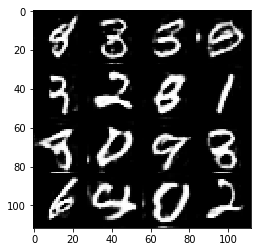

Timestamp 20170805-00-06-43.515 -  Epoch 2/2 -  Step 13410 -  D Loss: 0.5801 - G Loss: 1.3224
Timestamp 20170805-00-06-50.735 -  Epoch 2/2 -  Step 13420 -  D Loss: 0.5853 - G Loss: 2.7353
Timestamp 20170805-00-06-57.932 -  Epoch 2/2 -  Step 13430 -  D Loss: 0.7551 - G Loss: 1.4132
Timestamp 20170805-00-07-05.144 -  Epoch 2/2 -  Step 13440 -  D Loss: 0.6375 - G Loss: 1.5631
Timestamp 20170805-00-07-12.364 -  Epoch 2/2 -  Step 13450 -  D Loss: 0.4558 - G Loss: 1.0856
Timestamp 20170805-00-07-19.565 -  Epoch 2/2 -  Step 13460 -  D Loss: 0.9658 - G Loss: 2.0697
Timestamp 20170805-00-07-26.769 -  Epoch 2/2 -  Step 13470 -  D Loss: 1.1744 - G Loss: 1.6588
Timestamp 20170805-00-07-33.982 -  Epoch 2/2 -  Step 13480 -  D Loss: 0.5424 - G Loss: 2.4053
Timestamp 20170805-00-07-41.193 -  Epoch 2/2 -  Step 13490 -  D Loss: 1.0143 - G Loss: 1.5049
Timestamp 20170805-00-07-48.414 -  Epoch 2/2 -  Step 13500 -  D Loss: 0.5276 - G Loss: 1.6391


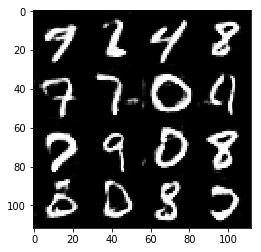

Timestamp 20170805-00-07-56.344 -  Epoch 2/2 -  Step 13510 -  D Loss: 0.8618 - G Loss: 1.4277
Timestamp 20170805-00-08-03.573 -  Epoch 2/2 -  Step 13520 -  D Loss: 0.5867 - G Loss: 2.4681
Timestamp 20170805-00-08-10.790 -  Epoch 2/2 -  Step 13530 -  D Loss: 0.5441 - G Loss: 2.1555
Timestamp 20170805-00-08-17.996 -  Epoch 2/2 -  Step 13540 -  D Loss: 0.5765 - G Loss: 1.3216
Timestamp 20170805-00-08-25.210 -  Epoch 2/2 -  Step 13550 -  D Loss: 0.7762 - G Loss: 0.8088
Timestamp 20170805-00-08-32.403 -  Epoch 2/2 -  Step 13560 -  D Loss: 0.7996 - G Loss: 1.7746
Timestamp 20170805-00-08-39.607 -  Epoch 2/2 -  Step 13570 -  D Loss: 0.8985 - G Loss: 1.3062
Timestamp 20170805-00-08-46.810 -  Epoch 2/2 -  Step 13580 -  D Loss: 0.8456 - G Loss: 1.7222
Timestamp 20170805-00-08-54.032 -  Epoch 2/2 -  Step 13590 -  D Loss: 0.5948 - G Loss: 1.6942
Timestamp 20170805-00-09-01.243 -  Epoch 2/2 -  Step 13600 -  D Loss: 0.5480 - G Loss: 1.4955


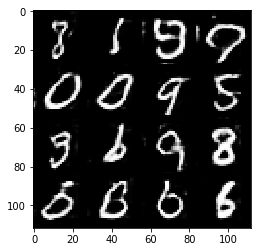

Timestamp 20170805-00-09-09.173 -  Epoch 2/2 -  Step 13610 -  D Loss: 0.6927 - G Loss: 2.0568
Timestamp 20170805-00-09-16.390 -  Epoch 2/2 -  Step 13620 -  D Loss: 0.6706 - G Loss: 2.3135
Timestamp 20170805-00-09-23.613 -  Epoch 2/2 -  Step 13630 -  D Loss: 1.0270 - G Loss: 2.0210
Timestamp 20170805-00-09-30.831 -  Epoch 2/2 -  Step 13640 -  D Loss: 0.8475 - G Loss: 1.2373
Timestamp 20170805-00-09-38.035 -  Epoch 2/2 -  Step 13650 -  D Loss: 0.6564 - G Loss: 0.9905
Timestamp 20170805-00-09-45.258 -  Epoch 2/2 -  Step 13660 -  D Loss: 0.7068 - G Loss: 1.3367
Timestamp 20170805-00-09-52.468 -  Epoch 2/2 -  Step 13670 -  D Loss: 0.8122 - G Loss: 1.2406
Timestamp 20170805-00-09-59.697 -  Epoch 2/2 -  Step 13680 -  D Loss: 0.7434 - G Loss: 2.0870
Timestamp 20170805-00-10-06.908 -  Epoch 2/2 -  Step 13690 -  D Loss: 0.5521 - G Loss: 1.9016
Timestamp 20170805-00-10-14.117 -  Epoch 2/2 -  Step 13700 -  D Loss: 0.9051 - G Loss: 1.4835


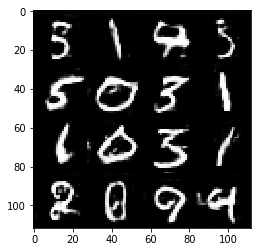

Timestamp 20170805-00-10-22.477 -  Epoch 2/2 -  Step 13710 -  D Loss: 0.8120 - G Loss: 1.5422
Timestamp 20170805-00-10-29.693 -  Epoch 2/2 -  Step 13720 -  D Loss: 0.6956 - G Loss: 2.3870
Timestamp 20170805-00-10-36.910 -  Epoch 2/2 -  Step 13730 -  D Loss: 0.9239 - G Loss: 1.4440
Timestamp 20170805-00-10-44.132 -  Epoch 2/2 -  Step 13740 -  D Loss: 1.5257 - G Loss: 0.4602
Timestamp 20170805-00-10-51.341 -  Epoch 2/2 -  Step 13750 -  D Loss: 0.4536 - G Loss: 3.0259
Timestamp 20170805-00-10-58.533 -  Epoch 2/2 -  Step 13760 -  D Loss: 0.6049 - G Loss: 3.0594
Timestamp 20170805-00-11-05.753 -  Epoch 2/2 -  Step 13770 -  D Loss: 0.5456 - G Loss: 2.2867
Timestamp 20170805-00-11-12.981 -  Epoch 2/2 -  Step 13780 -  D Loss: 0.6820 - G Loss: 1.7469
Timestamp 20170805-00-11-20.210 -  Epoch 2/2 -  Step 13790 -  D Loss: 0.5121 - G Loss: 2.8979
Timestamp 20170805-00-11-27.406 -  Epoch 2/2 -  Step 13800 -  D Loss: 0.6514 - G Loss: 2.4010


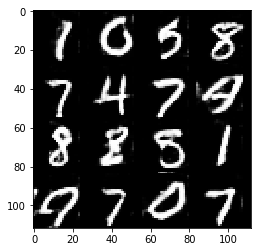

Timestamp 20170805-00-11-35.341 -  Epoch 2/2 -  Step 13810 -  D Loss: 0.5811 - G Loss: 1.4888
Timestamp 20170805-00-11-42.571 -  Epoch 2/2 -  Step 13820 -  D Loss: 0.5943 - G Loss: 3.1309
Timestamp 20170805-00-11-49.784 -  Epoch 2/2 -  Step 13830 -  D Loss: 0.9637 - G Loss: 1.9590
Timestamp 20170805-00-11-57.001 -  Epoch 2/2 -  Step 13840 -  D Loss: 0.7136 - G Loss: 1.7138
Timestamp 20170805-00-12-04.192 -  Epoch 2/2 -  Step 13850 -  D Loss: 0.4572 - G Loss: 2.1536
Timestamp 20170805-00-12-11.386 -  Epoch 2/2 -  Step 13860 -  D Loss: 0.5380 - G Loss: 1.9213
Timestamp 20170805-00-12-18.600 -  Epoch 2/2 -  Step 13870 -  D Loss: 1.2794 - G Loss: 1.1691
Timestamp 20170805-00-12-25.796 -  Epoch 2/2 -  Step 13880 -  D Loss: 0.5201 - G Loss: 2.0211
Timestamp 20170805-00-12-33.009 -  Epoch 2/2 -  Step 13890 -  D Loss: 0.4914 - G Loss: 2.9552
Timestamp 20170805-00-12-40.249 -  Epoch 2/2 -  Step 13900 -  D Loss: 0.5886 - G Loss: 1.8412


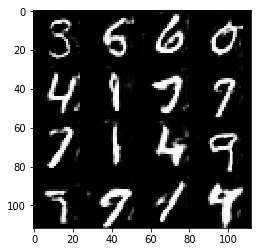

Timestamp 20170805-00-12-48.171 -  Epoch 2/2 -  Step 13910 -  D Loss: 0.4087 - G Loss: 2.6481
Timestamp 20170805-00-12-55.381 -  Epoch 2/2 -  Step 13920 -  D Loss: 0.8606 - G Loss: 2.3318
Timestamp 20170805-00-13-02.599 -  Epoch 2/2 -  Step 13930 -  D Loss: 0.7566 - G Loss: 1.3404
Timestamp 20170805-00-13-09.810 -  Epoch 2/2 -  Step 13940 -  D Loss: 0.7489 - G Loss: 2.5281
Timestamp 20170805-00-13-17.011 -  Epoch 2/2 -  Step 13950 -  D Loss: 1.2011 - G Loss: 0.6072
Timestamp 20170805-00-13-24.248 -  Epoch 2/2 -  Step 13960 -  D Loss: 0.4879 - G Loss: 0.9710
Timestamp 20170805-00-13-31.453 -  Epoch 2/2 -  Step 13970 -  D Loss: 1.0535 - G Loss: 1.7316
Timestamp 20170805-00-13-38.648 -  Epoch 2/2 -  Step 13980 -  D Loss: 0.4824 - G Loss: 2.5518
Timestamp 20170805-00-13-45.850 -  Epoch 2/2 -  Step 13990 -  D Loss: 1.2977 - G Loss: 1.1187
Timestamp 20170805-00-13-53.066 -  Epoch 2/2 -  Step 14000 -  D Loss: 1.0962 - G Loss: 1.4615


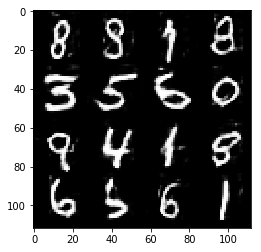

Timestamp 20170805-00-14-01.026 -  Epoch 2/2 -  Step 14010 -  D Loss: 0.4872 - G Loss: 0.3070
Timestamp 20170805-00-14-08.228 -  Epoch 2/2 -  Step 14020 -  D Loss: 0.5999 - G Loss: 2.8289
Timestamp 20170805-00-14-15.432 -  Epoch 2/2 -  Step 14030 -  D Loss: 0.5983 - G Loss: 2.0401
Timestamp 20170805-00-14-22.650 -  Epoch 2/2 -  Step 14040 -  D Loss: 0.4339 - G Loss: 3.2594
Timestamp 20170805-00-14-29.868 -  Epoch 2/2 -  Step 14050 -  D Loss: 0.4591 - G Loss: 3.3000
Timestamp 20170805-00-14-37.086 -  Epoch 2/2 -  Step 14060 -  D Loss: 0.6521 - G Loss: 2.0661
Timestamp 20170805-00-14-44.287 -  Epoch 2/2 -  Step 14070 -  D Loss: 0.9094 - G Loss: 0.9752
Timestamp 20170805-00-14-51.509 -  Epoch 2/2 -  Step 14080 -  D Loss: 0.8014 - G Loss: 0.7832
Timestamp 20170805-00-14-58.727 -  Epoch 2/2 -  Step 14090 -  D Loss: 0.6294 - G Loss: 1.9177
Timestamp 20170805-00-15-05.958 -  Epoch 2/2 -  Step 14100 -  D Loss: 0.4879 - G Loss: 2.6119


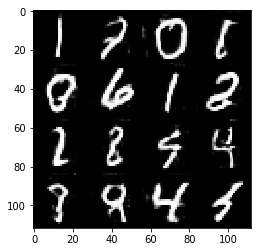

Timestamp 20170805-00-15-13.925 -  Epoch 2/2 -  Step 14110 -  D Loss: 0.5019 - G Loss: 2.7239
Timestamp 20170805-00-15-21.142 -  Epoch 2/2 -  Step 14120 -  D Loss: 0.9206 - G Loss: 2.9485
Timestamp 20170805-00-15-28.371 -  Epoch 2/2 -  Step 14130 -  D Loss: 1.0839 - G Loss: 2.5887
Timestamp 20170805-00-15-35.573 -  Epoch 2/2 -  Step 14140 -  D Loss: 1.0523 - G Loss: 1.7836
Timestamp 20170805-00-15-42.779 -  Epoch 2/2 -  Step 14150 -  D Loss: 1.1493 - G Loss: 1.2510
Timestamp 20170805-00-15-49.994 -  Epoch 2/2 -  Step 14160 -  D Loss: 0.5771 - G Loss: 4.2267
Timestamp 20170805-00-15-57.237 -  Epoch 2/2 -  Step 14170 -  D Loss: 0.5069 - G Loss: 1.4894
Timestamp 20170805-00-16-04.445 -  Epoch 2/2 -  Step 14180 -  D Loss: 0.7796 - G Loss: 1.7803
Timestamp 20170805-00-16-11.668 -  Epoch 2/2 -  Step 14190 -  D Loss: 1.0613 - G Loss: 2.0273
Timestamp 20170805-00-16-18.882 -  Epoch 2/2 -  Step 14200 -  D Loss: 0.5892 - G Loss: 3.8110


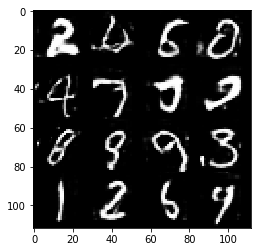

Timestamp 20170805-00-16-26.900 -  Epoch 2/2 -  Step 14210 -  D Loss: 0.8500 - G Loss: 1.5998
Timestamp 20170805-00-16-34.101 -  Epoch 2/2 -  Step 14220 -  D Loss: 0.4849 - G Loss: 1.5299
Timestamp 20170805-00-16-41.293 -  Epoch 2/2 -  Step 14230 -  D Loss: 0.8824 - G Loss: 1.0981
Timestamp 20170805-00-16-48.485 -  Epoch 2/2 -  Step 14240 -  D Loss: 0.9605 - G Loss: 2.5055
Timestamp 20170805-00-16-57.819 -  Epoch 2/2 -  Step 14250 -  D Loss: 0.9092 - G Loss: 2.0730
Timestamp 20170805-00-17-11.353 -  Epoch 2/2 -  Step 14260 -  D Loss: 0.5726 - G Loss: 3.1839
Timestamp 20170805-00-17-24.758 -  Epoch 2/2 -  Step 14270 -  D Loss: 0.6173 - G Loss: 2.1473
Timestamp 20170805-00-17-33.674 -  Epoch 2/2 -  Step 14280 -  D Loss: 0.7764 - G Loss: 1.8470
Timestamp 20170805-00-17-40.931 -  Epoch 2/2 -  Step 14290 -  D Loss: 0.8631 - G Loss: 1.6913
Timestamp 20170805-00-17-48.207 -  Epoch 2/2 -  Step 14300 -  D Loss: 0.5038 - G Loss: 2.5203


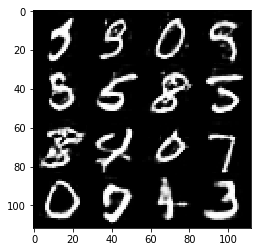

Timestamp 20170805-00-17-56.263 -  Epoch 2/2 -  Step 14310 -  D Loss: 0.6374 - G Loss: 1.1941
Timestamp 20170805-00-18-03.472 -  Epoch 2/2 -  Step 14320 -  D Loss: 0.5316 - G Loss: 2.3835
Timestamp 20170805-00-18-10.680 -  Epoch 2/2 -  Step 14330 -  D Loss: 0.6737 - G Loss: 2.2528
Timestamp 20170805-00-18-17.866 -  Epoch 2/2 -  Step 14340 -  D Loss: 0.4136 - G Loss: 3.1154
Timestamp 20170805-00-18-25.059 -  Epoch 2/2 -  Step 14350 -  D Loss: 0.5518 - G Loss: 2.3948
Timestamp 20170805-00-18-32.248 -  Epoch 2/2 -  Step 14360 -  D Loss: 0.6743 - G Loss: 2.5132
Timestamp 20170805-00-18-39.443 -  Epoch 2/2 -  Step 14370 -  D Loss: 0.6864 - G Loss: 2.3714
Timestamp 20170805-00-18-46.637 -  Epoch 2/2 -  Step 14380 -  D Loss: 0.3974 - G Loss: 3.3004
Timestamp 20170805-00-18-53.823 -  Epoch 2/2 -  Step 14390 -  D Loss: 0.8157 - G Loss: 2.5850
Timestamp 20170805-00-19-01.028 -  Epoch 2/2 -  Step 14400 -  D Loss: 0.5471 - G Loss: 2.3797


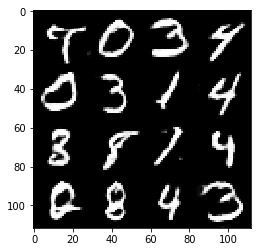

Timestamp 20170805-00-19-08.906 -  Epoch 2/2 -  Step 14410 -  D Loss: 1.1692 - G Loss: 0.7302
Timestamp 20170805-00-19-16.109 -  Epoch 2/2 -  Step 14420 -  D Loss: 0.7137 - G Loss: 1.5811
Timestamp 20170805-00-19-23.323 -  Epoch 2/2 -  Step 14430 -  D Loss: 0.5161 - G Loss: 1.9520
Timestamp 20170805-00-19-30.534 -  Epoch 2/2 -  Step 14440 -  D Loss: 0.5802 - G Loss: 3.7549
Timestamp 20170805-00-19-37.724 -  Epoch 2/2 -  Step 14450 -  D Loss: 0.9108 - G Loss: 1.0363
Timestamp 20170805-00-19-44.901 -  Epoch 2/2 -  Step 14460 -  D Loss: 0.8477 - G Loss: 1.3133
Timestamp 20170805-00-19-52.099 -  Epoch 2/2 -  Step 14470 -  D Loss: 0.8577 - G Loss: 1.5223
Timestamp 20170805-00-19-59.287 -  Epoch 2/2 -  Step 14480 -  D Loss: 0.5486 - G Loss: 2.4295
Timestamp 20170805-00-20-06.482 -  Epoch 2/2 -  Step 14490 -  D Loss: 0.9209 - G Loss: 1.9644
Timestamp 20170805-00-20-13.674 -  Epoch 2/2 -  Step 14500 -  D Loss: 0.5096 - G Loss: 1.7379


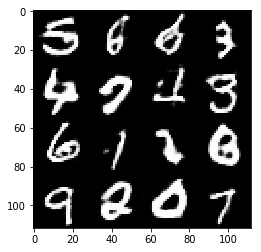

Timestamp 20170805-00-20-21.522 -  Epoch 2/2 -  Step 14510 -  D Loss: 0.7148 - G Loss: 2.6946
Timestamp 20170805-00-20-28.723 -  Epoch 2/2 -  Step 14520 -  D Loss: 0.4442 - G Loss: 3.2290
Timestamp 20170805-00-20-35.911 -  Epoch 2/2 -  Step 14530 -  D Loss: 1.1947 - G Loss: 0.8627
Timestamp 20170805-00-20-43.099 -  Epoch 2/2 -  Step 14540 -  D Loss: 0.4037 - G Loss: 2.8017
Timestamp 20170805-00-20-50.301 -  Epoch 2/2 -  Step 14550 -  D Loss: 0.5396 - G Loss: 2.3013
Timestamp 20170805-00-20-57.497 -  Epoch 2/2 -  Step 14560 -  D Loss: 2.0093 - G Loss: 1.5155
Timestamp 20170805-00-21-04.725 -  Epoch 2/2 -  Step 14570 -  D Loss: 0.8439 - G Loss: 1.5780
Timestamp 20170805-00-21-11.920 -  Epoch 2/2 -  Step 14580 -  D Loss: 1.3256 - G Loss: 0.9130
Timestamp 20170805-00-21-19.125 -  Epoch 2/2 -  Step 14590 -  D Loss: 0.8608 - G Loss: 2.0808
Timestamp 20170805-00-21-26.317 -  Epoch 2/2 -  Step 14600 -  D Loss: 0.4494 - G Loss: 1.6337


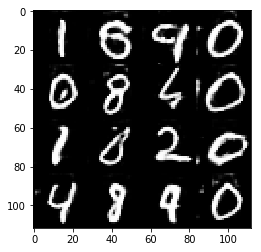

Timestamp 20170805-00-21-34.159 -  Epoch 2/2 -  Step 14610 -  D Loss: 0.7539 - G Loss: 2.3877
Timestamp 20170805-00-21-41.359 -  Epoch 2/2 -  Step 14620 -  D Loss: 0.6288 - G Loss: 2.0524
Timestamp 20170805-00-21-48.557 -  Epoch 2/2 -  Step 14630 -  D Loss: 0.5102 - G Loss: 2.8124
Timestamp 20170805-00-21-55.758 -  Epoch 2/2 -  Step 14640 -  D Loss: 1.4357 - G Loss: 0.2954
Timestamp 20170805-00-22-02.952 -  Epoch 2/2 -  Step 14650 -  D Loss: 0.5871 - G Loss: 2.0791
Timestamp 20170805-00-22-10.142 -  Epoch 2/2 -  Step 14660 -  D Loss: 0.7506 - G Loss: 2.8286
Timestamp 20170805-00-22-17.341 -  Epoch 2/2 -  Step 14670 -  D Loss: 0.5310 - G Loss: 1.9922
Timestamp 20170805-00-22-24.538 -  Epoch 2/2 -  Step 14680 -  D Loss: 0.5745 - G Loss: 0.9029
Timestamp 20170805-00-22-31.748 -  Epoch 2/2 -  Step 14690 -  D Loss: 0.4523 - G Loss: 4.0069
Timestamp 20170805-00-22-38.939 -  Epoch 2/2 -  Step 14700 -  D Loss: 0.8612 - G Loss: 2.4188


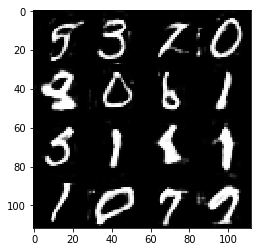

Timestamp 20170805-00-22-46.786 -  Epoch 2/2 -  Step 14710 -  D Loss: 0.6506 - G Loss: 1.8743
Timestamp 20170805-00-22-53.989 -  Epoch 2/2 -  Step 14720 -  D Loss: 1.6779 - G Loss: 1.9293
Timestamp 20170805-00-23-01.209 -  Epoch 2/2 -  Step 14730 -  D Loss: 0.7560 - G Loss: 2.0914
Timestamp 20170805-00-23-08.408 -  Epoch 2/2 -  Step 14740 -  D Loss: 0.6209 - G Loss: 1.3652
Timestamp 20170805-00-23-15.604 -  Epoch 2/2 -  Step 14750 -  D Loss: 0.4610 - G Loss: 3.5172
Timestamp 20170805-00-23-22.789 -  Epoch 2/2 -  Step 14760 -  D Loss: 0.7036 - G Loss: 2.2152
Timestamp 20170805-00-23-29.992 -  Epoch 2/2 -  Step 14770 -  D Loss: 0.4219 - G Loss: 1.6410
Timestamp 20170805-00-23-37.184 -  Epoch 2/2 -  Step 14780 -  D Loss: 0.6353 - G Loss: 1.8912
Timestamp 20170805-00-23-44.398 -  Epoch 2/2 -  Step 14790 -  D Loss: 0.7681 - G Loss: 1.4042
Timestamp 20170805-00-23-51.590 -  Epoch 2/2 -  Step 14800 -  D Loss: 1.2751 - G Loss: 0.8478


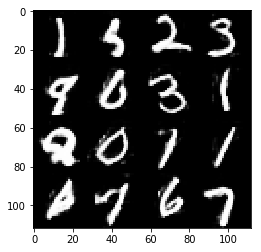

Timestamp 20170805-00-23-59.438 -  Epoch 2/2 -  Step 14810 -  D Loss: 0.7269 - G Loss: 1.9945
Timestamp 20170805-00-24-06.644 -  Epoch 2/2 -  Step 14820 -  D Loss: 0.8113 - G Loss: 0.8773
Timestamp 20170805-00-24-13.831 -  Epoch 2/2 -  Step 14830 -  D Loss: 0.7566 - G Loss: 1.7976
Timestamp 20170805-00-24-21.032 -  Epoch 2/2 -  Step 14840 -  D Loss: 0.3924 - G Loss: 2.3050
Timestamp 20170805-00-24-28.225 -  Epoch 2/2 -  Step 14850 -  D Loss: 0.6727 - G Loss: 1.8755
Timestamp 20170805-00-24-35.413 -  Epoch 2/2 -  Step 14860 -  D Loss: 0.5016 - G Loss: 2.2900
Timestamp 20170805-00-24-42.605 -  Epoch 2/2 -  Step 14870 -  D Loss: 0.9306 - G Loss: 2.8818
Timestamp 20170805-00-24-49.802 -  Epoch 2/2 -  Step 14880 -  D Loss: 2.0349 - G Loss: 0.8463
Timestamp 20170805-00-24-57.000 -  Epoch 2/2 -  Step 14890 -  D Loss: 0.5758 - G Loss: 3.2352
Timestamp 20170805-00-25-04.189 -  Epoch 2/2 -  Step 14900 -  D Loss: 0.9039 - G Loss: 1.5474


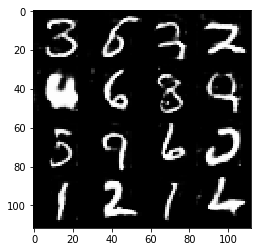

Timestamp 20170805-00-25-12.046 -  Epoch 2/2 -  Step 14910 -  D Loss: 0.8666 - G Loss: 0.6876
Timestamp 20170805-00-25-19.247 -  Epoch 2/2 -  Step 14920 -  D Loss: 1.0516 - G Loss: 0.9895
Timestamp 20170805-00-25-26.435 -  Epoch 2/2 -  Step 14930 -  D Loss: 0.6685 - G Loss: 1.2225
Timestamp 20170805-00-25-33.620 -  Epoch 2/2 -  Step 14940 -  D Loss: 0.9597 - G Loss: 1.2689
Timestamp 20170805-00-25-40.810 -  Epoch 2/2 -  Step 14950 -  D Loss: 0.5335 - G Loss: 1.6063
Timestamp 20170805-00-25-48.010 -  Epoch 2/2 -  Step 14960 -  D Loss: 0.8292 - G Loss: 2.6144
Timestamp 20170805-00-25-55.192 -  Epoch 2/2 -  Step 14970 -  D Loss: 0.6898 - G Loss: 1.3777
Timestamp 20170805-00-26-02.387 -  Epoch 2/2 -  Step 14980 -  D Loss: 0.6444 - G Loss: 2.6443
Timestamp 20170805-00-26-09.586 -  Epoch 2/2 -  Step 14990 -  D Loss: 1.1850 - G Loss: 2.2202
Timestamp 20170805-00-26-16.779 -  Epoch 2/2 -  Step 15000 -  D Loss: 0.5364 - G Loss: 2.0959


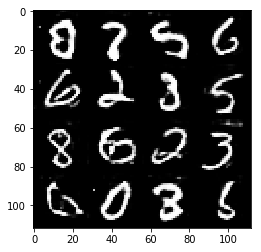

In [12]:
batch_size = 8
z_dim = 100
learning_rate = 0.0002
beta1 = 0.5

tf.reset_default_graph()

"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 2

mnist_dataset = helper.Dataset('mnist', glob(os.path.join(data_dir, 'mnist/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, mnist_dataset.get_batches,
          mnist_dataset.shape, mnist_dataset.image_mode)

### CelebA
Run your GANs on CelebA.  It will take around 20 minutes on the average GPU to run one epoch.  You can run the whole epoch or stop when it starts to generate realistic faces.

Timestamp 20170805-00-26-33.027 -  Epoch 1/1 -  Step 10 -  D Loss: 0.6982 - G Loss: 2.3426
Timestamp 20170805-00-26-40.335 -  Epoch 1/1 -  Step 20 -  D Loss: 1.0654 - G Loss: 2.1828
Timestamp 20170805-00-26-47.643 -  Epoch 1/1 -  Step 30 -  D Loss: 0.8685 - G Loss: 1.4773
Timestamp 20170805-00-26-54.964 -  Epoch 1/1 -  Step 40 -  D Loss: 0.6099 - G Loss: 3.5630
Timestamp 20170805-00-27-02.261 -  Epoch 1/1 -  Step 50 -  D Loss: 0.4592 - G Loss: 4.5630
Timestamp 20170805-00-27-09.572 -  Epoch 1/1 -  Step 60 -  D Loss: 0.4988 - G Loss: 2.6434
Timestamp 20170805-00-27-16.870 -  Epoch 1/1 -  Step 70 -  D Loss: 0.6041 - G Loss: 4.2643
Timestamp 20170805-00-27-24.174 -  Epoch 1/1 -  Step 80 -  D Loss: 0.8526 - G Loss: 3.3019
Timestamp 20170805-00-27-31.498 -  Epoch 1/1 -  Step 90 -  D Loss: 1.2540 - G Loss: 1.3695
Timestamp 20170805-00-27-38.812 -  Epoch 1/1 -  Step 100 -  D Loss: 0.5469 - G Loss: 3.7739


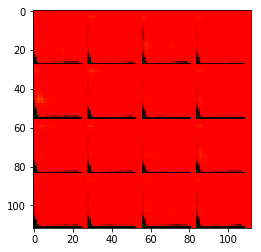

Timestamp 20170805-00-27-46.700 -  Epoch 1/1 -  Step 110 -  D Loss: 1.2301 - G Loss: 1.4356
Timestamp 20170805-00-27-54.013 -  Epoch 1/1 -  Step 120 -  D Loss: 4.6215 - G Loss: 0.0896
Timestamp 20170805-00-28-01.325 -  Epoch 1/1 -  Step 130 -  D Loss: 0.8829 - G Loss: 2.6723
Timestamp 20170805-00-28-08.631 -  Epoch 1/1 -  Step 140 -  D Loss: 0.5005 - G Loss: 3.4054
Timestamp 20170805-00-28-15.927 -  Epoch 1/1 -  Step 150 -  D Loss: 1.1544 - G Loss: 4.8398
Timestamp 20170805-00-28-23.220 -  Epoch 1/1 -  Step 160 -  D Loss: 0.7770 - G Loss: 2.2207
Timestamp 20170805-00-28-30.536 -  Epoch 1/1 -  Step 170 -  D Loss: 0.8941 - G Loss: 5.4206
Timestamp 20170805-00-28-37.834 -  Epoch 1/1 -  Step 180 -  D Loss: 0.5656 - G Loss: 2.9519
Timestamp 20170805-00-28-45.122 -  Epoch 1/1 -  Step 190 -  D Loss: 0.7297 - G Loss: 3.2394
Timestamp 20170805-00-28-52.429 -  Epoch 1/1 -  Step 200 -  D Loss: 0.8775 - G Loss: 1.3421


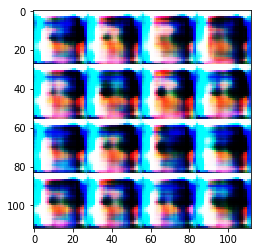

Timestamp 20170805-00-29-00.184 -  Epoch 1/1 -  Step 210 -  D Loss: 1.1687 - G Loss: 1.7396
Timestamp 20170805-00-29-07.477 -  Epoch 1/1 -  Step 220 -  D Loss: 0.9820 - G Loss: 1.0818
Timestamp 20170805-00-29-14.757 -  Epoch 1/1 -  Step 230 -  D Loss: 1.1604 - G Loss: 1.0058
Timestamp 20170805-00-29-22.077 -  Epoch 1/1 -  Step 240 -  D Loss: 1.2592 - G Loss: 3.3537
Timestamp 20170805-00-29-29.369 -  Epoch 1/1 -  Step 250 -  D Loss: 0.6555 - G Loss: 2.2499
Timestamp 20170805-00-29-36.681 -  Epoch 1/1 -  Step 260 -  D Loss: 0.8325 - G Loss: 6.9335
Timestamp 20170805-00-29-43.978 -  Epoch 1/1 -  Step 270 -  D Loss: 1.6949 - G Loss: 1.9092
Timestamp 20170805-00-29-51.293 -  Epoch 1/1 -  Step 280 -  D Loss: 1.2408 - G Loss: 4.4680
Timestamp 20170805-00-29-58.592 -  Epoch 1/1 -  Step 290 -  D Loss: 0.8261 - G Loss: 3.6008
Timestamp 20170805-00-30-05.890 -  Epoch 1/1 -  Step 300 -  D Loss: 1.0134 - G Loss: 1.2843


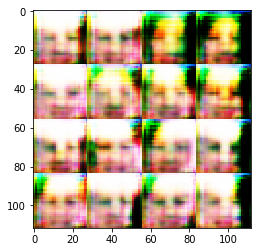

Timestamp 20170805-00-30-13.644 -  Epoch 1/1 -  Step 310 -  D Loss: 1.5947 - G Loss: 0.7135
Timestamp 20170805-00-30-20.946 -  Epoch 1/1 -  Step 320 -  D Loss: 0.8567 - G Loss: 2.7206
Timestamp 20170805-00-30-28.239 -  Epoch 1/1 -  Step 330 -  D Loss: 1.9836 - G Loss: 0.6806
Timestamp 20170805-00-30-35.527 -  Epoch 1/1 -  Step 340 -  D Loss: 1.5944 - G Loss: 1.5872
Timestamp 20170805-00-30-42.824 -  Epoch 1/1 -  Step 350 -  D Loss: 1.5661 - G Loss: 1.1824
Timestamp 20170805-00-30-50.127 -  Epoch 1/1 -  Step 360 -  D Loss: 0.9844 - G Loss: 2.7668
Timestamp 20170805-00-30-57.425 -  Epoch 1/1 -  Step 370 -  D Loss: 1.5312 - G Loss: 1.6869
Timestamp 20170805-00-31-04.725 -  Epoch 1/1 -  Step 380 -  D Loss: 0.9750 - G Loss: 1.4739
Timestamp 20170805-00-31-12.017 -  Epoch 1/1 -  Step 390 -  D Loss: 0.8332 - G Loss: 0.6711
Timestamp 20170805-00-31-19.330 -  Epoch 1/1 -  Step 400 -  D Loss: 0.7823 - G Loss: 1.4986


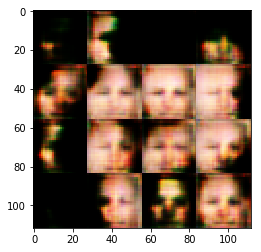

Timestamp 20170805-00-31-27.093 -  Epoch 1/1 -  Step 410 -  D Loss: 0.7086 - G Loss: 1.1079
Timestamp 20170805-00-31-34.393 -  Epoch 1/1 -  Step 420 -  D Loss: 1.1627 - G Loss: 1.1007
Timestamp 20170805-00-31-41.686 -  Epoch 1/1 -  Step 430 -  D Loss: 0.5183 - G Loss: 2.1465
Timestamp 20170805-00-31-48.965 -  Epoch 1/1 -  Step 440 -  D Loss: 0.7640 - G Loss: 1.2784
Timestamp 20170805-00-31-56.268 -  Epoch 1/1 -  Step 450 -  D Loss: 0.8234 - G Loss: 3.6667
Timestamp 20170805-00-32-03.573 -  Epoch 1/1 -  Step 460 -  D Loss: 1.0479 - G Loss: 1.9197
Timestamp 20170805-00-32-10.877 -  Epoch 1/1 -  Step 470 -  D Loss: 0.7255 - G Loss: 2.3165
Timestamp 20170805-00-32-18.185 -  Epoch 1/1 -  Step 480 -  D Loss: 1.6283 - G Loss: 1.0157
Timestamp 20170805-00-32-25.497 -  Epoch 1/1 -  Step 490 -  D Loss: 0.7061 - G Loss: 4.4307
Timestamp 20170805-00-32-32.794 -  Epoch 1/1 -  Step 500 -  D Loss: 0.5757 - G Loss: 2.7469


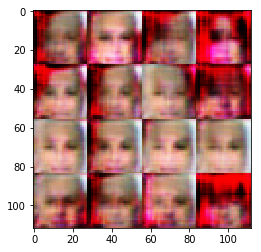

Timestamp 20170805-00-32-40.557 -  Epoch 1/1 -  Step 510 -  D Loss: 0.5104 - G Loss: 3.2478
Timestamp 20170805-00-32-47.850 -  Epoch 1/1 -  Step 520 -  D Loss: 0.7097 - G Loss: 2.2029
Timestamp 20170805-00-32-55.166 -  Epoch 1/1 -  Step 530 -  D Loss: 1.0799 - G Loss: 3.0995
Timestamp 20170805-00-33-02.465 -  Epoch 1/1 -  Step 540 -  D Loss: 0.9651 - G Loss: 2.8956
Timestamp 20170805-00-33-09.744 -  Epoch 1/1 -  Step 550 -  D Loss: 0.6427 - G Loss: 1.7613
Timestamp 20170805-00-33-17.063 -  Epoch 1/1 -  Step 560 -  D Loss: 0.6624 - G Loss: 2.3888
Timestamp 20170805-00-33-24.357 -  Epoch 1/1 -  Step 570 -  D Loss: 0.7732 - G Loss: 1.8696
Timestamp 20170805-00-33-31.654 -  Epoch 1/1 -  Step 580 -  D Loss: 0.7654 - G Loss: 1.9564
Timestamp 20170805-00-33-38.971 -  Epoch 1/1 -  Step 590 -  D Loss: 1.3004 - G Loss: 1.1362
Timestamp 20170805-00-33-46.261 -  Epoch 1/1 -  Step 600 -  D Loss: 1.3470 - G Loss: 1.2935


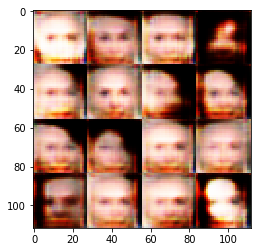

Timestamp 20170805-00-33-54.011 -  Epoch 1/1 -  Step 610 -  D Loss: 0.6386 - G Loss: 2.3946
Timestamp 20170805-00-34-01.316 -  Epoch 1/1 -  Step 620 -  D Loss: 1.2972 - G Loss: 0.6221
Timestamp 20170805-00-34-08.647 -  Epoch 1/1 -  Step 630 -  D Loss: 0.6394 - G Loss: 1.4692
Timestamp 20170805-00-34-15.950 -  Epoch 1/1 -  Step 640 -  D Loss: 1.1115 - G Loss: 1.6498
Timestamp 20170805-00-34-23.259 -  Epoch 1/1 -  Step 650 -  D Loss: 1.6837 - G Loss: 0.6508
Timestamp 20170805-00-34-30.552 -  Epoch 1/1 -  Step 660 -  D Loss: 0.5090 - G Loss: 2.8810
Timestamp 20170805-00-34-37.850 -  Epoch 1/1 -  Step 670 -  D Loss: 0.7647 - G Loss: 2.3516
Timestamp 20170805-00-34-45.154 -  Epoch 1/1 -  Step 680 -  D Loss: 0.7600 - G Loss: 1.5339
Timestamp 20170805-00-34-52.462 -  Epoch 1/1 -  Step 690 -  D Loss: 0.4955 - G Loss: 4.2094
Timestamp 20170805-00-34-59.752 -  Epoch 1/1 -  Step 700 -  D Loss: 0.5458 - G Loss: 2.6724


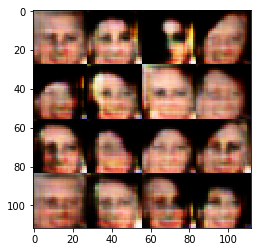

Timestamp 20170805-00-35-07.509 -  Epoch 1/1 -  Step 710 -  D Loss: 0.8488 - G Loss: 1.5228
Timestamp 20170805-00-35-14.795 -  Epoch 1/1 -  Step 720 -  D Loss: 0.6559 - G Loss: 1.7952
Timestamp 20170805-00-35-22.094 -  Epoch 1/1 -  Step 730 -  D Loss: 0.8892 - G Loss: 1.0795
Timestamp 20170805-00-35-29.391 -  Epoch 1/1 -  Step 740 -  D Loss: 0.9665 - G Loss: 0.8890
Timestamp 20170805-00-35-36.694 -  Epoch 1/1 -  Step 750 -  D Loss: 0.8884 - G Loss: 1.4451
Timestamp 20170805-00-35-43.995 -  Epoch 1/1 -  Step 760 -  D Loss: 0.5087 - G Loss: 2.3836
Timestamp 20170805-00-35-51.297 -  Epoch 1/1 -  Step 770 -  D Loss: 0.5569 - G Loss: 2.8053
Timestamp 20170805-00-35-58.593 -  Epoch 1/1 -  Step 780 -  D Loss: 0.9076 - G Loss: 1.6320
Timestamp 20170805-00-36-05.874 -  Epoch 1/1 -  Step 790 -  D Loss: 1.0295 - G Loss: 1.2518
Timestamp 20170805-00-36-13.181 -  Epoch 1/1 -  Step 800 -  D Loss: 0.9621 - G Loss: 1.7201


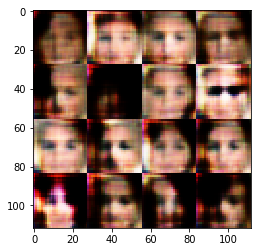

Timestamp 20170805-00-36-20.970 -  Epoch 1/1 -  Step 810 -  D Loss: 0.6223 - G Loss: 1.7269
Timestamp 20170805-00-36-28.268 -  Epoch 1/1 -  Step 820 -  D Loss: 1.5422 - G Loss: 0.8634
Timestamp 20170805-00-36-35.566 -  Epoch 1/1 -  Step 830 -  D Loss: 0.8015 - G Loss: 2.0426
Timestamp 20170805-00-36-42.860 -  Epoch 1/1 -  Step 840 -  D Loss: 0.7489 - G Loss: 1.5381
Timestamp 20170805-00-36-50.159 -  Epoch 1/1 -  Step 850 -  D Loss: 0.6694 - G Loss: 1.0620
Timestamp 20170805-00-36-57.465 -  Epoch 1/1 -  Step 860 -  D Loss: 0.6099 - G Loss: 2.4595
Timestamp 20170805-00-37-04.766 -  Epoch 1/1 -  Step 870 -  D Loss: 0.5917 - G Loss: 2.1398
Timestamp 20170805-00-37-12.066 -  Epoch 1/1 -  Step 880 -  D Loss: 0.5251 - G Loss: 2.7558
Timestamp 20170805-00-37-19.374 -  Epoch 1/1 -  Step 890 -  D Loss: 1.3026 - G Loss: 0.4632
Timestamp 20170805-00-37-26.682 -  Epoch 1/1 -  Step 900 -  D Loss: 1.0433 - G Loss: 1.2711


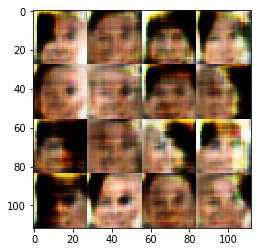

Timestamp 20170805-00-37-34.471 -  Epoch 1/1 -  Step 910 -  D Loss: 0.4761 - G Loss: 3.0066
Timestamp 20170805-00-37-41.758 -  Epoch 1/1 -  Step 920 -  D Loss: 0.9538 - G Loss: 1.2863
Timestamp 20170805-00-37-49.046 -  Epoch 1/1 -  Step 930 -  D Loss: 0.6338 - G Loss: 1.5390
Timestamp 20170805-00-37-56.351 -  Epoch 1/1 -  Step 940 -  D Loss: 0.5350 - G Loss: 3.3077
Timestamp 20170805-00-38-03.636 -  Epoch 1/1 -  Step 950 -  D Loss: 0.9753 - G Loss: 1.5605
Timestamp 20170805-00-38-10.941 -  Epoch 1/1 -  Step 960 -  D Loss: 0.6704 - G Loss: 2.6296
Timestamp 20170805-00-38-18.239 -  Epoch 1/1 -  Step 970 -  D Loss: 1.0492 - G Loss: 1.2480
Timestamp 20170805-00-38-25.531 -  Epoch 1/1 -  Step 980 -  D Loss: 0.8830 - G Loss: 2.6639
Timestamp 20170805-00-38-32.820 -  Epoch 1/1 -  Step 990 -  D Loss: 1.2830 - G Loss: 1.2509
Timestamp 20170805-00-38-40.129 -  Epoch 1/1 -  Step 1000 -  D Loss: 0.8551 - G Loss: 1.7675


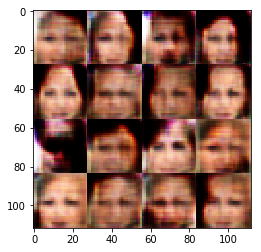

Timestamp 20170805-00-38-47.885 -  Epoch 1/1 -  Step 1010 -  D Loss: 1.4709 - G Loss: 0.8202
Timestamp 20170805-00-38-55.199 -  Epoch 1/1 -  Step 1020 -  D Loss: 0.8160 - G Loss: 2.2055
Timestamp 20170805-00-39-02.498 -  Epoch 1/1 -  Step 1030 -  D Loss: 0.7030 - G Loss: 2.5607
Timestamp 20170805-00-39-09.798 -  Epoch 1/1 -  Step 1040 -  D Loss: 1.0450 - G Loss: 0.7283
Timestamp 20170805-00-39-17.083 -  Epoch 1/1 -  Step 1050 -  D Loss: 0.7207 - G Loss: 1.8396
Timestamp 20170805-00-39-24.394 -  Epoch 1/1 -  Step 1060 -  D Loss: 0.5780 - G Loss: 2.6741
Timestamp 20170805-00-39-31.684 -  Epoch 1/1 -  Step 1070 -  D Loss: 0.6163 - G Loss: 1.7752
Timestamp 20170805-00-39-38.971 -  Epoch 1/1 -  Step 1080 -  D Loss: 0.6524 - G Loss: 2.2615
Timestamp 20170805-00-39-46.271 -  Epoch 1/1 -  Step 1090 -  D Loss: 0.6012 - G Loss: 2.5239
Timestamp 20170805-00-39-53.564 -  Epoch 1/1 -  Step 1100 -  D Loss: 0.7071 - G Loss: 1.9194


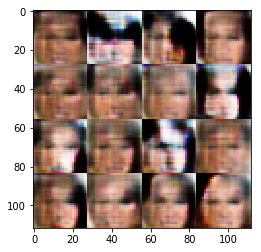

Timestamp 20170805-00-40-01.331 -  Epoch 1/1 -  Step 1110 -  D Loss: 1.6711 - G Loss: 0.5173
Timestamp 20170805-00-40-08.623 -  Epoch 1/1 -  Step 1120 -  D Loss: 0.4160 - G Loss: 3.7477
Timestamp 20170805-00-40-15.930 -  Epoch 1/1 -  Step 1130 -  D Loss: 1.4077 - G Loss: 0.5928
Timestamp 20170805-00-40-23.222 -  Epoch 1/1 -  Step 1140 -  D Loss: 0.8844 - G Loss: 3.0768
Timestamp 20170805-00-40-30.545 -  Epoch 1/1 -  Step 1150 -  D Loss: 0.8399 - G Loss: 1.4893
Timestamp 20170805-00-40-37.844 -  Epoch 1/1 -  Step 1160 -  D Loss: 0.9493 - G Loss: 1.5308
Timestamp 20170805-00-40-45.136 -  Epoch 1/1 -  Step 1170 -  D Loss: 0.8658 - G Loss: 1.3498
Timestamp 20170805-00-40-52.453 -  Epoch 1/1 -  Step 1180 -  D Loss: 1.0012 - G Loss: 0.6800
Timestamp 20170805-00-40-59.765 -  Epoch 1/1 -  Step 1190 -  D Loss: 0.7846 - G Loss: 1.9379
Timestamp 20170805-00-41-07.048 -  Epoch 1/1 -  Step 1200 -  D Loss: 0.7339 - G Loss: 1.6233


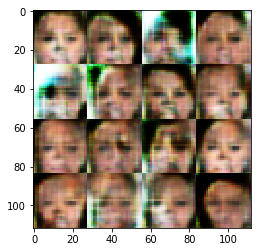

Timestamp 20170805-00-41-14.809 -  Epoch 1/1 -  Step 1210 -  D Loss: 0.8906 - G Loss: 1.6097
Timestamp 20170805-00-41-22.111 -  Epoch 1/1 -  Step 1220 -  D Loss: 1.1727 - G Loss: 1.1545
Timestamp 20170805-00-41-29.422 -  Epoch 1/1 -  Step 1230 -  D Loss: 0.3968 - G Loss: 4.5730
Timestamp 20170805-00-41-36.723 -  Epoch 1/1 -  Step 1240 -  D Loss: 0.6236 - G Loss: 1.9945
Timestamp 20170805-00-41-44.020 -  Epoch 1/1 -  Step 1250 -  D Loss: 0.7213 - G Loss: 1.8136
Timestamp 20170805-00-41-51.323 -  Epoch 1/1 -  Step 1260 -  D Loss: 0.4920 - G Loss: 1.8295
Timestamp 20170805-00-41-58.608 -  Epoch 1/1 -  Step 1270 -  D Loss: 1.8344 - G Loss: 0.4898
Timestamp 20170805-00-42-05.915 -  Epoch 1/1 -  Step 1280 -  D Loss: 1.8971 - G Loss: 0.3054
Timestamp 20170805-00-42-13.222 -  Epoch 1/1 -  Step 1290 -  D Loss: 0.9665 - G Loss: 1.2922
Timestamp 20170805-00-42-20.524 -  Epoch 1/1 -  Step 1300 -  D Loss: 1.0790 - G Loss: 0.9570


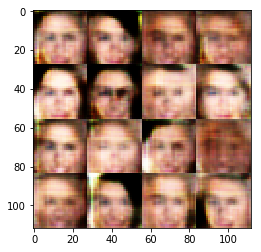

Timestamp 20170805-00-42-28.311 -  Epoch 1/1 -  Step 1310 -  D Loss: 0.8817 - G Loss: 4.0109
Timestamp 20170805-00-42-35.601 -  Epoch 1/1 -  Step 1320 -  D Loss: 0.6425 - G Loss: 1.5837
Timestamp 20170805-00-42-42.895 -  Epoch 1/1 -  Step 1330 -  D Loss: 1.0324 - G Loss: 2.1114
Timestamp 20170805-00-42-50.204 -  Epoch 1/1 -  Step 1340 -  D Loss: 0.9931 - G Loss: 1.1824
Timestamp 20170805-00-42-57.507 -  Epoch 1/1 -  Step 1350 -  D Loss: 0.5957 - G Loss: 2.4788
Timestamp 20170805-00-43-04.814 -  Epoch 1/1 -  Step 1360 -  D Loss: 0.6618 - G Loss: 2.9955
Timestamp 20170805-00-43-12.132 -  Epoch 1/1 -  Step 1370 -  D Loss: 1.0470 - G Loss: 1.2054
Timestamp 20170805-00-43-19.441 -  Epoch 1/1 -  Step 1380 -  D Loss: 1.0898 - G Loss: 2.2274
Timestamp 20170805-00-43-26.730 -  Epoch 1/1 -  Step 1390 -  D Loss: 0.7054 - G Loss: 1.3299
Timestamp 20170805-00-43-34.032 -  Epoch 1/1 -  Step 1400 -  D Loss: 0.9786 - G Loss: 0.6450


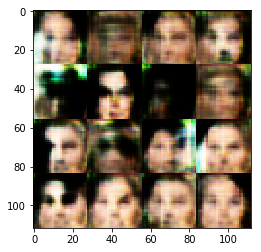

Timestamp 20170805-00-43-41.794 -  Epoch 1/1 -  Step 1410 -  D Loss: 1.4184 - G Loss: 0.8500
Timestamp 20170805-00-43-49.096 -  Epoch 1/1 -  Step 1420 -  D Loss: 0.6344 - G Loss: 1.7223
Timestamp 20170805-00-43-56.396 -  Epoch 1/1 -  Step 1430 -  D Loss: 1.0970 - G Loss: 1.8706
Timestamp 20170805-00-44-03.684 -  Epoch 1/1 -  Step 1440 -  D Loss: 0.8996 - G Loss: 1.5074
Timestamp 20170805-00-44-10.956 -  Epoch 1/1 -  Step 1450 -  D Loss: 1.1636 - G Loss: 2.1981
Timestamp 20170805-00-44-18.240 -  Epoch 1/1 -  Step 1460 -  D Loss: 0.6608 - G Loss: 1.4720
Timestamp 20170805-00-44-25.533 -  Epoch 1/1 -  Step 1470 -  D Loss: 0.7421 - G Loss: 3.1886
Timestamp 20170805-00-44-32.839 -  Epoch 1/1 -  Step 1480 -  D Loss: 0.8951 - G Loss: 1.8718
Timestamp 20170805-00-44-40.143 -  Epoch 1/1 -  Step 1490 -  D Loss: 0.4930 - G Loss: 3.1612
Timestamp 20170805-00-44-47.443 -  Epoch 1/1 -  Step 1500 -  D Loss: 0.8372 - G Loss: 1.2852


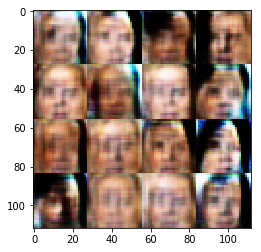

Timestamp 20170805-00-44-55.209 -  Epoch 1/1 -  Step 1510 -  D Loss: 0.8265 - G Loss: 1.5375
Timestamp 20170805-00-45-02.503 -  Epoch 1/1 -  Step 1520 -  D Loss: 0.4664 - G Loss: 5.4203
Timestamp 20170805-00-45-09.816 -  Epoch 1/1 -  Step 1530 -  D Loss: 0.4511 - G Loss: 2.6750
Timestamp 20170805-00-45-17.115 -  Epoch 1/1 -  Step 1540 -  D Loss: 0.6692 - G Loss: 1.6462
Timestamp 20170805-00-45-24.422 -  Epoch 1/1 -  Step 1550 -  D Loss: 0.7828 - G Loss: 1.9621
Timestamp 20170805-00-45-31.735 -  Epoch 1/1 -  Step 1560 -  D Loss: 0.7775 - G Loss: 1.5017
Timestamp 20170805-00-45-39.042 -  Epoch 1/1 -  Step 1570 -  D Loss: 1.0046 - G Loss: 2.3659
Timestamp 20170805-00-45-46.340 -  Epoch 1/1 -  Step 1580 -  D Loss: 0.5606 - G Loss: 2.3670
Timestamp 20170805-00-45-53.627 -  Epoch 1/1 -  Step 1590 -  D Loss: 0.9830 - G Loss: 1.6622
Timestamp 20170805-00-46-00.933 -  Epoch 1/1 -  Step 1600 -  D Loss: 0.3990 - G Loss: 3.4090


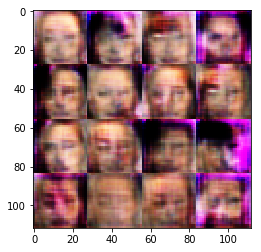

Timestamp 20170805-00-46-08.704 -  Epoch 1/1 -  Step 1610 -  D Loss: 0.8705 - G Loss: 3.2433
Timestamp 20170805-00-46-16.000 -  Epoch 1/1 -  Step 1620 -  D Loss: 0.6609 - G Loss: 2.1976
Timestamp 20170805-00-46-23.292 -  Epoch 1/1 -  Step 1630 -  D Loss: 0.5743 - G Loss: 2.4309
Timestamp 20170805-00-46-30.598 -  Epoch 1/1 -  Step 1640 -  D Loss: 1.0646 - G Loss: 1.2465
Timestamp 20170805-00-46-37.875 -  Epoch 1/1 -  Step 1650 -  D Loss: 0.5409 - G Loss: 2.4034
Timestamp 20170805-00-46-45.177 -  Epoch 1/1 -  Step 1660 -  D Loss: 0.8660 - G Loss: 0.9611
Timestamp 20170805-00-46-52.484 -  Epoch 1/1 -  Step 1670 -  D Loss: 0.5709 - G Loss: 2.1307
Timestamp 20170805-00-46-59.789 -  Epoch 1/1 -  Step 1680 -  D Loss: 0.5926 - G Loss: 3.0483
Timestamp 20170805-00-47-07.089 -  Epoch 1/1 -  Step 1690 -  D Loss: 0.9261 - G Loss: 2.3157
Timestamp 20170805-00-47-14.381 -  Epoch 1/1 -  Step 1700 -  D Loss: 0.4978 - G Loss: 3.7394


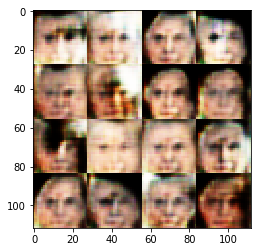

Timestamp 20170805-00-47-22.531 -  Epoch 1/1 -  Step 1710 -  D Loss: 0.5411 - G Loss: 2.6705
Timestamp 20170805-00-47-29.955 -  Epoch 1/1 -  Step 1720 -  D Loss: 1.4416 - G Loss: 1.9686
Timestamp 20170805-00-47-37.501 -  Epoch 1/1 -  Step 1730 -  D Loss: 0.7707 - G Loss: 1.3399
Timestamp 20170805-00-47-45.019 -  Epoch 1/1 -  Step 1740 -  D Loss: 0.9545 - G Loss: 1.1827
Timestamp 20170805-00-47-52.497 -  Epoch 1/1 -  Step 1750 -  D Loss: 1.7706 - G Loss: 0.3535
Timestamp 20170805-00-47-59.880 -  Epoch 1/1 -  Step 1760 -  D Loss: 0.7816 - G Loss: 1.4710
Timestamp 20170805-00-48-07.300 -  Epoch 1/1 -  Step 1770 -  D Loss: 0.8416 - G Loss: 3.4228
Timestamp 20170805-00-48-14.778 -  Epoch 1/1 -  Step 1780 -  D Loss: 0.5508 - G Loss: 2.1212
Timestamp 20170805-00-48-22.220 -  Epoch 1/1 -  Step 1790 -  D Loss: 0.7188 - G Loss: 2.1413
Timestamp 20170805-00-48-29.634 -  Epoch 1/1 -  Step 1800 -  D Loss: 0.8548 - G Loss: 1.3476


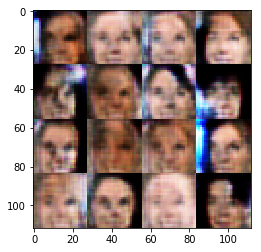

Timestamp 20170805-00-48-37.545 -  Epoch 1/1 -  Step 1810 -  D Loss: 1.6179 - G Loss: 0.6087
Timestamp 20170805-00-48-44.873 -  Epoch 1/1 -  Step 1820 -  D Loss: 0.4997 - G Loss: 2.9445
Timestamp 20170805-00-48-52.226 -  Epoch 1/1 -  Step 1830 -  D Loss: 0.9134 - G Loss: 1.1891
Timestamp 20170805-00-48-59.654 -  Epoch 1/1 -  Step 1840 -  D Loss: 0.4906 - G Loss: 2.4880
Timestamp 20170805-00-49-07.298 -  Epoch 1/1 -  Step 1850 -  D Loss: 0.8471 - G Loss: 1.0391
Timestamp 20170805-00-49-14.968 -  Epoch 1/1 -  Step 1860 -  D Loss: 0.9114 - G Loss: 1.9382
Timestamp 20170805-00-49-22.304 -  Epoch 1/1 -  Step 1870 -  D Loss: 0.8787 - G Loss: 2.5372
Timestamp 20170805-00-49-29.981 -  Epoch 1/1 -  Step 1880 -  D Loss: 0.4468 - G Loss: 3.3289
Timestamp 20170805-00-49-37.313 -  Epoch 1/1 -  Step 1890 -  D Loss: 1.0622 - G Loss: 1.3008
Timestamp 20170805-00-49-44.688 -  Epoch 1/1 -  Step 1900 -  D Loss: 0.4268 - G Loss: 3.1255


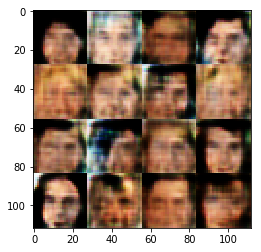

Timestamp 20170805-00-49-52.566 -  Epoch 1/1 -  Step 1910 -  D Loss: 0.9694 - G Loss: 1.2325
Timestamp 20170805-00-49-59.974 -  Epoch 1/1 -  Step 1920 -  D Loss: 1.1991 - G Loss: 1.1961
Timestamp 20170805-00-50-07.326 -  Epoch 1/1 -  Step 1930 -  D Loss: 0.7201 - G Loss: 3.1411
Timestamp 20170805-00-50-14.721 -  Epoch 1/1 -  Step 1940 -  D Loss: 0.6904 - G Loss: 2.2089
Timestamp 20170805-00-50-22.067 -  Epoch 1/1 -  Step 1950 -  D Loss: 0.8982 - G Loss: 0.9759
Timestamp 20170805-00-50-29.429 -  Epoch 1/1 -  Step 1960 -  D Loss: 0.5252 - G Loss: 2.7276
Timestamp 20170805-00-50-36.790 -  Epoch 1/1 -  Step 1970 -  D Loss: 1.4662 - G Loss: 1.0126
Timestamp 20170805-00-50-44.210 -  Epoch 1/1 -  Step 1980 -  D Loss: 0.9877 - G Loss: 4.1502
Timestamp 20170805-00-50-51.714 -  Epoch 1/1 -  Step 1990 -  D Loss: 0.8072 - G Loss: 2.7454
Timestamp 20170805-00-50-59.260 -  Epoch 1/1 -  Step 2000 -  D Loss: 1.1978 - G Loss: 1.2030


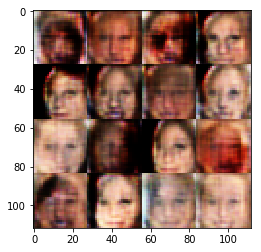

Timestamp 20170805-00-51-07.206 -  Epoch 1/1 -  Step 2010 -  D Loss: 0.9108 - G Loss: 0.9983
Timestamp 20170805-00-51-14.830 -  Epoch 1/1 -  Step 2020 -  D Loss: 1.1801 - G Loss: 0.6297
Timestamp 20170805-00-51-22.318 -  Epoch 1/1 -  Step 2030 -  D Loss: 0.8260 - G Loss: 2.8299
Timestamp 20170805-00-51-29.743 -  Epoch 1/1 -  Step 2040 -  D Loss: 0.9274 - G Loss: 1.1355
Timestamp 20170805-00-51-37.198 -  Epoch 1/1 -  Step 2050 -  D Loss: 1.0536 - G Loss: 1.7865
Timestamp 20170805-00-51-44.548 -  Epoch 1/1 -  Step 2060 -  D Loss: 0.6548 - G Loss: 1.9131
Timestamp 20170805-00-51-51.981 -  Epoch 1/1 -  Step 2070 -  D Loss: 1.1816 - G Loss: 0.4321
Timestamp 20170805-00-51-59.846 -  Epoch 1/1 -  Step 2080 -  D Loss: 0.7684 - G Loss: 1.2993
Timestamp 20170805-00-52-07.296 -  Epoch 1/1 -  Step 2090 -  D Loss: 0.5716 - G Loss: 2.4906
Timestamp 20170805-00-52-14.650 -  Epoch 1/1 -  Step 2100 -  D Loss: 0.5236 - G Loss: 6.3149


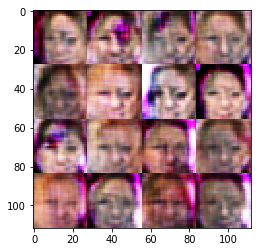

Timestamp 20170805-00-52-22.984 -  Epoch 1/1 -  Step 2110 -  D Loss: 0.9201 - G Loss: 1.0373
Timestamp 20170805-00-52-30.421 -  Epoch 1/1 -  Step 2120 -  D Loss: 0.9979 - G Loss: 1.3220
Timestamp 20170805-00-52-37.837 -  Epoch 1/1 -  Step 2130 -  D Loss: 0.5478 - G Loss: 2.6582
Timestamp 20170805-00-52-45.253 -  Epoch 1/1 -  Step 2140 -  D Loss: 0.8024 - G Loss: 1.4756
Timestamp 20170805-00-52-52.593 -  Epoch 1/1 -  Step 2150 -  D Loss: 0.6696 - G Loss: 1.0748
Timestamp 20170805-00-52-59.943 -  Epoch 1/1 -  Step 2160 -  D Loss: 0.5356 - G Loss: 2.3480
Timestamp 20170805-00-53-07.383 -  Epoch 1/1 -  Step 2170 -  D Loss: 0.8978 - G Loss: 1.0711
Timestamp 20170805-00-53-14.874 -  Epoch 1/1 -  Step 2180 -  D Loss: 0.6354 - G Loss: 1.9685
Timestamp 20170805-00-53-22.414 -  Epoch 1/1 -  Step 2190 -  D Loss: 0.7671 - G Loss: 1.0804
Timestamp 20170805-00-53-29.818 -  Epoch 1/1 -  Step 2200 -  D Loss: 0.9035 - G Loss: 0.7610


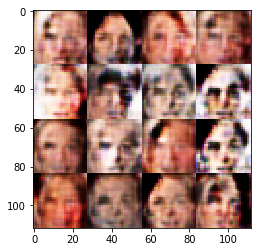

Timestamp 20170805-00-53-37.671 -  Epoch 1/1 -  Step 2210 -  D Loss: 1.7477 - G Loss: 0.4890
Timestamp 20170805-00-53-45.096 -  Epoch 1/1 -  Step 2220 -  D Loss: 0.9303 - G Loss: 1.2682
Timestamp 20170805-00-53-52.506 -  Epoch 1/1 -  Step 2230 -  D Loss: 0.6134 - G Loss: 2.0146
Timestamp 20170805-00-53-59.971 -  Epoch 1/1 -  Step 2240 -  D Loss: 0.9928 - G Loss: 1.6133
Timestamp 20170805-00-54-07.374 -  Epoch 1/1 -  Step 2250 -  D Loss: 0.8449 - G Loss: 1.4190
Timestamp 20170805-00-54-14.741 -  Epoch 1/1 -  Step 2260 -  D Loss: 0.9331 - G Loss: 1.2312
Timestamp 20170805-00-54-22.143 -  Epoch 1/1 -  Step 2270 -  D Loss: 1.0164 - G Loss: 2.4800
Timestamp 20170805-00-54-29.673 -  Epoch 1/1 -  Step 2280 -  D Loss: 0.4523 - G Loss: 3.4463
Timestamp 20170805-00-54-37.067 -  Epoch 1/1 -  Step 2290 -  D Loss: 0.4960 - G Loss: 2.5649
Timestamp 20170805-00-54-44.493 -  Epoch 1/1 -  Step 2300 -  D Loss: 0.6044 - G Loss: 2.6171


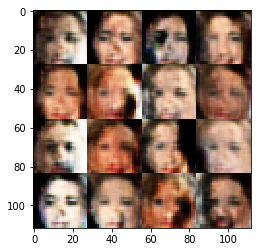

Timestamp 20170805-00-54-52.369 -  Epoch 1/1 -  Step 2310 -  D Loss: 0.7160 - G Loss: 2.3869
Timestamp 20170805-00-54-59.712 -  Epoch 1/1 -  Step 2320 -  D Loss: 0.4143 - G Loss: 5.2980
Timestamp 20170805-00-55-07.075 -  Epoch 1/1 -  Step 2330 -  D Loss: 0.4859 - G Loss: 1.4621
Timestamp 20170805-00-55-14.445 -  Epoch 1/1 -  Step 2340 -  D Loss: 0.5752 - G Loss: 2.1752
Timestamp 20170805-00-55-21.861 -  Epoch 1/1 -  Step 2350 -  D Loss: 0.9051 - G Loss: 1.2975
Timestamp 20170805-00-55-29.338 -  Epoch 1/1 -  Step 2360 -  D Loss: 1.1296 - G Loss: 1.4087
Timestamp 20170805-00-55-36.874 -  Epoch 1/1 -  Step 2370 -  D Loss: 0.6032 - G Loss: 2.1797
Timestamp 20170805-00-55-44.428 -  Epoch 1/1 -  Step 2380 -  D Loss: 1.5586 - G Loss: 1.1602
Timestamp 20170805-00-55-51.958 -  Epoch 1/1 -  Step 2390 -  D Loss: 0.7876 - G Loss: 2.0912
Timestamp 20170805-00-55-59.389 -  Epoch 1/1 -  Step 2400 -  D Loss: 0.8031 - G Loss: 3.1058


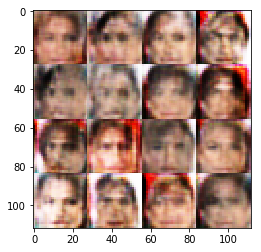

Timestamp 20170805-00-56-07.331 -  Epoch 1/1 -  Step 2410 -  D Loss: 0.9092 - G Loss: 1.3777
Timestamp 20170805-00-56-14.885 -  Epoch 1/1 -  Step 2420 -  D Loss: 1.6447 - G Loss: 1.9174
Timestamp 20170805-00-56-22.434 -  Epoch 1/1 -  Step 2430 -  D Loss: 1.1357 - G Loss: 1.3271
Timestamp 20170805-00-56-29.858 -  Epoch 1/1 -  Step 2440 -  D Loss: 0.9315 - G Loss: 0.6720
Timestamp 20170805-00-56-37.281 -  Epoch 1/1 -  Step 2450 -  D Loss: 1.6440 - G Loss: 0.2758
Timestamp 20170805-00-56-44.627 -  Epoch 1/1 -  Step 2460 -  D Loss: 0.8417 - G Loss: 1.1205
Timestamp 20170805-00-56-52.059 -  Epoch 1/1 -  Step 2470 -  D Loss: 0.8647 - G Loss: 1.4258
Timestamp 20170805-00-56-59.541 -  Epoch 1/1 -  Step 2480 -  D Loss: 1.3870 - G Loss: 0.6523
Timestamp 20170805-00-57-06.965 -  Epoch 1/1 -  Step 2490 -  D Loss: 0.6340 - G Loss: 1.6942
Timestamp 20170805-00-57-14.312 -  Epoch 1/1 -  Step 2500 -  D Loss: 1.2097 - G Loss: 1.2994


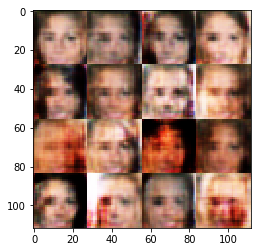

Timestamp 20170805-00-57-22.282 -  Epoch 1/1 -  Step 2510 -  D Loss: 1.0137 - G Loss: 1.9122
Timestamp 20170805-00-57-29.611 -  Epoch 1/1 -  Step 2520 -  D Loss: 0.6702 - G Loss: 1.4744
Timestamp 20170805-00-57-36.948 -  Epoch 1/1 -  Step 2530 -  D Loss: 0.9305 - G Loss: 1.1389
Timestamp 20170805-00-57-44.301 -  Epoch 1/1 -  Step 2540 -  D Loss: 1.1584 - G Loss: 0.7570
Timestamp 20170805-00-57-51.726 -  Epoch 1/1 -  Step 2550 -  D Loss: 0.7682 - G Loss: 0.9993
Timestamp 20170805-00-57-59.266 -  Epoch 1/1 -  Step 2560 -  D Loss: 0.8626 - G Loss: 1.5591
Timestamp 20170805-00-58-06.905 -  Epoch 1/1 -  Step 2570 -  D Loss: 0.6461 - G Loss: 1.5479
Timestamp 20170805-00-58-14.486 -  Epoch 1/1 -  Step 2580 -  D Loss: 1.2588 - G Loss: 1.2502
Timestamp 20170805-00-58-22.077 -  Epoch 1/1 -  Step 2590 -  D Loss: 1.0388 - G Loss: 1.6578
Timestamp 20170805-00-58-29.419 -  Epoch 1/1 -  Step 2600 -  D Loss: 0.7638 - G Loss: 2.2319


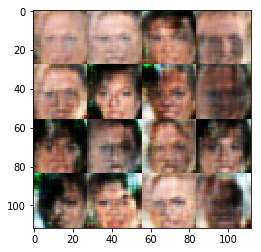

Timestamp 20170805-00-58-37.262 -  Epoch 1/1 -  Step 2610 -  D Loss: 0.9147 - G Loss: 1.9399
Timestamp 20170805-00-58-44.591 -  Epoch 1/1 -  Step 2620 -  D Loss: 0.5246 - G Loss: 1.5505
Timestamp 20170805-00-58-52.143 -  Epoch 1/1 -  Step 2630 -  D Loss: 0.8317 - G Loss: 0.7974
Timestamp 20170805-00-58-59.524 -  Epoch 1/1 -  Step 2640 -  D Loss: 0.8842 - G Loss: 2.1418
Timestamp 20170805-00-59-06.948 -  Epoch 1/1 -  Step 2650 -  D Loss: 1.5796 - G Loss: 0.7175
Timestamp 20170805-00-59-14.470 -  Epoch 1/1 -  Step 2660 -  D Loss: 0.7310 - G Loss: 1.7212
Timestamp 20170805-00-59-21.973 -  Epoch 1/1 -  Step 2670 -  D Loss: 0.5320 - G Loss: 3.2576
Timestamp 20170805-00-59-29.547 -  Epoch 1/1 -  Step 2680 -  D Loss: 0.5567 - G Loss: 2.1065
Timestamp 20170805-00-59-37.029 -  Epoch 1/1 -  Step 2690 -  D Loss: 0.7161 - G Loss: 1.4843
Timestamp 20170805-00-59-44.479 -  Epoch 1/1 -  Step 2700 -  D Loss: 0.8757 - G Loss: 3.1074


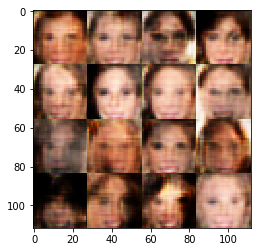

Timestamp 20170805-00-59-52.460 -  Epoch 1/1 -  Step 2710 -  D Loss: 0.6326 - G Loss: 1.9549
Timestamp 20170805-00-59-59.860 -  Epoch 1/1 -  Step 2720 -  D Loss: 0.9910 - G Loss: 1.2183
Timestamp 20170805-01-00-07.297 -  Epoch 1/1 -  Step 2730 -  D Loss: 0.7350 - G Loss: 2.5868
Timestamp 20170805-01-00-14.818 -  Epoch 1/1 -  Step 2740 -  D Loss: 1.1932 - G Loss: 0.6761
Timestamp 20170805-01-00-22.297 -  Epoch 1/1 -  Step 2750 -  D Loss: 1.5346 - G Loss: 0.4602
Timestamp 20170805-01-00-29.702 -  Epoch 1/1 -  Step 2760 -  D Loss: 0.8635 - G Loss: 1.2078
Timestamp 20170805-01-00-37.143 -  Epoch 1/1 -  Step 2770 -  D Loss: 1.1391 - G Loss: 1.0425
Timestamp 20170805-01-00-44.619 -  Epoch 1/1 -  Step 2780 -  D Loss: 1.3820 - G Loss: 0.7049
Timestamp 20170805-01-00-51.992 -  Epoch 1/1 -  Step 2790 -  D Loss: 0.9230 - G Loss: 2.8144
Timestamp 20170805-01-00-59.360 -  Epoch 1/1 -  Step 2800 -  D Loss: 0.8720 - G Loss: 1.7936


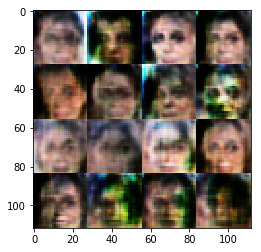

Timestamp 20170805-01-01-07.569 -  Epoch 1/1 -  Step 2810 -  D Loss: 0.5292 - G Loss: 2.2761
Timestamp 20170805-01-01-15.224 -  Epoch 1/1 -  Step 2820 -  D Loss: 0.9002 - G Loss: 1.2707
Timestamp 20170805-01-01-22.821 -  Epoch 1/1 -  Step 2830 -  D Loss: 0.8434 - G Loss: 1.5277
Timestamp 20170805-01-01-30.365 -  Epoch 1/1 -  Step 2840 -  D Loss: 0.8691 - G Loss: 1.3658
Timestamp 20170805-01-01-37.885 -  Epoch 1/1 -  Step 2850 -  D Loss: 1.3368 - G Loss: 0.9408
Timestamp 20170805-01-01-45.344 -  Epoch 1/1 -  Step 2860 -  D Loss: 0.6950 - G Loss: 1.4406
Timestamp 20170805-01-01-52.791 -  Epoch 1/1 -  Step 2870 -  D Loss: 0.5897 - G Loss: 2.6340
Timestamp 20170805-01-02-00.311 -  Epoch 1/1 -  Step 2880 -  D Loss: 0.7476 - G Loss: 1.4578
Timestamp 20170805-01-02-07.863 -  Epoch 1/1 -  Step 2890 -  D Loss: 0.5726 - G Loss: 3.0833
Timestamp 20170805-01-02-15.314 -  Epoch 1/1 -  Step 2900 -  D Loss: 0.6455 - G Loss: 1.6081


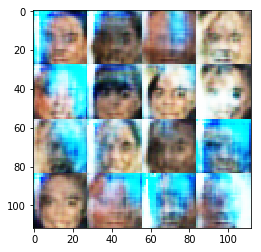

Timestamp 20170805-01-02-23.192 -  Epoch 1/1 -  Step 2910 -  D Loss: 2.6207 - G Loss: 0.1068
Timestamp 20170805-01-02-30.568 -  Epoch 1/1 -  Step 2920 -  D Loss: 0.5749 - G Loss: 1.4775
Timestamp 20170805-01-02-38.000 -  Epoch 1/1 -  Step 2930 -  D Loss: 0.5439 - G Loss: 2.1008
Timestamp 20170805-01-02-45.415 -  Epoch 1/1 -  Step 2940 -  D Loss: 0.4706 - G Loss: 3.2073
Timestamp 20170805-01-02-52.782 -  Epoch 1/1 -  Step 2950 -  D Loss: 0.7059 - G Loss: 3.2284
Timestamp 20170805-01-03-00.154 -  Epoch 1/1 -  Step 2960 -  D Loss: 0.6744 - G Loss: 1.5496
Timestamp 20170805-01-03-07.530 -  Epoch 1/1 -  Step 2970 -  D Loss: 0.6156 - G Loss: 3.8266
Timestamp 20170805-01-03-14.874 -  Epoch 1/1 -  Step 2980 -  D Loss: 1.2984 - G Loss: 1.1094
Timestamp 20170805-01-03-22.224 -  Epoch 1/1 -  Step 2990 -  D Loss: 0.7324 - G Loss: 2.1809
Timestamp 20170805-01-03-29.546 -  Epoch 1/1 -  Step 3000 -  D Loss: 0.6111 - G Loss: 2.3230


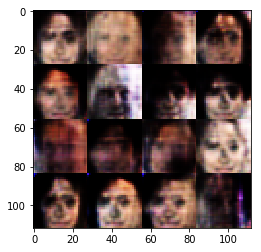

Timestamp 20170805-01-03-37.706 -  Epoch 1/1 -  Step 3010 -  D Loss: 0.8385 - G Loss: 1.3325
Timestamp 20170805-01-03-45.290 -  Epoch 1/1 -  Step 3020 -  D Loss: 0.9424 - G Loss: 0.6443
Timestamp 20170805-01-03-52.955 -  Epoch 1/1 -  Step 3030 -  D Loss: 1.3007 - G Loss: 1.0167
Timestamp 20170805-01-04-00.462 -  Epoch 1/1 -  Step 3040 -  D Loss: 0.9152 - G Loss: 0.9229
Timestamp 20170805-01-04-08.252 -  Epoch 1/1 -  Step 3050 -  D Loss: 0.7608 - G Loss: 1.9366
Timestamp 20170805-01-04-15.703 -  Epoch 1/1 -  Step 3060 -  D Loss: 0.7658 - G Loss: 1.1020
Timestamp 20170805-01-04-23.055 -  Epoch 1/1 -  Step 3070 -  D Loss: 1.2917 - G Loss: 0.3935
Timestamp 20170805-01-04-30.410 -  Epoch 1/1 -  Step 3080 -  D Loss: 0.7353 - G Loss: 2.1322
Timestamp 20170805-01-04-37.866 -  Epoch 1/1 -  Step 3090 -  D Loss: 0.8315 - G Loss: 1.5002
Timestamp 20170805-01-04-45.398 -  Epoch 1/1 -  Step 3100 -  D Loss: 0.4589 - G Loss: 2.1419


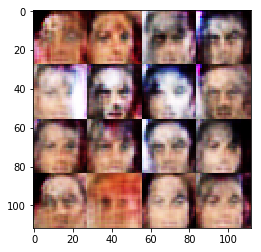

Timestamp 20170805-01-04-53.377 -  Epoch 1/1 -  Step 3110 -  D Loss: 1.3065 - G Loss: 1.1889
Timestamp 20170805-01-05-00.855 -  Epoch 1/1 -  Step 3120 -  D Loss: 0.9868 - G Loss: 3.0868
Timestamp 20170805-01-05-08.224 -  Epoch 1/1 -  Step 3130 -  D Loss: 0.8071 - G Loss: 1.9735
Timestamp 20170805-01-05-15.660 -  Epoch 1/1 -  Step 3140 -  D Loss: 0.5290 - G Loss: 2.3727
Timestamp 20170805-01-05-23.134 -  Epoch 1/1 -  Step 3150 -  D Loss: 1.1990 - G Loss: 0.9669
Timestamp 20170805-01-05-30.538 -  Epoch 1/1 -  Step 3160 -  D Loss: 0.8395 - G Loss: 1.4283
Timestamp 20170805-01-05-38.120 -  Epoch 1/1 -  Step 3170 -  D Loss: 0.8046 - G Loss: 2.0964
Timestamp 20170805-01-05-45.904 -  Epoch 1/1 -  Step 3180 -  D Loss: 0.7417 - G Loss: 1.7203
Timestamp 20170805-01-05-53.574 -  Epoch 1/1 -  Step 3190 -  D Loss: 0.5373 - G Loss: 3.6242
Timestamp 20170805-01-06-01.150 -  Epoch 1/1 -  Step 3200 -  D Loss: 0.7541 - G Loss: 1.5455


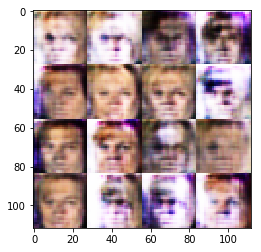

Timestamp 20170805-01-06-09.491 -  Epoch 1/1 -  Step 3210 -  D Loss: 0.9457 - G Loss: 1.5542
Timestamp 20170805-01-06-17.097 -  Epoch 1/1 -  Step 3220 -  D Loss: 0.7865 - G Loss: 1.5803
Timestamp 20170805-01-06-24.602 -  Epoch 1/1 -  Step 3230 -  D Loss: 0.7205 - G Loss: 1.3098
Timestamp 20170805-01-06-32.043 -  Epoch 1/1 -  Step 3240 -  D Loss: 1.2316 - G Loss: 0.9027
Timestamp 20170805-01-06-39.509 -  Epoch 1/1 -  Step 3250 -  D Loss: 0.6436 - G Loss: 3.3123
Timestamp 20170805-01-06-46.860 -  Epoch 1/1 -  Step 3260 -  D Loss: 0.7314 - G Loss: 2.1950
Timestamp 20170805-01-06-54.240 -  Epoch 1/1 -  Step 3270 -  D Loss: 0.9161 - G Loss: 1.0287
Timestamp 20170805-01-07-01.634 -  Epoch 1/1 -  Step 3280 -  D Loss: 0.9800 - G Loss: 1.7491
Timestamp 20170805-01-07-09.000 -  Epoch 1/1 -  Step 3290 -  D Loss: 0.5901 - G Loss: 4.4808
Timestamp 20170805-01-07-16.383 -  Epoch 1/1 -  Step 3300 -  D Loss: 0.5875 - G Loss: 2.9752


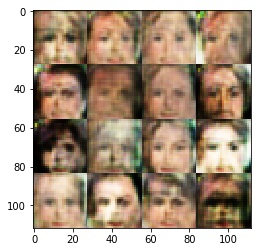

Timestamp 20170805-01-07-24.594 -  Epoch 1/1 -  Step 3310 -  D Loss: 0.8388 - G Loss: 1.0451
Timestamp 20170805-01-07-32.311 -  Epoch 1/1 -  Step 3320 -  D Loss: 1.7811 - G Loss: 1.0250
Timestamp 20170805-01-07-39.923 -  Epoch 1/1 -  Step 3330 -  D Loss: 1.3604 - G Loss: 0.5282
Timestamp 20170805-01-07-47.418 -  Epoch 1/1 -  Step 3340 -  D Loss: 1.2418 - G Loss: 0.9042
Timestamp 20170805-01-07-54.896 -  Epoch 1/1 -  Step 3350 -  D Loss: 0.6711 - G Loss: 1.8537
Timestamp 20170805-01-08-02.295 -  Epoch 1/1 -  Step 3360 -  D Loss: 1.3968 - G Loss: 0.6921
Timestamp 20170805-01-08-09.643 -  Epoch 1/1 -  Step 3370 -  D Loss: 1.1063 - G Loss: 2.1322
Timestamp 20170805-01-08-17.061 -  Epoch 1/1 -  Step 3380 -  D Loss: 1.3740 - G Loss: 0.7689
Timestamp 20170805-01-08-24.464 -  Epoch 1/1 -  Step 3390 -  D Loss: 0.9302 - G Loss: 1.1378
Timestamp 20170805-01-08-31.899 -  Epoch 1/1 -  Step 3400 -  D Loss: 1.0261 - G Loss: 0.9555


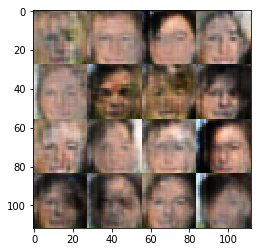

Timestamp 20170805-01-08-39.809 -  Epoch 1/1 -  Step 3410 -  D Loss: 1.3050 - G Loss: 0.6861
Timestamp 20170805-01-08-47.141 -  Epoch 1/1 -  Step 3420 -  D Loss: 1.1153 - G Loss: 0.9384
Timestamp 20170805-01-08-54.571 -  Epoch 1/1 -  Step 3430 -  D Loss: 1.3031 - G Loss: 0.9831
Timestamp 20170805-01-09-02.061 -  Epoch 1/1 -  Step 3440 -  D Loss: 0.7392 - G Loss: 1.7126
Timestamp 20170805-01-09-09.526 -  Epoch 1/1 -  Step 3450 -  D Loss: 1.4082 - G Loss: 1.2545
Timestamp 20170805-01-09-17.153 -  Epoch 1/1 -  Step 3460 -  D Loss: 0.8774 - G Loss: 1.3365
Timestamp 20170805-01-09-24.741 -  Epoch 1/1 -  Step 3470 -  D Loss: 1.5219 - G Loss: 1.2933
Timestamp 20170805-01-09-32.326 -  Epoch 1/1 -  Step 3480 -  D Loss: 1.1386 - G Loss: 1.9813
Timestamp 20170805-01-09-39.853 -  Epoch 1/1 -  Step 3490 -  D Loss: 0.8142 - G Loss: 1.7273
Timestamp 20170805-01-09-47.182 -  Epoch 1/1 -  Step 3500 -  D Loss: 1.0764 - G Loss: 1.2669


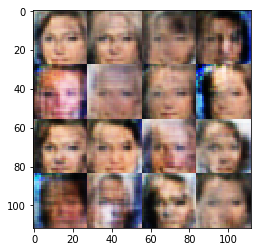

Timestamp 20170805-01-09-55.056 -  Epoch 1/1 -  Step 3510 -  D Loss: 0.5874 - G Loss: 1.4571
Timestamp 20170805-01-10-02.495 -  Epoch 1/1 -  Step 3520 -  D Loss: 0.7509 - G Loss: 1.1133
Timestamp 20170805-01-10-10.019 -  Epoch 1/1 -  Step 3530 -  D Loss: 0.9480 - G Loss: 2.3733
Timestamp 20170805-01-10-17.972 -  Epoch 1/1 -  Step 3540 -  D Loss: 0.6098 - G Loss: 2.9266
Timestamp 20170805-01-10-25.465 -  Epoch 1/1 -  Step 3550 -  D Loss: 1.3596 - G Loss: 1.1199
Timestamp 20170805-01-10-32.892 -  Epoch 1/1 -  Step 3560 -  D Loss: 1.3633 - G Loss: 1.0659
Timestamp 20170805-01-10-40.300 -  Epoch 1/1 -  Step 3570 -  D Loss: 1.0067 - G Loss: 1.3716
Timestamp 20170805-01-10-47.853 -  Epoch 1/1 -  Step 3580 -  D Loss: 1.4983 - G Loss: 1.0480
Timestamp 20170805-01-10-55.332 -  Epoch 1/1 -  Step 3590 -  D Loss: 1.2066 - G Loss: 1.7429
Timestamp 20170805-01-11-02.917 -  Epoch 1/1 -  Step 3600 -  D Loss: 0.9372 - G Loss: 2.6143


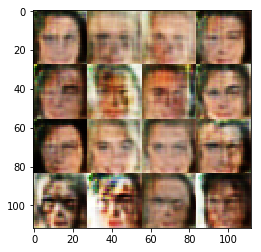

Timestamp 20170805-01-11-10.886 -  Epoch 1/1 -  Step 3610 -  D Loss: 0.8239 - G Loss: 1.0375
Timestamp 20170805-01-11-18.275 -  Epoch 1/1 -  Step 3620 -  D Loss: 0.9748 - G Loss: 0.8218
Timestamp 20170805-01-11-25.685 -  Epoch 1/1 -  Step 3630 -  D Loss: 1.1933 - G Loss: 1.0095
Timestamp 20170805-01-11-33.254 -  Epoch 1/1 -  Step 3640 -  D Loss: 1.4039 - G Loss: 1.4977
Timestamp 20170805-01-11-40.575 -  Epoch 1/1 -  Step 3650 -  D Loss: 0.7667 - G Loss: 1.8266
Timestamp 20170805-01-11-47.910 -  Epoch 1/1 -  Step 3660 -  D Loss: 0.9620 - G Loss: 0.9446
Timestamp 20170805-01-11-55.313 -  Epoch 1/1 -  Step 3670 -  D Loss: 1.6261 - G Loss: 0.2967
Timestamp 20170805-01-12-02.619 -  Epoch 1/1 -  Step 3680 -  D Loss: 1.0982 - G Loss: 1.4878
Timestamp 20170805-01-12-09.992 -  Epoch 1/1 -  Step 3690 -  D Loss: 0.7996 - G Loss: 0.8309
Timestamp 20170805-01-12-17.363 -  Epoch 1/1 -  Step 3700 -  D Loss: 0.8434 - G Loss: 1.5291


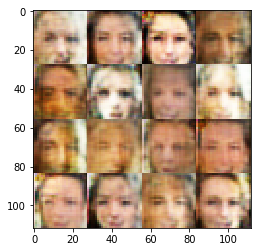

Timestamp 20170805-01-12-25.314 -  Epoch 1/1 -  Step 3710 -  D Loss: 1.0157 - G Loss: 1.3544
Timestamp 20170805-01-12-32.643 -  Epoch 1/1 -  Step 3720 -  D Loss: 1.1028 - G Loss: 1.7545
Timestamp 20170805-01-12-40.135 -  Epoch 1/1 -  Step 3730 -  D Loss: 1.3482 - G Loss: 1.2574
Timestamp 20170805-01-12-47.496 -  Epoch 1/1 -  Step 3740 -  D Loss: 1.2861 - G Loss: 1.0036
Timestamp 20170805-01-12-55.075 -  Epoch 1/1 -  Step 3750 -  D Loss: 0.8854 - G Loss: 0.9449
Timestamp 20170805-01-13-02.447 -  Epoch 1/1 -  Step 3760 -  D Loss: 0.9598 - G Loss: 1.5895
Timestamp 20170805-01-13-09.853 -  Epoch 1/1 -  Step 3770 -  D Loss: 1.0501 - G Loss: 1.5698
Timestamp 20170805-01-13-17.174 -  Epoch 1/1 -  Step 3780 -  D Loss: 1.2279 - G Loss: 1.6048
Timestamp 20170805-01-13-24.827 -  Epoch 1/1 -  Step 3790 -  D Loss: 0.8505 - G Loss: 0.8194
Timestamp 20170805-01-13-32.167 -  Epoch 1/1 -  Step 3800 -  D Loss: 0.6645 - G Loss: 1.5785


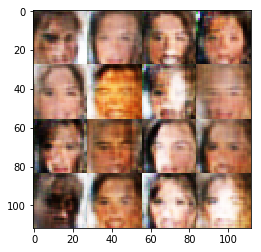

Timestamp 20170805-01-13-40.011 -  Epoch 1/1 -  Step 3810 -  D Loss: 1.2361 - G Loss: 1.0916
Timestamp 20170805-01-13-47.416 -  Epoch 1/1 -  Step 3820 -  D Loss: 0.8843 - G Loss: 1.5235
Timestamp 20170805-01-13-54.762 -  Epoch 1/1 -  Step 3830 -  D Loss: 0.8158 - G Loss: 1.2739
Timestamp 20170805-01-14-02.137 -  Epoch 1/1 -  Step 3840 -  D Loss: 1.0409 - G Loss: 1.4748
Timestamp 20170805-01-14-09.460 -  Epoch 1/1 -  Step 3850 -  D Loss: 1.2176 - G Loss: 1.3792
Timestamp 20170805-01-14-16.834 -  Epoch 1/1 -  Step 3860 -  D Loss: 1.2111 - G Loss: 1.1023
Timestamp 20170805-01-14-24.291 -  Epoch 1/1 -  Step 3870 -  D Loss: 0.9137 - G Loss: 1.1446
Timestamp 20170805-01-14-31.768 -  Epoch 1/1 -  Step 3880 -  D Loss: 1.0173 - G Loss: 1.9991
Timestamp 20170805-01-14-39.294 -  Epoch 1/1 -  Step 3890 -  D Loss: 0.8887 - G Loss: 1.5132
Timestamp 20170805-01-14-47.048 -  Epoch 1/1 -  Step 3900 -  D Loss: 1.1961 - G Loss: 1.5386


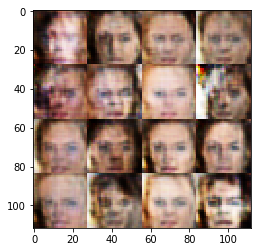

Timestamp 20170805-01-14-55.012 -  Epoch 1/1 -  Step 3910 -  D Loss: 0.9980 - G Loss: 1.2890
Timestamp 20170805-01-15-02.423 -  Epoch 1/1 -  Step 3920 -  D Loss: 1.2314 - G Loss: 1.2432
Timestamp 20170805-01-15-09.784 -  Epoch 1/1 -  Step 3930 -  D Loss: 0.9192 - G Loss: 2.1751
Timestamp 20170805-01-15-17.134 -  Epoch 1/1 -  Step 3940 -  D Loss: 0.9156 - G Loss: 1.6671
Timestamp 20170805-01-15-24.484 -  Epoch 1/1 -  Step 3950 -  D Loss: 0.8889 - G Loss: 1.6376
Timestamp 20170805-01-15-32.109 -  Epoch 1/1 -  Step 3960 -  D Loss: 1.0337 - G Loss: 1.6355
Timestamp 20170805-01-15-39.503 -  Epoch 1/1 -  Step 3970 -  D Loss: 1.3578 - G Loss: 1.5195
Timestamp 20170805-01-15-46.961 -  Epoch 1/1 -  Step 3980 -  D Loss: 1.1448 - G Loss: 1.1595
Timestamp 20170805-01-15-54.280 -  Epoch 1/1 -  Step 3990 -  D Loss: 0.9922 - G Loss: 1.3622
Timestamp 20170805-01-16-01.692 -  Epoch 1/1 -  Step 4000 -  D Loss: 0.8470 - G Loss: 1.1042


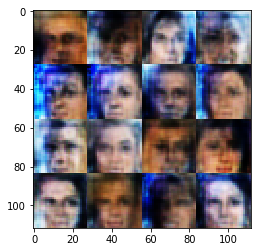

Timestamp 20170805-01-16-09.574 -  Epoch 1/1 -  Step 4010 -  D Loss: 1.5690 - G Loss: 0.5791
Timestamp 20170805-01-16-16.911 -  Epoch 1/1 -  Step 4020 -  D Loss: 1.2462 - G Loss: 1.8114
Timestamp 20170805-01-16-24.467 -  Epoch 1/1 -  Step 4030 -  D Loss: 1.2490 - G Loss: 0.9331
Timestamp 20170805-01-16-32.054 -  Epoch 1/1 -  Step 4040 -  D Loss: 1.0626 - G Loss: 1.1704
Timestamp 20170805-01-16-39.538 -  Epoch 1/1 -  Step 4050 -  D Loss: 1.0573 - G Loss: 1.0310
Timestamp 20170805-01-16-47.114 -  Epoch 1/1 -  Step 4060 -  D Loss: 0.8558 - G Loss: 1.4776
Timestamp 20170805-01-16-54.591 -  Epoch 1/1 -  Step 4070 -  D Loss: 0.8833 - G Loss: 0.7724
Timestamp 20170805-01-17-01.935 -  Epoch 1/1 -  Step 4080 -  D Loss: 0.8352 - G Loss: 1.5473
Timestamp 20170805-01-17-09.262 -  Epoch 1/1 -  Step 4090 -  D Loss: 0.8486 - G Loss: 1.3811
Timestamp 20170805-01-17-16.629 -  Epoch 1/1 -  Step 4100 -  D Loss: 0.6465 - G Loss: 3.0661


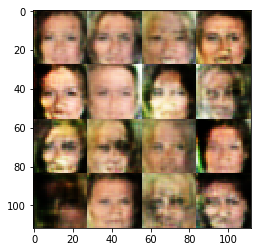

Timestamp 20170805-01-17-24.543 -  Epoch 1/1 -  Step 4110 -  D Loss: 0.8951 - G Loss: 1.0828
Timestamp 20170805-01-17-31.989 -  Epoch 1/1 -  Step 4120 -  D Loss: 1.1298 - G Loss: 1.1117
Timestamp 20170805-01-17-39.309 -  Epoch 1/1 -  Step 4130 -  D Loss: 1.5189 - G Loss: 1.2778
Timestamp 20170805-01-17-46.695 -  Epoch 1/1 -  Step 4140 -  D Loss: 0.8449 - G Loss: 1.2821
Timestamp 20170805-01-17-54.041 -  Epoch 1/1 -  Step 4150 -  D Loss: 0.7864 - G Loss: 1.2281
Timestamp 20170805-01-18-01.394 -  Epoch 1/1 -  Step 4160 -  D Loss: 0.9768 - G Loss: 1.5369
Timestamp 20170805-01-18-08.844 -  Epoch 1/1 -  Step 4170 -  D Loss: 1.0696 - G Loss: 1.1812
Timestamp 20170805-01-18-16.261 -  Epoch 1/1 -  Step 4180 -  D Loss: 1.2299 - G Loss: 0.9623
Timestamp 20170805-01-18-23.672 -  Epoch 1/1 -  Step 4190 -  D Loss: 0.6257 - G Loss: 1.3406
Timestamp 20170805-01-18-31.370 -  Epoch 1/1 -  Step 4200 -  D Loss: 1.2251 - G Loss: 0.9779


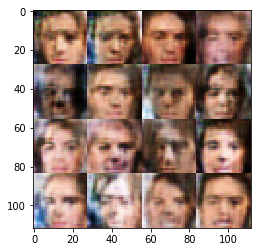

Timestamp 20170805-01-18-39.950 -  Epoch 1/1 -  Step 4210 -  D Loss: 1.0741 - G Loss: 1.1577
Timestamp 20170805-01-18-47.894 -  Epoch 1/1 -  Step 4220 -  D Loss: 0.8811 - G Loss: 1.6849
Timestamp 20170805-01-18-55.621 -  Epoch 1/1 -  Step 4230 -  D Loss: 0.8343 - G Loss: 0.8934
Timestamp 20170805-01-19-03.616 -  Epoch 1/1 -  Step 4240 -  D Loss: 0.8554 - G Loss: 1.3242
Timestamp 20170805-01-19-11.742 -  Epoch 1/1 -  Step 4250 -  D Loss: 0.8157 - G Loss: 1.5180
Timestamp 20170805-01-19-19.723 -  Epoch 1/1 -  Step 4260 -  D Loss: 1.2868 - G Loss: 1.0069
Timestamp 20170805-01-19-27.499 -  Epoch 1/1 -  Step 4270 -  D Loss: 1.3488 - G Loss: 1.3083
Timestamp 20170805-01-19-35.222 -  Epoch 1/1 -  Step 4280 -  D Loss: 1.5960 - G Loss: 0.8708
Timestamp 20170805-01-19-42.714 -  Epoch 1/1 -  Step 4290 -  D Loss: 1.1705 - G Loss: 0.8894
Timestamp 20170805-01-19-50.153 -  Epoch 1/1 -  Step 4300 -  D Loss: 1.0614 - G Loss: 0.6760


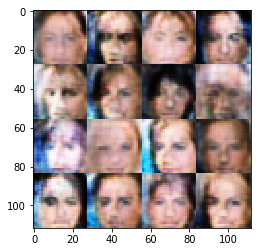

Timestamp 20170805-01-19-58.276 -  Epoch 1/1 -  Step 4310 -  D Loss: 0.6408 - G Loss: 2.4925
Timestamp 20170805-01-20-05.827 -  Epoch 1/1 -  Step 4320 -  D Loss: 0.9445 - G Loss: 1.9521
Timestamp 20170805-01-20-13.350 -  Epoch 1/1 -  Step 4330 -  D Loss: 0.7700 - G Loss: 1.8959
Timestamp 20170805-01-20-20.892 -  Epoch 1/1 -  Step 4340 -  D Loss: 0.8112 - G Loss: 1.7877
Timestamp 20170805-01-20-28.320 -  Epoch 1/1 -  Step 4350 -  D Loss: 1.1557 - G Loss: 1.2826
Timestamp 20170805-01-20-35.763 -  Epoch 1/1 -  Step 4360 -  D Loss: 1.3338 - G Loss: 0.5273
Timestamp 20170805-01-20-43.214 -  Epoch 1/1 -  Step 4370 -  D Loss: 0.9181 - G Loss: 1.9553
Timestamp 20170805-01-20-50.662 -  Epoch 1/1 -  Step 4380 -  D Loss: 0.6982 - G Loss: 1.8279
Timestamp 20170805-01-20-58.239 -  Epoch 1/1 -  Step 4390 -  D Loss: 1.0237 - G Loss: 1.0121
Timestamp 20170805-01-21-05.689 -  Epoch 1/1 -  Step 4400 -  D Loss: 1.1422 - G Loss: 1.7951


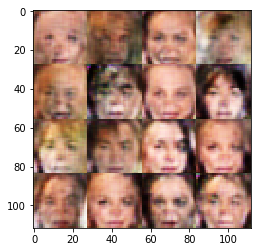

Timestamp 20170805-01-21-13.654 -  Epoch 1/1 -  Step 4410 -  D Loss: 1.0672 - G Loss: 1.5333
Timestamp 20170805-01-21-21.179 -  Epoch 1/1 -  Step 4420 -  D Loss: 1.5140 - G Loss: 1.0659
Timestamp 20170805-01-21-28.608 -  Epoch 1/1 -  Step 4430 -  D Loss: 1.6737 - G Loss: 0.7069
Timestamp 20170805-01-21-36.092 -  Epoch 1/1 -  Step 4440 -  D Loss: 0.6656 - G Loss: 1.6741
Timestamp 20170805-01-21-43.633 -  Epoch 1/1 -  Step 4450 -  D Loss: 0.6704 - G Loss: 2.7278
Timestamp 20170805-01-21-51.153 -  Epoch 1/1 -  Step 4460 -  D Loss: 0.9004 - G Loss: 1.3996
Timestamp 20170805-01-21-58.632 -  Epoch 1/1 -  Step 4470 -  D Loss: 0.7741 - G Loss: 1.6933
Timestamp 20170805-01-22-06.180 -  Epoch 1/1 -  Step 4480 -  D Loss: 0.9961 - G Loss: 1.4536
Timestamp 20170805-01-22-13.724 -  Epoch 1/1 -  Step 4490 -  D Loss: 0.8529 - G Loss: 1.1236
Timestamp 20170805-01-22-21.218 -  Epoch 1/1 -  Step 4500 -  D Loss: 1.3342 - G Loss: 1.0126


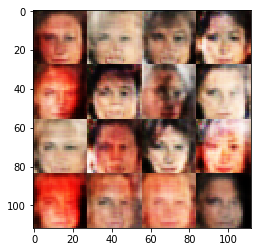

Timestamp 20170805-01-22-29.248 -  Epoch 1/1 -  Step 4510 -  D Loss: 1.2401 - G Loss: 1.2292
Timestamp 20170805-01-22-36.660 -  Epoch 1/1 -  Step 4520 -  D Loss: 1.2270 - G Loss: 0.8043
Timestamp 20170805-01-22-44.007 -  Epoch 1/1 -  Step 4530 -  D Loss: 1.2729 - G Loss: 0.6584
Timestamp 20170805-01-22-51.354 -  Epoch 1/1 -  Step 4540 -  D Loss: 0.9195 - G Loss: 1.2875
Timestamp 20170805-01-22-58.755 -  Epoch 1/1 -  Step 4550 -  D Loss: 1.5325 - G Loss: 0.3757
Timestamp 20170805-01-23-06.117 -  Epoch 1/1 -  Step 4560 -  D Loss: 1.6008 - G Loss: 0.7471
Timestamp 20170805-01-23-13.542 -  Epoch 1/1 -  Step 4570 -  D Loss: 1.1170 - G Loss: 1.3228
Timestamp 20170805-01-23-20.890 -  Epoch 1/1 -  Step 4580 -  D Loss: 0.6658 - G Loss: 1.9940
Timestamp 20170805-01-23-28.261 -  Epoch 1/1 -  Step 4590 -  D Loss: 0.9008 - G Loss: 1.1669
Timestamp 20170805-01-23-35.657 -  Epoch 1/1 -  Step 4600 -  D Loss: 1.0808 - G Loss: 1.2900


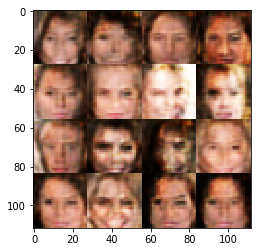

Timestamp 20170805-01-23-43.553 -  Epoch 1/1 -  Step 4610 -  D Loss: 0.8936 - G Loss: 1.4554
Timestamp 20170805-01-23-50.894 -  Epoch 1/1 -  Step 4620 -  D Loss: 1.1667 - G Loss: 0.9533
Timestamp 20170805-01-23-58.271 -  Epoch 1/1 -  Step 4630 -  D Loss: 0.8626 - G Loss: 2.0130
Timestamp 20170805-01-24-05.743 -  Epoch 1/1 -  Step 4640 -  D Loss: 0.8582 - G Loss: 1.2706
Timestamp 20170805-01-24-13.475 -  Epoch 1/1 -  Step 4650 -  D Loss: 1.1997 - G Loss: 1.3583
Timestamp 20170805-01-24-20.951 -  Epoch 1/1 -  Step 4660 -  D Loss: 0.9605 - G Loss: 1.8355
Timestamp 20170805-01-24-28.404 -  Epoch 1/1 -  Step 4670 -  D Loss: 1.3772 - G Loss: 0.7024
Timestamp 20170805-01-24-35.887 -  Epoch 1/1 -  Step 4680 -  D Loss: 1.0962 - G Loss: 0.6634
Timestamp 20170805-01-24-43.614 -  Epoch 1/1 -  Step 4690 -  D Loss: 1.0474 - G Loss: 1.0884
Timestamp 20170805-01-24-51.102 -  Epoch 1/1 -  Step 4700 -  D Loss: 1.6076 - G Loss: 1.3711


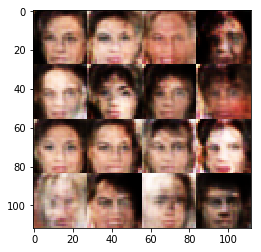

Timestamp 20170805-01-24-59.133 -  Epoch 1/1 -  Step 4710 -  D Loss: 1.2637 - G Loss: 1.1433
Timestamp 20170805-01-25-06.783 -  Epoch 1/1 -  Step 4720 -  D Loss: 0.8347 - G Loss: 1.6209
Timestamp 20170805-01-25-14.231 -  Epoch 1/1 -  Step 4730 -  D Loss: 0.8021 - G Loss: 1.2969
Timestamp 20170805-01-25-21.574 -  Epoch 1/1 -  Step 4740 -  D Loss: 1.2062 - G Loss: 0.8522
Timestamp 20170805-01-25-28.946 -  Epoch 1/1 -  Step 4750 -  D Loss: 0.8387 - G Loss: 1.0048
Timestamp 20170805-01-25-36.291 -  Epoch 1/1 -  Step 4760 -  D Loss: 0.9376 - G Loss: 1.3499
Timestamp 20170805-01-25-43.638 -  Epoch 1/1 -  Step 4770 -  D Loss: 0.7976 - G Loss: 1.5824
Timestamp 20170805-01-25-51.025 -  Epoch 1/1 -  Step 4780 -  D Loss: 1.0141 - G Loss: 1.2850
Timestamp 20170805-01-25-58.441 -  Epoch 1/1 -  Step 4790 -  D Loss: 0.8812 - G Loss: 1.2341
Timestamp 20170805-01-26-05.771 -  Epoch 1/1 -  Step 4800 -  D Loss: 1.0312 - G Loss: 1.4031


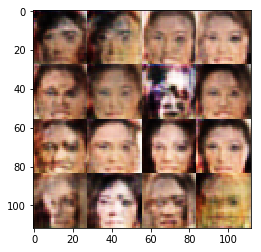

Timestamp 20170805-01-26-14.090 -  Epoch 1/1 -  Step 4810 -  D Loss: 0.9785 - G Loss: 1.2429
Timestamp 20170805-01-26-21.574 -  Epoch 1/1 -  Step 4820 -  D Loss: 1.0042 - G Loss: 1.1093
Timestamp 20170805-01-26-28.918 -  Epoch 1/1 -  Step 4830 -  D Loss: 0.7660 - G Loss: 1.0976
Timestamp 20170805-01-26-36.831 -  Epoch 1/1 -  Step 4840 -  D Loss: 0.7714 - G Loss: 1.3572
Timestamp 20170805-01-26-44.442 -  Epoch 1/1 -  Step 4850 -  D Loss: 1.0016 - G Loss: 1.2895
Timestamp 20170805-01-26-51.850 -  Epoch 1/1 -  Step 4860 -  D Loss: 1.0638 - G Loss: 1.5990
Timestamp 20170805-01-26-59.432 -  Epoch 1/1 -  Step 4870 -  D Loss: 1.0316 - G Loss: 2.0208
Timestamp 20170805-01-27-06.920 -  Epoch 1/1 -  Step 4880 -  D Loss: 0.9426 - G Loss: 1.1541
Timestamp 20170805-01-27-14.415 -  Epoch 1/1 -  Step 4890 -  D Loss: 0.9976 - G Loss: 1.2645
Timestamp 20170805-01-27-21.957 -  Epoch 1/1 -  Step 4900 -  D Loss: 0.9972 - G Loss: 1.2124


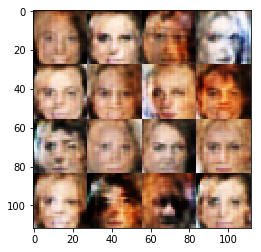

Timestamp 20170805-01-27-30.048 -  Epoch 1/1 -  Step 4910 -  D Loss: 0.6547 - G Loss: 2.1811
Timestamp 20170805-01-27-37.571 -  Epoch 1/1 -  Step 4920 -  D Loss: 0.7091 - G Loss: 2.4017
Timestamp 20170805-01-27-45.176 -  Epoch 1/1 -  Step 4930 -  D Loss: 0.6772 - G Loss: 2.6216
Timestamp 20170805-01-27-52.738 -  Epoch 1/1 -  Step 4940 -  D Loss: 1.2624 - G Loss: 1.4613
Timestamp 20170805-01-28-00.267 -  Epoch 1/1 -  Step 4950 -  D Loss: 0.9835 - G Loss: 1.7399
Timestamp 20170805-01-28-07.766 -  Epoch 1/1 -  Step 4960 -  D Loss: 0.9384 - G Loss: 1.1013
Timestamp 20170805-01-28-15.184 -  Epoch 1/1 -  Step 4970 -  D Loss: 0.6897 - G Loss: 2.2239
Timestamp 20170805-01-28-22.536 -  Epoch 1/1 -  Step 4980 -  D Loss: 1.2609 - G Loss: 1.7501
Timestamp 20170805-01-28-29.906 -  Epoch 1/1 -  Step 4990 -  D Loss: 0.7746 - G Loss: 1.0446
Timestamp 20170805-01-28-37.318 -  Epoch 1/1 -  Step 5000 -  D Loss: 1.0216 - G Loss: 1.4846


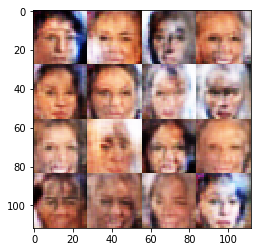

Timestamp 20170805-01-28-45.188 -  Epoch 1/1 -  Step 5010 -  D Loss: 1.1748 - G Loss: 1.0874
Timestamp 20170805-01-28-52.549 -  Epoch 1/1 -  Step 5020 -  D Loss: 1.0242 - G Loss: 1.0251
Timestamp 20170805-01-28-59.921 -  Epoch 1/1 -  Step 5030 -  D Loss: 0.7445 - G Loss: 2.3808
Timestamp 20170805-01-29-07.387 -  Epoch 1/1 -  Step 5040 -  D Loss: 1.5372 - G Loss: 0.8842
Timestamp 20170805-01-29-14.793 -  Epoch 1/1 -  Step 5050 -  D Loss: 0.7837 - G Loss: 1.5775
Timestamp 20170805-01-29-22.114 -  Epoch 1/1 -  Step 5060 -  D Loss: 1.2392 - G Loss: 2.7377
Timestamp 20170805-01-29-30.067 -  Epoch 1/1 -  Step 5070 -  D Loss: 0.7872 - G Loss: 1.7290
Timestamp 20170805-01-29-38.062 -  Epoch 1/1 -  Step 5080 -  D Loss: 0.6568 - G Loss: 2.5077
Timestamp 20170805-01-29-45.799 -  Epoch 1/1 -  Step 5090 -  D Loss: 0.5369 - G Loss: 2.1607
Timestamp 20170805-01-29-53.310 -  Epoch 1/1 -  Step 5100 -  D Loss: 0.6615 - G Loss: 1.4723


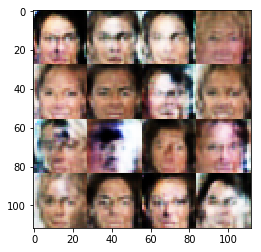

Timestamp 20170805-01-30-01.372 -  Epoch 1/1 -  Step 5110 -  D Loss: 1.2391 - G Loss: 0.6178
Timestamp 20170805-01-30-08.760 -  Epoch 1/1 -  Step 5120 -  D Loss: 1.2848 - G Loss: 0.7477
Timestamp 20170805-01-30-16.240 -  Epoch 1/1 -  Step 5130 -  D Loss: 0.8670 - G Loss: 1.0875
Timestamp 20170805-01-30-23.787 -  Epoch 1/1 -  Step 5140 -  D Loss: 1.0939 - G Loss: 1.2912
Timestamp 20170805-01-30-31.330 -  Epoch 1/1 -  Step 5150 -  D Loss: 0.7847 - G Loss: 1.3407
Timestamp 20170805-01-30-38.774 -  Epoch 1/1 -  Step 5160 -  D Loss: 1.3510 - G Loss: 0.7611
Timestamp 20170805-01-30-46.245 -  Epoch 1/1 -  Step 5170 -  D Loss: 0.9517 - G Loss: 1.1583
Timestamp 20170805-01-30-53.697 -  Epoch 1/1 -  Step 5180 -  D Loss: 0.6219 - G Loss: 1.7460
Timestamp 20170805-01-31-01.170 -  Epoch 1/1 -  Step 5190 -  D Loss: 0.7568 - G Loss: 1.1068
Timestamp 20170805-01-31-08.604 -  Epoch 1/1 -  Step 5200 -  D Loss: 1.4398 - G Loss: 0.8477


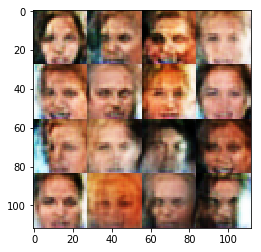

Timestamp 20170805-01-31-16.551 -  Epoch 1/1 -  Step 5210 -  D Loss: 0.8294 - G Loss: 1.6025
Timestamp 20170805-01-31-23.954 -  Epoch 1/1 -  Step 5220 -  D Loss: 1.0730 - G Loss: 1.6705
Timestamp 20170805-01-31-31.297 -  Epoch 1/1 -  Step 5230 -  D Loss: 1.0382 - G Loss: 1.4262
Timestamp 20170805-01-31-38.626 -  Epoch 1/1 -  Step 5240 -  D Loss: 1.2720 - G Loss: 1.7987
Timestamp 20170805-01-31-46.020 -  Epoch 1/1 -  Step 5250 -  D Loss: 1.1171 - G Loss: 1.3707
Timestamp 20170805-01-31-53.530 -  Epoch 1/1 -  Step 5260 -  D Loss: 1.2538 - G Loss: 0.8413
Timestamp 20170805-01-32-01.117 -  Epoch 1/1 -  Step 5270 -  D Loss: 0.8544 - G Loss: 1.1877
Timestamp 20170805-01-32-08.618 -  Epoch 1/1 -  Step 5280 -  D Loss: 0.9847 - G Loss: 1.0512
Timestamp 20170805-01-32-16.088 -  Epoch 1/1 -  Step 5290 -  D Loss: 1.6646 - G Loss: 0.6141
Timestamp 20170805-01-32-23.540 -  Epoch 1/1 -  Step 5300 -  D Loss: 1.4205 - G Loss: 1.1131


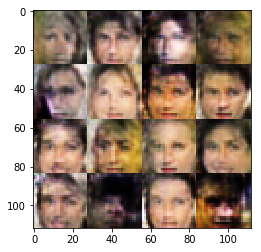

Timestamp 20170805-01-32-31.542 -  Epoch 1/1 -  Step 5310 -  D Loss: 0.7442 - G Loss: 1.6731
Timestamp 20170805-01-32-38.982 -  Epoch 1/1 -  Step 5320 -  D Loss: 0.8778 - G Loss: 1.8185
Timestamp 20170805-01-32-46.432 -  Epoch 1/1 -  Step 5330 -  D Loss: 1.4028 - G Loss: 0.9990
Timestamp 20170805-01-32-53.870 -  Epoch 1/1 -  Step 5340 -  D Loss: 0.9691 - G Loss: 2.0978
Timestamp 20170805-01-33-01.386 -  Epoch 1/1 -  Step 5350 -  D Loss: 0.6395 - G Loss: 1.4795
Timestamp 20170805-01-33-08.716 -  Epoch 1/1 -  Step 5360 -  D Loss: 1.4857 - G Loss: 1.1363
Timestamp 20170805-01-33-16.172 -  Epoch 1/1 -  Step 5370 -  D Loss: 1.4030 - G Loss: 1.6445
Timestamp 20170805-01-33-23.584 -  Epoch 1/1 -  Step 5380 -  D Loss: 1.0909 - G Loss: 1.1221
Timestamp 20170805-01-33-30.912 -  Epoch 1/1 -  Step 5390 -  D Loss: 1.0212 - G Loss: 0.9170
Timestamp 20170805-01-33-38.233 -  Epoch 1/1 -  Step 5400 -  D Loss: 1.2826 - G Loss: 1.5668


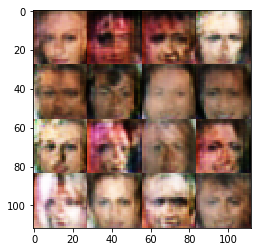

Timestamp 20170805-01-33-46.146 -  Epoch 1/1 -  Step 5410 -  D Loss: 0.7790 - G Loss: 1.5051
Timestamp 20170805-01-33-53.478 -  Epoch 1/1 -  Step 5420 -  D Loss: 0.7371 - G Loss: 1.3939
Timestamp 20170805-01-34-00.859 -  Epoch 1/1 -  Step 5430 -  D Loss: 1.5267 - G Loss: 0.8012
Timestamp 20170805-01-34-08.394 -  Epoch 1/1 -  Step 5440 -  D Loss: 1.3212 - G Loss: 0.6970
Timestamp 20170805-01-34-16.033 -  Epoch 1/1 -  Step 5450 -  D Loss: 0.9152 - G Loss: 1.5234
Timestamp 20170805-01-34-23.532 -  Epoch 1/1 -  Step 5460 -  D Loss: 1.1610 - G Loss: 1.5073
Timestamp 20170805-01-34-31.007 -  Epoch 1/1 -  Step 5470 -  D Loss: 1.2684 - G Loss: 0.8968
Timestamp 20170805-01-34-38.470 -  Epoch 1/1 -  Step 5480 -  D Loss: 0.8167 - G Loss: 2.0809
Timestamp 20170805-01-34-45.930 -  Epoch 1/1 -  Step 5490 -  D Loss: 0.8429 - G Loss: 2.1089
Timestamp 20170805-01-34-53.366 -  Epoch 1/1 -  Step 5500 -  D Loss: 0.8838 - G Loss: 1.6872


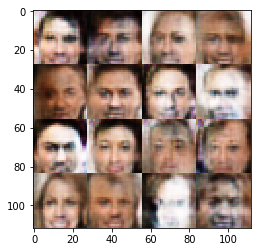

Timestamp 20170805-01-35-01.607 -  Epoch 1/1 -  Step 5510 -  D Loss: 0.7476 - G Loss: 1.8162
Timestamp 20170805-01-35-09.107 -  Epoch 1/1 -  Step 5520 -  D Loss: 1.6219 - G Loss: 1.1030
Timestamp 20170805-01-35-16.790 -  Epoch 1/1 -  Step 5530 -  D Loss: 0.6553 - G Loss: 1.2875
Timestamp 20170805-01-35-24.373 -  Epoch 1/1 -  Step 5540 -  D Loss: 0.9089 - G Loss: 1.5607
Timestamp 20170805-01-35-31.886 -  Epoch 1/1 -  Step 5550 -  D Loss: 0.7880 - G Loss: 1.3612
Timestamp 20170805-01-35-39.288 -  Epoch 1/1 -  Step 5560 -  D Loss: 1.1548 - G Loss: 0.6469
Timestamp 20170805-01-35-46.746 -  Epoch 1/1 -  Step 5570 -  D Loss: 0.8378 - G Loss: 1.5075
Timestamp 20170805-01-35-54.127 -  Epoch 1/1 -  Step 5580 -  D Loss: 0.9908 - G Loss: 1.7816
Timestamp 20170805-01-36-01.570 -  Epoch 1/1 -  Step 5590 -  D Loss: 0.8172 - G Loss: 1.2903
Timestamp 20170805-01-36-08.953 -  Epoch 1/1 -  Step 5600 -  D Loss: 1.0657 - G Loss: 1.0167


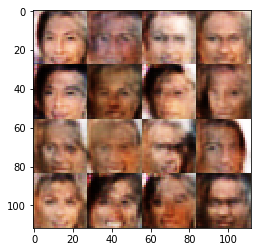

Timestamp 20170805-01-36-16.898 -  Epoch 1/1 -  Step 5610 -  D Loss: 1.3135 - G Loss: 0.9444
Timestamp 20170805-01-36-24.224 -  Epoch 1/1 -  Step 5620 -  D Loss: 1.1225 - G Loss: 1.6346
Timestamp 20170805-01-36-31.583 -  Epoch 1/1 -  Step 5630 -  D Loss: 0.8636 - G Loss: 1.5508
Timestamp 20170805-01-36-38.978 -  Epoch 1/1 -  Step 5640 -  D Loss: 1.1936 - G Loss: 1.0347
Timestamp 20170805-01-36-46.449 -  Epoch 1/1 -  Step 5650 -  D Loss: 1.0799 - G Loss: 1.1371
Timestamp 20170805-01-36-53.908 -  Epoch 1/1 -  Step 5660 -  D Loss: 0.9343 - G Loss: 1.5113
Timestamp 20170805-01-37-01.313 -  Epoch 1/1 -  Step 5670 -  D Loss: 0.7274 - G Loss: 1.3623
Timestamp 20170805-01-37-08.638 -  Epoch 1/1 -  Step 5680 -  D Loss: 0.9765 - G Loss: 0.9324
Timestamp 20170805-01-37-15.970 -  Epoch 1/1 -  Step 5690 -  D Loss: 0.6074 - G Loss: 0.9216
Timestamp 20170805-01-37-23.300 -  Epoch 1/1 -  Step 5700 -  D Loss: 1.0053 - G Loss: 1.2408


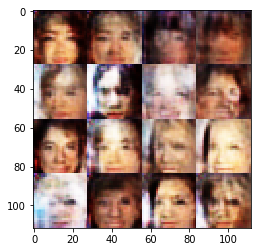

Timestamp 20170805-01-37-31.204 -  Epoch 1/1 -  Step 5710 -  D Loss: 0.6755 - G Loss: 1.4000
Timestamp 20170805-01-37-38.607 -  Epoch 1/1 -  Step 5720 -  D Loss: 0.6288 - G Loss: 1.5142
Timestamp 20170805-01-37-46.011 -  Epoch 1/1 -  Step 5730 -  D Loss: 0.9941 - G Loss: 1.8978
Timestamp 20170805-01-37-53.340 -  Epoch 1/1 -  Step 5740 -  D Loss: 0.9046 - G Loss: 1.7764
Timestamp 20170805-01-38-00.752 -  Epoch 1/1 -  Step 5750 -  D Loss: 0.6460 - G Loss: 2.1443
Timestamp 20170805-01-38-08.198 -  Epoch 1/1 -  Step 5760 -  D Loss: 1.1644 - G Loss: 1.2148
Timestamp 20170805-01-38-15.672 -  Epoch 1/1 -  Step 5770 -  D Loss: 0.9929 - G Loss: 1.4853
Timestamp 20170805-01-38-23.111 -  Epoch 1/1 -  Step 5780 -  D Loss: 0.8304 - G Loss: 2.1470
Timestamp 20170805-01-38-30.419 -  Epoch 1/1 -  Step 5790 -  D Loss: 1.0542 - G Loss: 0.9772
Timestamp 20170805-01-38-37.857 -  Epoch 1/1 -  Step 5800 -  D Loss: 0.7521 - G Loss: 1.2759


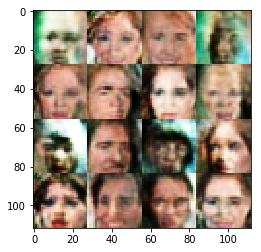

Timestamp 20170805-01-38-45.936 -  Epoch 1/1 -  Step 5810 -  D Loss: 0.6520 - G Loss: 3.1394
Timestamp 20170805-01-38-53.729 -  Epoch 1/1 -  Step 5820 -  D Loss: 1.5582 - G Loss: 0.9471
Timestamp 20170805-01-39-01.380 -  Epoch 1/1 -  Step 5830 -  D Loss: 0.8790 - G Loss: 1.9654
Timestamp 20170805-01-39-08.829 -  Epoch 1/1 -  Step 5840 -  D Loss: 1.0740 - G Loss: 1.1766
Timestamp 20170805-01-39-16.250 -  Epoch 1/1 -  Step 5850 -  D Loss: 0.7596 - G Loss: 1.7564
Timestamp 20170805-01-39-23.828 -  Epoch 1/1 -  Step 5860 -  D Loss: 0.8190 - G Loss: 2.2897
Timestamp 20170805-01-39-31.401 -  Epoch 1/1 -  Step 5870 -  D Loss: 0.9437 - G Loss: 1.7046
Timestamp 20170805-01-39-38.834 -  Epoch 1/1 -  Step 5880 -  D Loss: 0.9075 - G Loss: 1.9229
Timestamp 20170805-01-39-46.553 -  Epoch 1/1 -  Step 5890 -  D Loss: 1.2620 - G Loss: 2.0640
Timestamp 20170805-01-39-54.049 -  Epoch 1/1 -  Step 5900 -  D Loss: 1.1328 - G Loss: 0.9063


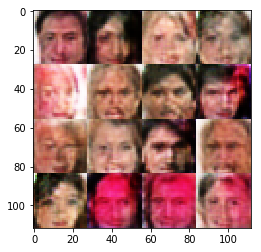

Timestamp 20170805-01-40-02.092 -  Epoch 1/1 -  Step 5910 -  D Loss: 1.0631 - G Loss: 1.2544
Timestamp 20170805-01-40-09.394 -  Epoch 1/1 -  Step 5920 -  D Loss: 0.9589 - G Loss: 0.9058
Timestamp 20170805-01-40-16.861 -  Epoch 1/1 -  Step 5930 -  D Loss: 0.9736 - G Loss: 1.5470
Timestamp 20170805-01-40-24.322 -  Epoch 1/1 -  Step 5940 -  D Loss: 1.0840 - G Loss: 2.1210
Timestamp 20170805-01-40-31.694 -  Epoch 1/1 -  Step 5950 -  D Loss: 1.7914 - G Loss: 1.4162
Timestamp 20170805-01-40-39.054 -  Epoch 1/1 -  Step 5960 -  D Loss: 0.8857 - G Loss: 1.4017
Timestamp 20170805-01-40-46.398 -  Epoch 1/1 -  Step 5970 -  D Loss: 1.0332 - G Loss: 1.2372
Timestamp 20170805-01-40-53.736 -  Epoch 1/1 -  Step 5980 -  D Loss: 0.9042 - G Loss: 1.2670
Timestamp 20170805-01-41-01.075 -  Epoch 1/1 -  Step 5990 -  D Loss: 1.3494 - G Loss: 0.8962
Timestamp 20170805-01-41-08.436 -  Epoch 1/1 -  Step 6000 -  D Loss: 1.3568 - G Loss: 0.6345


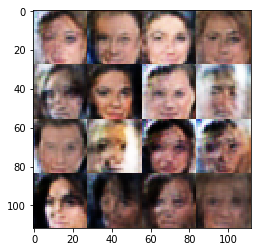

Timestamp 20170805-01-41-16.320 -  Epoch 1/1 -  Step 6010 -  D Loss: 1.2857 - G Loss: 2.0394
Timestamp 20170805-01-41-23.653 -  Epoch 1/1 -  Step 6020 -  D Loss: 1.0527 - G Loss: 1.1221
Timestamp 20170805-01-41-31.133 -  Epoch 1/1 -  Step 6030 -  D Loss: 1.2785 - G Loss: 1.3575
Timestamp 20170805-01-41-38.613 -  Epoch 1/1 -  Step 6040 -  D Loss: 0.8307 - G Loss: 1.0671
Timestamp 20170805-01-41-46.358 -  Epoch 1/1 -  Step 6050 -  D Loss: 0.9657 - G Loss: 0.8216
Timestamp 20170805-01-41-53.787 -  Epoch 1/1 -  Step 6060 -  D Loss: 1.3464 - G Loss: 0.9723
Timestamp 20170805-01-42-01.195 -  Epoch 1/1 -  Step 6070 -  D Loss: 1.1141 - G Loss: 2.1025
Timestamp 20170805-01-42-08.649 -  Epoch 1/1 -  Step 6080 -  D Loss: 0.9150 - G Loss: 1.1730
Timestamp 20170805-01-42-16.238 -  Epoch 1/1 -  Step 6090 -  D Loss: 1.2018 - G Loss: 0.8107
Timestamp 20170805-01-42-23.552 -  Epoch 1/1 -  Step 6100 -  D Loss: 0.9359 - G Loss: 1.2018


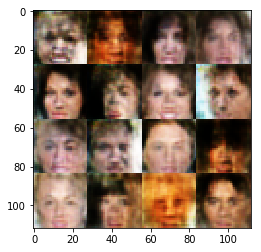

Timestamp 20170805-01-42-31.494 -  Epoch 1/1 -  Step 6110 -  D Loss: 1.4285 - G Loss: 0.6771
Timestamp 20170805-01-42-38.873 -  Epoch 1/1 -  Step 6120 -  D Loss: 1.1510 - G Loss: 1.3940
Timestamp 20170805-01-42-46.210 -  Epoch 1/1 -  Step 6130 -  D Loss: 1.1279 - G Loss: 1.1913
Timestamp 20170805-01-42-53.549 -  Epoch 1/1 -  Step 6140 -  D Loss: 0.9504 - G Loss: 0.6677
Timestamp 20170805-01-43-01.013 -  Epoch 1/1 -  Step 6150 -  D Loss: 0.6732 - G Loss: 1.5823
Timestamp 20170805-01-43-08.502 -  Epoch 1/1 -  Step 6160 -  D Loss: 0.9864 - G Loss: 0.7806
Timestamp 20170805-01-43-16.094 -  Epoch 1/1 -  Step 6170 -  D Loss: 1.7286 - G Loss: 0.9949
Timestamp 20170805-01-43-23.421 -  Epoch 1/1 -  Step 6180 -  D Loss: 0.9031 - G Loss: 1.1389
Timestamp 20170805-01-43-30.745 -  Epoch 1/1 -  Step 6190 -  D Loss: 0.8563 - G Loss: 1.2006
Timestamp 20170805-01-43-38.081 -  Epoch 1/1 -  Step 6200 -  D Loss: 1.4075 - G Loss: 1.4012


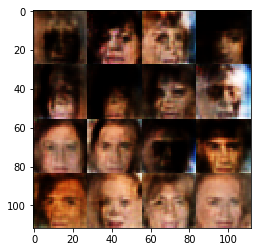

Timestamp 20170805-01-43-46.010 -  Epoch 1/1 -  Step 6210 -  D Loss: 1.0595 - G Loss: 1.6280
Timestamp 20170805-01-43-53.360 -  Epoch 1/1 -  Step 6220 -  D Loss: 0.9647 - G Loss: 3.2732
Timestamp 20170805-01-44-00.710 -  Epoch 1/1 -  Step 6230 -  D Loss: 1.0134 - G Loss: 1.5097
Timestamp 20170805-01-44-08.479 -  Epoch 1/1 -  Step 6240 -  D Loss: 0.8610 - G Loss: 1.3635
Timestamp 20170805-01-44-16.094 -  Epoch 1/1 -  Step 6250 -  D Loss: 0.8389 - G Loss: 1.5312
Timestamp 20170805-01-44-23.570 -  Epoch 1/1 -  Step 6260 -  D Loss: 0.9226 - G Loss: 2.0258
Timestamp 20170805-01-44-31.074 -  Epoch 1/1 -  Step 6270 -  D Loss: 0.7549 - G Loss: 1.2073
Timestamp 20170805-01-44-38.565 -  Epoch 1/1 -  Step 6280 -  D Loss: 1.0757 - G Loss: 1.0538
Timestamp 20170805-01-44-46.020 -  Epoch 1/1 -  Step 6290 -  D Loss: 1.2254 - G Loss: 1.0193
Timestamp 20170805-01-44-53.508 -  Epoch 1/1 -  Step 6300 -  D Loss: 1.1394 - G Loss: 1.5558


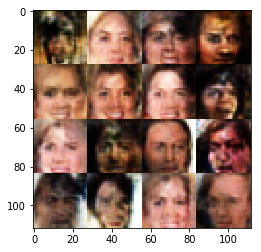

Timestamp 20170805-01-45-01.547 -  Epoch 1/1 -  Step 6310 -  D Loss: 1.3036 - G Loss: 1.1485
Timestamp 20170805-01-45-09.205 -  Epoch 1/1 -  Step 6320 -  D Loss: 0.9430 - G Loss: 1.5897
Timestamp 20170805-01-45-16.732 -  Epoch 1/1 -  Step 6330 -  D Loss: 0.8671 - G Loss: 2.1120
Timestamp 20170805-01-45-24.179 -  Epoch 1/1 -  Step 6340 -  D Loss: 0.9866 - G Loss: 1.2999
Timestamp 20170805-01-45-31.672 -  Epoch 1/1 -  Step 6350 -  D Loss: 1.4669 - G Loss: 1.2284
Timestamp 20170805-01-45-39.192 -  Epoch 1/1 -  Step 6360 -  D Loss: 1.2489 - G Loss: 1.0491
Timestamp 20170805-01-45-46.626 -  Epoch 1/1 -  Step 6370 -  D Loss: 1.1365 - G Loss: 0.5431
Timestamp 20170805-01-45-53.940 -  Epoch 1/1 -  Step 6380 -  D Loss: 0.8696 - G Loss: 0.8245
Timestamp 20170805-01-46-01.287 -  Epoch 1/1 -  Step 6390 -  D Loss: 1.2368 - G Loss: 0.8521
Timestamp 20170805-01-46-08.620 -  Epoch 1/1 -  Step 6400 -  D Loss: 0.9073 - G Loss: 2.4433


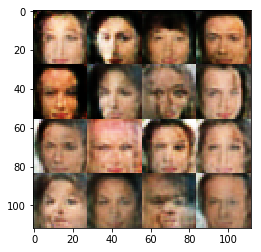

Timestamp 20170805-01-46-17.267 -  Epoch 1/1 -  Step 6410 -  D Loss: 1.2675 - G Loss: 1.0390
Timestamp 20170805-01-46-24.630 -  Epoch 1/1 -  Step 6420 -  D Loss: 0.9393 - G Loss: 1.0532
Timestamp 20170805-01-46-32.019 -  Epoch 1/1 -  Step 6430 -  D Loss: 1.1813 - G Loss: 1.1530
Timestamp 20170805-01-46-39.551 -  Epoch 1/1 -  Step 6440 -  D Loss: 0.9714 - G Loss: 1.5870
Timestamp 20170805-01-46-47.046 -  Epoch 1/1 -  Step 6450 -  D Loss: 0.6946 - G Loss: 2.6601
Timestamp 20170805-01-46-54.439 -  Epoch 1/1 -  Step 6460 -  D Loss: 0.8562 - G Loss: 1.7589
Timestamp 20170805-01-47-01.852 -  Epoch 1/1 -  Step 6470 -  D Loss: 0.5931 - G Loss: 2.4450
Timestamp 20170805-01-47-09.172 -  Epoch 1/1 -  Step 6480 -  D Loss: 0.7474 - G Loss: 0.9436
Timestamp 20170805-01-47-16.546 -  Epoch 1/1 -  Step 6490 -  D Loss: 0.7565 - G Loss: 2.2246
Timestamp 20170805-01-47-23.896 -  Epoch 1/1 -  Step 6500 -  D Loss: 0.7647 - G Loss: 1.7781


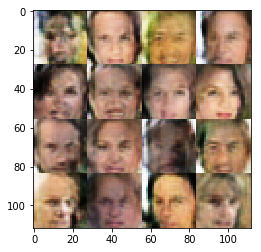

Timestamp 20170805-01-47-31.817 -  Epoch 1/1 -  Step 6510 -  D Loss: 0.5804 - G Loss: 2.7542
Timestamp 20170805-01-47-39.168 -  Epoch 1/1 -  Step 6520 -  D Loss: 1.0363 - G Loss: 1.2818
Timestamp 20170805-01-47-46.630 -  Epoch 1/1 -  Step 6530 -  D Loss: 1.0024 - G Loss: 2.2784
Timestamp 20170805-01-47-54.233 -  Epoch 1/1 -  Step 6540 -  D Loss: 1.2650 - G Loss: 1.4950
Timestamp 20170805-01-48-01.763 -  Epoch 1/1 -  Step 6550 -  D Loss: 1.2235 - G Loss: 1.0260
Timestamp 20170805-01-48-09.322 -  Epoch 1/1 -  Step 6560 -  D Loss: 0.8626 - G Loss: 1.0099
Timestamp 20170805-01-48-16.718 -  Epoch 1/1 -  Step 6570 -  D Loss: 0.9148 - G Loss: 1.4112
Timestamp 20170805-01-48-24.054 -  Epoch 1/1 -  Step 6580 -  D Loss: 1.1673 - G Loss: 0.6201
Timestamp 20170805-01-48-31.825 -  Epoch 1/1 -  Step 6590 -  D Loss: 1.1118 - G Loss: 1.0655
Timestamp 20170805-01-48-39.409 -  Epoch 1/1 -  Step 6600 -  D Loss: 0.8221 - G Loss: 1.7631


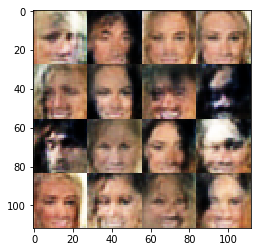

Timestamp 20170805-01-48-47.585 -  Epoch 1/1 -  Step 6610 -  D Loss: 0.8556 - G Loss: 1.0221
Timestamp 20170805-01-48-55.089 -  Epoch 1/1 -  Step 6620 -  D Loss: 0.9057 - G Loss: 1.1854
Timestamp 20170805-01-49-02.654 -  Epoch 1/1 -  Step 6630 -  D Loss: 1.0165 - G Loss: 0.9532
Timestamp 20170805-01-49-10.219 -  Epoch 1/1 -  Step 6640 -  D Loss: 1.0000 - G Loss: 1.4637
Timestamp 20170805-01-49-17.631 -  Epoch 1/1 -  Step 6650 -  D Loss: 0.9199 - G Loss: 1.1269
Timestamp 20170805-01-49-24.980 -  Epoch 1/1 -  Step 6660 -  D Loss: 1.3152 - G Loss: 0.8254
Timestamp 20170805-01-49-32.332 -  Epoch 1/1 -  Step 6670 -  D Loss: 0.8047 - G Loss: 1.5129
Timestamp 20170805-01-49-39.678 -  Epoch 1/1 -  Step 6680 -  D Loss: 0.8664 - G Loss: 1.1772
Timestamp 20170805-01-49-47.040 -  Epoch 1/1 -  Step 6690 -  D Loss: 0.9174 - G Loss: 1.2014
Timestamp 20170805-01-49-54.404 -  Epoch 1/1 -  Step 6700 -  D Loss: 0.9109 - G Loss: 1.4117


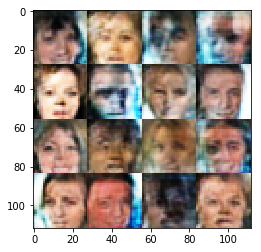

Timestamp 20170805-01-50-02.361 -  Epoch 1/1 -  Step 6710 -  D Loss: 0.6842 - G Loss: 1.7663
Timestamp 20170805-01-50-09.836 -  Epoch 1/1 -  Step 6720 -  D Loss: 0.8606 - G Loss: 0.5738
Timestamp 20170805-01-50-17.163 -  Epoch 1/1 -  Step 6730 -  D Loss: 1.0009 - G Loss: 1.6425
Timestamp 20170805-01-50-24.516 -  Epoch 1/1 -  Step 6740 -  D Loss: 0.7709 - G Loss: 1.5826
Timestamp 20170805-01-50-31.869 -  Epoch 1/1 -  Step 6750 -  D Loss: 1.2518 - G Loss: 1.0689
Timestamp 20170805-01-50-39.221 -  Epoch 1/1 -  Step 6760 -  D Loss: 0.8388 - G Loss: 1.4931
Timestamp 20170805-01-50-46.656 -  Epoch 1/1 -  Step 6770 -  D Loss: 1.5655 - G Loss: 1.6508
Timestamp 20170805-01-50-53.979 -  Epoch 1/1 -  Step 6780 -  D Loss: 0.9395 - G Loss: 1.4162
Timestamp 20170805-01-51-01.322 -  Epoch 1/1 -  Step 6790 -  D Loss: 0.8089 - G Loss: 0.7716
Timestamp 20170805-01-51-08.888 -  Epoch 1/1 -  Step 6800 -  D Loss: 1.0888 - G Loss: 1.4454


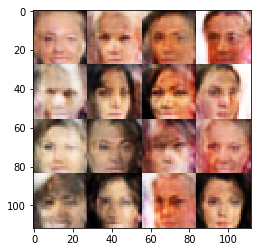

Timestamp 20170805-01-51-16.974 -  Epoch 1/1 -  Step 6810 -  D Loss: 1.1225 - G Loss: 1.0378
Timestamp 20170805-01-51-24.400 -  Epoch 1/1 -  Step 6820 -  D Loss: 0.7942 - G Loss: 1.4880
Timestamp 20170805-01-51-31.831 -  Epoch 1/1 -  Step 6830 -  D Loss: 1.3557 - G Loss: 0.9850
Timestamp 20170805-01-51-39.388 -  Epoch 1/1 -  Step 6840 -  D Loss: 1.0328 - G Loss: 1.0654
Timestamp 20170805-01-51-46.921 -  Epoch 1/1 -  Step 6850 -  D Loss: 0.6470 - G Loss: 1.6785
Timestamp 20170805-01-51-54.359 -  Epoch 1/1 -  Step 6860 -  D Loss: 1.1356 - G Loss: 1.1333
Timestamp 20170805-01-52-01.785 -  Epoch 1/1 -  Step 6870 -  D Loss: 1.0197 - G Loss: 1.1871
Timestamp 20170805-01-52-09.306 -  Epoch 1/1 -  Step 6880 -  D Loss: 0.9501 - G Loss: 1.8405
Timestamp 20170805-01-52-16.906 -  Epoch 1/1 -  Step 6890 -  D Loss: 0.9258 - G Loss: 1.4257
Timestamp 20170805-01-52-24.728 -  Epoch 1/1 -  Step 6900 -  D Loss: 1.0739 - G Loss: 0.9620


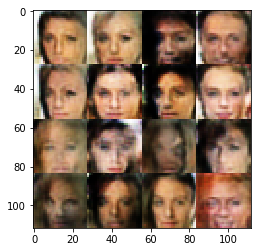

Timestamp 20170805-01-52-32.803 -  Epoch 1/1 -  Step 6910 -  D Loss: 1.1533 - G Loss: 1.2407
Timestamp 20170805-01-52-40.199 -  Epoch 1/1 -  Step 6920 -  D Loss: 0.9317 - G Loss: 1.2731
Timestamp 20170805-01-52-47.698 -  Epoch 1/1 -  Step 6930 -  D Loss: 0.7413 - G Loss: 1.3375
Timestamp 20170805-01-52-55.205 -  Epoch 1/1 -  Step 6940 -  D Loss: 0.9758 - G Loss: 1.6978
Timestamp 20170805-01-53-02.685 -  Epoch 1/1 -  Step 6950 -  D Loss: 1.4816 - G Loss: 0.8167
Timestamp 20170805-01-53-10.233 -  Epoch 1/1 -  Step 6960 -  D Loss: 1.4184 - G Loss: 1.3573
Timestamp 20170805-01-53-17.672 -  Epoch 1/1 -  Step 6970 -  D Loss: 0.8212 - G Loss: 1.4166
Timestamp 20170805-01-53-25.180 -  Epoch 1/1 -  Step 6980 -  D Loss: 0.7092 - G Loss: 1.1993
Timestamp 20170805-01-53-32.602 -  Epoch 1/1 -  Step 6990 -  D Loss: 1.4816 - G Loss: 1.0452
Timestamp 20170805-01-53-40.166 -  Epoch 1/1 -  Step 7000 -  D Loss: 0.8374 - G Loss: 1.3215


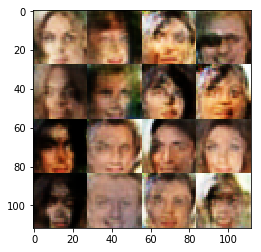

Timestamp 20170805-01-53-48.204 -  Epoch 1/1 -  Step 7010 -  D Loss: 1.3957 - G Loss: 0.8248
Timestamp 20170805-01-53-55.698 -  Epoch 1/1 -  Step 7020 -  D Loss: 0.8662 - G Loss: 2.0382
Timestamp 20170805-01-54-03.118 -  Epoch 1/1 -  Step 7030 -  D Loss: 1.3204 - G Loss: 1.0173
Timestamp 20170805-01-54-10.574 -  Epoch 1/1 -  Step 7040 -  D Loss: 0.6013 - G Loss: 2.2390
Timestamp 20170805-01-54-17.998 -  Epoch 1/1 -  Step 7050 -  D Loss: 0.8969 - G Loss: 2.4283
Timestamp 20170805-01-54-25.652 -  Epoch 1/1 -  Step 7060 -  D Loss: 0.9846 - G Loss: 0.9980
Timestamp 20170805-01-54-33.404 -  Epoch 1/1 -  Step 7070 -  D Loss: 1.0353 - G Loss: 1.5125
Timestamp 20170805-01-54-40.946 -  Epoch 1/1 -  Step 7080 -  D Loss: 1.2599 - G Loss: 1.2671
Timestamp 20170805-01-54-48.593 -  Epoch 1/1 -  Step 7090 -  D Loss: 1.2289 - G Loss: 1.0309
Timestamp 20170805-01-54-56.096 -  Epoch 1/1 -  Step 7100 -  D Loss: 1.0672 - G Loss: 0.8512


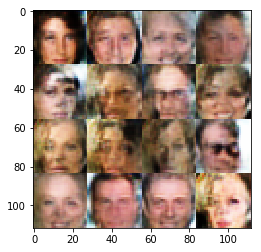

Timestamp 20170805-01-55-04.164 -  Epoch 1/1 -  Step 7110 -  D Loss: 0.7274 - G Loss: 1.6438
Timestamp 20170805-01-55-11.656 -  Epoch 1/1 -  Step 7120 -  D Loss: 1.1174 - G Loss: 1.0409
Timestamp 20170805-01-55-19.145 -  Epoch 1/1 -  Step 7130 -  D Loss: 0.9495 - G Loss: 1.4128
Timestamp 20170805-01-55-26.482 -  Epoch 1/1 -  Step 7140 -  D Loss: 1.0137 - G Loss: 1.0477
Timestamp 20170805-01-55-34.152 -  Epoch 1/1 -  Step 7150 -  D Loss: 0.9945 - G Loss: 1.5050
Timestamp 20170805-01-55-41.595 -  Epoch 1/1 -  Step 7160 -  D Loss: 0.9356 - G Loss: 1.2016
Timestamp 20170805-01-55-49.239 -  Epoch 1/1 -  Step 7170 -  D Loss: 1.0689 - G Loss: 1.3486
Timestamp 20170805-01-55-56.716 -  Epoch 1/1 -  Step 7180 -  D Loss: 0.8590 - G Loss: 1.0188
Timestamp 20170805-01-56-04.198 -  Epoch 1/1 -  Step 7190 -  D Loss: 0.6858 - G Loss: 1.3594
Timestamp 20170805-01-56-11.702 -  Epoch 1/1 -  Step 7200 -  D Loss: 0.8086 - G Loss: 1.1308


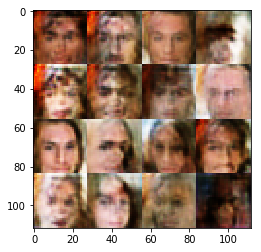

Timestamp 20170805-01-56-19.812 -  Epoch 1/1 -  Step 7210 -  D Loss: 1.0709 - G Loss: 1.2147
Timestamp 20170805-01-56-27.250 -  Epoch 1/1 -  Step 7220 -  D Loss: 0.8274 - G Loss: 2.1245
Timestamp 20170805-01-56-34.673 -  Epoch 1/1 -  Step 7230 -  D Loss: 0.6244 - G Loss: 1.3325
Timestamp 20170805-01-56-42.118 -  Epoch 1/1 -  Step 7240 -  D Loss: 0.7250 - G Loss: 1.7737
Timestamp 20170805-01-56-49.581 -  Epoch 1/1 -  Step 7250 -  D Loss: 1.0041 - G Loss: 1.2500
Timestamp 20170805-01-56-57.000 -  Epoch 1/1 -  Step 7260 -  D Loss: 1.2544 - G Loss: 0.7852
Timestamp 20170805-01-57-04.501 -  Epoch 1/1 -  Step 7270 -  D Loss: 1.1751 - G Loss: 0.7246
Timestamp 20170805-01-57-12.025 -  Epoch 1/1 -  Step 7280 -  D Loss: 0.7731 - G Loss: 1.7298
Timestamp 20170805-01-57-19.491 -  Epoch 1/1 -  Step 7290 -  D Loss: 1.0498 - G Loss: 1.3534
Timestamp 20170805-01-57-27.230 -  Epoch 1/1 -  Step 7300 -  D Loss: 1.5207 - G Loss: 0.4381


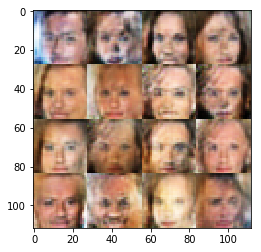

Timestamp 20170805-01-57-35.451 -  Epoch 1/1 -  Step 7310 -  D Loss: 1.4301 - G Loss: 0.7223
Timestamp 20170805-01-57-42.882 -  Epoch 1/1 -  Step 7320 -  D Loss: 1.0172 - G Loss: 1.6362
Timestamp 20170805-01-57-50.242 -  Epoch 1/1 -  Step 7330 -  D Loss: 1.1804 - G Loss: 1.3859
Timestamp 20170805-01-57-58.007 -  Epoch 1/1 -  Step 7340 -  D Loss: 0.6448 - G Loss: 1.5363
Timestamp 20170805-01-58-05.625 -  Epoch 1/1 -  Step 7350 -  D Loss: 0.7809 - G Loss: 1.2348
Timestamp 20170805-01-58-13.482 -  Epoch 1/1 -  Step 7360 -  D Loss: 1.1120 - G Loss: 1.3456
Timestamp 20170805-01-58-20.904 -  Epoch 1/1 -  Step 7370 -  D Loss: 1.4985 - G Loss: 0.9742
Timestamp 20170805-01-58-28.445 -  Epoch 1/1 -  Step 7380 -  D Loss: 1.2402 - G Loss: 0.9980
Timestamp 20170805-01-58-35.949 -  Epoch 1/1 -  Step 7390 -  D Loss: 0.9820 - G Loss: 1.1765
Timestamp 20170805-01-58-43.642 -  Epoch 1/1 -  Step 7400 -  D Loss: 0.7667 - G Loss: 1.0917


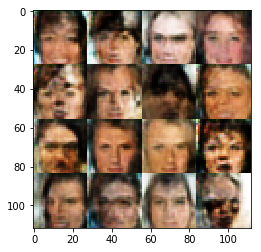

Timestamp 20170805-01-58-51.732 -  Epoch 1/1 -  Step 7410 -  D Loss: 1.3482 - G Loss: 0.5823
Timestamp 20170805-01-58-59.159 -  Epoch 1/1 -  Step 7420 -  D Loss: 0.7325 - G Loss: 1.6776
Timestamp 20170805-01-59-06.756 -  Epoch 1/1 -  Step 7430 -  D Loss: 1.0561 - G Loss: 1.5532
Timestamp 20170805-01-59-14.252 -  Epoch 1/1 -  Step 7440 -  D Loss: 0.9914 - G Loss: 1.5372
Timestamp 20170805-01-59-21.609 -  Epoch 1/1 -  Step 7450 -  D Loss: 1.3085 - G Loss: 1.1510
Timestamp 20170805-01-59-28.966 -  Epoch 1/1 -  Step 7460 -  D Loss: 0.8060 - G Loss: 1.7961
Timestamp 20170805-01-59-36.358 -  Epoch 1/1 -  Step 7470 -  D Loss: 1.3230 - G Loss: 0.9118
Timestamp 20170805-01-59-43.827 -  Epoch 1/1 -  Step 7480 -  D Loss: 0.9493 - G Loss: 2.0198
Timestamp 20170805-01-59-51.193 -  Epoch 1/1 -  Step 7490 -  D Loss: 1.5402 - G Loss: 0.7940
Timestamp 20170805-01-59-58.635 -  Epoch 1/1 -  Step 7500 -  D Loss: 0.8909 - G Loss: 1.4456


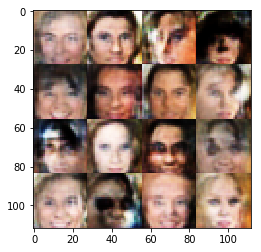

Timestamp 20170805-02-00-06.915 -  Epoch 1/1 -  Step 7510 -  D Loss: 1.1728 - G Loss: 1.0087
Timestamp 20170805-02-00-14.503 -  Epoch 1/1 -  Step 7520 -  D Loss: 0.8704 - G Loss: 1.2124
Timestamp 20170805-02-00-22.069 -  Epoch 1/1 -  Step 7530 -  D Loss: 0.8314 - G Loss: 1.4643
Timestamp 20170805-02-00-29.525 -  Epoch 1/1 -  Step 7540 -  D Loss: 0.6461 - G Loss: 1.4079
Timestamp 20170805-02-00-36.977 -  Epoch 1/1 -  Step 7550 -  D Loss: 0.7140 - G Loss: 1.4200
Timestamp 20170805-02-00-44.358 -  Epoch 1/1 -  Step 7560 -  D Loss: 0.9675 - G Loss: 1.3302
Timestamp 20170805-02-00-51.895 -  Epoch 1/1 -  Step 7570 -  D Loss: 0.9335 - G Loss: 1.2209
Timestamp 20170805-02-00-59.372 -  Epoch 1/1 -  Step 7580 -  D Loss: 1.0141 - G Loss: 0.9315
Timestamp 20170805-02-01-06.892 -  Epoch 1/1 -  Step 7590 -  D Loss: 0.9429 - G Loss: 0.9099
Timestamp 20170805-02-01-14.509 -  Epoch 1/1 -  Step 7600 -  D Loss: 1.2043 - G Loss: 0.9043


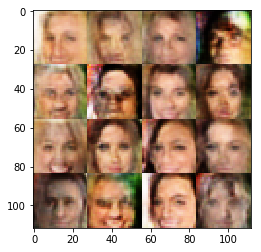

Timestamp 20170805-02-01-22.800 -  Epoch 1/1 -  Step 7610 -  D Loss: 2.0324 - G Loss: 0.4689
Timestamp 20170805-02-01-30.660 -  Epoch 1/1 -  Step 7620 -  D Loss: 1.3778 - G Loss: 1.2913
Timestamp 20170805-02-01-38.403 -  Epoch 1/1 -  Step 7630 -  D Loss: 0.8600 - G Loss: 1.9790
Timestamp 20170805-02-01-46.226 -  Epoch 1/1 -  Step 7640 -  D Loss: 0.7728 - G Loss: 1.7753
Timestamp 20170805-02-01-53.811 -  Epoch 1/1 -  Step 7650 -  D Loss: 1.1322 - G Loss: 0.8557
Timestamp 20170805-02-02-01.478 -  Epoch 1/1 -  Step 7660 -  D Loss: 0.9752 - G Loss: 1.3504
Timestamp 20170805-02-02-09.090 -  Epoch 1/1 -  Step 7670 -  D Loss: 0.9003 - G Loss: 1.1082
Timestamp 20170805-02-02-16.754 -  Epoch 1/1 -  Step 7680 -  D Loss: 0.8293 - G Loss: 1.3190
Timestamp 20170805-02-02-24.319 -  Epoch 1/1 -  Step 7690 -  D Loss: 1.6222 - G Loss: 0.7482
Timestamp 20170805-02-02-31.870 -  Epoch 1/1 -  Step 7700 -  D Loss: 1.2072 - G Loss: 1.0323


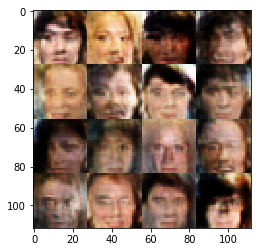

Timestamp 20170805-02-02-40.245 -  Epoch 1/1 -  Step 7710 -  D Loss: 0.6401 - G Loss: 1.6242
Timestamp 20170805-02-02-47.812 -  Epoch 1/1 -  Step 7720 -  D Loss: 1.2654 - G Loss: 1.2229
Timestamp 20170805-02-02-55.328 -  Epoch 1/1 -  Step 7730 -  D Loss: 0.6987 - G Loss: 1.8432
Timestamp 20170805-02-03-03.020 -  Epoch 1/1 -  Step 7740 -  D Loss: 0.9474 - G Loss: 0.8281
Timestamp 20170805-02-03-10.534 -  Epoch 1/1 -  Step 7750 -  D Loss: 0.9437 - G Loss: 1.0256
Timestamp 20170805-02-03-18.227 -  Epoch 1/1 -  Step 7760 -  D Loss: 0.9693 - G Loss: 1.6634
Timestamp 20170805-02-03-25.751 -  Epoch 1/1 -  Step 7770 -  D Loss: 0.8191 - G Loss: 0.8825
Timestamp 20170805-02-03-33.516 -  Epoch 1/1 -  Step 7780 -  D Loss: 1.0352 - G Loss: 0.7922
Timestamp 20170805-02-03-40.960 -  Epoch 1/1 -  Step 7790 -  D Loss: 1.3796 - G Loss: 0.7365
Timestamp 20170805-02-03-48.569 -  Epoch 1/1 -  Step 7800 -  D Loss: 0.7142 - G Loss: 1.1891


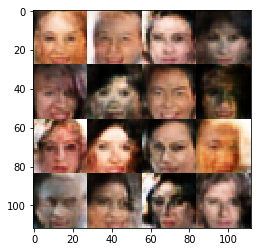

Timestamp 20170805-02-03-56.672 -  Epoch 1/1 -  Step 7810 -  D Loss: 1.0336 - G Loss: 1.4993
Timestamp 20170805-02-04-04.208 -  Epoch 1/1 -  Step 7820 -  D Loss: 1.0660 - G Loss: 1.3824
Timestamp 20170805-02-04-11.964 -  Epoch 1/1 -  Step 7830 -  D Loss: 0.9462 - G Loss: 1.2518
Timestamp 20170805-02-04-19.516 -  Epoch 1/1 -  Step 7840 -  D Loss: 0.9637 - G Loss: 0.5629
Timestamp 20170805-02-04-27.069 -  Epoch 1/1 -  Step 7850 -  D Loss: 0.7947 - G Loss: 1.4415
Timestamp 20170805-02-04-34.629 -  Epoch 1/1 -  Step 7860 -  D Loss: 0.9816 - G Loss: 1.0488
Timestamp 20170805-02-04-42.240 -  Epoch 1/1 -  Step 7870 -  D Loss: 0.7819 - G Loss: 1.7630
Timestamp 20170805-02-04-49.920 -  Epoch 1/1 -  Step 7880 -  D Loss: 1.0898 - G Loss: 1.2062
Timestamp 20170805-02-04-57.609 -  Epoch 1/1 -  Step 7890 -  D Loss: 0.7274 - G Loss: 1.2265
Timestamp 20170805-02-05-05.174 -  Epoch 1/1 -  Step 7900 -  D Loss: 1.2100 - G Loss: 1.1639


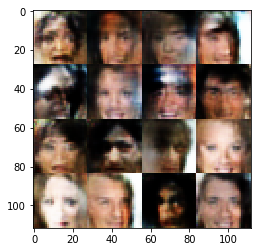

Timestamp 20170805-02-05-13.412 -  Epoch 1/1 -  Step 7910 -  D Loss: 0.8208 - G Loss: 1.3353
Timestamp 20170805-02-05-21.136 -  Epoch 1/1 -  Step 7920 -  D Loss: 1.2244 - G Loss: 0.9581
Timestamp 20170805-02-05-28.843 -  Epoch 1/1 -  Step 7930 -  D Loss: 0.7252 - G Loss: 1.1996
Timestamp 20170805-02-05-36.608 -  Epoch 1/1 -  Step 7940 -  D Loss: 0.7956 - G Loss: 0.8159
Timestamp 20170805-02-05-44.342 -  Epoch 1/1 -  Step 7950 -  D Loss: 1.0500 - G Loss: 1.1819
Timestamp 20170805-02-05-51.971 -  Epoch 1/1 -  Step 7960 -  D Loss: 0.8912 - G Loss: 1.5240
Timestamp 20170805-02-05-59.292 -  Epoch 1/1 -  Step 7970 -  D Loss: 1.0711 - G Loss: 1.7972
Timestamp 20170805-02-06-06.659 -  Epoch 1/1 -  Step 7980 -  D Loss: 0.7085 - G Loss: 1.8782
Timestamp 20170805-02-06-13.995 -  Epoch 1/1 -  Step 7990 -  D Loss: 1.0370 - G Loss: 2.0080
Timestamp 20170805-02-06-21.316 -  Epoch 1/1 -  Step 8000 -  D Loss: 0.8996 - G Loss: 1.6586


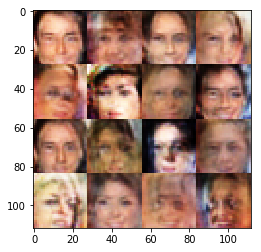

Timestamp 20170805-02-06-29.567 -  Epoch 1/1 -  Step 8010 -  D Loss: 1.2308 - G Loss: 1.5277
Timestamp 20170805-02-06-36.880 -  Epoch 1/1 -  Step 8020 -  D Loss: 0.5784 - G Loss: 1.5039
Timestamp 20170805-02-06-44.216 -  Epoch 1/1 -  Step 8030 -  D Loss: 0.9057 - G Loss: 1.4849
Timestamp 20170805-02-06-51.627 -  Epoch 1/1 -  Step 8040 -  D Loss: 1.1186 - G Loss: 1.4764
Timestamp 20170805-02-06-58.992 -  Epoch 1/1 -  Step 8050 -  D Loss: 0.8460 - G Loss: 1.0961
Timestamp 20170805-02-07-06.404 -  Epoch 1/1 -  Step 8060 -  D Loss: 0.9269 - G Loss: 1.1824
Timestamp 20170805-02-07-14.031 -  Epoch 1/1 -  Step 8070 -  D Loss: 1.1192 - G Loss: 0.7249
Timestamp 20170805-02-07-21.790 -  Epoch 1/1 -  Step 8080 -  D Loss: 0.7330 - G Loss: 1.9686
Timestamp 20170805-02-07-29.512 -  Epoch 1/1 -  Step 8090 -  D Loss: 1.0578 - G Loss: 1.5075
Timestamp 20170805-02-07-37.167 -  Epoch 1/1 -  Step 8100 -  D Loss: 1.0246 - G Loss: 1.3468


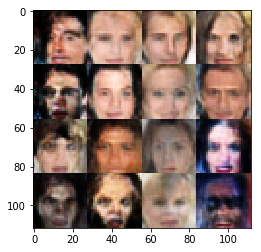

Timestamp 20170805-02-07-45.301 -  Epoch 1/1 -  Step 8110 -  D Loss: 0.9049 - G Loss: 1.2475
Timestamp 20170805-02-07-52.785 -  Epoch 1/1 -  Step 8120 -  D Loss: 0.8200 - G Loss: 1.6619
Timestamp 20170805-02-08-00.118 -  Epoch 1/1 -  Step 8130 -  D Loss: 0.8073 - G Loss: 1.4526
Timestamp 20170805-02-08-07.568 -  Epoch 1/1 -  Step 8140 -  D Loss: 1.0037 - G Loss: 1.1817
Timestamp 20170805-02-08-15.046 -  Epoch 1/1 -  Step 8150 -  D Loss: 0.9137 - G Loss: 1.0682
Timestamp 20170805-02-08-22.372 -  Epoch 1/1 -  Step 8160 -  D Loss: 0.8036 - G Loss: 1.5205
Timestamp 20170805-02-08-29.725 -  Epoch 1/1 -  Step 8170 -  D Loss: 1.0793 - G Loss: 1.3059
Timestamp 20170805-02-08-37.054 -  Epoch 1/1 -  Step 8180 -  D Loss: 0.9500 - G Loss: 1.0444
Timestamp 20170805-02-08-44.447 -  Epoch 1/1 -  Step 8190 -  D Loss: 1.3108 - G Loss: 0.8332
Timestamp 20170805-02-08-51.908 -  Epoch 1/1 -  Step 8200 -  D Loss: 0.6574 - G Loss: 1.4363


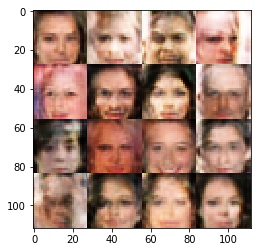

Timestamp 20170805-02-08-59.955 -  Epoch 1/1 -  Step 8210 -  D Loss: 1.2592 - G Loss: 0.4725
Timestamp 20170805-02-09-07.403 -  Epoch 1/1 -  Step 8220 -  D Loss: 0.9635 - G Loss: 1.2711
Timestamp 20170805-02-09-14.871 -  Epoch 1/1 -  Step 8230 -  D Loss: 0.7784 - G Loss: 1.3010
Timestamp 20170805-02-09-22.243 -  Epoch 1/1 -  Step 8240 -  D Loss: 0.9724 - G Loss: 1.1962
Timestamp 20170805-02-09-29.607 -  Epoch 1/1 -  Step 8250 -  D Loss: 0.9965 - G Loss: 1.9013
Timestamp 20170805-02-09-36.945 -  Epoch 1/1 -  Step 8260 -  D Loss: 1.0188 - G Loss: 1.1426
Timestamp 20170805-02-09-44.444 -  Epoch 1/1 -  Step 8270 -  D Loss: 0.9460 - G Loss: 1.0699
Timestamp 20170805-02-09-51.925 -  Epoch 1/1 -  Step 8280 -  D Loss: 1.1116 - G Loss: 0.7081
Timestamp 20170805-02-09-59.351 -  Epoch 1/1 -  Step 8290 -  D Loss: 0.8875 - G Loss: 1.0637
Timestamp 20170805-02-10-07.256 -  Epoch 1/1 -  Step 8300 -  D Loss: 0.8519 - G Loss: 1.3801


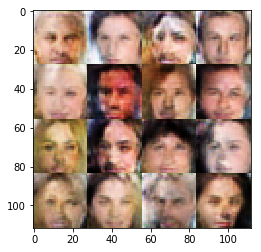

Timestamp 20170805-02-10-15.341 -  Epoch 1/1 -  Step 8310 -  D Loss: 1.0186 - G Loss: 1.0023
Timestamp 20170805-02-10-22.896 -  Epoch 1/1 -  Step 8320 -  D Loss: 1.0044 - G Loss: 1.1751
Timestamp 20170805-02-10-30.549 -  Epoch 1/1 -  Step 8330 -  D Loss: 0.8800 - G Loss: 1.0069
Timestamp 20170805-02-10-38.151 -  Epoch 1/1 -  Step 8340 -  D Loss: 1.2223 - G Loss: 1.1779
Timestamp 20170805-02-10-45.525 -  Epoch 1/1 -  Step 8350 -  D Loss: 0.8480 - G Loss: 1.1610
Timestamp 20170805-02-10-53.012 -  Epoch 1/1 -  Step 8360 -  D Loss: 1.1471 - G Loss: 0.7417
Timestamp 20170805-02-11-00.345 -  Epoch 1/1 -  Step 8370 -  D Loss: 1.3585 - G Loss: 0.7806
Timestamp 20170805-02-11-07.737 -  Epoch 1/1 -  Step 8380 -  D Loss: 0.8611 - G Loss: 1.7998
Timestamp 20170805-02-11-15.079 -  Epoch 1/1 -  Step 8390 -  D Loss: 1.1721 - G Loss: 1.1983
Timestamp 20170805-02-11-22.416 -  Epoch 1/1 -  Step 8400 -  D Loss: 1.1603 - G Loss: 0.9353


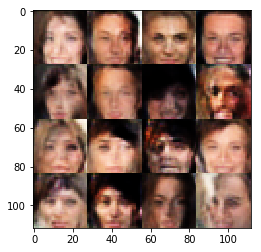

Timestamp 20170805-02-11-30.348 -  Epoch 1/1 -  Step 8410 -  D Loss: 1.1090 - G Loss: 1.3170
Timestamp 20170805-02-11-37.705 -  Epoch 1/1 -  Step 8420 -  D Loss: 0.8929 - G Loss: 0.7881
Timestamp 20170805-02-11-45.136 -  Epoch 1/1 -  Step 8430 -  D Loss: 0.9641 - G Loss: 1.1925
Timestamp 20170805-02-11-52.683 -  Epoch 1/1 -  Step 8440 -  D Loss: 0.6257 - G Loss: 2.2963
Timestamp 20170805-02-12-00.021 -  Epoch 1/1 -  Step 8450 -  D Loss: 1.1156 - G Loss: 1.4406
Timestamp 20170805-02-12-07.451 -  Epoch 1/1 -  Step 8460 -  D Loss: 0.9171 - G Loss: 1.1706
Timestamp 20170805-02-12-14.805 -  Epoch 1/1 -  Step 8470 -  D Loss: 0.7865 - G Loss: 1.5333
Timestamp 20170805-02-12-22.183 -  Epoch 1/1 -  Step 8480 -  D Loss: 1.0274 - G Loss: 1.1359
Timestamp 20170805-02-12-29.515 -  Epoch 1/1 -  Step 8490 -  D Loss: 0.9097 - G Loss: 1.5540
Timestamp 20170805-02-12-36.859 -  Epoch 1/1 -  Step 8500 -  D Loss: 0.9601 - G Loss: 1.1181


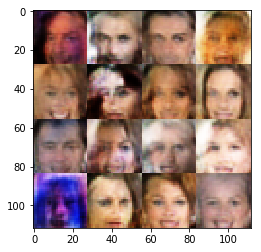

Timestamp 20170805-02-12-44.815 -  Epoch 1/1 -  Step 8510 -  D Loss: 0.9289 - G Loss: 0.8980
Timestamp 20170805-02-12-52.285 -  Epoch 1/1 -  Step 8520 -  D Loss: 0.7608 - G Loss: 1.4433
Timestamp 20170805-02-12-59.940 -  Epoch 1/1 -  Step 8530 -  D Loss: 0.7453 - G Loss: 1.3669
Timestamp 20170805-02-13-07.546 -  Epoch 1/1 -  Step 8540 -  D Loss: 1.0927 - G Loss: 1.2871
Timestamp 20170805-02-13-15.138 -  Epoch 1/1 -  Step 8550 -  D Loss: 1.2032 - G Loss: 1.5954
Timestamp 20170805-02-13-22.540 -  Epoch 1/1 -  Step 8560 -  D Loss: 0.8444 - G Loss: 0.7104
Timestamp 20170805-02-13-29.921 -  Epoch 1/1 -  Step 8570 -  D Loss: 0.8136 - G Loss: 2.0635
Timestamp 20170805-02-13-37.227 -  Epoch 1/1 -  Step 8580 -  D Loss: 1.0506 - G Loss: 0.7672
Timestamp 20170805-02-13-44.556 -  Epoch 1/1 -  Step 8590 -  D Loss: 0.9566 - G Loss: 1.2099
Timestamp 20170805-02-13-51.878 -  Epoch 1/1 -  Step 8600 -  D Loss: 0.9483 - G Loss: 1.2795


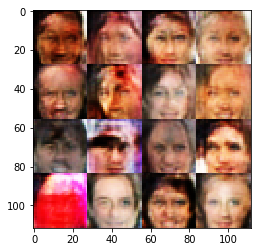

Timestamp 20170805-02-13-59.780 -  Epoch 1/1 -  Step 8610 -  D Loss: 1.1633 - G Loss: 0.6951
Timestamp 20170805-02-14-07.135 -  Epoch 1/1 -  Step 8620 -  D Loss: 0.8726 - G Loss: 1.4981
Timestamp 20170805-02-14-14.585 -  Epoch 1/1 -  Step 8630 -  D Loss: 1.4542 - G Loss: 1.1284
Timestamp 20170805-02-14-22.019 -  Epoch 1/1 -  Step 8640 -  D Loss: 0.7643 - G Loss: 1.1087
Timestamp 20170805-02-14-29.560 -  Epoch 1/1 -  Step 8650 -  D Loss: 0.8645 - G Loss: 0.9607
Timestamp 20170805-02-14-37.062 -  Epoch 1/1 -  Step 8660 -  D Loss: 0.7710 - G Loss: 1.5705
Timestamp 20170805-02-14-44.476 -  Epoch 1/1 -  Step 8670 -  D Loss: 0.9995 - G Loss: 1.0912
Timestamp 20170805-02-14-51.837 -  Epoch 1/1 -  Step 8680 -  D Loss: 0.9522 - G Loss: 1.1396
Timestamp 20170805-02-14-59.150 -  Epoch 1/1 -  Step 8690 -  D Loss: 1.0397 - G Loss: 1.4969
Timestamp 20170805-02-15-06.494 -  Epoch 1/1 -  Step 8700 -  D Loss: 1.1111 - G Loss: 1.4263


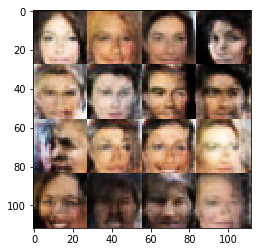

Timestamp 20170805-02-15-14.483 -  Epoch 1/1 -  Step 8710 -  D Loss: 0.9528 - G Loss: 1.3076
Timestamp 20170805-02-15-21.818 -  Epoch 1/1 -  Step 8720 -  D Loss: 1.2819 - G Loss: 1.7716
Timestamp 20170805-02-15-29.142 -  Epoch 1/1 -  Step 8730 -  D Loss: 1.1279 - G Loss: 0.9161
Timestamp 20170805-02-15-36.529 -  Epoch 1/1 -  Step 8740 -  D Loss: 0.8127 - G Loss: 1.2590
Timestamp 20170805-02-15-43.983 -  Epoch 1/1 -  Step 8750 -  D Loss: 1.1248 - G Loss: 1.1922
Timestamp 20170805-02-15-51.532 -  Epoch 1/1 -  Step 8760 -  D Loss: 0.8121 - G Loss: 1.4551
Timestamp 20170805-02-15-58.880 -  Epoch 1/1 -  Step 8770 -  D Loss: 1.0419 - G Loss: 1.1112
Timestamp 20170805-02-16-06.224 -  Epoch 1/1 -  Step 8780 -  D Loss: 0.6946 - G Loss: 1.8631
Timestamp 20170805-02-16-13.529 -  Epoch 1/1 -  Step 8790 -  D Loss: 1.1264 - G Loss: 1.2188
Timestamp 20170805-02-16-20.844 -  Epoch 1/1 -  Step 8800 -  D Loss: 0.8083 - G Loss: 1.2794


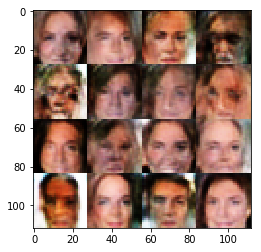

Timestamp 20170805-02-16-28.819 -  Epoch 1/1 -  Step 8810 -  D Loss: 1.3071 - G Loss: 1.0378
Timestamp 20170805-02-16-36.165 -  Epoch 1/1 -  Step 8820 -  D Loss: 0.8562 - G Loss: 1.4957
Timestamp 20170805-02-16-43.501 -  Epoch 1/1 -  Step 8830 -  D Loss: 0.8865 - G Loss: 1.1180
Timestamp 20170805-02-16-50.818 -  Epoch 1/1 -  Step 8840 -  D Loss: 1.2274 - G Loss: 2.5569
Timestamp 20170805-02-16-58.289 -  Epoch 1/1 -  Step 8850 -  D Loss: 1.0296 - G Loss: 1.5875
Timestamp 20170805-02-17-05.717 -  Epoch 1/1 -  Step 8860 -  D Loss: 1.1808 - G Loss: 1.1773
Timestamp 20170805-02-17-13.588 -  Epoch 1/1 -  Step 8870 -  D Loss: 0.9093 - G Loss: 1.4992
Timestamp 20170805-02-17-21.307 -  Epoch 1/1 -  Step 8880 -  D Loss: 1.3741 - G Loss: 0.4885
Timestamp 20170805-02-17-28.823 -  Epoch 1/1 -  Step 8890 -  D Loss: 0.8862 - G Loss: 1.7402
Timestamp 20170805-02-17-36.341 -  Epoch 1/1 -  Step 8900 -  D Loss: 0.7867 - G Loss: 1.0780


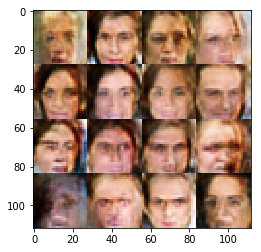

Timestamp 20170805-02-17-44.276 -  Epoch 1/1 -  Step 8910 -  D Loss: 1.0845 - G Loss: 1.4623
Timestamp 20170805-02-17-51.627 -  Epoch 1/1 -  Step 8920 -  D Loss: 0.9702 - G Loss: 1.6960
Timestamp 20170805-02-17-59.030 -  Epoch 1/1 -  Step 8930 -  D Loss: 0.9815 - G Loss: 1.1579
Timestamp 20170805-02-18-06.416 -  Epoch 1/1 -  Step 8940 -  D Loss: 0.8872 - G Loss: 1.1098
Timestamp 20170805-02-18-13.734 -  Epoch 1/1 -  Step 8950 -  D Loss: 0.8343 - G Loss: 2.6387
Timestamp 20170805-02-18-21.242 -  Epoch 1/1 -  Step 8960 -  D Loss: 1.0306 - G Loss: 0.7050
Timestamp 20170805-02-18-28.802 -  Epoch 1/1 -  Step 8970 -  D Loss: 0.7969 - G Loss: 1.4696
Timestamp 20170805-02-18-36.377 -  Epoch 1/1 -  Step 8980 -  D Loss: 0.8026 - G Loss: 1.2510
Timestamp 20170805-02-18-43.698 -  Epoch 1/1 -  Step 8990 -  D Loss: 1.0717 - G Loss: 0.7544
Timestamp 20170805-02-18-51.013 -  Epoch 1/1 -  Step 9000 -  D Loss: 1.1588 - G Loss: 1.9640


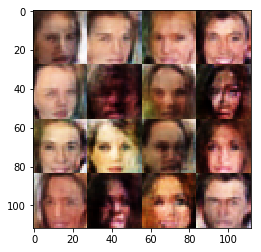

Timestamp 20170805-02-18-58.877 -  Epoch 1/1 -  Step 9010 -  D Loss: 0.8721 - G Loss: 1.0105
Timestamp 20170805-02-19-06.232 -  Epoch 1/1 -  Step 9020 -  D Loss: 0.9694 - G Loss: 1.5473
Timestamp 20170805-02-19-13.628 -  Epoch 1/1 -  Step 9030 -  D Loss: 1.1909 - G Loss: 1.1460
Timestamp 20170805-02-19-20.976 -  Epoch 1/1 -  Step 9040 -  D Loss: 1.4004 - G Loss: 1.3180
Timestamp 20170805-02-19-28.311 -  Epoch 1/1 -  Step 9050 -  D Loss: 0.7706 - G Loss: 0.8733
Timestamp 20170805-02-19-35.657 -  Epoch 1/1 -  Step 9060 -  D Loss: 1.0210 - G Loss: 1.2048
Timestamp 20170805-02-19-43.024 -  Epoch 1/1 -  Step 9070 -  D Loss: 0.7431 - G Loss: 1.2763
Timestamp 20170805-02-19-50.413 -  Epoch 1/1 -  Step 9080 -  D Loss: 1.3733 - G Loss: 0.8195
Timestamp 20170805-02-19-57.934 -  Epoch 1/1 -  Step 9090 -  D Loss: 0.9426 - G Loss: 1.1264
Timestamp 20170805-02-20-05.265 -  Epoch 1/1 -  Step 9100 -  D Loss: 0.7063 - G Loss: 1.4603


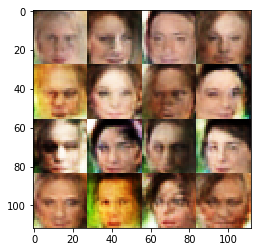

Timestamp 20170805-02-20-13.284 -  Epoch 1/1 -  Step 9110 -  D Loss: 0.9410 - G Loss: 1.0501
Timestamp 20170805-02-20-20.618 -  Epoch 1/1 -  Step 9120 -  D Loss: 0.7923 - G Loss: 1.1198
Timestamp 20170805-02-20-28.243 -  Epoch 1/1 -  Step 9130 -  D Loss: 1.0426 - G Loss: 1.3577
Timestamp 20170805-02-20-35.771 -  Epoch 1/1 -  Step 9140 -  D Loss: 1.0389 - G Loss: 1.4447
Timestamp 20170805-02-20-43.361 -  Epoch 1/1 -  Step 9150 -  D Loss: 0.9507 - G Loss: 1.4091
Timestamp 20170805-02-20-51.075 -  Epoch 1/1 -  Step 9160 -  D Loss: 1.1275 - G Loss: 1.1813
Timestamp 20170805-02-20-58.604 -  Epoch 1/1 -  Step 9170 -  D Loss: 1.1123 - G Loss: 1.1525
Timestamp 20170805-02-21-06.029 -  Epoch 1/1 -  Step 9180 -  D Loss: 0.7678 - G Loss: 1.8708
Timestamp 20170805-02-21-13.370 -  Epoch 1/1 -  Step 9190 -  D Loss: 0.8627 - G Loss: 1.5065
Timestamp 20170805-02-21-20.710 -  Epoch 1/1 -  Step 9200 -  D Loss: 0.8550 - G Loss: 0.8975


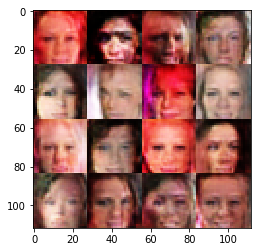

Timestamp 20170805-02-21-28.611 -  Epoch 1/1 -  Step 9210 -  D Loss: 0.9564 - G Loss: 1.7191
Timestamp 20170805-02-21-35.963 -  Epoch 1/1 -  Step 9220 -  D Loss: 1.3225 - G Loss: 1.3515
Timestamp 20170805-02-21-43.280 -  Epoch 1/1 -  Step 9230 -  D Loss: 0.6965 - G Loss: 1.7611
Timestamp 20170805-02-21-50.604 -  Epoch 1/1 -  Step 9240 -  D Loss: 0.7713 - G Loss: 0.8857
Timestamp 20170805-02-21-57.963 -  Epoch 1/1 -  Step 9250 -  D Loss: 1.4247 - G Loss: 1.2099
Timestamp 20170805-02-22-05.356 -  Epoch 1/1 -  Step 9260 -  D Loss: 0.7211 - G Loss: 1.1462
Timestamp 20170805-02-22-12.718 -  Epoch 1/1 -  Step 9270 -  D Loss: 0.7698 - G Loss: 1.4150
Timestamp 20170805-02-22-20.071 -  Epoch 1/1 -  Step 9280 -  D Loss: 0.9443 - G Loss: 0.9361
Timestamp 20170805-02-22-27.418 -  Epoch 1/1 -  Step 9290 -  D Loss: 0.6405 - G Loss: 1.3647
Timestamp 20170805-02-22-34.785 -  Epoch 1/1 -  Step 9300 -  D Loss: 0.8945 - G Loss: 1.2788


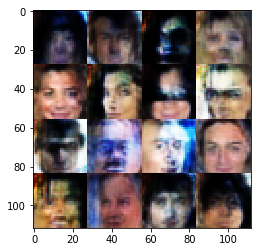

Timestamp 20170805-02-22-42.809 -  Epoch 1/1 -  Step 9310 -  D Loss: 0.7729 - G Loss: 0.9727
Timestamp 20170805-02-22-50.123 -  Epoch 1/1 -  Step 9320 -  D Loss: 1.5724 - G Loss: 0.9854
Timestamp 20170805-02-22-57.477 -  Epoch 1/1 -  Step 9330 -  D Loss: 1.3247 - G Loss: 1.1095
Timestamp 20170805-02-23-04.809 -  Epoch 1/1 -  Step 9340 -  D Loss: 1.0443 - G Loss: 0.6966
Timestamp 20170805-02-23-12.198 -  Epoch 1/1 -  Step 9350 -  D Loss: 1.0071 - G Loss: 1.2969
Timestamp 20170805-02-23-19.719 -  Epoch 1/1 -  Step 9360 -  D Loss: 1.1405 - G Loss: 1.0285
Timestamp 20170805-02-23-27.163 -  Epoch 1/1 -  Step 9370 -  D Loss: 0.9591 - G Loss: 1.4986
Timestamp 20170805-02-23-34.479 -  Epoch 1/1 -  Step 9380 -  D Loss: 1.2823 - G Loss: 1.1377
Timestamp 20170805-02-23-41.818 -  Epoch 1/1 -  Step 9390 -  D Loss: 1.1319 - G Loss: 1.3722
Timestamp 20170805-02-23-49.143 -  Epoch 1/1 -  Step 9400 -  D Loss: 0.7262 - G Loss: 1.6097


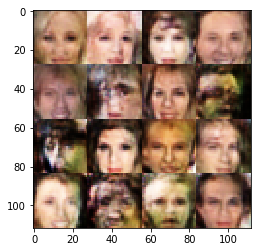

Timestamp 20170805-02-23-57.139 -  Epoch 1/1 -  Step 9410 -  D Loss: 0.8748 - G Loss: 1.1563
Timestamp 20170805-02-24-04.460 -  Epoch 1/1 -  Step 9420 -  D Loss: 0.8639 - G Loss: 1.2274
Timestamp 20170805-02-24-12.011 -  Epoch 1/1 -  Step 9430 -  D Loss: 0.8202 - G Loss: 1.2791
Timestamp 20170805-02-24-19.632 -  Epoch 1/1 -  Step 9440 -  D Loss: 0.7389 - G Loss: 1.3527
Timestamp 20170805-02-24-27.133 -  Epoch 1/1 -  Step 9450 -  D Loss: 0.8806 - G Loss: 1.0255
Timestamp 20170805-02-24-34.502 -  Epoch 1/1 -  Step 9460 -  D Loss: 1.1624 - G Loss: 1.4434
Timestamp 20170805-02-24-42.030 -  Epoch 1/1 -  Step 9470 -  D Loss: 1.3308 - G Loss: 1.0958
Timestamp 20170805-02-24-49.365 -  Epoch 1/1 -  Step 9480 -  D Loss: 1.0251 - G Loss: 0.7153
Timestamp 20170805-02-24-56.763 -  Epoch 1/1 -  Step 9490 -  D Loss: 0.7508 - G Loss: 1.3165
Timestamp 20170805-02-25-04.182 -  Epoch 1/1 -  Step 9500 -  D Loss: 0.6986 - G Loss: 2.1952


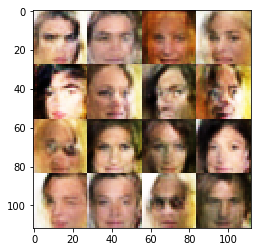

Timestamp 20170805-02-25-12.341 -  Epoch 1/1 -  Step 9510 -  D Loss: 0.8449 - G Loss: 1.1051
Timestamp 20170805-02-25-19.879 -  Epoch 1/1 -  Step 9520 -  D Loss: 0.8177 - G Loss: 2.1938
Timestamp 20170805-02-25-27.573 -  Epoch 1/1 -  Step 9530 -  D Loss: 1.3423 - G Loss: 0.5677
Timestamp 20170805-02-25-35.093 -  Epoch 1/1 -  Step 9540 -  D Loss: 0.7837 - G Loss: 0.8547
Timestamp 20170805-02-25-42.628 -  Epoch 1/1 -  Step 9550 -  D Loss: 1.0225 - G Loss: 1.7653
Timestamp 20170805-02-25-49.958 -  Epoch 1/1 -  Step 9560 -  D Loss: 0.8379 - G Loss: 1.3779
Timestamp 20170805-02-25-57.353 -  Epoch 1/1 -  Step 9570 -  D Loss: 1.0442 - G Loss: 1.2596
Timestamp 20170805-02-26-04.771 -  Epoch 1/1 -  Step 9580 -  D Loss: 1.3588 - G Loss: 2.5489
Timestamp 20170805-02-26-12.300 -  Epoch 1/1 -  Step 9590 -  D Loss: 0.9662 - G Loss: 1.7032
Timestamp 20170805-02-26-19.891 -  Epoch 1/1 -  Step 9600 -  D Loss: 0.8896 - G Loss: 1.0212


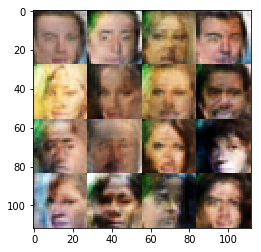

Timestamp 20170805-02-26-27.947 -  Epoch 1/1 -  Step 9610 -  D Loss: 0.8310 - G Loss: 1.2784
Timestamp 20170805-02-26-35.471 -  Epoch 1/1 -  Step 9620 -  D Loss: 1.3306 - G Loss: 0.9341
Timestamp 20170805-02-26-42.855 -  Epoch 1/1 -  Step 9630 -  D Loss: 0.8685 - G Loss: 1.1794
Timestamp 20170805-02-26-50.319 -  Epoch 1/1 -  Step 9640 -  D Loss: 1.4724 - G Loss: 0.9128
Timestamp 20170805-02-26-57.684 -  Epoch 1/1 -  Step 9650 -  D Loss: 0.9240 - G Loss: 0.6494
Timestamp 20170805-02-27-05.021 -  Epoch 1/1 -  Step 9660 -  D Loss: 1.0861 - G Loss: 0.8992
Timestamp 20170805-02-27-12.346 -  Epoch 1/1 -  Step 9670 -  D Loss: 0.8785 - G Loss: 1.4113
Timestamp 20170805-02-27-19.699 -  Epoch 1/1 -  Step 9680 -  D Loss: 0.9154 - G Loss: 1.5152
Timestamp 20170805-02-27-27.171 -  Epoch 1/1 -  Step 9690 -  D Loss: 1.1745 - G Loss: 0.9620
Timestamp 20170805-02-27-34.666 -  Epoch 1/1 -  Step 9700 -  D Loss: 0.8241 - G Loss: 1.7141


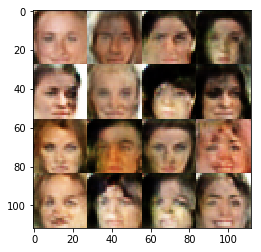

Timestamp 20170805-02-27-42.782 -  Epoch 1/1 -  Step 9710 -  D Loss: 1.2719 - G Loss: 1.1606
Timestamp 20170805-02-27-50.372 -  Epoch 1/1 -  Step 9720 -  D Loss: 1.1376 - G Loss: 1.5321
Timestamp 20170805-02-27-57.724 -  Epoch 1/1 -  Step 9730 -  D Loss: 1.2630 - G Loss: 1.1216
Timestamp 20170805-02-28-05.084 -  Epoch 1/1 -  Step 9740 -  D Loss: 0.6421 - G Loss: 1.2766
Timestamp 20170805-02-28-12.418 -  Epoch 1/1 -  Step 9750 -  D Loss: 0.8117 - G Loss: 1.8945
Timestamp 20170805-02-28-19.744 -  Epoch 1/1 -  Step 9760 -  D Loss: 1.1963 - G Loss: 1.6426
Timestamp 20170805-02-28-27.078 -  Epoch 1/1 -  Step 9770 -  D Loss: 0.8174 - G Loss: 0.8858
Timestamp 20170805-02-28-34.382 -  Epoch 1/1 -  Step 9780 -  D Loss: 1.0723 - G Loss: 1.7441
Timestamp 20170805-02-28-42.024 -  Epoch 1/1 -  Step 9790 -  D Loss: 0.8170 - G Loss: 2.1036
Timestamp 20170805-02-28-49.611 -  Epoch 1/1 -  Step 9800 -  D Loss: 0.7978 - G Loss: 1.6792


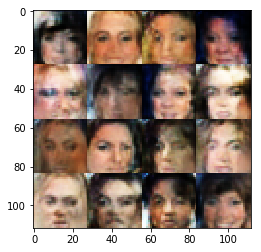

Timestamp 20170805-02-28-57.833 -  Epoch 1/1 -  Step 9810 -  D Loss: 1.0570 - G Loss: 1.6895
Timestamp 20170805-02-29-05.368 -  Epoch 1/1 -  Step 9820 -  D Loss: 0.9255 - G Loss: 1.1822
Timestamp 20170805-02-29-12.955 -  Epoch 1/1 -  Step 9830 -  D Loss: 1.3614 - G Loss: 1.1159
Timestamp 20170805-02-29-20.258 -  Epoch 1/1 -  Step 9840 -  D Loss: 1.1985 - G Loss: 1.4040
Timestamp 20170805-02-29-27.620 -  Epoch 1/1 -  Step 9850 -  D Loss: 1.3214 - G Loss: 1.2452
Timestamp 20170805-02-29-35.057 -  Epoch 1/1 -  Step 9860 -  D Loss: 0.8041 - G Loss: 1.3718
Timestamp 20170805-02-29-42.496 -  Epoch 1/1 -  Step 9870 -  D Loss: 0.6034 - G Loss: 1.4885
Timestamp 20170805-02-29-49.955 -  Epoch 1/1 -  Step 9880 -  D Loss: 0.9716 - G Loss: 1.3815
Timestamp 20170805-02-29-57.307 -  Epoch 1/1 -  Step 9890 -  D Loss: 1.0169 - G Loss: 1.0067
Timestamp 20170805-02-30-04.635 -  Epoch 1/1 -  Step 9900 -  D Loss: 0.7730 - G Loss: 1.2965


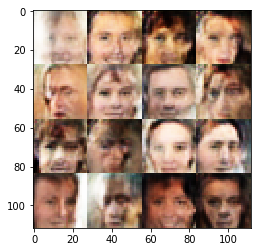

Timestamp 20170805-02-30-12.567 -  Epoch 1/1 -  Step 9910 -  D Loss: 0.8910 - G Loss: 1.6787
Timestamp 20170805-02-30-19.961 -  Epoch 1/1 -  Step 9920 -  D Loss: 0.8407 - G Loss: 1.0984
Timestamp 20170805-02-30-27.261 -  Epoch 1/1 -  Step 9930 -  D Loss: 0.7765 - G Loss: 0.9149
Timestamp 20170805-02-30-34.577 -  Epoch 1/1 -  Step 9940 -  D Loss: 1.1882 - G Loss: 1.1769
Timestamp 20170805-02-30-41.892 -  Epoch 1/1 -  Step 9950 -  D Loss: 0.8401 - G Loss: 0.9348
Timestamp 20170805-02-30-49.290 -  Epoch 1/1 -  Step 9960 -  D Loss: 0.8808 - G Loss: 0.9742
Timestamp 20170805-02-30-56.916 -  Epoch 1/1 -  Step 9970 -  D Loss: 1.0180 - G Loss: 0.8572
Timestamp 20170805-02-31-04.419 -  Epoch 1/1 -  Step 9980 -  D Loss: 0.7949 - G Loss: 0.8062
Timestamp 20170805-02-31-11.801 -  Epoch 1/1 -  Step 9990 -  D Loss: 1.4635 - G Loss: 0.7153
Timestamp 20170805-02-31-19.146 -  Epoch 1/1 -  Step 10000 -  D Loss: 1.0279 - G Loss: 1.7974


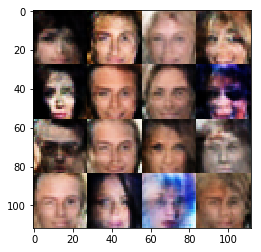

Timestamp 20170805-02-31-27.409 -  Epoch 1/1 -  Step 10010 -  D Loss: 1.1688 - G Loss: 1.1667
Timestamp 20170805-02-31-34.861 -  Epoch 1/1 -  Step 10020 -  D Loss: 0.8993 - G Loss: 1.0709
Timestamp 20170805-02-31-42.189 -  Epoch 1/1 -  Step 10030 -  D Loss: 1.0356 - G Loss: 1.3920
Timestamp 20170805-02-31-49.506 -  Epoch 1/1 -  Step 10040 -  D Loss: 0.7887 - G Loss: 1.5238
Timestamp 20170805-02-31-56.910 -  Epoch 1/1 -  Step 10050 -  D Loss: 1.0442 - G Loss: 1.0384
Timestamp 20170805-02-32-04.254 -  Epoch 1/1 -  Step 10060 -  D Loss: 0.8284 - G Loss: 1.0527
Timestamp 20170805-02-32-11.666 -  Epoch 1/1 -  Step 10070 -  D Loss: 1.1615 - G Loss: 1.2803
Timestamp 20170805-02-32-19.277 -  Epoch 1/1 -  Step 10080 -  D Loss: 0.6367 - G Loss: 1.0610
Timestamp 20170805-02-32-26.620 -  Epoch 1/1 -  Step 10090 -  D Loss: 0.8206 - G Loss: 1.2746
Timestamp 20170805-02-32-33.977 -  Epoch 1/1 -  Step 10100 -  D Loss: 0.9961 - G Loss: 1.2092


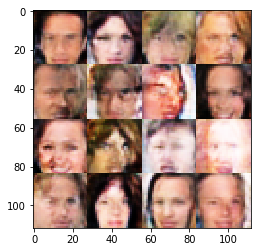

Timestamp 20170805-02-32-41.885 -  Epoch 1/1 -  Step 10110 -  D Loss: 1.2959 - G Loss: 1.0271
Timestamp 20170805-02-32-49.264 -  Epoch 1/1 -  Step 10120 -  D Loss: 0.8365 - G Loss: 1.3868
Timestamp 20170805-02-32-56.677 -  Epoch 1/1 -  Step 10130 -  D Loss: 0.8457 - G Loss: 2.4458
Timestamp 20170805-02-33-03.957 -  Epoch 1/1 -  Step 10140 -  D Loss: 1.0008 - G Loss: 0.8596
Timestamp 20170805-02-33-11.367 -  Epoch 1/1 -  Step 10150 -  D Loss: 0.8243 - G Loss: 1.8482
Timestamp 20170805-02-33-18.673 -  Epoch 1/1 -  Step 10160 -  D Loss: 1.0273 - G Loss: 1.6452
Timestamp 20170805-02-33-25.965 -  Epoch 1/1 -  Step 10170 -  D Loss: 1.1529 - G Loss: 0.8568
Timestamp 20170805-02-33-33.325 -  Epoch 1/1 -  Step 10180 -  D Loss: 0.9249 - G Loss: 1.2538
Timestamp 20170805-02-33-40.708 -  Epoch 1/1 -  Step 10190 -  D Loss: 0.8884 - G Loss: 1.6101
Timestamp 20170805-02-33-48.052 -  Epoch 1/1 -  Step 10200 -  D Loss: 1.0879 - G Loss: 0.6376


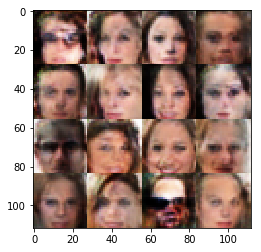

Timestamp 20170805-02-33-55.950 -  Epoch 1/1 -  Step 10210 -  D Loss: 0.8577 - G Loss: 1.3259
Timestamp 20170805-02-34-03.381 -  Epoch 1/1 -  Step 10220 -  D Loss: 1.4436 - G Loss: 1.1244
Timestamp 20170805-02-34-10.774 -  Epoch 1/1 -  Step 10230 -  D Loss: 0.9844 - G Loss: 1.2943
Timestamp 20170805-02-34-18.087 -  Epoch 1/1 -  Step 10240 -  D Loss: 1.0767 - G Loss: 1.2495
Timestamp 20170805-02-34-25.437 -  Epoch 1/1 -  Step 10250 -  D Loss: 1.0309 - G Loss: 1.2494
Timestamp 20170805-02-34-32.981 -  Epoch 1/1 -  Step 10260 -  D Loss: 1.1189 - G Loss: 0.7639
Timestamp 20170805-02-34-40.646 -  Epoch 1/1 -  Step 10270 -  D Loss: 0.7565 - G Loss: 1.4383
Timestamp 20170805-02-34-47.956 -  Epoch 1/1 -  Step 10280 -  D Loss: 0.8554 - G Loss: 1.1490
Timestamp 20170805-02-34-55.285 -  Epoch 1/1 -  Step 10290 -  D Loss: 0.9868 - G Loss: 1.6558
Timestamp 20170805-02-35-02.604 -  Epoch 1/1 -  Step 10300 -  D Loss: 0.8837 - G Loss: 1.3748


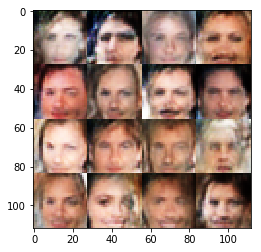

Timestamp 20170805-02-35-10.517 -  Epoch 1/1 -  Step 10310 -  D Loss: 0.9584 - G Loss: 0.4592
Timestamp 20170805-02-35-17.899 -  Epoch 1/1 -  Step 10320 -  D Loss: 1.4106 - G Loss: 0.7404
Timestamp 20170805-02-35-25.204 -  Epoch 1/1 -  Step 10330 -  D Loss: 0.7774 - G Loss: 1.8706
Timestamp 20170805-02-35-32.539 -  Epoch 1/1 -  Step 10340 -  D Loss: 1.3274 - G Loss: 0.8897
Timestamp 20170805-02-35-39.941 -  Epoch 1/1 -  Step 10350 -  D Loss: 2.0633 - G Loss: 0.6469
Timestamp 20170805-02-35-47.414 -  Epoch 1/1 -  Step 10360 -  D Loss: 0.8053 - G Loss: 1.1730
Timestamp 20170805-02-35-54.785 -  Epoch 1/1 -  Step 10370 -  D Loss: 0.9046 - G Loss: 1.6027
Timestamp 20170805-02-36-02.144 -  Epoch 1/1 -  Step 10380 -  D Loss: 0.9445 - G Loss: 1.4603
Timestamp 20170805-02-36-09.573 -  Epoch 1/1 -  Step 10390 -  D Loss: 1.4121 - G Loss: 0.7045
Timestamp 20170805-02-36-17.127 -  Epoch 1/1 -  Step 10400 -  D Loss: 0.9632 - G Loss: 0.9995


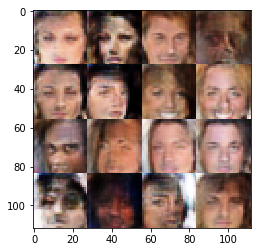

Timestamp 20170805-02-36-25.120 -  Epoch 1/1 -  Step 10410 -  D Loss: 0.9822 - G Loss: 0.8551
Timestamp 20170805-02-36-32.411 -  Epoch 1/1 -  Step 10420 -  D Loss: 1.1150 - G Loss: 0.7632
Timestamp 20170805-02-36-39.741 -  Epoch 1/1 -  Step 10430 -  D Loss: 1.2487 - G Loss: 0.6573
Timestamp 20170805-02-36-47.052 -  Epoch 1/1 -  Step 10440 -  D Loss: 1.0182 - G Loss: 0.9067
Timestamp 20170805-02-36-54.357 -  Epoch 1/1 -  Step 10450 -  D Loss: 0.9676 - G Loss: 1.7309
Timestamp 20170805-02-37-01.663 -  Epoch 1/1 -  Step 10460 -  D Loss: 0.7126 - G Loss: 1.4066
Timestamp 20170805-02-37-09.016 -  Epoch 1/1 -  Step 10470 -  D Loss: 1.1314 - G Loss: 1.1572
Timestamp 20170805-02-37-16.409 -  Epoch 1/1 -  Step 10480 -  D Loss: 1.4851 - G Loss: 1.7179
Timestamp 20170805-02-37-23.720 -  Epoch 1/1 -  Step 10490 -  D Loss: 1.2228 - G Loss: 0.9623
Timestamp 20170805-02-37-31.057 -  Epoch 1/1 -  Step 10500 -  D Loss: 1.1927 - G Loss: 1.0003


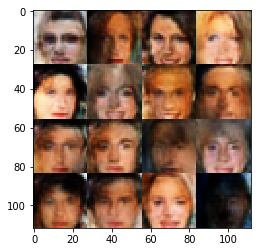

Timestamp 20170805-02-37-39.218 -  Epoch 1/1 -  Step 10510 -  D Loss: 0.9593 - G Loss: 1.7594
Timestamp 20170805-02-37-46.910 -  Epoch 1/1 -  Step 10520 -  D Loss: 0.8882 - G Loss: 1.3980
Timestamp 20170805-02-37-54.303 -  Epoch 1/1 -  Step 10530 -  D Loss: 0.9760 - G Loss: 1.3356
Timestamp 20170805-02-38-01.704 -  Epoch 1/1 -  Step 10540 -  D Loss: 0.9328 - G Loss: 1.2389
Timestamp 20170805-02-38-09.145 -  Epoch 1/1 -  Step 10550 -  D Loss: 0.8006 - G Loss: 1.9122
Timestamp 20170805-02-38-16.782 -  Epoch 1/1 -  Step 10560 -  D Loss: 1.0114 - G Loss: 1.8665
Timestamp 20170805-02-38-24.432 -  Epoch 1/1 -  Step 10570 -  D Loss: 1.2569 - G Loss: 1.2615
Timestamp 20170805-02-38-31.884 -  Epoch 1/1 -  Step 10580 -  D Loss: 0.8942 - G Loss: 2.1856
Timestamp 20170805-02-38-39.180 -  Epoch 1/1 -  Step 10590 -  D Loss: 1.0338 - G Loss: 1.3404
Timestamp 20170805-02-38-46.518 -  Epoch 1/1 -  Step 10600 -  D Loss: 1.0242 - G Loss: 0.6644


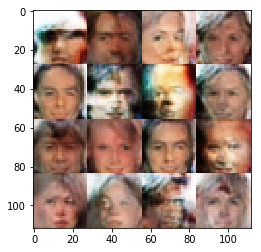

Timestamp 20170805-02-38-54.515 -  Epoch 1/1 -  Step 10610 -  D Loss: 0.9396 - G Loss: 1.1044
Timestamp 20170805-02-39-01.810 -  Epoch 1/1 -  Step 10620 -  D Loss: 1.4470 - G Loss: 0.9875
Timestamp 20170805-02-39-09.624 -  Epoch 1/1 -  Step 10630 -  D Loss: 1.0422 - G Loss: 1.3037
Timestamp 20170805-02-39-17.200 -  Epoch 1/1 -  Step 10640 -  D Loss: 0.7095 - G Loss: 1.7382
Timestamp 20170805-02-39-24.838 -  Epoch 1/1 -  Step 10650 -  D Loss: 1.4328 - G Loss: 0.8932
Timestamp 20170805-02-39-32.259 -  Epoch 1/1 -  Step 10660 -  D Loss: 1.1631 - G Loss: 0.9070
Timestamp 20170805-02-39-39.818 -  Epoch 1/1 -  Step 10670 -  D Loss: 0.9362 - G Loss: 1.2332
Timestamp 20170805-02-39-47.243 -  Epoch 1/1 -  Step 10680 -  D Loss: 0.8296 - G Loss: 1.0993
Timestamp 20170805-02-39-54.782 -  Epoch 1/1 -  Step 10690 -  D Loss: 1.0830 - G Loss: 1.0488
Timestamp 20170805-02-40-02.161 -  Epoch 1/1 -  Step 10700 -  D Loss: 0.7119 - G Loss: 1.4720


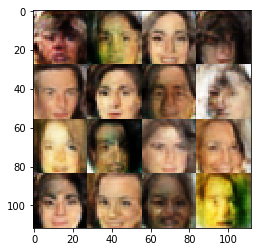

Timestamp 20170805-02-40-10.273 -  Epoch 1/1 -  Step 10710 -  D Loss: 0.8353 - G Loss: 1.2452
Timestamp 20170805-02-40-17.600 -  Epoch 1/1 -  Step 10720 -  D Loss: 1.0648 - G Loss: 1.1243
Timestamp 20170805-02-40-24.902 -  Epoch 1/1 -  Step 10730 -  D Loss: 1.1613 - G Loss: 1.4166
Timestamp 20170805-02-40-32.211 -  Epoch 1/1 -  Step 10740 -  D Loss: 0.9563 - G Loss: 0.9445
Timestamp 20170805-02-40-39.502 -  Epoch 1/1 -  Step 10750 -  D Loss: 1.0195 - G Loss: 0.8048
Timestamp 20170805-02-40-46.919 -  Epoch 1/1 -  Step 10760 -  D Loss: 0.8716 - G Loss: 1.2069
Timestamp 20170805-02-40-54.398 -  Epoch 1/1 -  Step 10770 -  D Loss: 0.9370 - G Loss: 1.0712
Timestamp 20170805-02-41-01.960 -  Epoch 1/1 -  Step 10780 -  D Loss: 0.9674 - G Loss: 0.9639
Timestamp 20170805-02-41-09.387 -  Epoch 1/1 -  Step 10790 -  D Loss: 1.2821 - G Loss: 0.7603
Timestamp 20170805-02-41-16.802 -  Epoch 1/1 -  Step 10800 -  D Loss: 0.7935 - G Loss: 1.9441


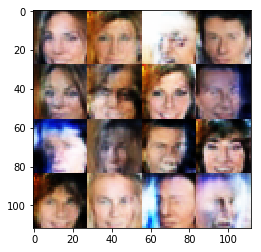

Timestamp 20170805-02-41-25.194 -  Epoch 1/1 -  Step 10810 -  D Loss: 1.1418 - G Loss: 0.8661
Timestamp 20170805-02-41-32.835 -  Epoch 1/1 -  Step 10820 -  D Loss: 0.8222 - G Loss: 1.8905
Timestamp 20170805-02-41-40.222 -  Epoch 1/1 -  Step 10830 -  D Loss: 1.1646 - G Loss: 1.3824
Timestamp 20170805-02-41-47.537 -  Epoch 1/1 -  Step 10840 -  D Loss: 0.9360 - G Loss: 0.9478
Timestamp 20170805-02-41-54.842 -  Epoch 1/1 -  Step 10850 -  D Loss: 0.9322 - G Loss: 1.4563
Timestamp 20170805-02-42-02.288 -  Epoch 1/1 -  Step 10860 -  D Loss: 0.8019 - G Loss: 1.2070
Timestamp 20170805-02-42-09.826 -  Epoch 1/1 -  Step 10870 -  D Loss: 1.4429 - G Loss: 0.9441
Timestamp 20170805-02-42-17.311 -  Epoch 1/1 -  Step 10880 -  D Loss: 1.2652 - G Loss: 0.9152
Timestamp 20170805-02-42-24.847 -  Epoch 1/1 -  Step 10890 -  D Loss: 1.4958 - G Loss: 1.0732
Timestamp 20170805-02-42-32.179 -  Epoch 1/1 -  Step 10900 -  D Loss: 1.1666 - G Loss: 1.7136


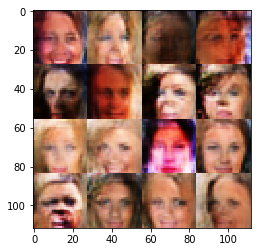

Timestamp 20170805-02-42-40.088 -  Epoch 1/1 -  Step 10910 -  D Loss: 0.8272 - G Loss: 1.4003
Timestamp 20170805-02-42-47.563 -  Epoch 1/1 -  Step 10920 -  D Loss: 1.0781 - G Loss: 1.4425
Timestamp 20170805-02-42-54.939 -  Epoch 1/1 -  Step 10930 -  D Loss: 0.7523 - G Loss: 1.8309
Timestamp 20170805-02-43-02.344 -  Epoch 1/1 -  Step 10940 -  D Loss: 1.8036 - G Loss: 0.7957
Timestamp 20170805-02-43-09.677 -  Epoch 1/1 -  Step 10950 -  D Loss: 1.0962 - G Loss: 1.3031
Timestamp 20170805-02-43-16.983 -  Epoch 1/1 -  Step 10960 -  D Loss: 1.1518 - G Loss: 0.7080
Timestamp 20170805-02-43-24.325 -  Epoch 1/1 -  Step 10970 -  D Loss: 0.8728 - G Loss: 2.1397
Timestamp 20170805-02-43-31.658 -  Epoch 1/1 -  Step 10980 -  D Loss: 0.9634 - G Loss: 1.0569
Timestamp 20170805-02-43-38.959 -  Epoch 1/1 -  Step 10990 -  D Loss: 0.8972 - G Loss: 1.2115
Timestamp 20170805-02-43-46.341 -  Epoch 1/1 -  Step 11000 -  D Loss: 0.8140 - G Loss: 2.2086


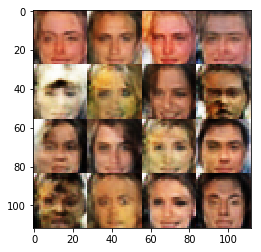

Timestamp 20170805-02-43-54.233 -  Epoch 1/1 -  Step 11010 -  D Loss: 0.9628 - G Loss: 1.4902
Timestamp 20170805-02-44-01.535 -  Epoch 1/1 -  Step 11020 -  D Loss: 0.9929 - G Loss: 1.0111
Timestamp 20170805-02-44-09.251 -  Epoch 1/1 -  Step 11030 -  D Loss: 1.0234 - G Loss: 1.4377
Timestamp 20170805-02-44-16.838 -  Epoch 1/1 -  Step 11040 -  D Loss: 1.1839 - G Loss: 0.9087
Timestamp 20170805-02-44-24.330 -  Epoch 1/1 -  Step 11050 -  D Loss: 1.0951 - G Loss: 1.6222
Timestamp 20170805-02-44-31.621 -  Epoch 1/1 -  Step 11060 -  D Loss: 1.2899 - G Loss: 1.0545
Timestamp 20170805-02-44-39.249 -  Epoch 1/1 -  Step 11070 -  D Loss: 0.7604 - G Loss: 0.9059
Timestamp 20170805-02-44-46.705 -  Epoch 1/1 -  Step 11080 -  D Loss: 0.8697 - G Loss: 1.3133
Timestamp 20170805-02-44-54.056 -  Epoch 1/1 -  Step 11090 -  D Loss: 1.2245 - G Loss: 1.2104
Timestamp 20170805-02-45-01.357 -  Epoch 1/1 -  Step 11100 -  D Loss: 1.4395 - G Loss: 0.3738


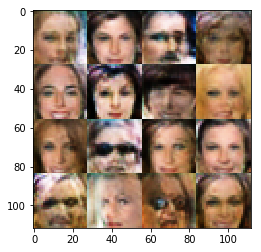

Timestamp 20170805-02-45-09.240 -  Epoch 1/1 -  Step 11110 -  D Loss: 1.2106 - G Loss: 0.5253
Timestamp 20170805-02-45-16.578 -  Epoch 1/1 -  Step 11120 -  D Loss: 0.9300 - G Loss: 1.0010
Timestamp 20170805-02-45-23.895 -  Epoch 1/1 -  Step 11130 -  D Loss: 0.6861 - G Loss: 1.6448
Timestamp 20170805-02-45-31.259 -  Epoch 1/1 -  Step 11140 -  D Loss: 1.2900 - G Loss: 0.5567
Timestamp 20170805-02-45-38.977 -  Epoch 1/1 -  Step 11150 -  D Loss: 1.3913 - G Loss: 0.7837
Timestamp 20170805-02-45-46.579 -  Epoch 1/1 -  Step 11160 -  D Loss: 1.1160 - G Loss: 1.4686
Timestamp 20170805-02-45-53.992 -  Epoch 1/1 -  Step 11170 -  D Loss: 1.7701 - G Loss: 0.9308
Timestamp 20170805-02-46-01.488 -  Epoch 1/1 -  Step 11180 -  D Loss: 0.9068 - G Loss: 1.2296
Timestamp 20170805-02-46-08.884 -  Epoch 1/1 -  Step 11190 -  D Loss: 0.8165 - G Loss: 1.6418
Timestamp 20170805-02-46-16.190 -  Epoch 1/1 -  Step 11200 -  D Loss: 1.5051 - G Loss: 1.2620


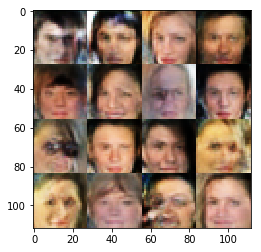

Timestamp 20170805-02-46-24.233 -  Epoch 1/1 -  Step 11210 -  D Loss: 0.7117 - G Loss: 1.7102
Timestamp 20170805-02-46-31.663 -  Epoch 1/1 -  Step 11220 -  D Loss: 1.2274 - G Loss: 1.3384
Timestamp 20170805-02-46-39.111 -  Epoch 1/1 -  Step 11230 -  D Loss: 0.7467 - G Loss: 1.3089
Timestamp 20170805-02-46-46.462 -  Epoch 1/1 -  Step 11240 -  D Loss: 1.2781 - G Loss: 1.7121
Timestamp 20170805-02-46-53.756 -  Epoch 1/1 -  Step 11250 -  D Loss: 0.6638 - G Loss: 1.5983
Timestamp 20170805-02-47-01.056 -  Epoch 1/1 -  Step 11260 -  D Loss: 0.8891 - G Loss: 2.0083
Timestamp 20170805-02-47-08.396 -  Epoch 1/1 -  Step 11270 -  D Loss: 0.9347 - G Loss: 1.8203
Timestamp 20170805-02-47-15.738 -  Epoch 1/1 -  Step 11280 -  D Loss: 0.8909 - G Loss: 1.2350
Timestamp 20170805-02-47-23.054 -  Epoch 1/1 -  Step 11290 -  D Loss: 0.9541 - G Loss: 1.4879
Timestamp 20170805-02-47-30.370 -  Epoch 1/1 -  Step 11300 -  D Loss: 0.9247 - G Loss: 0.8689


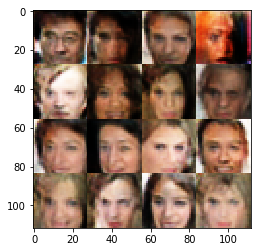

Timestamp 20170805-02-47-39.044 -  Epoch 1/1 -  Step 11310 -  D Loss: 0.9129 - G Loss: 1.4733
Timestamp 20170805-02-47-46.403 -  Epoch 1/1 -  Step 11320 -  D Loss: 1.1174 - G Loss: 0.8012
Timestamp 20170805-02-47-53.735 -  Epoch 1/1 -  Step 11330 -  D Loss: 1.0135 - G Loss: 2.2183
Timestamp 20170805-02-48-01.136 -  Epoch 1/1 -  Step 11340 -  D Loss: 0.9222 - G Loss: 1.5303
Timestamp 20170805-02-48-08.502 -  Epoch 1/1 -  Step 11350 -  D Loss: 1.2265 - G Loss: 1.9016
Timestamp 20170805-02-48-15.917 -  Epoch 1/1 -  Step 11360 -  D Loss: 1.1643 - G Loss: 1.7239
Timestamp 20170805-02-48-23.296 -  Epoch 1/1 -  Step 11370 -  D Loss: 1.3880 - G Loss: 0.7816
Timestamp 20170805-02-48-30.836 -  Epoch 1/1 -  Step 11380 -  D Loss: 0.8487 - G Loss: 1.0295
Timestamp 20170805-02-48-38.255 -  Epoch 1/1 -  Step 11390 -  D Loss: 0.7793 - G Loss: 1.6503
Timestamp 20170805-02-48-45.785 -  Epoch 1/1 -  Step 11400 -  D Loss: 0.7097 - G Loss: 2.9291


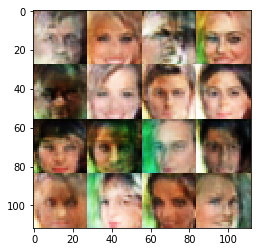

Timestamp 20170805-02-48-54.060 -  Epoch 1/1 -  Step 11410 -  D Loss: 1.1548 - G Loss: 1.0397
Timestamp 20170805-02-49-01.441 -  Epoch 1/1 -  Step 11420 -  D Loss: 0.9128 - G Loss: 0.9459
Timestamp 20170805-02-49-08.779 -  Epoch 1/1 -  Step 11430 -  D Loss: 0.9709 - G Loss: 1.8194
Timestamp 20170805-02-49-16.135 -  Epoch 1/1 -  Step 11440 -  D Loss: 0.9324 - G Loss: 2.1572
Timestamp 20170805-02-49-23.519 -  Epoch 1/1 -  Step 11450 -  D Loss: 0.9882 - G Loss: 1.1781
Timestamp 20170805-02-49-30.907 -  Epoch 1/1 -  Step 11460 -  D Loss: 1.0533 - G Loss: 1.6085
Timestamp 20170805-02-49-38.370 -  Epoch 1/1 -  Step 11470 -  D Loss: 1.1672 - G Loss: 1.9013
Timestamp 20170805-02-49-45.779 -  Epoch 1/1 -  Step 11480 -  D Loss: 1.0494 - G Loss: 0.9820
Timestamp 20170805-02-49-53.099 -  Epoch 1/1 -  Step 11490 -  D Loss: 0.9444 - G Loss: 0.9637
Timestamp 20170805-02-50-00.439 -  Epoch 1/1 -  Step 11500 -  D Loss: 1.0596 - G Loss: 0.7194


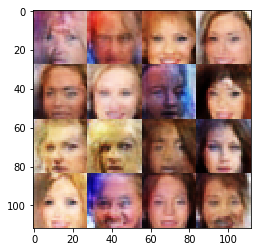

Timestamp 20170805-02-50-08.401 -  Epoch 1/1 -  Step 11510 -  D Loss: 0.8206 - G Loss: 1.2551
Timestamp 20170805-02-50-15.851 -  Epoch 1/1 -  Step 11520 -  D Loss: 1.0125 - G Loss: 0.9779
Timestamp 20170805-02-50-23.317 -  Epoch 1/1 -  Step 11530 -  D Loss: 0.8652 - G Loss: 1.3937
Timestamp 20170805-02-50-30.692 -  Epoch 1/1 -  Step 11540 -  D Loss: 0.7378 - G Loss: 1.7832
Timestamp 20170805-02-50-38.074 -  Epoch 1/1 -  Step 11550 -  D Loss: 0.8081 - G Loss: 1.0118
Timestamp 20170805-02-50-45.417 -  Epoch 1/1 -  Step 11560 -  D Loss: 1.1916 - G Loss: 1.0744
Timestamp 20170805-02-50-52.740 -  Epoch 1/1 -  Step 11570 -  D Loss: 1.7763 - G Loss: 1.1808
Timestamp 20170805-02-51-00.062 -  Epoch 1/1 -  Step 11580 -  D Loss: 0.9107 - G Loss: 1.4673
Timestamp 20170805-02-51-07.406 -  Epoch 1/1 -  Step 11590 -  D Loss: 1.3492 - G Loss: 0.3756
Timestamp 20170805-02-51-14.731 -  Epoch 1/1 -  Step 11600 -  D Loss: 0.8818 - G Loss: 0.7526


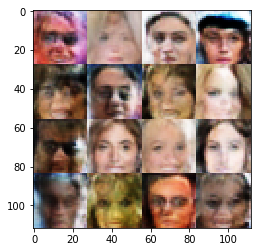

Timestamp 20170805-02-51-22.677 -  Epoch 1/1 -  Step 11610 -  D Loss: 0.6668 - G Loss: 1.7664
Timestamp 20170805-02-51-30.143 -  Epoch 1/1 -  Step 11620 -  D Loss: 1.1754 - G Loss: 1.1921
Timestamp 20170805-02-51-37.501 -  Epoch 1/1 -  Step 11630 -  D Loss: 0.9009 - G Loss: 1.2777
Timestamp 20170805-02-51-44.925 -  Epoch 1/1 -  Step 11640 -  D Loss: 0.9503 - G Loss: 1.8060
Timestamp 20170805-02-51-52.425 -  Epoch 1/1 -  Step 11650 -  D Loss: 1.1100 - G Loss: 1.0175
Timestamp 20170805-02-51-59.724 -  Epoch 1/1 -  Step 11660 -  D Loss: 0.8436 - G Loss: 0.9561
Timestamp 20170805-02-52-07.030 -  Epoch 1/1 -  Step 11670 -  D Loss: 0.7605 - G Loss: 1.1472
Timestamp 20170805-02-52-14.771 -  Epoch 1/1 -  Step 11680 -  D Loss: 0.9864 - G Loss: 2.2255
Timestamp 20170805-02-52-22.268 -  Epoch 1/1 -  Step 11690 -  D Loss: 0.5931 - G Loss: 1.4056
Timestamp 20170805-02-52-29.686 -  Epoch 1/1 -  Step 11700 -  D Loss: 0.7001 - G Loss: 1.8089


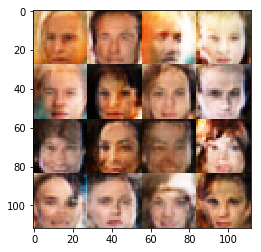

Timestamp 20170805-02-52-37.912 -  Epoch 1/1 -  Step 11710 -  D Loss: 0.9922 - G Loss: 1.5001
Timestamp 20170805-02-52-45.571 -  Epoch 1/1 -  Step 11720 -  D Loss: 1.0036 - G Loss: 1.0723
Timestamp 20170805-02-52-53.199 -  Epoch 1/1 -  Step 11730 -  D Loss: 0.6407 - G Loss: 1.4838
Timestamp 20170805-02-53-00.855 -  Epoch 1/1 -  Step 11740 -  D Loss: 1.2799 - G Loss: 1.2555
Timestamp 20170805-02-53-08.509 -  Epoch 1/1 -  Step 11750 -  D Loss: 1.1199 - G Loss: 1.0895
Timestamp 20170805-02-53-15.974 -  Epoch 1/1 -  Step 11760 -  D Loss: 1.1368 - G Loss: 0.8804
Timestamp 20170805-02-53-23.294 -  Epoch 1/1 -  Step 11770 -  D Loss: 0.6932 - G Loss: 1.7257
Timestamp 20170805-02-53-30.605 -  Epoch 1/1 -  Step 11780 -  D Loss: 1.0874 - G Loss: 0.8655
Timestamp 20170805-02-53-37.938 -  Epoch 1/1 -  Step 11790 -  D Loss: 1.0539 - G Loss: 1.3587
Timestamp 20170805-02-53-45.277 -  Epoch 1/1 -  Step 11800 -  D Loss: 1.2615 - G Loss: 1.0116


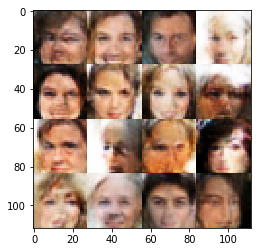

Timestamp 20170805-02-53-53.214 -  Epoch 1/1 -  Step 11810 -  D Loss: 0.9130 - G Loss: 1.0182
Timestamp 20170805-02-54-00.540 -  Epoch 1/1 -  Step 11820 -  D Loss: 1.0155 - G Loss: 1.1909
Timestamp 20170805-02-54-07.875 -  Epoch 1/1 -  Step 11830 -  D Loss: 1.0099 - G Loss: 1.3415
Timestamp 20170805-02-54-15.208 -  Epoch 1/1 -  Step 11840 -  D Loss: 1.3765 - G Loss: 2.0885
Timestamp 20170805-02-54-22.608 -  Epoch 1/1 -  Step 11850 -  D Loss: 0.9274 - G Loss: 1.3531
Timestamp 20170805-02-54-29.993 -  Epoch 1/1 -  Step 11860 -  D Loss: 0.8526 - G Loss: 1.3126
Timestamp 20170805-02-54-37.424 -  Epoch 1/1 -  Step 11870 -  D Loss: 0.8264 - G Loss: 2.1243
Timestamp 20170805-02-54-44.812 -  Epoch 1/1 -  Step 11880 -  D Loss: 0.8809 - G Loss: 1.1847
Timestamp 20170805-02-54-52.295 -  Epoch 1/1 -  Step 11890 -  D Loss: 1.0400 - G Loss: 0.9104
Timestamp 20170805-02-54-59.713 -  Epoch 1/1 -  Step 11900 -  D Loss: 0.9254 - G Loss: 1.4199


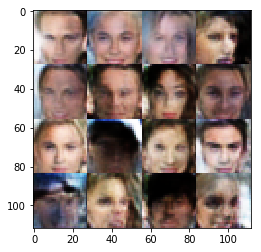

Timestamp 20170805-02-55-07.835 -  Epoch 1/1 -  Step 11910 -  D Loss: 0.8667 - G Loss: 1.8715
Timestamp 20170805-02-55-15.129 -  Epoch 1/1 -  Step 11920 -  D Loss: 1.1382 - G Loss: 1.0626
Timestamp 20170805-02-55-22.426 -  Epoch 1/1 -  Step 11930 -  D Loss: 1.0881 - G Loss: 0.9662
Timestamp 20170805-02-55-29.750 -  Epoch 1/1 -  Step 11940 -  D Loss: 1.0294 - G Loss: 1.6037
Timestamp 20170805-02-55-37.062 -  Epoch 1/1 -  Step 11950 -  D Loss: 1.2772 - G Loss: 0.8809
Timestamp 20170805-02-55-44.400 -  Epoch 1/1 -  Step 11960 -  D Loss: 0.8487 - G Loss: 1.7228
Timestamp 20170805-02-55-51.940 -  Epoch 1/1 -  Step 11970 -  D Loss: 0.7436 - G Loss: 1.7790
Timestamp 20170805-02-55-59.348 -  Epoch 1/1 -  Step 11980 -  D Loss: 0.8357 - G Loss: 2.3254
Timestamp 20170805-02-56-06.942 -  Epoch 1/1 -  Step 11990 -  D Loss: 0.8572 - G Loss: 1.8992
Timestamp 20170805-02-56-14.374 -  Epoch 1/1 -  Step 12000 -  D Loss: 0.7371 - G Loss: 1.3726


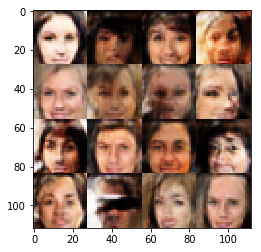

Timestamp 20170805-02-56-22.462 -  Epoch 1/1 -  Step 12010 -  D Loss: 0.6002 - G Loss: 1.7498
Timestamp 20170805-02-56-29.967 -  Epoch 1/1 -  Step 12020 -  D Loss: 1.0407 - G Loss: 1.5905
Timestamp 20170805-02-56-37.393 -  Epoch 1/1 -  Step 12030 -  D Loss: 0.7941 - G Loss: 0.7054
Timestamp 20170805-02-56-44.833 -  Epoch 1/1 -  Step 12040 -  D Loss: 0.6946 - G Loss: 1.6198
Timestamp 20170805-02-56-52.292 -  Epoch 1/1 -  Step 12050 -  D Loss: 1.4547 - G Loss: 1.4391
Timestamp 20170805-02-56-59.737 -  Epoch 1/1 -  Step 12060 -  D Loss: 0.9705 - G Loss: 1.1075
Timestamp 20170805-02-57-07.121 -  Epoch 1/1 -  Step 12070 -  D Loss: 0.9213 - G Loss: 1.6704
Timestamp 20170805-02-57-14.532 -  Epoch 1/1 -  Step 12080 -  D Loss: 1.1077 - G Loss: 0.6762
Timestamp 20170805-02-57-21.844 -  Epoch 1/1 -  Step 12090 -  D Loss: 0.8218 - G Loss: 1.8437
Timestamp 20170805-02-57-29.270 -  Epoch 1/1 -  Step 12100 -  D Loss: 1.0451 - G Loss: 0.9206


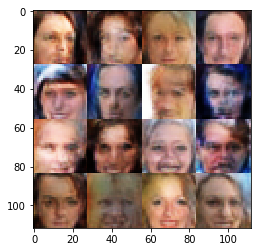

Timestamp 20170805-02-57-37.395 -  Epoch 1/1 -  Step 12110 -  D Loss: 1.0492 - G Loss: 1.1719
Timestamp 20170805-02-57-44.809 -  Epoch 1/1 -  Step 12120 -  D Loss: 0.9613 - G Loss: 0.7466
Timestamp 20170805-02-57-52.135 -  Epoch 1/1 -  Step 12130 -  D Loss: 1.2715 - G Loss: 0.8531
Timestamp 20170805-02-57-59.472 -  Epoch 1/1 -  Step 12140 -  D Loss: 0.8213 - G Loss: 1.8484
Timestamp 20170805-02-58-06.931 -  Epoch 1/1 -  Step 12150 -  D Loss: 0.7593 - G Loss: 1.3665
Timestamp 20170805-02-58-14.361 -  Epoch 1/1 -  Step 12160 -  D Loss: 1.0191 - G Loss: 1.4499
Timestamp 20170805-02-58-21.773 -  Epoch 1/1 -  Step 12170 -  D Loss: 0.9143 - G Loss: 1.1559
Timestamp 20170805-02-58-29.172 -  Epoch 1/1 -  Step 12180 -  D Loss: 1.2447 - G Loss: 0.8524
Timestamp 20170805-02-58-36.729 -  Epoch 1/1 -  Step 12190 -  D Loss: 0.7117 - G Loss: 1.4615
Timestamp 20170805-02-58-44.096 -  Epoch 1/1 -  Step 12200 -  D Loss: 0.5943 - G Loss: 1.8839


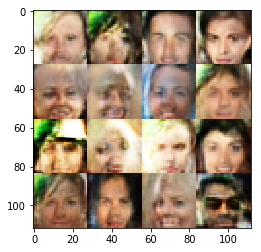

Timestamp 20170805-02-58-52.239 -  Epoch 1/1 -  Step 12210 -  D Loss: 1.1945 - G Loss: 0.9642
Timestamp 20170805-02-58-59.680 -  Epoch 1/1 -  Step 12220 -  D Loss: 0.8893 - G Loss: 1.0109
Timestamp 20170805-02-59-07.383 -  Epoch 1/1 -  Step 12230 -  D Loss: 1.1976 - G Loss: 1.0522
Timestamp 20170805-02-59-14.962 -  Epoch 1/1 -  Step 12240 -  D Loss: 0.9861 - G Loss: 1.4991
Timestamp 20170805-02-59-22.614 -  Epoch 1/1 -  Step 12250 -  D Loss: 0.8596 - G Loss: 0.7278
Timestamp 20170805-02-59-29.940 -  Epoch 1/1 -  Step 12260 -  D Loss: 0.6669 - G Loss: 1.3137
Timestamp 20170805-02-59-37.259 -  Epoch 1/1 -  Step 12270 -  D Loss: 1.1890 - G Loss: 1.4915
Timestamp 20170805-02-59-44.641 -  Epoch 1/1 -  Step 12280 -  D Loss: 0.9298 - G Loss: 2.0483
Timestamp 20170805-02-59-52.090 -  Epoch 1/1 -  Step 12290 -  D Loss: 1.2133 - G Loss: 0.8396
Timestamp 20170805-02-59-59.543 -  Epoch 1/1 -  Step 12300 -  D Loss: 1.0112 - G Loss: 1.6970


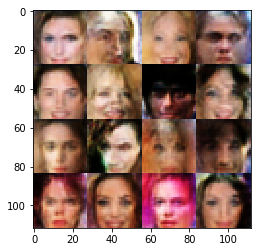

Timestamp 20170805-03-00-07.616 -  Epoch 1/1 -  Step 12310 -  D Loss: 0.8136 - G Loss: 1.0367
Timestamp 20170805-03-00-15.119 -  Epoch 1/1 -  Step 12320 -  D Loss: 0.9675 - G Loss: 1.9895
Timestamp 20170805-03-00-22.625 -  Epoch 1/1 -  Step 12330 -  D Loss: 0.9709 - G Loss: 1.2021
Timestamp 20170805-03-00-29.971 -  Epoch 1/1 -  Step 12340 -  D Loss: 0.9616 - G Loss: 1.3307
Timestamp 20170805-03-00-37.289 -  Epoch 1/1 -  Step 12350 -  D Loss: 1.1107 - G Loss: 1.2720
Timestamp 20170805-03-00-44.605 -  Epoch 1/1 -  Step 12360 -  D Loss: 1.2675 - G Loss: 1.6772
Timestamp 20170805-03-00-51.906 -  Epoch 1/1 -  Step 12370 -  D Loss: 0.8949 - G Loss: 1.3828
Timestamp 20170805-03-00-59.329 -  Epoch 1/1 -  Step 12380 -  D Loss: 0.9112 - G Loss: 1.3007
Timestamp 20170805-03-01-06.650 -  Epoch 1/1 -  Step 12390 -  D Loss: 1.1708 - G Loss: 1.8831
Timestamp 20170805-03-01-14.168 -  Epoch 1/1 -  Step 12400 -  D Loss: 0.6528 - G Loss: 1.1647


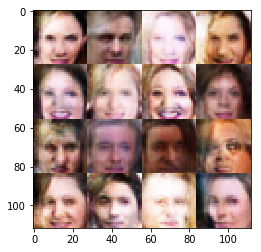

Timestamp 20170805-03-01-22.260 -  Epoch 1/1 -  Step 12410 -  D Loss: 0.7959 - G Loss: 1.2368
Timestamp 20170805-03-01-29.658 -  Epoch 1/1 -  Step 12420 -  D Loss: 1.2423 - G Loss: 1.0500
Timestamp 20170805-03-01-37.071 -  Epoch 1/1 -  Step 12430 -  D Loss: 0.8903 - G Loss: 2.2473
Timestamp 20170805-03-01-44.438 -  Epoch 1/1 -  Step 12440 -  D Loss: 1.1029 - G Loss: 1.5956
Timestamp 20170805-03-01-51.743 -  Epoch 1/1 -  Step 12450 -  D Loss: 1.0570 - G Loss: 1.5922
Timestamp 20170805-03-01-59.186 -  Epoch 1/1 -  Step 12460 -  D Loss: 1.0934 - G Loss: 0.8930
Timestamp 20170805-03-02-06.625 -  Epoch 1/1 -  Step 12470 -  D Loss: 0.8653 - G Loss: 1.3681
Timestamp 20170805-03-02-14.003 -  Epoch 1/1 -  Step 12480 -  D Loss: 1.1913 - G Loss: 1.0441
Timestamp 20170805-03-02-21.315 -  Epoch 1/1 -  Step 12490 -  D Loss: 1.0226 - G Loss: 1.3150
Timestamp 20170805-03-02-28.616 -  Epoch 1/1 -  Step 12500 -  D Loss: 1.1923 - G Loss: 0.6919


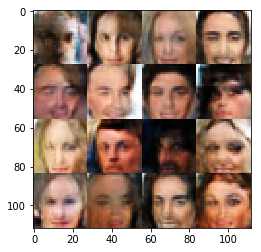

Timestamp 20170805-03-02-36.585 -  Epoch 1/1 -  Step 12510 -  D Loss: 0.8900 - G Loss: 1.4295
Timestamp 20170805-03-02-43.903 -  Epoch 1/1 -  Step 12520 -  D Loss: 0.9749 - G Loss: 1.3152
Timestamp 20170805-03-02-51.284 -  Epoch 1/1 -  Step 12530 -  D Loss: 1.1290 - G Loss: 1.3547
Timestamp 20170805-03-02-58.613 -  Epoch 1/1 -  Step 12540 -  D Loss: 0.7879 - G Loss: 1.1431
Timestamp 20170805-03-03-05.929 -  Epoch 1/1 -  Step 12550 -  D Loss: 1.0051 - G Loss: 1.0741
Timestamp 20170805-03-03-13.259 -  Epoch 1/1 -  Step 12560 -  D Loss: 0.7239 - G Loss: 1.4293
Timestamp 20170805-03-03-20.579 -  Epoch 1/1 -  Step 12570 -  D Loss: 1.0083 - G Loss: 2.9189
Timestamp 20170805-03-03-27.889 -  Epoch 1/1 -  Step 12580 -  D Loss: 1.1643 - G Loss: 1.0679
Timestamp 20170805-03-03-35.228 -  Epoch 1/1 -  Step 12590 -  D Loss: 1.2789 - G Loss: 0.5914
Timestamp 20170805-03-03-42.745 -  Epoch 1/1 -  Step 12600 -  D Loss: 0.8971 - G Loss: 1.2875


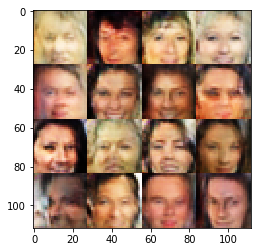

Timestamp 20170805-03-03-50.870 -  Epoch 1/1 -  Step 12610 -  D Loss: 1.2416 - G Loss: 1.1060
Timestamp 20170805-03-03-58.393 -  Epoch 1/1 -  Step 12620 -  D Loss: 0.8090 - G Loss: 1.5228
Timestamp 20170805-03-04-05.925 -  Epoch 1/1 -  Step 12630 -  D Loss: 1.2943 - G Loss: 0.7522
Timestamp 20170805-03-04-13.245 -  Epoch 1/1 -  Step 12640 -  D Loss: 1.0501 - G Loss: 1.1283
Timestamp 20170805-03-04-20.573 -  Epoch 1/1 -  Step 12650 -  D Loss: 0.9900 - G Loss: 0.9019
Timestamp 20170805-03-04-27.893 -  Epoch 1/1 -  Step 12660 -  D Loss: 1.1410 - G Loss: 0.7976
Timestamp 20170805-03-04-35.213 -  Epoch 1/1 -  Step 12670 -  D Loss: 0.6219 - G Loss: 1.2834
Timestamp 20170805-03-04-42.527 -  Epoch 1/1 -  Step 12680 -  D Loss: 1.1842 - G Loss: 1.5625
Timestamp 20170805-03-04-49.873 -  Epoch 1/1 -  Step 12690 -  D Loss: 1.0343 - G Loss: 0.9445
Timestamp 20170805-03-04-57.323 -  Epoch 1/1 -  Step 12700 -  D Loss: 0.6916 - G Loss: 2.3544


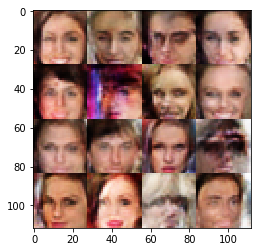

Timestamp 20170805-03-05-05.594 -  Epoch 1/1 -  Step 12710 -  D Loss: 1.0185 - G Loss: 1.5014
Timestamp 20170805-03-05-13.016 -  Epoch 1/1 -  Step 12720 -  D Loss: 0.8151 - G Loss: 1.2491
Timestamp 20170805-03-05-20.507 -  Epoch 1/1 -  Step 12730 -  D Loss: 0.9199 - G Loss: 0.9415
Timestamp 20170805-03-05-28.143 -  Epoch 1/1 -  Step 12740 -  D Loss: 1.2844 - G Loss: 1.1204
Timestamp 20170805-03-05-35.602 -  Epoch 1/1 -  Step 12750 -  D Loss: 0.8831 - G Loss: 1.0157
Timestamp 20170805-03-05-42.926 -  Epoch 1/1 -  Step 12760 -  D Loss: 0.6167 - G Loss: 1.7781
Timestamp 20170805-03-05-50.224 -  Epoch 1/1 -  Step 12770 -  D Loss: 1.0355 - G Loss: 0.9935
Timestamp 20170805-03-05-57.580 -  Epoch 1/1 -  Step 12780 -  D Loss: 0.8230 - G Loss: 1.9150
Timestamp 20170805-03-06-04.890 -  Epoch 1/1 -  Step 12790 -  D Loss: 1.0514 - G Loss: 1.5327
Timestamp 20170805-03-06-12.223 -  Epoch 1/1 -  Step 12800 -  D Loss: 1.3078 - G Loss: 1.2891


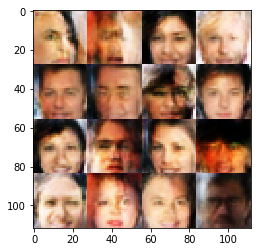

Timestamp 20170805-03-06-20.197 -  Epoch 1/1 -  Step 12810 -  D Loss: 1.0783 - G Loss: 0.9495
Timestamp 20170805-03-06-27.615 -  Epoch 1/1 -  Step 12820 -  D Loss: 0.9536 - G Loss: 2.2166
Timestamp 20170805-03-06-35.095 -  Epoch 1/1 -  Step 12830 -  D Loss: 0.9385 - G Loss: 1.7906
Timestamp 20170805-03-06-42.639 -  Epoch 1/1 -  Step 12840 -  D Loss: 0.7513 - G Loss: 1.4560
Timestamp 20170805-03-06-50.325 -  Epoch 1/1 -  Step 12850 -  D Loss: 1.0305 - G Loss: 1.6575
Timestamp 20170805-03-06-57.784 -  Epoch 1/1 -  Step 12860 -  D Loss: 0.7993 - G Loss: 1.9651
Timestamp 20170805-03-07-05.216 -  Epoch 1/1 -  Step 12870 -  D Loss: 0.6934 - G Loss: 2.2039
Timestamp 20170805-03-07-12.619 -  Epoch 1/1 -  Step 12880 -  D Loss: 0.6984 - G Loss: 1.6312
Timestamp 20170805-03-07-20.106 -  Epoch 1/1 -  Step 12890 -  D Loss: 1.3614 - G Loss: 0.4085
Timestamp 20170805-03-07-27.643 -  Epoch 1/1 -  Step 12900 -  D Loss: 1.3323 - G Loss: 1.1148


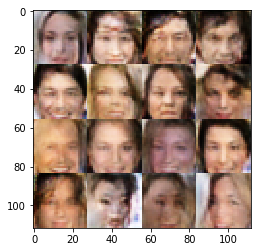

Timestamp 20170805-03-07-35.889 -  Epoch 1/1 -  Step 12910 -  D Loss: 0.8896 - G Loss: 1.4382
Timestamp 20170805-03-07-43.223 -  Epoch 1/1 -  Step 12920 -  D Loss: 0.7949 - G Loss: 0.5868
Timestamp 20170805-03-07-50.589 -  Epoch 1/1 -  Step 12930 -  D Loss: 0.9276 - G Loss: 2.2770
Timestamp 20170805-03-07-58.336 -  Epoch 1/1 -  Step 12940 -  D Loss: 1.0192 - G Loss: 1.1495
Timestamp 20170805-03-08-05.977 -  Epoch 1/1 -  Step 12950 -  D Loss: 0.8303 - G Loss: 1.9192
Timestamp 20170805-03-08-13.682 -  Epoch 1/1 -  Step 12960 -  D Loss: 1.0068 - G Loss: 1.5252
Timestamp 20170805-03-08-21.068 -  Epoch 1/1 -  Step 12970 -  D Loss: 0.9288 - G Loss: 1.2572
Timestamp 20170805-03-08-28.668 -  Epoch 1/1 -  Step 12980 -  D Loss: 0.6880 - G Loss: 1.4327
Timestamp 20170805-03-08-36.164 -  Epoch 1/1 -  Step 12990 -  D Loss: 0.7735 - G Loss: 1.1415
Timestamp 20170805-03-08-43.440 -  Epoch 1/1 -  Step 13000 -  D Loss: 0.7023 - G Loss: 1.4231


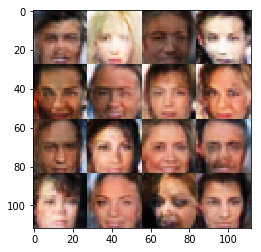

Timestamp 20170805-03-08-51.618 -  Epoch 1/1 -  Step 13010 -  D Loss: 0.8774 - G Loss: 1.4838
Timestamp 20170805-03-08-58.961 -  Epoch 1/1 -  Step 13020 -  D Loss: 0.8533 - G Loss: 0.7978
Timestamp 20170805-03-09-06.263 -  Epoch 1/1 -  Step 13030 -  D Loss: 1.2438 - G Loss: 1.3792
Timestamp 20170805-03-09-13.557 -  Epoch 1/1 -  Step 13040 -  D Loss: 1.0868 - G Loss: 1.1050
Timestamp 20170805-03-09-20.912 -  Epoch 1/1 -  Step 13050 -  D Loss: 0.9504 - G Loss: 1.2268
Timestamp 20170805-03-09-28.222 -  Epoch 1/1 -  Step 13060 -  D Loss: 1.1848 - G Loss: 0.9872
Timestamp 20170805-03-09-35.531 -  Epoch 1/1 -  Step 13070 -  D Loss: 1.1893 - G Loss: 1.1051
Timestamp 20170805-03-09-43.005 -  Epoch 1/1 -  Step 13080 -  D Loss: 1.4610 - G Loss: 1.0400
Timestamp 20170805-03-09-50.444 -  Epoch 1/1 -  Step 13090 -  D Loss: 0.7528 - G Loss: 1.7252
Timestamp 20170805-03-09-57.938 -  Epoch 1/1 -  Step 13100 -  D Loss: 1.1702 - G Loss: 1.3313


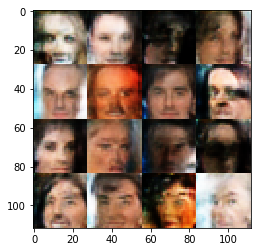

Timestamp 20170805-03-10-06.143 -  Epoch 1/1 -  Step 13110 -  D Loss: 1.1450 - G Loss: 1.1982
Timestamp 20170805-03-10-13.627 -  Epoch 1/1 -  Step 13120 -  D Loss: 0.6950 - G Loss: 1.7004
Timestamp 20170805-03-10-20.995 -  Epoch 1/1 -  Step 13130 -  D Loss: 0.9193 - G Loss: 0.8243
Timestamp 20170805-03-10-28.290 -  Epoch 1/1 -  Step 13140 -  D Loss: 0.7345 - G Loss: 1.3126
Timestamp 20170805-03-10-35.639 -  Epoch 1/1 -  Step 13150 -  D Loss: 1.0678 - G Loss: 0.7889
Timestamp 20170805-03-10-42.934 -  Epoch 1/1 -  Step 13160 -  D Loss: 1.0241 - G Loss: 1.0222
Timestamp 20170805-03-10-50.263 -  Epoch 1/1 -  Step 13170 -  D Loss: 0.8710 - G Loss: 1.9306
Timestamp 20170805-03-10-57.583 -  Epoch 1/1 -  Step 13180 -  D Loss: 1.0888 - G Loss: 1.2696
Timestamp 20170805-03-11-04.921 -  Epoch 1/1 -  Step 13190 -  D Loss: 1.5186 - G Loss: 0.7817
Timestamp 20170805-03-11-12.216 -  Epoch 1/1 -  Step 13200 -  D Loss: 0.8023 - G Loss: 1.4390


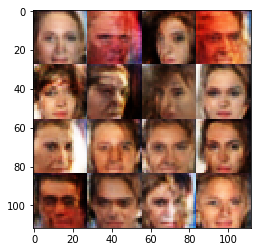

Timestamp 20170805-03-11-20.431 -  Epoch 1/1 -  Step 13210 -  D Loss: 0.8392 - G Loss: 1.1733
Timestamp 20170805-03-11-27.996 -  Epoch 1/1 -  Step 13220 -  D Loss: 1.0292 - G Loss: 1.4462
Timestamp 20170805-03-11-35.437 -  Epoch 1/1 -  Step 13230 -  D Loss: 0.8790 - G Loss: 1.4352
Timestamp 20170805-03-11-43.106 -  Epoch 1/1 -  Step 13240 -  D Loss: 0.9635 - G Loss: 1.3531
Timestamp 20170805-03-11-50.874 -  Epoch 1/1 -  Step 13250 -  D Loss: 1.6625 - G Loss: 1.0415
Timestamp 20170805-03-11-58.309 -  Epoch 1/1 -  Step 13260 -  D Loss: 1.0301 - G Loss: 1.3682
Timestamp 20170805-03-12-05.630 -  Epoch 1/1 -  Step 13270 -  D Loss: 0.9632 - G Loss: 1.2310
Timestamp 20170805-03-12-12.933 -  Epoch 1/1 -  Step 13280 -  D Loss: 0.8810 - G Loss: 0.8580
Timestamp 20170805-03-12-20.653 -  Epoch 1/1 -  Step 13290 -  D Loss: 1.0755 - G Loss: 0.9292
Timestamp 20170805-03-12-28.075 -  Epoch 1/1 -  Step 13300 -  D Loss: 1.0403 - G Loss: 2.1391


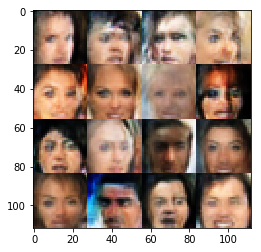

Timestamp 20170805-03-12-36.244 -  Epoch 1/1 -  Step 13310 -  D Loss: 0.7862 - G Loss: 2.0510
Timestamp 20170805-03-12-43.567 -  Epoch 1/1 -  Step 13320 -  D Loss: 0.9431 - G Loss: 1.0355
Timestamp 20170805-03-12-51.071 -  Epoch 1/1 -  Step 13330 -  D Loss: 0.8392 - G Loss: 1.7141
Timestamp 20170805-03-12-58.634 -  Epoch 1/1 -  Step 13340 -  D Loss: 0.8564 - G Loss: 1.3915
Timestamp 20170805-03-13-06.163 -  Epoch 1/1 -  Step 13350 -  D Loss: 0.9259 - G Loss: 1.1782
Timestamp 20170805-03-13-13.698 -  Epoch 1/1 -  Step 13360 -  D Loss: 0.8536 - G Loss: 0.9053
Timestamp 20170805-03-13-21.252 -  Epoch 1/1 -  Step 13370 -  D Loss: 1.3540 - G Loss: 1.5648
Timestamp 20170805-03-13-28.761 -  Epoch 1/1 -  Step 13380 -  D Loss: 0.8887 - G Loss: 0.9595
Timestamp 20170805-03-13-36.151 -  Epoch 1/1 -  Step 13390 -  D Loss: 1.3149 - G Loss: 0.7397
Timestamp 20170805-03-13-43.632 -  Epoch 1/1 -  Step 13400 -  D Loss: 0.7226 - G Loss: 0.9680


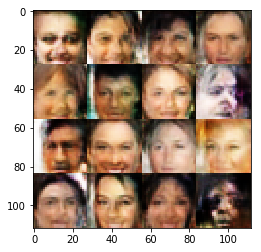

Timestamp 20170805-03-13-51.768 -  Epoch 1/1 -  Step 13410 -  D Loss: 1.0391 - G Loss: 1.0137
Timestamp 20170805-03-13-59.167 -  Epoch 1/1 -  Step 13420 -  D Loss: 1.0020 - G Loss: 0.6588
Timestamp 20170805-03-14-06.478 -  Epoch 1/1 -  Step 13430 -  D Loss: 1.1929 - G Loss: 1.6757
Timestamp 20170805-03-14-13.770 -  Epoch 1/1 -  Step 13440 -  D Loss: 1.2281 - G Loss: 0.9197
Timestamp 20170805-03-14-21.144 -  Epoch 1/1 -  Step 13450 -  D Loss: 0.9478 - G Loss: 0.8764
Timestamp 20170805-03-14-28.676 -  Epoch 1/1 -  Step 13460 -  D Loss: 1.1203 - G Loss: 1.3030
Timestamp 20170805-03-14-36.108 -  Epoch 1/1 -  Step 13470 -  D Loss: 0.9064 - G Loss: 1.8219
Timestamp 20170805-03-14-43.587 -  Epoch 1/1 -  Step 13480 -  D Loss: 0.8711 - G Loss: 1.4752
Timestamp 20170805-03-14-51.191 -  Epoch 1/1 -  Step 13490 -  D Loss: 1.3410 - G Loss: 1.1531
Timestamp 20170805-03-14-58.746 -  Epoch 1/1 -  Step 13500 -  D Loss: 0.8969 - G Loss: 1.5420


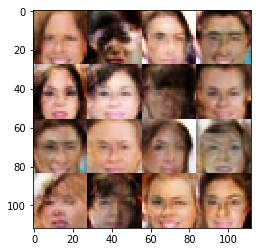

Timestamp 20170805-03-15-07.142 -  Epoch 1/1 -  Step 13510 -  D Loss: 0.8357 - G Loss: 1.9308
Timestamp 20170805-03-15-14.601 -  Epoch 1/1 -  Step 13520 -  D Loss: 0.7735 - G Loss: 1.5758
Timestamp 20170805-03-15-22.058 -  Epoch 1/1 -  Step 13530 -  D Loss: 1.0022 - G Loss: 0.7198
Timestamp 20170805-03-15-29.918 -  Epoch 1/1 -  Step 13540 -  D Loss: 0.6777 - G Loss: 1.9395
Timestamp 20170805-03-15-37.362 -  Epoch 1/1 -  Step 13550 -  D Loss: 0.8377 - G Loss: 1.2718
Timestamp 20170805-03-15-44.679 -  Epoch 1/1 -  Step 13560 -  D Loss: 0.6774 - G Loss: 1.7216
Timestamp 20170805-03-15-51.976 -  Epoch 1/1 -  Step 13570 -  D Loss: 0.5604 - G Loss: 1.6910
Timestamp 20170805-03-15-59.376 -  Epoch 1/1 -  Step 13580 -  D Loss: 0.9483 - G Loss: 0.8626
Timestamp 20170805-03-16-06.665 -  Epoch 1/1 -  Step 13590 -  D Loss: 0.8050 - G Loss: 2.1975
Timestamp 20170805-03-16-14.053 -  Epoch 1/1 -  Step 13600 -  D Loss: 0.8111 - G Loss: 0.9633


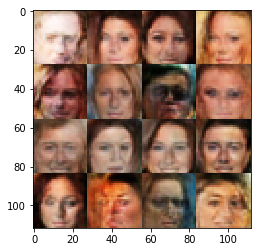

Timestamp 20170805-03-16-22.201 -  Epoch 1/1 -  Step 13610 -  D Loss: 1.1063 - G Loss: 1.4843
Timestamp 20170805-03-16-29.608 -  Epoch 1/1 -  Step 13620 -  D Loss: 0.8968 - G Loss: 1.1263
Timestamp 20170805-03-16-37.197 -  Epoch 1/1 -  Step 13630 -  D Loss: 0.7672 - G Loss: 0.6455
Timestamp 20170805-03-16-44.704 -  Epoch 1/1 -  Step 13640 -  D Loss: 1.2054 - G Loss: 1.7445
Timestamp 20170805-03-16-52.552 -  Epoch 1/1 -  Step 13650 -  D Loss: 0.9738 - G Loss: 1.0356
Timestamp 20170805-03-17-00.066 -  Epoch 1/1 -  Step 13660 -  D Loss: 0.9716 - G Loss: 0.7820
Timestamp 20170805-03-17-07.545 -  Epoch 1/1 -  Step 13670 -  D Loss: 0.7069 - G Loss: 1.3641
Timestamp 20170805-03-17-14.999 -  Epoch 1/1 -  Step 13680 -  D Loss: 0.7318 - G Loss: 1.6641
Timestamp 20170805-03-17-22.322 -  Epoch 1/1 -  Step 13690 -  D Loss: 0.8367 - G Loss: 1.6095
Timestamp 20170805-03-17-29.624 -  Epoch 1/1 -  Step 13700 -  D Loss: 1.2730 - G Loss: 1.3316


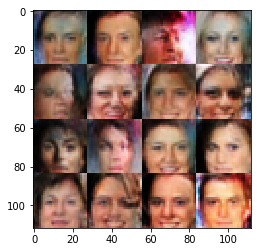

Timestamp 20170805-03-17-37.691 -  Epoch 1/1 -  Step 13710 -  D Loss: 1.0985 - G Loss: 1.7501
Timestamp 20170805-03-17-44.993 -  Epoch 1/1 -  Step 13720 -  D Loss: 0.9605 - G Loss: 1.5533
Timestamp 20170805-03-17-52.359 -  Epoch 1/1 -  Step 13730 -  D Loss: 1.1200 - G Loss: 1.6141
Timestamp 20170805-03-17-59.729 -  Epoch 1/1 -  Step 13740 -  D Loss: 1.1015 - G Loss: 1.7497
Timestamp 20170805-03-18-07.117 -  Epoch 1/1 -  Step 13750 -  D Loss: 1.5571 - G Loss: 1.3028
Timestamp 20170805-03-18-14.538 -  Epoch 1/1 -  Step 13760 -  D Loss: 1.1787 - G Loss: 1.4570
Timestamp 20170805-03-18-21.889 -  Epoch 1/1 -  Step 13770 -  D Loss: 0.8858 - G Loss: 1.1714
Timestamp 20170805-03-18-29.189 -  Epoch 1/1 -  Step 13780 -  D Loss: 0.7889 - G Loss: 1.4454
Timestamp 20170805-03-18-36.501 -  Epoch 1/1 -  Step 13790 -  D Loss: 0.7367 - G Loss: 1.2122
Timestamp 20170805-03-18-43.791 -  Epoch 1/1 -  Step 13800 -  D Loss: 0.9025 - G Loss: 1.2091


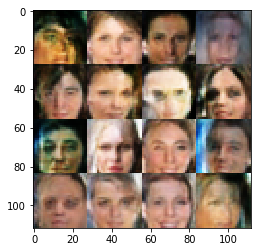

Timestamp 20170805-03-18-51.771 -  Epoch 1/1 -  Step 13810 -  D Loss: 0.9069 - G Loss: 1.4486
Timestamp 20170805-03-18-59.175 -  Epoch 1/1 -  Step 13820 -  D Loss: 0.8836 - G Loss: 1.8021
Timestamp 20170805-03-19-06.553 -  Epoch 1/1 -  Step 13830 -  D Loss: 1.0164 - G Loss: 1.4427
Timestamp 20170805-03-19-14.063 -  Epoch 1/1 -  Step 13840 -  D Loss: 1.2309 - G Loss: 1.4880
Timestamp 20170805-03-19-21.650 -  Epoch 1/1 -  Step 13850 -  D Loss: 1.4460 - G Loss: 1.1774
Timestamp 20170805-03-19-29.166 -  Epoch 1/1 -  Step 13860 -  D Loss: 1.3962 - G Loss: 1.5513
Timestamp 20170805-03-19-36.704 -  Epoch 1/1 -  Step 13870 -  D Loss: 1.3508 - G Loss: 0.9159
Timestamp 20170805-03-19-44.461 -  Epoch 1/1 -  Step 13880 -  D Loss: 0.9648 - G Loss: 1.5530
Timestamp 20170805-03-19-52.167 -  Epoch 1/1 -  Step 13890 -  D Loss: 1.2640 - G Loss: 0.7362
Timestamp 20170805-03-19-59.767 -  Epoch 1/1 -  Step 13900 -  D Loss: 0.8100 - G Loss: 1.6770


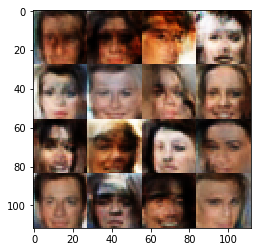

Timestamp 20170805-03-20-08.090 -  Epoch 1/1 -  Step 13910 -  D Loss: 0.8034 - G Loss: 0.8109
Timestamp 20170805-03-20-15.481 -  Epoch 1/1 -  Step 13920 -  D Loss: 0.7298 - G Loss: 1.6998
Timestamp 20170805-03-20-22.789 -  Epoch 1/1 -  Step 13930 -  D Loss: 0.7792 - G Loss: 1.7101
Timestamp 20170805-03-20-30.083 -  Epoch 1/1 -  Step 13940 -  D Loss: 1.1355 - G Loss: 0.9248
Timestamp 20170805-03-20-37.646 -  Epoch 1/1 -  Step 13950 -  D Loss: 1.3910 - G Loss: 1.3502
Timestamp 20170805-03-20-45.200 -  Epoch 1/1 -  Step 13960 -  D Loss: 1.1010 - G Loss: 1.3032
Timestamp 20170805-03-20-52.697 -  Epoch 1/1 -  Step 13970 -  D Loss: 1.2500 - G Loss: 1.2718
Timestamp 20170805-03-21-00.147 -  Epoch 1/1 -  Step 13980 -  D Loss: 0.9662 - G Loss: 1.0505
Timestamp 20170805-03-21-07.549 -  Epoch 1/1 -  Step 13990 -  D Loss: 0.8524 - G Loss: 1.0191
Timestamp 20170805-03-21-14.871 -  Epoch 1/1 -  Step 14000 -  D Loss: 1.0767 - G Loss: 1.3096


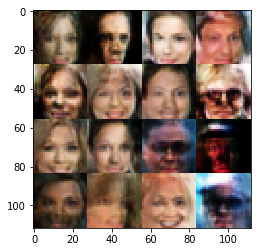

Timestamp 20170805-03-21-22.895 -  Epoch 1/1 -  Step 14010 -  D Loss: 0.7281 - G Loss: 1.3900
Timestamp 20170805-03-21-30.264 -  Epoch 1/1 -  Step 14020 -  D Loss: 0.8188 - G Loss: 1.3300
Timestamp 20170805-03-21-37.569 -  Epoch 1/1 -  Step 14030 -  D Loss: 0.7355 - G Loss: 1.4537
Timestamp 20170805-03-21-44.903 -  Epoch 1/1 -  Step 14040 -  D Loss: 0.6577 - G Loss: 1.3309
Timestamp 20170805-03-21-52.227 -  Epoch 1/1 -  Step 14050 -  D Loss: 1.0493 - G Loss: 0.8786
Timestamp 20170805-03-21-59.541 -  Epoch 1/1 -  Step 14060 -  D Loss: 0.7228 - G Loss: 1.1531
Timestamp 20170805-03-22-06.919 -  Epoch 1/1 -  Step 14070 -  D Loss: 0.7645 - G Loss: 1.2610
Timestamp 20170805-03-22-14.478 -  Epoch 1/1 -  Step 14080 -  D Loss: 1.0142 - G Loss: 1.6374
Timestamp 20170805-03-22-21.943 -  Epoch 1/1 -  Step 14090 -  D Loss: 0.8262 - G Loss: 1.6957
Timestamp 20170805-03-22-29.362 -  Epoch 1/1 -  Step 14100 -  D Loss: 0.8486 - G Loss: 0.8937


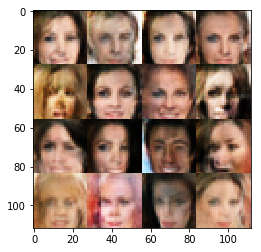

Timestamp 20170805-03-22-37.402 -  Epoch 1/1 -  Step 14110 -  D Loss: 0.8469 - G Loss: 1.4448
Timestamp 20170805-03-22-44.700 -  Epoch 1/1 -  Step 14120 -  D Loss: 1.2351 - G Loss: 1.0587
Timestamp 20170805-03-22-52.047 -  Epoch 1/1 -  Step 14130 -  D Loss: 0.6645 - G Loss: 1.6344
Timestamp 20170805-03-22-59.341 -  Epoch 1/1 -  Step 14140 -  D Loss: 0.8150 - G Loss: 1.7300
Timestamp 20170805-03-23-06.652 -  Epoch 1/1 -  Step 14150 -  D Loss: 1.0506 - G Loss: 1.3565
Timestamp 20170805-03-23-14.047 -  Epoch 1/1 -  Step 14160 -  D Loss: 0.9966 - G Loss: 1.4126
Timestamp 20170805-03-23-21.473 -  Epoch 1/1 -  Step 14170 -  D Loss: 0.8606 - G Loss: 2.0703
Timestamp 20170805-03-23-28.877 -  Epoch 1/1 -  Step 14180 -  D Loss: 0.8763 - G Loss: 2.1447
Timestamp 20170805-03-23-36.258 -  Epoch 1/1 -  Step 14190 -  D Loss: 0.5180 - G Loss: 1.3943
Timestamp 20170805-03-23-43.631 -  Epoch 1/1 -  Step 14200 -  D Loss: 0.8920 - G Loss: 1.6403


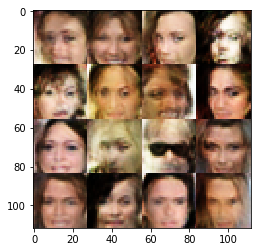

Timestamp 20170805-03-23-51.791 -  Epoch 1/1 -  Step 14210 -  D Loss: 0.9828 - G Loss: 0.9161
Timestamp 20170805-03-23-59.123 -  Epoch 1/1 -  Step 14220 -  D Loss: 0.8460 - G Loss: 1.0933
Timestamp 20170805-03-24-06.449 -  Epoch 1/1 -  Step 14230 -  D Loss: 1.0760 - G Loss: 1.2118
Timestamp 20170805-03-24-13.840 -  Epoch 1/1 -  Step 14240 -  D Loss: 1.0711 - G Loss: 0.7146
Timestamp 20170805-03-24-21.433 -  Epoch 1/1 -  Step 14250 -  D Loss: 0.8424 - G Loss: 1.5899
Timestamp 20170805-03-24-28.882 -  Epoch 1/1 -  Step 14260 -  D Loss: 1.4255 - G Loss: 0.8675
Timestamp 20170805-03-24-36.327 -  Epoch 1/1 -  Step 14270 -  D Loss: 1.0922 - G Loss: 1.4144
Timestamp 20170805-03-24-43.691 -  Epoch 1/1 -  Step 14280 -  D Loss: 1.0729 - G Loss: 1.9220
Timestamp 20170805-03-24-51.190 -  Epoch 1/1 -  Step 14290 -  D Loss: 0.9165 - G Loss: 1.9756
Timestamp 20170805-03-24-58.682 -  Epoch 1/1 -  Step 14300 -  D Loss: 0.7649 - G Loss: 1.7565


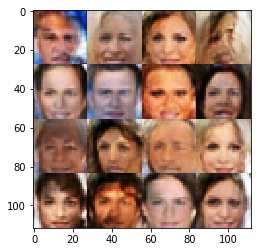

Timestamp 20170805-03-25-07.007 -  Epoch 1/1 -  Step 14310 -  D Loss: 1.4243 - G Loss: 0.4298
Timestamp 20170805-03-25-14.527 -  Epoch 1/1 -  Step 14320 -  D Loss: 1.0805 - G Loss: 1.3698
Timestamp 20170805-03-25-22.022 -  Epoch 1/1 -  Step 14330 -  D Loss: 1.0674 - G Loss: 1.3054
Timestamp 20170805-03-25-29.422 -  Epoch 1/1 -  Step 14340 -  D Loss: 1.0042 - G Loss: 1.7594
Timestamp 20170805-03-25-36.775 -  Epoch 1/1 -  Step 14350 -  D Loss: 1.1303 - G Loss: 1.6095
Timestamp 20170805-03-25-44.182 -  Epoch 1/1 -  Step 14360 -  D Loss: 0.7044 - G Loss: 1.6370
Timestamp 20170805-03-25-51.561 -  Epoch 1/1 -  Step 14370 -  D Loss: 0.9694 - G Loss: 0.9718
Timestamp 20170805-03-25-58.939 -  Epoch 1/1 -  Step 14380 -  D Loss: 1.0758 - G Loss: 1.3611
Timestamp 20170805-03-26-06.245 -  Epoch 1/1 -  Step 14390 -  D Loss: 0.9836 - G Loss: 2.1964
Timestamp 20170805-03-26-13.651 -  Epoch 1/1 -  Step 14400 -  D Loss: 0.8229 - G Loss: 1.4631


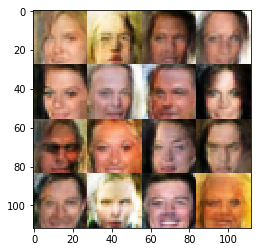

Timestamp 20170805-03-26-21.622 -  Epoch 1/1 -  Step 14410 -  D Loss: 0.8008 - G Loss: 1.3748
Timestamp 20170805-03-26-28.988 -  Epoch 1/1 -  Step 14420 -  D Loss: 1.1005 - G Loss: 1.2705
Timestamp 20170805-03-26-36.453 -  Epoch 1/1 -  Step 14430 -  D Loss: 1.1040 - G Loss: 1.7841
Timestamp 20170805-03-26-43.843 -  Epoch 1/1 -  Step 14440 -  D Loss: 0.8235 - G Loss: 1.5553
Timestamp 20170805-03-26-51.328 -  Epoch 1/1 -  Step 14450 -  D Loss: 0.8830 - G Loss: 1.1393
Timestamp 20170805-03-26-59.020 -  Epoch 1/1 -  Step 14460 -  D Loss: 0.9811 - G Loss: 1.0422
Timestamp 20170805-03-27-06.523 -  Epoch 1/1 -  Step 14470 -  D Loss: 1.1175 - G Loss: 0.5892
Timestamp 20170805-03-27-14.103 -  Epoch 1/1 -  Step 14480 -  D Loss: 1.2738 - G Loss: 0.9543
Timestamp 20170805-03-27-21.721 -  Epoch 1/1 -  Step 14490 -  D Loss: 0.7576 - G Loss: 1.8040
Timestamp 20170805-03-27-29.141 -  Epoch 1/1 -  Step 14500 -  D Loss: 0.5860 - G Loss: 2.6426


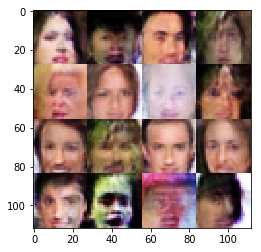

Timestamp 20170805-03-27-37.285 -  Epoch 1/1 -  Step 14510 -  D Loss: 1.0092 - G Loss: 1.4535
Timestamp 20170805-03-27-44.687 -  Epoch 1/1 -  Step 14520 -  D Loss: 0.8295 - G Loss: 1.8837
Timestamp 20170805-03-27-52.010 -  Epoch 1/1 -  Step 14530 -  D Loss: 1.2511 - G Loss: 1.8519
Timestamp 20170805-03-27-59.346 -  Epoch 1/1 -  Step 14540 -  D Loss: 1.0050 - G Loss: 1.3754
Timestamp 20170805-03-28-06.722 -  Epoch 1/1 -  Step 14550 -  D Loss: 0.9868 - G Loss: 0.8536
Timestamp 20170805-03-28-14.206 -  Epoch 1/1 -  Step 14560 -  D Loss: 0.9102 - G Loss: 1.5428
Timestamp 20170805-03-28-21.634 -  Epoch 1/1 -  Step 14570 -  D Loss: 0.7546 - G Loss: 0.8096
Timestamp 20170805-03-28-29.134 -  Epoch 1/1 -  Step 14580 -  D Loss: 0.9449 - G Loss: 1.3573
Timestamp 20170805-03-28-36.628 -  Epoch 1/1 -  Step 14590 -  D Loss: 0.8329 - G Loss: 1.4317
Timestamp 20170805-03-28-44.021 -  Epoch 1/1 -  Step 14600 -  D Loss: 0.9411 - G Loss: 1.0960


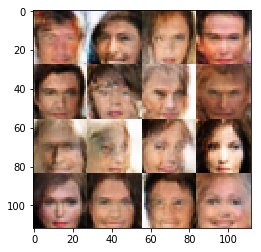

Timestamp 20170805-03-28-52.000 -  Epoch 1/1 -  Step 14610 -  D Loss: 1.0829 - G Loss: 1.0759
Timestamp 20170805-03-28-59.436 -  Epoch 1/1 -  Step 14620 -  D Loss: 1.0268 - G Loss: 1.6092
Timestamp 20170805-03-29-06.903 -  Epoch 1/1 -  Step 14630 -  D Loss: 0.8576 - G Loss: 1.4480
Timestamp 20170805-03-29-14.445 -  Epoch 1/1 -  Step 14640 -  D Loss: 0.6708 - G Loss: 1.2803
Timestamp 20170805-03-29-21.926 -  Epoch 1/1 -  Step 14650 -  D Loss: 1.2522 - G Loss: 1.7282
Timestamp 20170805-03-29-29.340 -  Epoch 1/1 -  Step 14660 -  D Loss: 1.3130 - G Loss: 0.8443
Timestamp 20170805-03-29-36.646 -  Epoch 1/1 -  Step 14670 -  D Loss: 0.8062 - G Loss: 1.0826
Timestamp 20170805-03-29-44.040 -  Epoch 1/1 -  Step 14680 -  D Loss: 1.1224 - G Loss: 0.9062
Timestamp 20170805-03-29-51.350 -  Epoch 1/1 -  Step 14690 -  D Loss: 0.8901 - G Loss: 0.7750
Timestamp 20170805-03-29-58.825 -  Epoch 1/1 -  Step 14700 -  D Loss: 0.9132 - G Loss: 1.4305


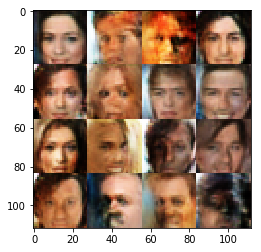

Timestamp 20170805-03-30-06.896 -  Epoch 1/1 -  Step 14710 -  D Loss: 0.9273 - G Loss: 1.7802
Timestamp 20170805-03-30-14.230 -  Epoch 1/1 -  Step 14720 -  D Loss: 0.7830 - G Loss: 2.0971
Timestamp 20170805-03-30-21.542 -  Epoch 1/1 -  Step 14730 -  D Loss: 1.3255 - G Loss: 1.3074
Timestamp 20170805-03-30-28.856 -  Epoch 1/1 -  Step 14740 -  D Loss: 1.0448 - G Loss: 0.9797
Timestamp 20170805-03-30-36.155 -  Epoch 1/1 -  Step 14750 -  D Loss: 0.9272 - G Loss: 0.9180
Timestamp 20170805-03-30-43.443 -  Epoch 1/1 -  Step 14760 -  D Loss: 1.1595 - G Loss: 0.9098
Timestamp 20170805-03-30-50.810 -  Epoch 1/1 -  Step 14770 -  D Loss: 1.4060 - G Loss: 0.9286
Timestamp 20170805-03-30-58.272 -  Epoch 1/1 -  Step 14780 -  D Loss: 1.6721 - G Loss: 1.1637
Timestamp 20170805-03-31-05.732 -  Epoch 1/1 -  Step 14790 -  D Loss: 0.8954 - G Loss: 2.0540
Timestamp 20170805-03-31-13.225 -  Epoch 1/1 -  Step 14800 -  D Loss: 0.8857 - G Loss: 1.7580


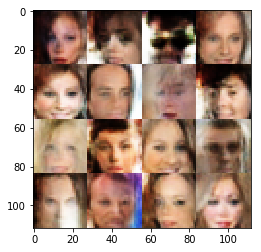

Timestamp 20170805-03-31-21.321 -  Epoch 1/1 -  Step 14810 -  D Loss: 1.1403 - G Loss: 1.2563
Timestamp 20170805-03-31-28.619 -  Epoch 1/1 -  Step 14820 -  D Loss: 0.7016 - G Loss: 1.6208
Timestamp 20170805-03-31-35.926 -  Epoch 1/1 -  Step 14830 -  D Loss: 1.1839 - G Loss: 1.4428
Timestamp 20170805-03-31-43.243 -  Epoch 1/1 -  Step 14840 -  D Loss: 1.1045 - G Loss: 1.4203
Timestamp 20170805-03-31-50.648 -  Epoch 1/1 -  Step 14850 -  D Loss: 1.0208 - G Loss: 1.4056
Timestamp 20170805-03-31-57.958 -  Epoch 1/1 -  Step 14860 -  D Loss: 1.1427 - G Loss: 1.7689
Timestamp 20170805-03-32-05.284 -  Epoch 1/1 -  Step 14870 -  D Loss: 1.0757 - G Loss: 1.2061
Timestamp 20170805-03-32-12.595 -  Epoch 1/1 -  Step 14880 -  D Loss: 1.1401 - G Loss: 1.0114
Timestamp 20170805-03-32-20.170 -  Epoch 1/1 -  Step 14890 -  D Loss: 0.8760 - G Loss: 1.9470
Timestamp 20170805-03-32-27.659 -  Epoch 1/1 -  Step 14900 -  D Loss: 0.9882 - G Loss: 1.4143


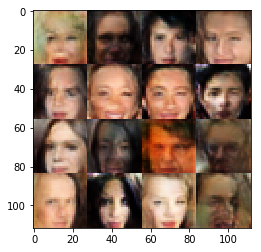

Timestamp 20170805-03-32-35.802 -  Epoch 1/1 -  Step 14910 -  D Loss: 1.2407 - G Loss: 0.3799
Timestamp 20170805-03-32-43.189 -  Epoch 1/1 -  Step 14920 -  D Loss: 1.1563 - G Loss: 0.6708
Timestamp 20170805-03-32-50.604 -  Epoch 1/1 -  Step 14930 -  D Loss: 1.0664 - G Loss: 1.9008
Timestamp 20170805-03-32-58.030 -  Epoch 1/1 -  Step 14940 -  D Loss: 0.6914 - G Loss: 1.7446
Timestamp 20170805-03-33-05.579 -  Epoch 1/1 -  Step 14950 -  D Loss: 1.3077 - G Loss: 1.4388
Timestamp 20170805-03-33-13.323 -  Epoch 1/1 -  Step 14960 -  D Loss: 1.0964 - G Loss: 1.0046
Timestamp 20170805-03-33-20.813 -  Epoch 1/1 -  Step 14970 -  D Loss: 1.1497 - G Loss: 1.0272
Timestamp 20170805-03-33-28.211 -  Epoch 1/1 -  Step 14980 -  D Loss: 0.6223 - G Loss: 1.0499
Timestamp 20170805-03-33-35.522 -  Epoch 1/1 -  Step 14990 -  D Loss: 0.8521 - G Loss: 1.5733
Timestamp 20170805-03-33-42.860 -  Epoch 1/1 -  Step 15000 -  D Loss: 1.0059 - G Loss: 2.5453


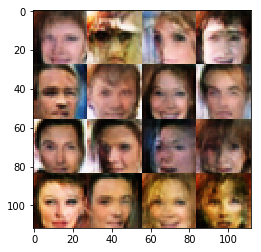

Timestamp 20170805-03-33-50.863 -  Epoch 1/1 -  Step 15010 -  D Loss: 0.5630 - G Loss: 1.6157
Timestamp 20170805-03-33-58.257 -  Epoch 1/1 -  Step 15020 -  D Loss: 1.3447 - G Loss: 1.3666
Timestamp 20170805-03-34-05.595 -  Epoch 1/1 -  Step 15030 -  D Loss: 0.7469 - G Loss: 2.1263
Timestamp 20170805-03-34-13.037 -  Epoch 1/1 -  Step 15040 -  D Loss: 1.2611 - G Loss: 0.7853
Timestamp 20170805-03-34-20.549 -  Epoch 1/1 -  Step 15050 -  D Loss: 0.8235 - G Loss: 0.8698
Timestamp 20170805-03-34-27.985 -  Epoch 1/1 -  Step 15060 -  D Loss: 0.8446 - G Loss: 1.6071
Timestamp 20170805-03-34-35.331 -  Epoch 1/1 -  Step 15070 -  D Loss: 1.0246 - G Loss: 1.1243
Timestamp 20170805-03-34-42.770 -  Epoch 1/1 -  Step 15080 -  D Loss: 0.8324 - G Loss: 1.2004
Timestamp 20170805-03-34-50.286 -  Epoch 1/1 -  Step 15090 -  D Loss: 1.1484 - G Loss: 1.1813
Timestamp 20170805-03-34-57.700 -  Epoch 1/1 -  Step 15100 -  D Loss: 0.9331 - G Loss: 1.1243


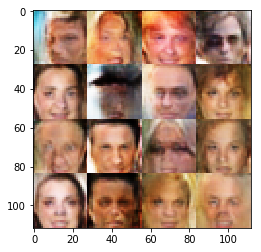

Timestamp 20170805-03-35-05.906 -  Epoch 1/1 -  Step 15110 -  D Loss: 0.8077 - G Loss: 1.0146
Timestamp 20170805-03-35-13.461 -  Epoch 1/1 -  Step 15120 -  D Loss: 1.0093 - G Loss: 1.7083
Timestamp 20170805-03-35-20.936 -  Epoch 1/1 -  Step 15130 -  D Loss: 0.8578 - G Loss: 2.4672
Timestamp 20170805-03-35-28.285 -  Epoch 1/1 -  Step 15140 -  D Loss: 0.9123 - G Loss: 2.1510
Timestamp 20170805-03-35-35.619 -  Epoch 1/1 -  Step 15150 -  D Loss: 0.7810 - G Loss: 1.8068
Timestamp 20170805-03-35-42.944 -  Epoch 1/1 -  Step 15160 -  D Loss: 0.8932 - G Loss: 1.0188
Timestamp 20170805-03-35-50.275 -  Epoch 1/1 -  Step 15170 -  D Loss: 1.2913 - G Loss: 0.9176
Timestamp 20170805-03-35-57.593 -  Epoch 1/1 -  Step 15180 -  D Loss: 1.0633 - G Loss: 2.1280
Timestamp 20170805-03-36-04.898 -  Epoch 1/1 -  Step 15190 -  D Loss: 0.8842 - G Loss: 2.1675
Timestamp 20170805-03-36-12.205 -  Epoch 1/1 -  Step 15200 -  D Loss: 0.6628 - G Loss: 1.8855


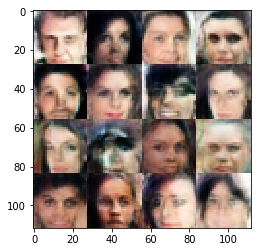

Timestamp 20170805-03-36-20.202 -  Epoch 1/1 -  Step 15210 -  D Loss: 1.1927 - G Loss: 0.7006
Timestamp 20170805-03-36-27.654 -  Epoch 1/1 -  Step 15220 -  D Loss: 0.9407 - G Loss: 0.6327
Timestamp 20170805-03-36-35.043 -  Epoch 1/1 -  Step 15230 -  D Loss: 1.0541 - G Loss: 1.7500
Timestamp 20170805-03-36-42.552 -  Epoch 1/1 -  Step 15240 -  D Loss: 0.5611 - G Loss: 1.5567
Timestamp 20170805-03-36-49.988 -  Epoch 1/1 -  Step 15250 -  D Loss: 0.7690 - G Loss: 2.0326
Timestamp 20170805-03-36-57.577 -  Epoch 1/1 -  Step 15260 -  D Loss: 0.9860 - G Loss: 1.3537
Timestamp 20170805-03-37-05.277 -  Epoch 1/1 -  Step 15270 -  D Loss: 0.9507 - G Loss: 1.3675
Timestamp 20170805-03-37-12.725 -  Epoch 1/1 -  Step 15280 -  D Loss: 1.1047 - G Loss: 1.3050
Timestamp 20170805-03-37-20.144 -  Epoch 1/1 -  Step 15290 -  D Loss: 1.0858 - G Loss: 1.3932
Timestamp 20170805-03-37-27.628 -  Epoch 1/1 -  Step 15300 -  D Loss: 1.2949 - G Loss: 0.9818


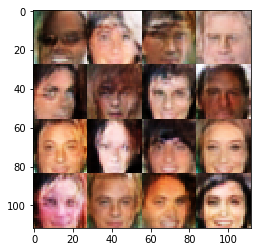

Timestamp 20170805-03-37-35.936 -  Epoch 1/1 -  Step 15310 -  D Loss: 0.9298 - G Loss: 1.0527
Timestamp 20170805-03-37-43.383 -  Epoch 1/1 -  Step 15320 -  D Loss: 0.6108 - G Loss: 1.9801
Timestamp 20170805-03-37-50.803 -  Epoch 1/1 -  Step 15330 -  D Loss: 1.0231 - G Loss: 1.1806
Timestamp 20170805-03-37-58.179 -  Epoch 1/1 -  Step 15340 -  D Loss: 1.0025 - G Loss: 1.1360
Timestamp 20170805-03-38-05.531 -  Epoch 1/1 -  Step 15350 -  D Loss: 0.8286 - G Loss: 1.1949
Timestamp 20170805-03-38-12.882 -  Epoch 1/1 -  Step 15360 -  D Loss: 0.7860 - G Loss: 1.4600
Timestamp 20170805-03-38-20.212 -  Epoch 1/1 -  Step 15370 -  D Loss: 0.8317 - G Loss: 0.7438
Timestamp 20170805-03-38-27.527 -  Epoch 1/1 -  Step 15380 -  D Loss: 1.0848 - G Loss: 1.2309
Timestamp 20170805-03-38-34.913 -  Epoch 1/1 -  Step 15390 -  D Loss: 0.8893 - G Loss: 1.3326
Timestamp 20170805-03-38-42.302 -  Epoch 1/1 -  Step 15400 -  D Loss: 0.8946 - G Loss: 0.7880


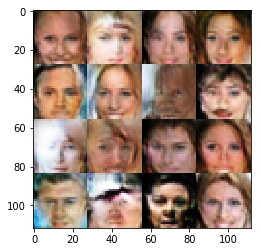

Timestamp 20170805-03-38-50.268 -  Epoch 1/1 -  Step 15410 -  D Loss: 0.7883 - G Loss: 0.7799
Timestamp 20170805-03-38-57.631 -  Epoch 1/1 -  Step 15420 -  D Loss: 1.0675 - G Loss: 1.2754
Timestamp 20170805-03-39-04.964 -  Epoch 1/1 -  Step 15430 -  D Loss: 1.1153 - G Loss: 1.9441
Timestamp 20170805-03-39-12.275 -  Epoch 1/1 -  Step 15440 -  D Loss: 0.8283 - G Loss: 1.2232
Timestamp 20170805-03-39-19.593 -  Epoch 1/1 -  Step 15450 -  D Loss: 1.1093 - G Loss: 0.9310
Timestamp 20170805-03-39-26.922 -  Epoch 1/1 -  Step 15460 -  D Loss: 0.9957 - G Loss: 1.8429
Timestamp 20170805-03-39-34.343 -  Epoch 1/1 -  Step 15470 -  D Loss: 1.1290 - G Loss: 0.6368
Timestamp 20170805-03-39-41.756 -  Epoch 1/1 -  Step 15480 -  D Loss: 0.8989 - G Loss: 1.3810
Timestamp 20170805-03-39-49.144 -  Epoch 1/1 -  Step 15490 -  D Loss: 1.1705 - G Loss: 0.7787
Timestamp 20170805-03-39-56.539 -  Epoch 1/1 -  Step 15500 -  D Loss: 0.9309 - G Loss: 1.1855


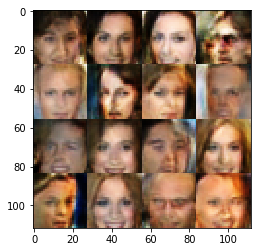

Timestamp 20170805-03-40-04.692 -  Epoch 1/1 -  Step 15510 -  D Loss: 1.2220 - G Loss: 1.2097
Timestamp 20170805-03-40-12.123 -  Epoch 1/1 -  Step 15520 -  D Loss: 1.2296 - G Loss: 0.6659
Timestamp 20170805-03-40-19.579 -  Epoch 1/1 -  Step 15530 -  D Loss: 1.0178 - G Loss: 1.4207
Timestamp 20170805-03-40-27.027 -  Epoch 1/1 -  Step 15540 -  D Loss: 1.0130 - G Loss: 1.7890
Timestamp 20170805-03-40-34.631 -  Epoch 1/1 -  Step 15550 -  D Loss: 1.0926 - G Loss: 1.1493
Timestamp 20170805-03-40-42.267 -  Epoch 1/1 -  Step 15560 -  D Loss: 0.7988 - G Loss: 1.5088
Timestamp 20170805-03-40-49.863 -  Epoch 1/1 -  Step 15570 -  D Loss: 1.1748 - G Loss: 1.4282
Timestamp 20170805-03-40-57.490 -  Epoch 1/1 -  Step 15580 -  D Loss: 0.8787 - G Loss: 0.7990
Timestamp 20170805-03-41-05.114 -  Epoch 1/1 -  Step 15590 -  D Loss: 0.9213 - G Loss: 1.7405
Timestamp 20170805-03-41-12.621 -  Epoch 1/1 -  Step 15600 -  D Loss: 1.4098 - G Loss: 1.1596


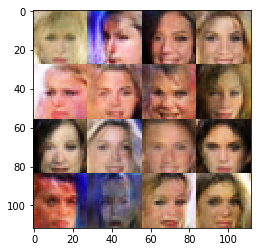

Timestamp 20170805-03-41-20.678 -  Epoch 1/1 -  Step 15610 -  D Loss: 1.2176 - G Loss: 0.6788
Timestamp 20170805-03-41-28.029 -  Epoch 1/1 -  Step 15620 -  D Loss: 0.7720 - G Loss: 1.4540
Timestamp 20170805-03-41-35.402 -  Epoch 1/1 -  Step 15630 -  D Loss: 1.0450 - G Loss: 0.7491
Timestamp 20170805-03-41-42.725 -  Epoch 1/1 -  Step 15640 -  D Loss: 1.1914 - G Loss: 1.2554
Timestamp 20170805-03-41-50.161 -  Epoch 1/1 -  Step 15650 -  D Loss: 0.8786 - G Loss: 2.0235
Timestamp 20170805-03-41-57.667 -  Epoch 1/1 -  Step 15660 -  D Loss: 1.1063 - G Loss: 1.9595
Timestamp 20170805-03-42-05.055 -  Epoch 1/1 -  Step 15670 -  D Loss: 0.9012 - G Loss: 1.1130
Timestamp 20170805-03-42-12.503 -  Epoch 1/1 -  Step 15680 -  D Loss: 0.9662 - G Loss: 1.6405
Timestamp 20170805-03-42-19.852 -  Epoch 1/1 -  Step 15690 -  D Loss: 0.8547 - G Loss: 1.5070
Timestamp 20170805-03-42-27.173 -  Epoch 1/1 -  Step 15700 -  D Loss: 0.7685 - G Loss: 1.4351


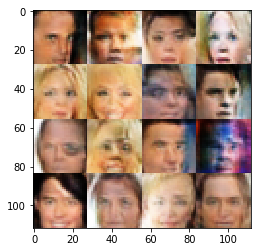

Timestamp 20170805-03-42-35.152 -  Epoch 1/1 -  Step 15710 -  D Loss: 1.0167 - G Loss: 1.1305
Timestamp 20170805-03-42-42.490 -  Epoch 1/1 -  Step 15720 -  D Loss: 1.0018 - G Loss: 1.0287
Timestamp 20170805-03-42-50.277 -  Epoch 1/1 -  Step 15730 -  D Loss: 1.3289 - G Loss: 0.9781
Timestamp 20170805-03-42-57.657 -  Epoch 1/1 -  Step 15740 -  D Loss: 0.8150 - G Loss: 1.4155
Timestamp 20170805-03-43-05.086 -  Epoch 1/1 -  Step 15750 -  D Loss: 0.8588 - G Loss: 1.2435
Timestamp 20170805-03-43-12.728 -  Epoch 1/1 -  Step 15760 -  D Loss: 1.2160 - G Loss: 1.4059
Timestamp 20170805-03-43-20.184 -  Epoch 1/1 -  Step 15770 -  D Loss: 1.2022 - G Loss: 0.8191
Timestamp 20170805-03-43-27.515 -  Epoch 1/1 -  Step 15780 -  D Loss: 0.7679 - G Loss: 2.1109
Timestamp 20170805-03-43-34.847 -  Epoch 1/1 -  Step 15790 -  D Loss: 0.9266 - G Loss: 0.8194
Timestamp 20170805-03-43-42.171 -  Epoch 1/1 -  Step 15800 -  D Loss: 0.9723 - G Loss: 1.4130


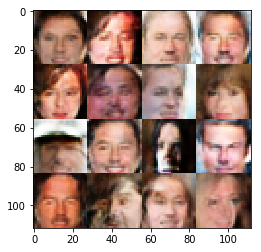

Timestamp 20170805-03-43-50.355 -  Epoch 1/1 -  Step 15810 -  D Loss: 0.7321 - G Loss: 1.6286
Timestamp 20170805-03-43-58.001 -  Epoch 1/1 -  Step 15820 -  D Loss: 1.2144 - G Loss: 1.1061
Timestamp 20170805-03-44-05.425 -  Epoch 1/1 -  Step 15830 -  D Loss: 1.3938 - G Loss: 1.1058
Timestamp 20170805-03-44-13.057 -  Epoch 1/1 -  Step 15840 -  D Loss: 1.3545 - G Loss: 1.3760
Timestamp 20170805-03-44-20.693 -  Epoch 1/1 -  Step 15850 -  D Loss: 0.5898 - G Loss: 1.9623
Timestamp 20170805-03-44-28.138 -  Epoch 1/1 -  Step 15860 -  D Loss: 1.2319 - G Loss: 1.0742
Timestamp 20170805-03-44-35.883 -  Epoch 1/1 -  Step 15870 -  D Loss: 1.2970 - G Loss: 1.0411
Timestamp 20170805-03-44-43.375 -  Epoch 1/1 -  Step 15880 -  D Loss: 1.1316 - G Loss: 1.1909
Timestamp 20170805-03-44-50.848 -  Epoch 1/1 -  Step 15890 -  D Loss: 0.8684 - G Loss: 0.8379
Timestamp 20170805-03-44-58.327 -  Epoch 1/1 -  Step 15900 -  D Loss: 0.9600 - G Loss: 2.0380


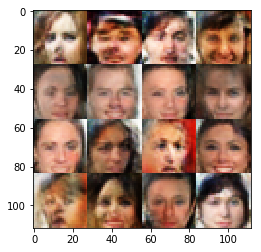

Timestamp 20170805-03-45-06.811 -  Epoch 1/1 -  Step 15910 -  D Loss: 1.2244 - G Loss: 0.7345
Timestamp 20170805-03-45-14.465 -  Epoch 1/1 -  Step 15920 -  D Loss: 1.2684 - G Loss: 1.1284
Timestamp 20170805-03-45-21.989 -  Epoch 1/1 -  Step 15930 -  D Loss: 1.0911 - G Loss: 1.3766
Timestamp 20170805-03-45-29.650 -  Epoch 1/1 -  Step 15940 -  D Loss: 1.2924 - G Loss: 1.0743
Timestamp 20170805-03-45-37.413 -  Epoch 1/1 -  Step 15950 -  D Loss: 0.9051 - G Loss: 1.6395
Timestamp 20170805-03-45-44.972 -  Epoch 1/1 -  Step 15960 -  D Loss: 0.9730 - G Loss: 0.8544
Timestamp 20170805-03-45-52.558 -  Epoch 1/1 -  Step 15970 -  D Loss: 1.0473 - G Loss: 1.5666
Timestamp 20170805-03-45-59.961 -  Epoch 1/1 -  Step 15980 -  D Loss: 1.0746 - G Loss: 0.9134
Timestamp 20170805-03-46-07.256 -  Epoch 1/1 -  Step 15990 -  D Loss: 0.7732 - G Loss: 1.7504
Timestamp 20170805-03-46-14.565 -  Epoch 1/1 -  Step 16000 -  D Loss: 1.3593 - G Loss: 1.1451


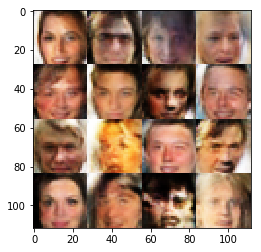

Timestamp 20170805-03-46-22.557 -  Epoch 1/1 -  Step 16010 -  D Loss: 0.7534 - G Loss: 1.9915
Timestamp 20170805-03-46-29.870 -  Epoch 1/1 -  Step 16020 -  D Loss: 0.9181 - G Loss: 2.0257
Timestamp 20170805-03-46-37.177 -  Epoch 1/1 -  Step 16030 -  D Loss: 0.7687 - G Loss: 1.8167
Timestamp 20170805-03-46-44.483 -  Epoch 1/1 -  Step 16040 -  D Loss: 0.8080 - G Loss: 1.4642
Timestamp 20170805-03-46-51.781 -  Epoch 1/1 -  Step 16050 -  D Loss: 1.0735 - G Loss: 1.5638
Timestamp 20170805-03-46-59.121 -  Epoch 1/1 -  Step 16060 -  D Loss: 0.8227 - G Loss: 1.9256
Timestamp 20170805-03-47-06.444 -  Epoch 1/1 -  Step 16070 -  D Loss: 1.0644 - G Loss: 1.7052
Timestamp 20170805-03-47-13.754 -  Epoch 1/1 -  Step 16080 -  D Loss: 1.3596 - G Loss: 0.8915
Timestamp 20170805-03-47-21.058 -  Epoch 1/1 -  Step 16090 -  D Loss: 0.8072 - G Loss: 1.1809
Timestamp 20170805-03-47-28.358 -  Epoch 1/1 -  Step 16100 -  D Loss: 0.8462 - G Loss: 1.3013


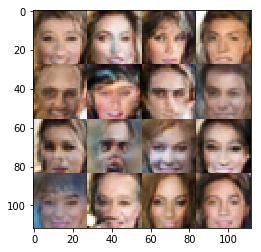

Timestamp 20170805-03-47-36.422 -  Epoch 1/1 -  Step 16110 -  D Loss: 1.0792 - G Loss: 0.6380
Timestamp 20170805-03-47-43.863 -  Epoch 1/1 -  Step 16120 -  D Loss: 1.0043 - G Loss: 1.5993
Timestamp 20170805-03-47-51.360 -  Epoch 1/1 -  Step 16130 -  D Loss: 0.6499 - G Loss: 1.7415
Timestamp 20170805-03-47-58.794 -  Epoch 1/1 -  Step 16140 -  D Loss: 0.7479 - G Loss: 1.5483
Timestamp 20170805-03-48-06.186 -  Epoch 1/1 -  Step 16150 -  D Loss: 0.6609 - G Loss: 2.1487
Timestamp 20170805-03-48-13.656 -  Epoch 1/1 -  Step 16160 -  D Loss: 0.7765 - G Loss: 2.1111
Timestamp 20170805-03-48-21.192 -  Epoch 1/1 -  Step 16170 -  D Loss: 1.0714 - G Loss: 1.6144
Timestamp 20170805-03-48-28.577 -  Epoch 1/1 -  Step 16180 -  D Loss: 0.7761 - G Loss: 0.8945
Timestamp 20170805-03-48-35.967 -  Epoch 1/1 -  Step 16190 -  D Loss: 1.1534 - G Loss: 1.2063
Timestamp 20170805-03-48-43.551 -  Epoch 1/1 -  Step 16200 -  D Loss: 0.8756 - G Loss: 1.2871


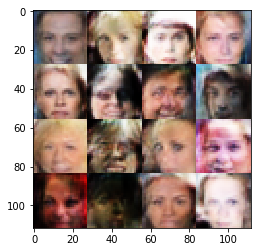

Timestamp 20170805-03-48-51.677 -  Epoch 1/1 -  Step 16210 -  D Loss: 0.9006 - G Loss: 1.1133
Timestamp 20170805-03-48-59.000 -  Epoch 1/1 -  Step 16220 -  D Loss: 1.0163 - G Loss: 1.0014
Timestamp 20170805-03-49-06.307 -  Epoch 1/1 -  Step 16230 -  D Loss: 0.8403 - G Loss: 1.5155
Timestamp 20170805-03-49-13.649 -  Epoch 1/1 -  Step 16240 -  D Loss: 0.8811 - G Loss: 1.0911
Timestamp 20170805-03-49-20.970 -  Epoch 1/1 -  Step 16250 -  D Loss: 1.0710 - G Loss: 0.9284
Timestamp 20170805-03-49-28.265 -  Epoch 1/1 -  Step 16260 -  D Loss: 0.8796 - G Loss: 1.2882
Timestamp 20170805-03-49-35.618 -  Epoch 1/1 -  Step 16270 -  D Loss: 1.1065 - G Loss: 1.0595
Timestamp 20170805-03-49-43.308 -  Epoch 1/1 -  Step 16280 -  D Loss: 1.1744 - G Loss: 1.2762
Timestamp 20170805-03-49-50.830 -  Epoch 1/1 -  Step 16290 -  D Loss: 0.8336 - G Loss: 1.3911
Timestamp 20170805-03-49-58.538 -  Epoch 1/1 -  Step 16300 -  D Loss: 0.9235 - G Loss: 1.2855


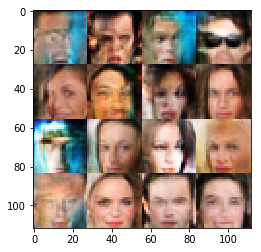

Timestamp 20170805-03-50-06.994 -  Epoch 1/1 -  Step 16310 -  D Loss: 1.4106 - G Loss: 0.8031
Timestamp 20170805-03-50-14.688 -  Epoch 1/1 -  Step 16320 -  D Loss: 1.3285 - G Loss: 0.6439
Timestamp 20170805-03-50-22.527 -  Epoch 1/1 -  Step 16330 -  D Loss: 0.9872 - G Loss: 0.6579
Timestamp 20170805-03-50-30.237 -  Epoch 1/1 -  Step 16340 -  D Loss: 1.0902 - G Loss: 1.0971
Timestamp 20170805-03-50-37.626 -  Epoch 1/1 -  Step 16350 -  D Loss: 0.7755 - G Loss: 0.7610
Timestamp 20170805-03-50-45.061 -  Epoch 1/1 -  Step 16360 -  D Loss: 1.1237 - G Loss: 0.8508
Timestamp 20170805-03-50-52.464 -  Epoch 1/1 -  Step 16370 -  D Loss: 1.2690 - G Loss: 0.6603
Timestamp 20170805-03-50-59.942 -  Epoch 1/1 -  Step 16380 -  D Loss: 0.5706 - G Loss: 1.9854
Timestamp 20170805-03-51-07.380 -  Epoch 1/1 -  Step 16390 -  D Loss: 1.2579 - G Loss: 1.4276
Timestamp 20170805-03-51-14.940 -  Epoch 1/1 -  Step 16400 -  D Loss: 1.4976 - G Loss: 1.8768


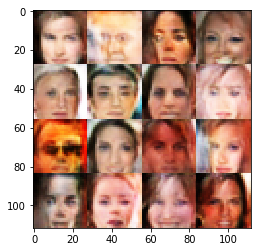

Timestamp 20170805-03-51-23.118 -  Epoch 1/1 -  Step 16410 -  D Loss: 0.9205 - G Loss: 1.1761
Timestamp 20170805-03-51-30.542 -  Epoch 1/1 -  Step 16420 -  D Loss: 1.0310 - G Loss: 1.3172
Timestamp 20170805-03-51-38.167 -  Epoch 1/1 -  Step 16430 -  D Loss: 1.0723 - G Loss: 1.1708
Timestamp 20170805-03-51-45.532 -  Epoch 1/1 -  Step 16440 -  D Loss: 0.7141 - G Loss: 1.9329
Timestamp 20170805-03-51-52.934 -  Epoch 1/1 -  Step 16450 -  D Loss: 0.9807 - G Loss: 1.6847
Timestamp 20170805-03-52-00.485 -  Epoch 1/1 -  Step 16460 -  D Loss: 0.8223 - G Loss: 1.5057
Timestamp 20170805-03-52-07.933 -  Epoch 1/1 -  Step 16470 -  D Loss: 1.1879 - G Loss: 1.2516
Timestamp 20170805-03-52-15.387 -  Epoch 1/1 -  Step 16480 -  D Loss: 1.1967 - G Loss: 1.1656
Timestamp 20170805-03-52-22.886 -  Epoch 1/1 -  Step 16490 -  D Loss: 0.8301 - G Loss: 2.3658
Timestamp 20170805-03-52-30.329 -  Epoch 1/1 -  Step 16500 -  D Loss: 0.6111 - G Loss: 1.2570


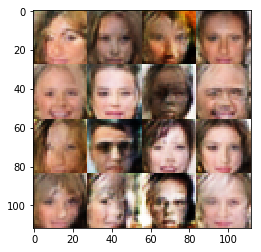

Timestamp 20170805-03-52-38.412 -  Epoch 1/1 -  Step 16510 -  D Loss: 0.9518 - G Loss: 1.1900
Timestamp 20170805-03-52-45.808 -  Epoch 1/1 -  Step 16520 -  D Loss: 0.8398 - G Loss: 1.2831
Timestamp 20170805-03-52-53.180 -  Epoch 1/1 -  Step 16530 -  D Loss: 0.9693 - G Loss: 1.0028
Timestamp 20170805-03-53-00.528 -  Epoch 1/1 -  Step 16540 -  D Loss: 0.9501 - G Loss: 1.0167
Timestamp 20170805-03-53-07.837 -  Epoch 1/1 -  Step 16550 -  D Loss: 0.8398 - G Loss: 1.1831
Timestamp 20170805-03-53-15.261 -  Epoch 1/1 -  Step 16560 -  D Loss: 0.9014 - G Loss: 1.1129
Timestamp 20170805-03-53-22.571 -  Epoch 1/1 -  Step 16570 -  D Loss: 0.7949 - G Loss: 1.3995
Timestamp 20170805-03-53-30.022 -  Epoch 1/1 -  Step 16580 -  D Loss: 1.0263 - G Loss: 1.3733
Timestamp 20170805-03-53-37.503 -  Epoch 1/1 -  Step 16590 -  D Loss: 0.9652 - G Loss: 2.2992
Timestamp 20170805-03-53-44.857 -  Epoch 1/1 -  Step 16600 -  D Loss: 1.3038 - G Loss: 0.5470


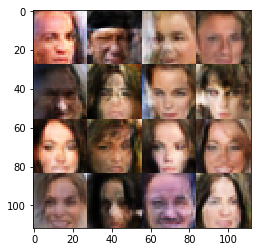

Timestamp 20170805-03-53-52.957 -  Epoch 1/1 -  Step 16610 -  D Loss: 1.1609 - G Loss: 0.5683
Timestamp 20170805-03-54-00.459 -  Epoch 1/1 -  Step 16620 -  D Loss: 0.9084 - G Loss: 1.4792
Timestamp 20170805-03-54-07.923 -  Epoch 1/1 -  Step 16630 -  D Loss: 1.3266 - G Loss: 0.6424
Timestamp 20170805-03-54-15.339 -  Epoch 1/1 -  Step 16640 -  D Loss: 0.9106 - G Loss: 1.2359
Timestamp 20170805-03-54-22.860 -  Epoch 1/1 -  Step 16650 -  D Loss: 1.0809 - G Loss: 1.2956
Timestamp 20170805-03-54-30.353 -  Epoch 1/1 -  Step 16660 -  D Loss: 1.1447 - G Loss: 0.6266
Timestamp 20170805-03-54-37.693 -  Epoch 1/1 -  Step 16670 -  D Loss: 0.9238 - G Loss: 0.9572
Timestamp 20170805-03-54-44.985 -  Epoch 1/1 -  Step 16680 -  D Loss: 1.2764 - G Loss: 0.7699
Timestamp 20170805-03-54-52.642 -  Epoch 1/1 -  Step 16690 -  D Loss: 0.6790 - G Loss: 1.3487
Timestamp 20170805-03-54-59.944 -  Epoch 1/1 -  Step 16700 -  D Loss: 0.9876 - G Loss: 1.3266


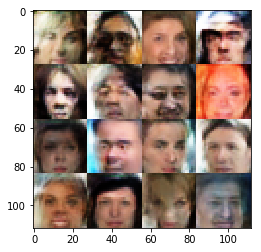

Timestamp 20170805-03-55-08.694 -  Epoch 1/1 -  Step 16710 -  D Loss: 1.1227 - G Loss: 1.0167
Timestamp 20170805-03-55-16.025 -  Epoch 1/1 -  Step 16720 -  D Loss: 1.0982 - G Loss: 1.6206
Timestamp 20170805-03-55-23.341 -  Epoch 1/1 -  Step 16730 -  D Loss: 0.8170 - G Loss: 1.2436
Timestamp 20170805-03-55-30.684 -  Epoch 1/1 -  Step 16740 -  D Loss: 1.4848 - G Loss: 0.6365
Timestamp 20170805-03-55-38.068 -  Epoch 1/1 -  Step 16750 -  D Loss: 0.7076 - G Loss: 2.5884
Timestamp 20170805-03-55-45.500 -  Epoch 1/1 -  Step 16760 -  D Loss: 1.1256 - G Loss: 1.5186
Timestamp 20170805-03-55-53.109 -  Epoch 1/1 -  Step 16770 -  D Loss: 0.9654 - G Loss: 1.4717
Timestamp 20170805-03-56-00.576 -  Epoch 1/1 -  Step 16780 -  D Loss: 0.9085 - G Loss: 1.8109
Timestamp 20170805-03-56-08.090 -  Epoch 1/1 -  Step 16790 -  D Loss: 1.1094 - G Loss: 1.5441
Timestamp 20170805-03-56-15.519 -  Epoch 1/1 -  Step 16800 -  D Loss: 0.8983 - G Loss: 0.8316


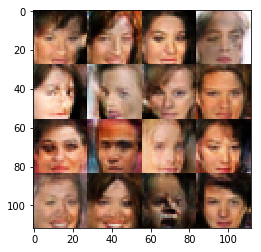

Timestamp 20170805-03-56-23.665 -  Epoch 1/1 -  Step 16810 -  D Loss: 1.2034 - G Loss: 1.3054
Timestamp 20170805-03-56-31.101 -  Epoch 1/1 -  Step 16820 -  D Loss: 1.1805 - G Loss: 0.7371
Timestamp 20170805-03-56-38.684 -  Epoch 1/1 -  Step 16830 -  D Loss: 1.3856 - G Loss: 1.3486
Timestamp 20170805-03-56-46.273 -  Epoch 1/1 -  Step 16840 -  D Loss: 0.9965 - G Loss: 1.3297
Timestamp 20170805-03-56-53.680 -  Epoch 1/1 -  Step 16850 -  D Loss: 0.8405 - G Loss: 1.3478
Timestamp 20170805-03-57-01.291 -  Epoch 1/1 -  Step 16860 -  D Loss: 0.8894 - G Loss: 1.6804
Timestamp 20170805-03-57-08.841 -  Epoch 1/1 -  Step 16870 -  D Loss: 1.0101 - G Loss: 1.8027
Timestamp 20170805-03-57-16.458 -  Epoch 1/1 -  Step 16880 -  D Loss: 1.0820 - G Loss: 1.0643
Timestamp 20170805-03-57-23.928 -  Epoch 1/1 -  Step 16890 -  D Loss: 0.7710 - G Loss: 1.3594
Timestamp 20170805-03-57-31.550 -  Epoch 1/1 -  Step 16900 -  D Loss: 1.3418 - G Loss: 1.3997


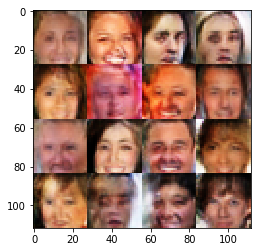

Timestamp 20170805-03-57-39.830 -  Epoch 1/1 -  Step 16910 -  D Loss: 1.2465 - G Loss: 0.7231
Timestamp 20170805-03-57-47.371 -  Epoch 1/1 -  Step 16920 -  D Loss: 0.8956 - G Loss: 1.8006
Timestamp 20170805-03-57-54.816 -  Epoch 1/1 -  Step 16930 -  D Loss: 0.9046 - G Loss: 1.4820
Timestamp 20170805-03-58-02.129 -  Epoch 1/1 -  Step 16940 -  D Loss: 0.8374 - G Loss: 1.9693
Timestamp 20170805-03-58-09.468 -  Epoch 1/1 -  Step 16950 -  D Loss: 1.0675 - G Loss: 1.1935
Timestamp 20170805-03-58-16.850 -  Epoch 1/1 -  Step 16960 -  D Loss: 0.7604 - G Loss: 1.2002
Timestamp 20170805-03-58-24.179 -  Epoch 1/1 -  Step 16970 -  D Loss: 0.8903 - G Loss: 0.9331
Timestamp 20170805-03-58-31.520 -  Epoch 1/1 -  Step 16980 -  D Loss: 1.1007 - G Loss: 0.9699
Timestamp 20170805-03-58-38.815 -  Epoch 1/1 -  Step 16990 -  D Loss: 1.1268 - G Loss: 1.0734
Timestamp 20170805-03-58-46.129 -  Epoch 1/1 -  Step 17000 -  D Loss: 0.6599 - G Loss: 1.5343


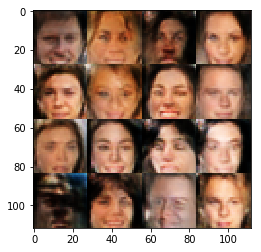

Timestamp 20170805-03-58-54.364 -  Epoch 1/1 -  Step 17010 -  D Loss: 0.9319 - G Loss: 1.4612
Timestamp 20170805-03-59-01.782 -  Epoch 1/1 -  Step 17020 -  D Loss: 0.8710 - G Loss: 1.9338
Timestamp 20170805-03-59-09.260 -  Epoch 1/1 -  Step 17030 -  D Loss: 1.1053 - G Loss: 1.6811
Timestamp 20170805-03-59-16.667 -  Epoch 1/1 -  Step 17040 -  D Loss: 1.3511 - G Loss: 1.1041
Timestamp 20170805-03-59-24.129 -  Epoch 1/1 -  Step 17050 -  D Loss: 1.1190 - G Loss: 1.0706
Timestamp 20170805-03-59-31.538 -  Epoch 1/1 -  Step 17060 -  D Loss: 0.8069 - G Loss: 1.1009
Timestamp 20170805-03-59-38.974 -  Epoch 1/1 -  Step 17070 -  D Loss: 0.8794 - G Loss: 1.3369
Timestamp 20170805-03-59-46.415 -  Epoch 1/1 -  Step 17080 -  D Loss: 1.4855 - G Loss: 1.8248
Timestamp 20170805-03-59-53.873 -  Epoch 1/1 -  Step 17090 -  D Loss: 0.7889 - G Loss: 1.6786
Timestamp 20170805-04-00-01.339 -  Epoch 1/1 -  Step 17100 -  D Loss: 1.0057 - G Loss: 1.6083


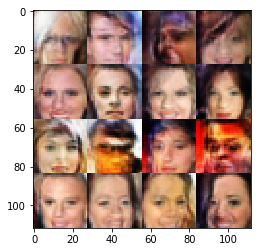

Timestamp 20170805-04-00-09.572 -  Epoch 1/1 -  Step 17110 -  D Loss: 0.8292 - G Loss: 0.9736
Timestamp 20170805-04-00-16.977 -  Epoch 1/1 -  Step 17120 -  D Loss: 1.4631 - G Loss: 1.2403
Timestamp 20170805-04-00-24.370 -  Epoch 1/1 -  Step 17130 -  D Loss: 1.6036 - G Loss: 0.8544
Timestamp 20170805-04-00-31.852 -  Epoch 1/1 -  Step 17140 -  D Loss: 0.9728 - G Loss: 1.2658
Timestamp 20170805-04-00-39.339 -  Epoch 1/1 -  Step 17150 -  D Loss: 0.8227 - G Loss: 1.1672
Timestamp 20170805-04-00-46.816 -  Epoch 1/1 -  Step 17160 -  D Loss: 1.0254 - G Loss: 1.2901
Timestamp 20170805-04-00-54.245 -  Epoch 1/1 -  Step 17170 -  D Loss: 0.6912 - G Loss: 2.0361
Timestamp 20170805-04-01-01.613 -  Epoch 1/1 -  Step 17180 -  D Loss: 1.2505 - G Loss: 1.0901
Timestamp 20170805-04-01-09.142 -  Epoch 1/1 -  Step 17190 -  D Loss: 1.1616 - G Loss: 1.3246
Timestamp 20170805-04-01-16.582 -  Epoch 1/1 -  Step 17200 -  D Loss: 1.0528 - G Loss: 1.2539


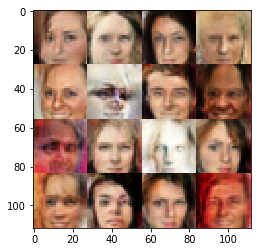

Timestamp 20170805-04-01-24.827 -  Epoch 1/1 -  Step 17210 -  D Loss: 0.7186 - G Loss: 1.0462
Timestamp 20170805-04-01-32.308 -  Epoch 1/1 -  Step 17220 -  D Loss: 1.1829 - G Loss: 0.9951
Timestamp 20170805-04-01-39.746 -  Epoch 1/1 -  Step 17230 -  D Loss: 0.9331 - G Loss: 1.5112
Timestamp 20170805-04-01-47.233 -  Epoch 1/1 -  Step 17240 -  D Loss: 1.0833 - G Loss: 1.5350
Timestamp 20170805-04-01-54.693 -  Epoch 1/1 -  Step 17250 -  D Loss: 0.8382 - G Loss: 1.4947
Timestamp 20170805-04-02-02.106 -  Epoch 1/1 -  Step 17260 -  D Loss: 0.9166 - G Loss: 1.3722
Timestamp 20170805-04-02-09.680 -  Epoch 1/1 -  Step 17270 -  D Loss: 0.7292 - G Loss: 1.1003
Timestamp 20170805-04-02-17.063 -  Epoch 1/1 -  Step 17280 -  D Loss: 0.7294 - G Loss: 1.9718
Timestamp 20170805-04-02-24.467 -  Epoch 1/1 -  Step 17290 -  D Loss: 0.8366 - G Loss: 1.7323
Timestamp 20170805-04-02-31.912 -  Epoch 1/1 -  Step 17300 -  D Loss: 0.7075 - G Loss: 1.6185


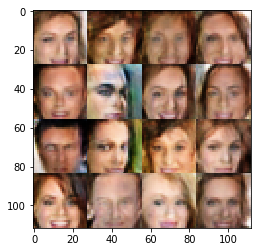

Timestamp 20170805-04-02-40.139 -  Epoch 1/1 -  Step 17310 -  D Loss: 0.8661 - G Loss: 1.6413
Timestamp 20170805-04-02-47.541 -  Epoch 1/1 -  Step 17320 -  D Loss: 1.0523 - G Loss: 1.1982
Timestamp 20170805-04-02-55.076 -  Epoch 1/1 -  Step 17330 -  D Loss: 1.3092 - G Loss: 1.7459
Timestamp 20170805-04-03-02.490 -  Epoch 1/1 -  Step 17340 -  D Loss: 1.3819 - G Loss: 0.5513
Timestamp 20170805-04-03-09.881 -  Epoch 1/1 -  Step 17350 -  D Loss: 0.8341 - G Loss: 1.2577
Timestamp 20170805-04-03-17.421 -  Epoch 1/1 -  Step 17360 -  D Loss: 0.8502 - G Loss: 1.6102
Timestamp 20170805-04-03-24.830 -  Epoch 1/1 -  Step 17370 -  D Loss: 0.7725 - G Loss: 1.5149
Timestamp 20170805-04-03-32.194 -  Epoch 1/1 -  Step 17380 -  D Loss: 0.7582 - G Loss: 1.4263
Timestamp 20170805-04-03-39.647 -  Epoch 1/1 -  Step 17390 -  D Loss: 0.9343 - G Loss: 1.9548
Timestamp 20170805-04-03-47.114 -  Epoch 1/1 -  Step 17400 -  D Loss: 0.7773 - G Loss: 1.3304


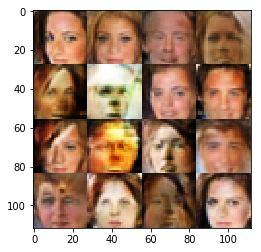

Timestamp 20170805-04-03-55.239 -  Epoch 1/1 -  Step 17410 -  D Loss: 0.8271 - G Loss: 1.2298
Timestamp 20170805-04-04-02.867 -  Epoch 1/1 -  Step 17420 -  D Loss: 0.8458 - G Loss: 1.7213
Timestamp 20170805-04-04-10.400 -  Epoch 1/1 -  Step 17430 -  D Loss: 1.0823 - G Loss: 1.0405
Timestamp 20170805-04-04-18.191 -  Epoch 1/1 -  Step 17440 -  D Loss: 0.9883 - G Loss: 1.6984
Timestamp 20170805-04-04-25.786 -  Epoch 1/1 -  Step 17450 -  D Loss: 0.7925 - G Loss: 1.9115
Timestamp 20170805-04-04-33.551 -  Epoch 1/1 -  Step 17460 -  D Loss: 0.9143 - G Loss: 1.5986
Timestamp 20170805-04-04-41.290 -  Epoch 1/1 -  Step 17470 -  D Loss: 0.7629 - G Loss: 2.5102
Timestamp 20170805-04-04-48.916 -  Epoch 1/1 -  Step 17480 -  D Loss: 0.8577 - G Loss: 1.3926
Timestamp 20170805-04-04-56.546 -  Epoch 1/1 -  Step 17490 -  D Loss: 0.9700 - G Loss: 1.5118
Timestamp 20170805-04-05-04.567 -  Epoch 1/1 -  Step 17500 -  D Loss: 1.0119 - G Loss: 0.6627


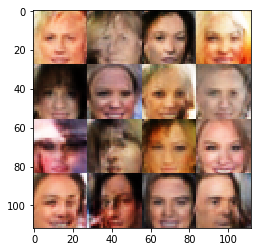

Timestamp 20170805-04-05-13.104 -  Epoch 1/1 -  Step 17510 -  D Loss: 0.6850 - G Loss: 1.5002
Timestamp 20170805-04-05-20.944 -  Epoch 1/1 -  Step 17520 -  D Loss: 0.7371 - G Loss: 1.9888
Timestamp 20170805-04-05-28.602 -  Epoch 1/1 -  Step 17530 -  D Loss: 1.0778 - G Loss: 1.3008
Timestamp 20170805-04-05-36.242 -  Epoch 1/1 -  Step 17540 -  D Loss: 0.8051 - G Loss: 1.4785
Timestamp 20170805-04-05-43.910 -  Epoch 1/1 -  Step 17550 -  D Loss: 1.0727 - G Loss: 2.4360
Timestamp 20170805-04-05-51.716 -  Epoch 1/1 -  Step 17560 -  D Loss: 0.9535 - G Loss: 1.4535
Timestamp 20170805-04-05-59.328 -  Epoch 1/1 -  Step 17570 -  D Loss: 1.2270 - G Loss: 1.0776
Timestamp 20170805-04-06-07.036 -  Epoch 1/1 -  Step 17580 -  D Loss: 0.9210 - G Loss: 1.4366
Timestamp 20170805-04-06-14.705 -  Epoch 1/1 -  Step 17590 -  D Loss: 0.7686 - G Loss: 1.3964
Timestamp 20170805-04-06-22.508 -  Epoch 1/1 -  Step 17600 -  D Loss: 0.7633 - G Loss: 0.8728


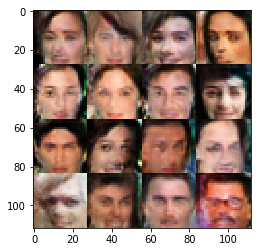

Timestamp 20170805-04-06-31.056 -  Epoch 1/1 -  Step 17610 -  D Loss: 1.0385 - G Loss: 1.5369
Timestamp 20170805-04-06-38.899 -  Epoch 1/1 -  Step 17620 -  D Loss: 0.8990 - G Loss: 2.0811
Timestamp 20170805-04-06-46.510 -  Epoch 1/1 -  Step 17630 -  D Loss: 0.7505 - G Loss: 1.7577
Timestamp 20170805-04-06-54.322 -  Epoch 1/1 -  Step 17640 -  D Loss: 0.7273 - G Loss: 1.3795
Timestamp 20170805-04-07-01.937 -  Epoch 1/1 -  Step 17650 -  D Loss: 0.7058 - G Loss: 1.6166
Timestamp 20170805-04-07-09.621 -  Epoch 1/1 -  Step 17660 -  D Loss: 1.2159 - G Loss: 1.7289
Timestamp 20170805-04-07-17.252 -  Epoch 1/1 -  Step 17670 -  D Loss: 1.2668 - G Loss: 0.7629
Timestamp 20170805-04-07-24.920 -  Epoch 1/1 -  Step 17680 -  D Loss: 1.0997 - G Loss: 0.8135
Timestamp 20170805-04-07-32.883 -  Epoch 1/1 -  Step 17690 -  D Loss: 1.2366 - G Loss: 1.2526
Timestamp 20170805-04-07-40.468 -  Epoch 1/1 -  Step 17700 -  D Loss: 0.8664 - G Loss: 1.5439


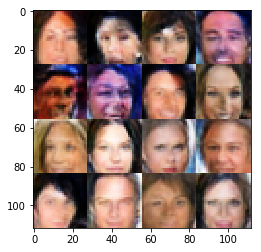

Timestamp 20170805-04-07-48.876 -  Epoch 1/1 -  Step 17710 -  D Loss: 1.2623 - G Loss: 0.7278
Timestamp 20170805-04-07-56.409 -  Epoch 1/1 -  Step 17720 -  D Loss: 0.7990 - G Loss: 1.9661
Timestamp 20170805-04-08-03.990 -  Epoch 1/1 -  Step 17730 -  D Loss: 0.7520 - G Loss: 1.3959
Timestamp 20170805-04-08-11.512 -  Epoch 1/1 -  Step 17740 -  D Loss: 0.6593 - G Loss: 1.3184
Timestamp 20170805-04-08-19.322 -  Epoch 1/1 -  Step 17750 -  D Loss: 0.7529 - G Loss: 0.9570
Timestamp 20170805-04-08-26.940 -  Epoch 1/1 -  Step 17760 -  D Loss: 1.1885 - G Loss: 0.6479
Timestamp 20170805-04-08-34.581 -  Epoch 1/1 -  Step 17770 -  D Loss: 0.7702 - G Loss: 2.1870
Timestamp 20170805-04-08-42.144 -  Epoch 1/1 -  Step 17780 -  D Loss: 0.9498 - G Loss: 1.0670
Timestamp 20170805-04-08-49.848 -  Epoch 1/1 -  Step 17790 -  D Loss: 1.4967 - G Loss: 0.8696
Timestamp 20170805-04-08-57.455 -  Epoch 1/1 -  Step 17800 -  D Loss: 1.0627 - G Loss: 0.7647


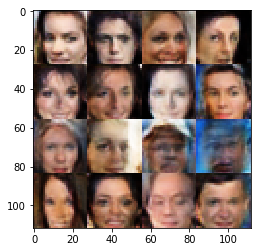

Timestamp 20170805-04-09-05.809 -  Epoch 1/1 -  Step 17810 -  D Loss: 1.5388 - G Loss: 0.9785
Timestamp 20170805-04-09-13.450 -  Epoch 1/1 -  Step 17820 -  D Loss: 0.6898 - G Loss: 0.9340
Timestamp 20170805-04-09-21.373 -  Epoch 1/1 -  Step 17830 -  D Loss: 0.8634 - G Loss: 1.3589
Timestamp 20170805-04-09-29.002 -  Epoch 1/1 -  Step 17840 -  D Loss: 0.8403 - G Loss: 1.4278
Timestamp 20170805-04-09-36.515 -  Epoch 1/1 -  Step 17850 -  D Loss: 1.1826 - G Loss: 2.6574
Timestamp 20170805-04-09-44.139 -  Epoch 1/1 -  Step 17860 -  D Loss: 0.8976 - G Loss: 0.7735
Timestamp 20170805-04-09-51.938 -  Epoch 1/1 -  Step 17870 -  D Loss: 1.2808 - G Loss: 1.6989
Timestamp 20170805-04-09-59.573 -  Epoch 1/1 -  Step 17880 -  D Loss: 0.7654 - G Loss: 2.4046
Timestamp 20170805-04-10-07.172 -  Epoch 1/1 -  Step 17890 -  D Loss: 1.2268 - G Loss: 1.0381
Timestamp 20170805-04-10-14.817 -  Epoch 1/1 -  Step 17900 -  D Loss: 0.7402 - G Loss: 0.8970


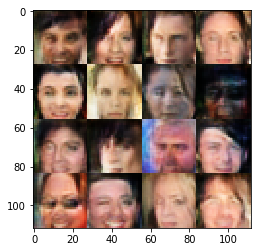

Timestamp 20170805-04-10-23.115 -  Epoch 1/1 -  Step 17910 -  D Loss: 1.0101 - G Loss: 1.9420
Timestamp 20170805-04-10-30.654 -  Epoch 1/1 -  Step 17920 -  D Loss: 0.8443 - G Loss: 1.5065
Timestamp 20170805-04-10-38.173 -  Epoch 1/1 -  Step 17930 -  D Loss: 1.3871 - G Loss: 1.2828
Timestamp 20170805-04-10-45.837 -  Epoch 1/1 -  Step 17940 -  D Loss: 0.8174 - G Loss: 1.5619
Timestamp 20170805-04-10-53.396 -  Epoch 1/1 -  Step 17950 -  D Loss: 0.9569 - G Loss: 1.4800
Timestamp 20170805-04-11-01.046 -  Epoch 1/1 -  Step 17960 -  D Loss: 0.8686 - G Loss: 1.0766
Timestamp 20170805-04-11-08.600 -  Epoch 1/1 -  Step 17970 -  D Loss: 1.2879 - G Loss: 1.9544
Timestamp 20170805-04-11-16.040 -  Epoch 1/1 -  Step 17980 -  D Loss: 1.0897 - G Loss: 1.2853
Timestamp 20170805-04-11-23.520 -  Epoch 1/1 -  Step 17990 -  D Loss: 1.3511 - G Loss: 0.6410
Timestamp 20170805-04-11-30.951 -  Epoch 1/1 -  Step 18000 -  D Loss: 0.8778 - G Loss: 1.5172


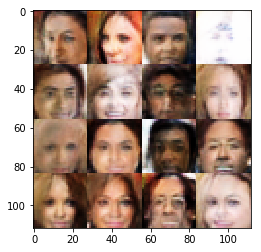

Timestamp 20170805-04-11-39.131 -  Epoch 1/1 -  Step 18010 -  D Loss: 0.8885 - G Loss: 1.6884
Timestamp 20170805-04-11-46.590 -  Epoch 1/1 -  Step 18020 -  D Loss: 0.8080 - G Loss: 1.9407
Timestamp 20170805-04-11-54.150 -  Epoch 1/1 -  Step 18030 -  D Loss: 0.8860 - G Loss: 1.9739
Timestamp 20170805-04-12-01.585 -  Epoch 1/1 -  Step 18040 -  D Loss: 0.8578 - G Loss: 1.4356
Timestamp 20170805-04-12-09.081 -  Epoch 1/1 -  Step 18050 -  D Loss: 0.7277 - G Loss: 1.4132
Timestamp 20170805-04-12-16.487 -  Epoch 1/1 -  Step 18060 -  D Loss: 0.7202 - G Loss: 1.6846
Timestamp 20170805-04-12-23.938 -  Epoch 1/1 -  Step 18070 -  D Loss: 0.7642 - G Loss: 2.0740
Timestamp 20170805-04-12-31.294 -  Epoch 1/1 -  Step 18080 -  D Loss: 1.2255 - G Loss: 0.8704
Timestamp 20170805-04-12-38.590 -  Epoch 1/1 -  Step 18090 -  D Loss: 0.7810 - G Loss: 1.1544
Timestamp 20170805-04-12-45.881 -  Epoch 1/1 -  Step 18100 -  D Loss: 0.9908 - G Loss: 2.0922


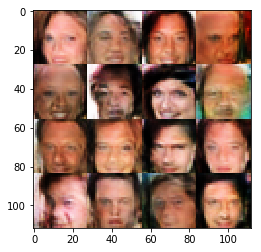

Timestamp 20170805-04-12-54.084 -  Epoch 1/1 -  Step 18110 -  D Loss: 0.9937 - G Loss: 1.6400
Timestamp 20170805-04-13-01.418 -  Epoch 1/1 -  Step 18120 -  D Loss: 0.8242 - G Loss: 1.7046
Timestamp 20170805-04-13-08.721 -  Epoch 1/1 -  Step 18130 -  D Loss: 0.8217 - G Loss: 1.3576
Timestamp 20170805-04-13-16.126 -  Epoch 1/1 -  Step 18140 -  D Loss: 0.8494 - G Loss: 1.0721
Timestamp 20170805-04-13-23.454 -  Epoch 1/1 -  Step 18150 -  D Loss: 0.7071 - G Loss: 1.2886
Timestamp 20170805-04-13-30.752 -  Epoch 1/1 -  Step 18160 -  D Loss: 0.8566 - G Loss: 1.1231
Timestamp 20170805-04-13-38.036 -  Epoch 1/1 -  Step 18170 -  D Loss: 1.4022 - G Loss: 1.1941
Timestamp 20170805-04-13-45.345 -  Epoch 1/1 -  Step 18180 -  D Loss: 1.1450 - G Loss: 1.9958
Timestamp 20170805-04-13-52.656 -  Epoch 1/1 -  Step 18190 -  D Loss: 1.2300 - G Loss: 1.2715
Timestamp 20170805-04-13-59.965 -  Epoch 1/1 -  Step 18200 -  D Loss: 1.2252 - G Loss: 1.3883


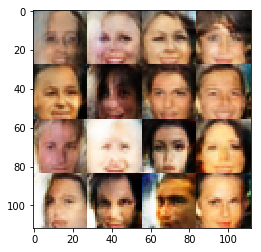

Timestamp 20170805-04-14-08.019 -  Epoch 1/1 -  Step 18210 -  D Loss: 1.1766 - G Loss: 1.6065
Timestamp 20170805-04-14-15.349 -  Epoch 1/1 -  Step 18220 -  D Loss: 0.8814 - G Loss: 1.2325
Timestamp 20170805-04-14-22.759 -  Epoch 1/1 -  Step 18230 -  D Loss: 1.3186 - G Loss: 0.6365
Timestamp 20170805-04-14-30.190 -  Epoch 1/1 -  Step 18240 -  D Loss: 1.3309 - G Loss: 1.2886
Timestamp 20170805-04-14-37.690 -  Epoch 1/1 -  Step 18250 -  D Loss: 0.9006 - G Loss: 1.2197
Timestamp 20170805-04-14-45.149 -  Epoch 1/1 -  Step 18260 -  D Loss: 0.7506 - G Loss: 1.4790
Timestamp 20170805-04-14-52.632 -  Epoch 1/1 -  Step 18270 -  D Loss: 0.8646 - G Loss: 2.0099
Timestamp 20170805-04-15-00.117 -  Epoch 1/1 -  Step 18280 -  D Loss: 1.1714 - G Loss: 1.2621
Timestamp 20170805-04-15-07.662 -  Epoch 1/1 -  Step 18290 -  D Loss: 0.9423 - G Loss: 1.5973
Timestamp 20170805-04-15-15.069 -  Epoch 1/1 -  Step 18300 -  D Loss: 0.7915 - G Loss: 1.6231


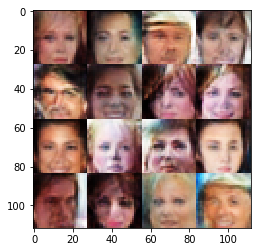

Timestamp 20170805-04-15-23.225 -  Epoch 1/1 -  Step 18310 -  D Loss: 1.0037 - G Loss: 1.2458
Timestamp 20170805-04-15-30.587 -  Epoch 1/1 -  Step 18320 -  D Loss: 1.3645 - G Loss: 0.6473
Timestamp 20170805-04-15-38.251 -  Epoch 1/1 -  Step 18330 -  D Loss: 1.1727 - G Loss: 1.2672
Timestamp 20170805-04-15-45.624 -  Epoch 1/1 -  Step 18340 -  D Loss: 0.8385 - G Loss: 1.7943
Timestamp 20170805-04-15-53.109 -  Epoch 1/1 -  Step 18350 -  D Loss: 0.6513 - G Loss: 1.8495
Timestamp 20170805-04-16-00.591 -  Epoch 1/1 -  Step 18360 -  D Loss: 1.2809 - G Loss: 1.5220
Timestamp 20170805-04-16-08.035 -  Epoch 1/1 -  Step 18370 -  D Loss: 1.1588 - G Loss: 0.8709
Timestamp 20170805-04-16-15.443 -  Epoch 1/1 -  Step 18380 -  D Loss: 1.5690 - G Loss: 0.7349
Timestamp 20170805-04-16-22.941 -  Epoch 1/1 -  Step 18390 -  D Loss: 0.7804 - G Loss: 0.9029
Timestamp 20170805-04-16-30.507 -  Epoch 1/1 -  Step 18400 -  D Loss: 1.3626 - G Loss: 0.8371


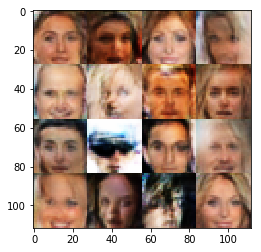

Timestamp 20170805-04-16-38.693 -  Epoch 1/1 -  Step 18410 -  D Loss: 0.9129 - G Loss: 1.2233
Timestamp 20170805-04-16-46.069 -  Epoch 1/1 -  Step 18420 -  D Loss: 0.9710 - G Loss: 1.0785
Timestamp 20170805-04-16-53.587 -  Epoch 1/1 -  Step 18430 -  D Loss: 1.2615 - G Loss: 0.6696
Timestamp 20170805-04-17-00.964 -  Epoch 1/1 -  Step 18440 -  D Loss: 0.7911 - G Loss: 1.4335
Timestamp 20170805-04-17-08.382 -  Epoch 1/1 -  Step 18450 -  D Loss: 0.9699 - G Loss: 1.4945
Timestamp 20170805-04-17-15.837 -  Epoch 1/1 -  Step 18460 -  D Loss: 1.0548 - G Loss: 1.9034
Timestamp 20170805-04-17-23.293 -  Epoch 1/1 -  Step 18470 -  D Loss: 0.7210 - G Loss: 1.7892
Timestamp 20170805-04-17-30.771 -  Epoch 1/1 -  Step 18480 -  D Loss: 0.7204 - G Loss: 2.1718
Timestamp 20170805-04-17-38.222 -  Epoch 1/1 -  Step 18490 -  D Loss: 0.9016 - G Loss: 1.8782
Timestamp 20170805-04-17-45.633 -  Epoch 1/1 -  Step 18500 -  D Loss: 0.9474 - G Loss: 1.7249


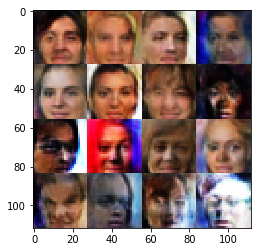

Timestamp 20170805-04-17-53.860 -  Epoch 1/1 -  Step 18510 -  D Loss: 1.0360 - G Loss: 1.0168
Timestamp 20170805-04-18-01.241 -  Epoch 1/1 -  Step 18520 -  D Loss: 0.9121 - G Loss: 1.3728
Timestamp 20170805-04-18-08.657 -  Epoch 1/1 -  Step 18530 -  D Loss: 0.9881 - G Loss: 1.8579
Timestamp 20170805-04-18-16.034 -  Epoch 1/1 -  Step 18540 -  D Loss: 1.1369 - G Loss: 1.7417
Timestamp 20170805-04-18-23.336 -  Epoch 1/1 -  Step 18550 -  D Loss: 1.1176 - G Loss: 1.1495
Timestamp 20170805-04-18-30.744 -  Epoch 1/1 -  Step 18560 -  D Loss: 0.7757 - G Loss: 0.7318
Timestamp 20170805-04-18-38.051 -  Epoch 1/1 -  Step 18570 -  D Loss: 0.6743 - G Loss: 2.1711
Timestamp 20170805-04-18-45.380 -  Epoch 1/1 -  Step 18580 -  D Loss: 1.2432 - G Loss: 1.6573
Timestamp 20170805-04-18-52.701 -  Epoch 1/1 -  Step 18590 -  D Loss: 1.1798 - G Loss: 1.3049
Timestamp 20170805-04-19-00.065 -  Epoch 1/1 -  Step 18600 -  D Loss: 0.9588 - G Loss: 1.0881


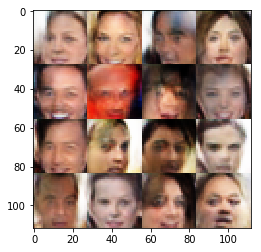

Timestamp 20170805-04-19-08.521 -  Epoch 1/1 -  Step 18610 -  D Loss: 1.1341 - G Loss: 1.5383
Timestamp 20170805-04-19-16.087 -  Epoch 1/1 -  Step 18620 -  D Loss: 0.9859 - G Loss: 1.3504
Timestamp 20170805-04-19-24.127 -  Epoch 1/1 -  Step 18630 -  D Loss: 0.9370 - G Loss: 1.0475
Timestamp 20170805-04-19-31.737 -  Epoch 1/1 -  Step 18640 -  D Loss: 0.8389 - G Loss: 1.0842
Timestamp 20170805-04-19-39.325 -  Epoch 1/1 -  Step 18650 -  D Loss: 0.9423 - G Loss: 1.4963
Timestamp 20170805-04-19-46.901 -  Epoch 1/1 -  Step 18660 -  D Loss: 0.7964 - G Loss: 1.1702
Timestamp 20170805-04-19-54.479 -  Epoch 1/1 -  Step 18670 -  D Loss: 1.1386 - G Loss: 0.9156
Timestamp 20170805-04-20-02.154 -  Epoch 1/1 -  Step 18680 -  D Loss: 1.1147 - G Loss: 1.2804
Timestamp 20170805-04-20-09.905 -  Epoch 1/1 -  Step 18690 -  D Loss: 1.1123 - G Loss: 1.7691
Timestamp 20170805-04-20-17.471 -  Epoch 1/1 -  Step 18700 -  D Loss: 0.8004 - G Loss: 0.9639


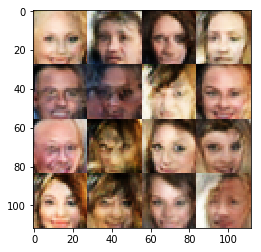

Timestamp 20170805-04-20-25.768 -  Epoch 1/1 -  Step 18710 -  D Loss: 0.7140 - G Loss: 1.5721
Timestamp 20170805-04-20-33.643 -  Epoch 1/1 -  Step 18720 -  D Loss: 1.1314 - G Loss: 0.9975
Timestamp 20170805-04-20-41.001 -  Epoch 1/1 -  Step 18730 -  D Loss: 1.3414 - G Loss: 0.6934
Timestamp 20170805-04-20-48.310 -  Epoch 1/1 -  Step 18740 -  D Loss: 0.8336 - G Loss: 1.8447
Timestamp 20170805-04-20-55.623 -  Epoch 1/1 -  Step 18750 -  D Loss: 1.4317 - G Loss: 1.1359
Timestamp 20170805-04-21-02.926 -  Epoch 1/1 -  Step 18760 -  D Loss: 0.8298 - G Loss: 1.8234
Timestamp 20170805-04-21-10.240 -  Epoch 1/1 -  Step 18770 -  D Loss: 1.0117 - G Loss: 1.2998
Timestamp 20170805-04-21-17.711 -  Epoch 1/1 -  Step 18780 -  D Loss: 1.1201 - G Loss: 0.9950
Timestamp 20170805-04-21-25.024 -  Epoch 1/1 -  Step 18790 -  D Loss: 0.9188 - G Loss: 1.1200
Timestamp 20170805-04-21-32.336 -  Epoch 1/1 -  Step 18800 -  D Loss: 0.9019 - G Loss: 1.4440


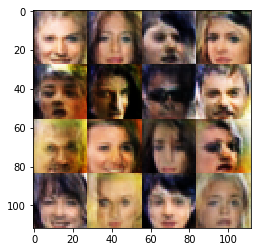

Timestamp 20170805-04-21-40.354 -  Epoch 1/1 -  Step 18810 -  D Loss: 1.0850 - G Loss: 0.9854
Timestamp 20170805-04-21-47.639 -  Epoch 1/1 -  Step 18820 -  D Loss: 0.8026 - G Loss: 1.0524
Timestamp 20170805-04-21-54.931 -  Epoch 1/1 -  Step 18830 -  D Loss: 1.1845 - G Loss: 1.7131
Timestamp 20170805-04-22-02.237 -  Epoch 1/1 -  Step 18840 -  D Loss: 1.0791 - G Loss: 1.0999
Timestamp 20170805-04-22-09.542 -  Epoch 1/1 -  Step 18850 -  D Loss: 1.0026 - G Loss: 0.7836
Timestamp 20170805-04-22-16.838 -  Epoch 1/1 -  Step 18860 -  D Loss: 1.3333 - G Loss: 1.1692
Timestamp 20170805-04-22-24.166 -  Epoch 1/1 -  Step 18870 -  D Loss: 0.7450 - G Loss: 1.4736
Timestamp 20170805-04-22-31.478 -  Epoch 1/1 -  Step 18880 -  D Loss: 0.8904 - G Loss: 1.2806
Timestamp 20170805-04-22-38.782 -  Epoch 1/1 -  Step 18890 -  D Loss: 0.9276 - G Loss: 1.6605
Timestamp 20170805-04-22-46.117 -  Epoch 1/1 -  Step 18900 -  D Loss: 0.8525 - G Loss: 1.4876


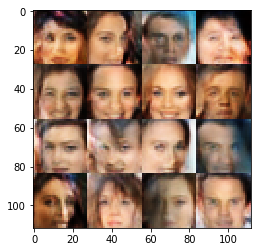

Timestamp 20170805-04-22-54.420 -  Epoch 1/1 -  Step 18910 -  D Loss: 1.0788 - G Loss: 1.6001
Timestamp 20170805-04-23-01.822 -  Epoch 1/1 -  Step 18920 -  D Loss: 0.7968 - G Loss: 2.2473
Timestamp 20170805-04-23-09.314 -  Epoch 1/1 -  Step 18930 -  D Loss: 0.5981 - G Loss: 2.2675
Timestamp 20170805-04-23-16.775 -  Epoch 1/1 -  Step 18940 -  D Loss: 1.3109 - G Loss: 1.2282
Timestamp 20170805-04-23-24.368 -  Epoch 1/1 -  Step 18950 -  D Loss: 0.7692 - G Loss: 1.2441
Timestamp 20170805-04-23-31.841 -  Epoch 1/1 -  Step 18960 -  D Loss: 1.0360 - G Loss: 2.1292
Timestamp 20170805-04-23-39.337 -  Epoch 1/1 -  Step 18970 -  D Loss: 0.8187 - G Loss: 1.4042
Timestamp 20170805-04-23-46.797 -  Epoch 1/1 -  Step 18980 -  D Loss: 0.9354 - G Loss: 1.8425
Timestamp 20170805-04-23-54.220 -  Epoch 1/1 -  Step 18990 -  D Loss: 0.7430 - G Loss: 1.3151
Timestamp 20170805-04-24-01.674 -  Epoch 1/1 -  Step 19000 -  D Loss: 0.9033 - G Loss: 2.1468


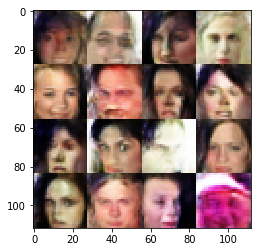

Timestamp 20170805-04-24-09.888 -  Epoch 1/1 -  Step 19010 -  D Loss: 1.1124 - G Loss: 1.1975
Timestamp 20170805-04-24-17.344 -  Epoch 1/1 -  Step 19020 -  D Loss: 1.0691 - G Loss: 1.3968
Timestamp 20170805-04-24-24.771 -  Epoch 1/1 -  Step 19030 -  D Loss: 0.9891 - G Loss: 0.6889
Timestamp 20170805-04-24-32.170 -  Epoch 1/1 -  Step 19040 -  D Loss: 0.7847 - G Loss: 1.2968
Timestamp 20170805-04-24-39.559 -  Epoch 1/1 -  Step 19050 -  D Loss: 0.8868 - G Loss: 1.9607
Timestamp 20170805-04-24-47.088 -  Epoch 1/1 -  Step 19060 -  D Loss: 1.0674 - G Loss: 1.4019
Timestamp 20170805-04-24-54.603 -  Epoch 1/1 -  Step 19070 -  D Loss: 1.4773 - G Loss: 1.1211
Timestamp 20170805-04-25-02.113 -  Epoch 1/1 -  Step 19080 -  D Loss: 1.0795 - G Loss: 2.1612
Timestamp 20170805-04-25-09.496 -  Epoch 1/1 -  Step 19090 -  D Loss: 0.9992 - G Loss: 0.6588
Timestamp 20170805-04-25-17.067 -  Epoch 1/1 -  Step 19100 -  D Loss: 1.0149 - G Loss: 0.6804


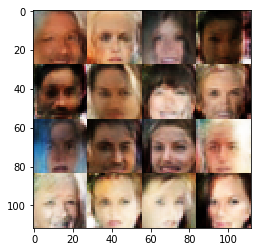

Timestamp 20170805-04-25-25.158 -  Epoch 1/1 -  Step 19110 -  D Loss: 0.9272 - G Loss: 1.6950
Timestamp 20170805-04-25-32.649 -  Epoch 1/1 -  Step 19120 -  D Loss: 0.6858 - G Loss: 1.5878
Timestamp 20170805-04-25-40.117 -  Epoch 1/1 -  Step 19130 -  D Loss: 0.9945 - G Loss: 0.8518
Timestamp 20170805-04-25-47.701 -  Epoch 1/1 -  Step 19140 -  D Loss: 1.1382 - G Loss: 1.1803
Timestamp 20170805-04-25-55.232 -  Epoch 1/1 -  Step 19150 -  D Loss: 1.0666 - G Loss: 1.3824
Timestamp 20170805-04-26-02.897 -  Epoch 1/1 -  Step 19160 -  D Loss: 1.0195 - G Loss: 1.3815
Timestamp 20170805-04-26-10.414 -  Epoch 1/1 -  Step 19170 -  D Loss: 1.0890 - G Loss: 1.3944
Timestamp 20170805-04-26-17.950 -  Epoch 1/1 -  Step 19180 -  D Loss: 0.8272 - G Loss: 1.4517
Timestamp 20170805-04-26-25.570 -  Epoch 1/1 -  Step 19190 -  D Loss: 1.0392 - G Loss: 1.1326
Timestamp 20170805-04-26-33.206 -  Epoch 1/1 -  Step 19200 -  D Loss: 1.5542 - G Loss: 1.3716


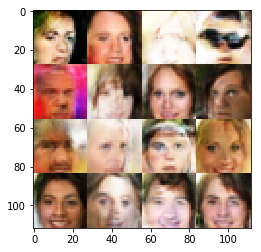

Timestamp 20170805-04-26-41.653 -  Epoch 1/1 -  Step 19210 -  D Loss: 1.1217 - G Loss: 1.3099
Timestamp 20170805-04-26-49.241 -  Epoch 1/1 -  Step 19220 -  D Loss: 0.9824 - G Loss: 1.6997
Timestamp 20170805-04-26-56.832 -  Epoch 1/1 -  Step 19230 -  D Loss: 0.9242 - G Loss: 1.7005
Timestamp 20170805-04-27-04.262 -  Epoch 1/1 -  Step 19240 -  D Loss: 1.1804 - G Loss: 0.7880
Timestamp 20170805-04-27-11.778 -  Epoch 1/1 -  Step 19250 -  D Loss: 1.1429 - G Loss: 0.8858
Timestamp 20170805-04-27-19.182 -  Epoch 1/1 -  Step 19260 -  D Loss: 0.9169 - G Loss: 1.6604
Timestamp 20170805-04-27-26.706 -  Epoch 1/1 -  Step 19270 -  D Loss: 0.9647 - G Loss: 2.1089
Timestamp 20170805-04-27-34.259 -  Epoch 1/1 -  Step 19280 -  D Loss: 0.8659 - G Loss: 1.0681
Timestamp 20170805-04-27-41.775 -  Epoch 1/1 -  Step 19290 -  D Loss: 1.1898 - G Loss: 1.4606
Timestamp 20170805-04-27-49.249 -  Epoch 1/1 -  Step 19300 -  D Loss: 0.9424 - G Loss: 1.2118


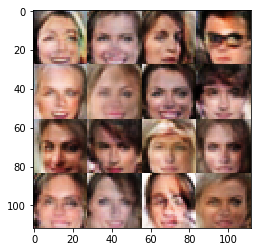

Timestamp 20170805-04-27-57.493 -  Epoch 1/1 -  Step 19310 -  D Loss: 0.7657 - G Loss: 1.7021
Timestamp 20170805-04-28-04.900 -  Epoch 1/1 -  Step 19320 -  D Loss: 0.9650 - G Loss: 1.2402
Timestamp 20170805-04-28-12.430 -  Epoch 1/1 -  Step 19330 -  D Loss: 1.1161 - G Loss: 1.2216
Timestamp 20170805-04-28-19.990 -  Epoch 1/1 -  Step 19340 -  D Loss: 1.4929 - G Loss: 1.3222
Timestamp 20170805-04-28-27.460 -  Epoch 1/1 -  Step 19350 -  D Loss: 0.8890 - G Loss: 1.3586
Timestamp 20170805-04-28-34.936 -  Epoch 1/1 -  Step 19360 -  D Loss: 1.2105 - G Loss: 1.2951
Timestamp 20170805-04-28-42.406 -  Epoch 1/1 -  Step 19370 -  D Loss: 0.9410 - G Loss: 1.2442
Timestamp 20170805-04-28-49.965 -  Epoch 1/1 -  Step 19380 -  D Loss: 1.2051 - G Loss: 0.8425
Timestamp 20170805-04-28-57.467 -  Epoch 1/1 -  Step 19390 -  D Loss: 0.6898 - G Loss: 0.7836
Timestamp 20170805-04-29-04.990 -  Epoch 1/1 -  Step 19400 -  D Loss: 1.2194 - G Loss: 1.7452


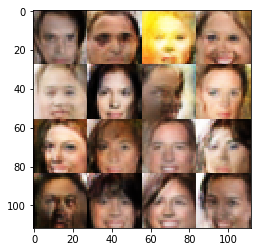

Timestamp 20170805-04-29-13.284 -  Epoch 1/1 -  Step 19410 -  D Loss: 0.8470 - G Loss: 1.7606
Timestamp 20170805-04-29-20.809 -  Epoch 1/1 -  Step 19420 -  D Loss: 0.7754 - G Loss: 1.4897
Timestamp 20170805-04-29-28.336 -  Epoch 1/1 -  Step 19430 -  D Loss: 1.0015 - G Loss: 1.5966
Timestamp 20170805-04-29-35.790 -  Epoch 1/1 -  Step 19440 -  D Loss: 0.8555 - G Loss: 0.7980
Timestamp 20170805-04-29-43.296 -  Epoch 1/1 -  Step 19450 -  D Loss: 0.7997 - G Loss: 1.7029
Timestamp 20170805-04-29-50.923 -  Epoch 1/1 -  Step 19460 -  D Loss: 0.8546 - G Loss: 1.7681
Timestamp 20170805-04-29-58.504 -  Epoch 1/1 -  Step 19470 -  D Loss: 0.7098 - G Loss: 1.7275
Timestamp 20170805-04-30-05.977 -  Epoch 1/1 -  Step 19480 -  D Loss: 1.2593 - G Loss: 1.9354
Timestamp 20170805-04-30-13.570 -  Epoch 1/1 -  Step 19490 -  D Loss: 1.1090 - G Loss: 1.2790
Timestamp 20170805-04-30-21.048 -  Epoch 1/1 -  Step 19500 -  D Loss: 0.6083 - G Loss: 1.8125


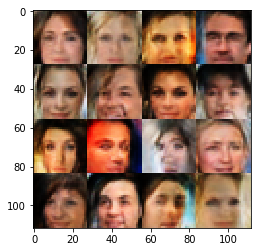

Timestamp 20170805-04-30-29.244 -  Epoch 1/1 -  Step 19510 -  D Loss: 0.8525 - G Loss: 1.5609
Timestamp 20170805-04-30-36.713 -  Epoch 1/1 -  Step 19520 -  D Loss: 0.4942 - G Loss: 1.3551
Timestamp 20170805-04-30-44.253 -  Epoch 1/1 -  Step 19530 -  D Loss: 1.2857 - G Loss: 0.9657
Timestamp 20170805-04-30-51.735 -  Epoch 1/1 -  Step 19540 -  D Loss: 1.7575 - G Loss: 1.9847
Timestamp 20170805-04-30-59.154 -  Epoch 1/1 -  Step 19550 -  D Loss: 1.2877 - G Loss: 0.8820
Timestamp 20170805-04-31-06.666 -  Epoch 1/1 -  Step 19560 -  D Loss: 1.0607 - G Loss: 1.9932
Timestamp 20170805-04-31-14.061 -  Epoch 1/1 -  Step 19570 -  D Loss: 0.9979 - G Loss: 1.5023
Timestamp 20170805-04-31-21.636 -  Epoch 1/1 -  Step 19580 -  D Loss: 1.0576 - G Loss: 0.9656
Timestamp 20170805-04-31-28.986 -  Epoch 1/1 -  Step 19590 -  D Loss: 0.8105 - G Loss: 1.5530
Timestamp 20170805-04-31-36.373 -  Epoch 1/1 -  Step 19600 -  D Loss: 0.8497 - G Loss: 1.0833


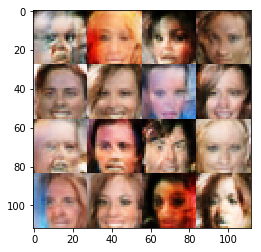

Timestamp 20170805-04-31-44.969 -  Epoch 1/1 -  Step 19610 -  D Loss: 1.1299 - G Loss: 1.3918
Timestamp 20170805-04-31-52.460 -  Epoch 1/1 -  Step 19620 -  D Loss: 1.2052 - G Loss: 1.6190
Timestamp 20170805-04-31-59.944 -  Epoch 1/1 -  Step 19630 -  D Loss: 0.8398 - G Loss: 1.5112
Timestamp 20170805-04-32-07.434 -  Epoch 1/1 -  Step 19640 -  D Loss: 1.5605 - G Loss: 1.9813
Timestamp 20170805-04-32-14.890 -  Epoch 1/1 -  Step 19650 -  D Loss: 1.0044 - G Loss: 0.8851
Timestamp 20170805-04-32-22.211 -  Epoch 1/1 -  Step 19660 -  D Loss: 1.0015 - G Loss: 0.6558
Timestamp 20170805-04-32-29.731 -  Epoch 1/1 -  Step 19670 -  D Loss: 0.6894 - G Loss: 1.8088
Timestamp 20170805-04-32-37.177 -  Epoch 1/1 -  Step 19680 -  D Loss: 1.3032 - G Loss: 1.2140
Timestamp 20170805-04-32-44.616 -  Epoch 1/1 -  Step 19690 -  D Loss: 0.7010 - G Loss: 1.2366
Timestamp 20170805-04-32-51.971 -  Epoch 1/1 -  Step 19700 -  D Loss: 0.8860 - G Loss: 1.4445


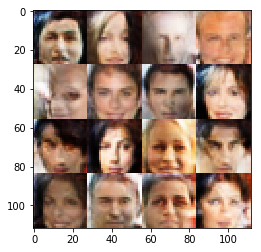

Timestamp 20170805-04-33-00.098 -  Epoch 1/1 -  Step 19710 -  D Loss: 0.9216 - G Loss: 1.6385
Timestamp 20170805-04-33-07.477 -  Epoch 1/1 -  Step 19720 -  D Loss: 0.6311 - G Loss: 1.3950
Timestamp 20170805-04-33-14.804 -  Epoch 1/1 -  Step 19730 -  D Loss: 0.7536 - G Loss: 1.2354
Timestamp 20170805-04-33-22.281 -  Epoch 1/1 -  Step 19740 -  D Loss: 0.9106 - G Loss: 1.6096
Timestamp 20170805-04-33-29.745 -  Epoch 1/1 -  Step 19750 -  D Loss: 0.8955 - G Loss: 1.6121
Timestamp 20170805-04-33-37.196 -  Epoch 1/1 -  Step 19760 -  D Loss: 0.8411 - G Loss: 0.8459
Timestamp 20170805-04-33-44.595 -  Epoch 1/1 -  Step 19770 -  D Loss: 0.7703 - G Loss: 1.2619
Timestamp 20170805-04-33-52.046 -  Epoch 1/1 -  Step 19780 -  D Loss: 0.8127 - G Loss: 2.1364
Timestamp 20170805-04-33-59.468 -  Epoch 1/1 -  Step 19790 -  D Loss: 0.7843 - G Loss: 1.5833
Timestamp 20170805-04-34-06.832 -  Epoch 1/1 -  Step 19800 -  D Loss: 1.0092 - G Loss: 0.8851


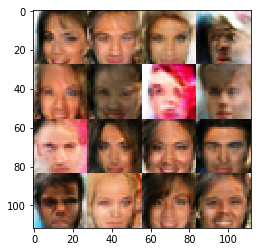

Timestamp 20170805-04-34-14.982 -  Epoch 1/1 -  Step 19810 -  D Loss: 1.3374 - G Loss: 2.2563
Timestamp 20170805-04-34-22.686 -  Epoch 1/1 -  Step 19820 -  D Loss: 0.9284 - G Loss: 1.3724
Timestamp 20170805-04-34-30.057 -  Epoch 1/1 -  Step 19830 -  D Loss: 0.8092 - G Loss: 1.9898
Timestamp 20170805-04-34-37.488 -  Epoch 1/1 -  Step 19840 -  D Loss: 1.0018 - G Loss: 1.3955
Timestamp 20170805-04-34-44.949 -  Epoch 1/1 -  Step 19850 -  D Loss: 0.8529 - G Loss: 1.1810
Timestamp 20170805-04-34-52.428 -  Epoch 1/1 -  Step 19860 -  D Loss: 1.1110 - G Loss: 1.2600
Timestamp 20170805-04-34-59.815 -  Epoch 1/1 -  Step 19870 -  D Loss: 0.6254 - G Loss: 0.8493
Timestamp 20170805-04-35-07.247 -  Epoch 1/1 -  Step 19880 -  D Loss: 0.9308 - G Loss: 1.0469
Timestamp 20170805-04-35-14.739 -  Epoch 1/1 -  Step 19890 -  D Loss: 1.0671 - G Loss: 1.4687
Timestamp 20170805-04-35-22.161 -  Epoch 1/1 -  Step 19900 -  D Loss: 0.9386 - G Loss: 0.9351


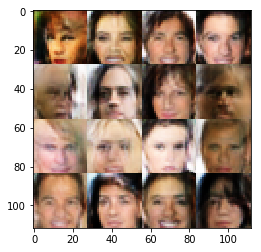

Timestamp 20170805-04-35-30.365 -  Epoch 1/1 -  Step 19910 -  D Loss: 1.0810 - G Loss: 1.4176
Timestamp 20170805-04-35-37.788 -  Epoch 1/1 -  Step 19920 -  D Loss: 1.0003 - G Loss: 1.3191
Timestamp 20170805-04-35-45.256 -  Epoch 1/1 -  Step 19930 -  D Loss: 0.8378 - G Loss: 1.4150
Timestamp 20170805-04-35-52.673 -  Epoch 1/1 -  Step 19940 -  D Loss: 1.2654 - G Loss: 1.0409
Timestamp 20170805-04-36-00.170 -  Epoch 1/1 -  Step 19950 -  D Loss: 1.2791 - G Loss: 0.9530
Timestamp 20170805-04-36-07.620 -  Epoch 1/1 -  Step 19960 -  D Loss: 1.0325 - G Loss: 1.0962
Timestamp 20170805-04-36-15.089 -  Epoch 1/1 -  Step 19970 -  D Loss: 0.7765 - G Loss: 2.0707
Timestamp 20170805-04-36-22.571 -  Epoch 1/1 -  Step 19980 -  D Loss: 1.0482 - G Loss: 2.2013
Timestamp 20170805-04-36-30.062 -  Epoch 1/1 -  Step 19990 -  D Loss: 0.9543 - G Loss: 1.5584
Timestamp 20170805-04-36-37.468 -  Epoch 1/1 -  Step 20000 -  D Loss: 1.2222 - G Loss: 1.4532


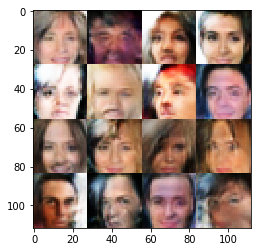

Timestamp 20170805-04-36-45.684 -  Epoch 1/1 -  Step 20010 -  D Loss: 1.3508 - G Loss: 0.9251
Timestamp 20170805-04-36-53.202 -  Epoch 1/1 -  Step 20020 -  D Loss: 1.0540 - G Loss: 1.0876
Timestamp 20170805-04-37-00.591 -  Epoch 1/1 -  Step 20030 -  D Loss: 0.9093 - G Loss: 1.8758
Timestamp 20170805-04-37-08.018 -  Epoch 1/1 -  Step 20040 -  D Loss: 1.1874 - G Loss: 1.3438
Timestamp 20170805-04-37-15.515 -  Epoch 1/1 -  Step 20050 -  D Loss: 1.2918 - G Loss: 0.9138
Timestamp 20170805-04-37-22.926 -  Epoch 1/1 -  Step 20060 -  D Loss: 1.1285 - G Loss: 1.5636
Timestamp 20170805-04-37-30.386 -  Epoch 1/1 -  Step 20070 -  D Loss: 1.4503 - G Loss: 1.4739
Timestamp 20170805-04-37-37.768 -  Epoch 1/1 -  Step 20080 -  D Loss: 1.4869 - G Loss: 1.2862
Timestamp 20170805-04-37-45.231 -  Epoch 1/1 -  Step 20090 -  D Loss: 0.7202 - G Loss: 1.4276
Timestamp 20170805-04-37-52.646 -  Epoch 1/1 -  Step 20100 -  D Loss: 0.7842 - G Loss: 1.3038


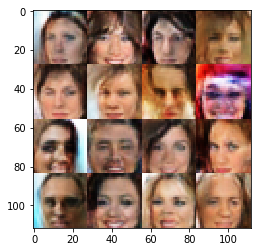

Timestamp 20170805-04-38-00.809 -  Epoch 1/1 -  Step 20110 -  D Loss: 1.1457 - G Loss: 1.4929
Timestamp 20170805-04-38-08.225 -  Epoch 1/1 -  Step 20120 -  D Loss: 0.8369 - G Loss: 1.4306
Timestamp 20170805-04-38-15.678 -  Epoch 1/1 -  Step 20130 -  D Loss: 1.1734 - G Loss: 0.9051
Timestamp 20170805-04-38-23.176 -  Epoch 1/1 -  Step 20140 -  D Loss: 0.9889 - G Loss: 1.9067
Timestamp 20170805-04-38-30.590 -  Epoch 1/1 -  Step 20150 -  D Loss: 0.8052 - G Loss: 1.5711
Timestamp 20170805-04-38-37.942 -  Epoch 1/1 -  Step 20160 -  D Loss: 1.2226 - G Loss: 1.2059
Timestamp 20170805-04-38-45.418 -  Epoch 1/1 -  Step 20170 -  D Loss: 1.1617 - G Loss: 1.1020
Timestamp 20170805-04-38-52.844 -  Epoch 1/1 -  Step 20180 -  D Loss: 0.6514 - G Loss: 1.5714
Timestamp 20170805-04-39-00.365 -  Epoch 1/1 -  Step 20190 -  D Loss: 1.1548 - G Loss: 1.4009
Timestamp 20170805-04-39-07.795 -  Epoch 1/1 -  Step 20200 -  D Loss: 0.9423 - G Loss: 1.5051


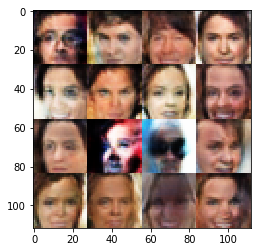

Timestamp 20170805-04-39-15.920 -  Epoch 1/1 -  Step 20210 -  D Loss: 0.6909 - G Loss: 1.1350
Timestamp 20170805-04-39-23.427 -  Epoch 1/1 -  Step 20220 -  D Loss: 0.8593 - G Loss: 1.3413
Timestamp 20170805-04-39-30.867 -  Epoch 1/1 -  Step 20230 -  D Loss: 1.1905 - G Loss: 0.8263
Timestamp 20170805-04-39-38.279 -  Epoch 1/1 -  Step 20240 -  D Loss: 0.7893 - G Loss: 1.8087
Timestamp 20170805-04-39-45.698 -  Epoch 1/1 -  Step 20250 -  D Loss: 0.7296 - G Loss: 1.3360
Timestamp 20170805-04-39-53.118 -  Epoch 1/1 -  Step 20260 -  D Loss: 0.7100 - G Loss: 1.4161
Timestamp 20170805-04-40-00.597 -  Epoch 1/1 -  Step 20270 -  D Loss: 0.9325 - G Loss: 0.9440
Timestamp 20170805-04-40-08.049 -  Epoch 1/1 -  Step 20280 -  D Loss: 1.7020 - G Loss: 0.5871
Timestamp 20170805-04-40-15.459 -  Epoch 1/1 -  Step 20290 -  D Loss: 0.9485 - G Loss: 1.5748
Timestamp 20170805-04-40-22.853 -  Epoch 1/1 -  Step 20300 -  D Loss: 0.6117 - G Loss: 1.2884


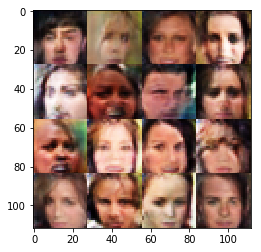

Timestamp 20170805-04-40-31.084 -  Epoch 1/1 -  Step 20310 -  D Loss: 0.7896 - G Loss: 1.4615
Timestamp 20170805-04-40-38.566 -  Epoch 1/1 -  Step 20320 -  D Loss: 1.1858 - G Loss: 2.3636
Timestamp 20170805-04-40-46.098 -  Epoch 1/1 -  Step 20330 -  D Loss: 1.3812 - G Loss: 0.8569
Timestamp 20170805-04-40-53.647 -  Epoch 1/1 -  Step 20340 -  D Loss: 0.9555 - G Loss: 1.3540
Timestamp 20170805-04-41-01.120 -  Epoch 1/1 -  Step 20350 -  D Loss: 1.1245 - G Loss: 0.4290
Timestamp 20170805-04-41-08.542 -  Epoch 1/1 -  Step 20360 -  D Loss: 1.1225 - G Loss: 1.5691
Timestamp 20170805-04-41-15.866 -  Epoch 1/1 -  Step 20370 -  D Loss: 0.9626 - G Loss: 0.8685
Timestamp 20170805-04-41-23.302 -  Epoch 1/1 -  Step 20380 -  D Loss: 1.0642 - G Loss: 1.1579
Timestamp 20170805-04-41-30.795 -  Epoch 1/1 -  Step 20390 -  D Loss: 1.2714 - G Loss: 2.0059
Timestamp 20170805-04-41-38.218 -  Epoch 1/1 -  Step 20400 -  D Loss: 1.0609 - G Loss: 0.9956


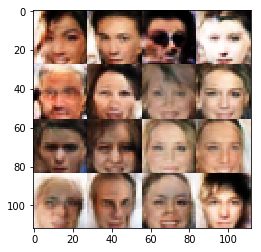

Timestamp 20170805-04-41-46.368 -  Epoch 1/1 -  Step 20410 -  D Loss: 1.1897 - G Loss: 0.5914
Timestamp 20170805-04-41-53.752 -  Epoch 1/1 -  Step 20420 -  D Loss: 1.0612 - G Loss: 0.8310
Timestamp 20170805-04-42-01.164 -  Epoch 1/1 -  Step 20430 -  D Loss: 1.3833 - G Loss: 1.9138
Timestamp 20170805-04-42-08.524 -  Epoch 1/1 -  Step 20440 -  D Loss: 1.0183 - G Loss: 1.2155
Timestamp 20170805-04-42-16.045 -  Epoch 1/1 -  Step 20450 -  D Loss: 1.0521 - G Loss: 1.1242
Timestamp 20170805-04-42-23.638 -  Epoch 1/1 -  Step 20460 -  D Loss: 1.0766 - G Loss: 0.5542
Timestamp 20170805-04-42-31.372 -  Epoch 1/1 -  Step 20470 -  D Loss: 1.4252 - G Loss: 1.2741
Timestamp 20170805-04-42-38.994 -  Epoch 1/1 -  Step 20480 -  D Loss: 1.1730 - G Loss: 0.8904
Timestamp 20170805-04-42-46.576 -  Epoch 1/1 -  Step 20490 -  D Loss: 1.2501 - G Loss: 0.6250
Timestamp 20170805-04-42-54.406 -  Epoch 1/1 -  Step 20500 -  D Loss: 0.7883 - G Loss: 1.8808


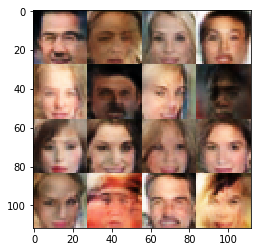

Timestamp 20170805-04-43-02.906 -  Epoch 1/1 -  Step 20510 -  D Loss: 0.8499 - G Loss: 1.9141
Timestamp 20170805-04-43-10.582 -  Epoch 1/1 -  Step 20520 -  D Loss: 1.3325 - G Loss: 1.4893
Timestamp 20170805-04-43-18.288 -  Epoch 1/1 -  Step 20530 -  D Loss: 0.9166 - G Loss: 1.4983
Timestamp 20170805-04-43-26.056 -  Epoch 1/1 -  Step 20540 -  D Loss: 0.8995 - G Loss: 1.5291
Timestamp 20170805-04-43-33.777 -  Epoch 1/1 -  Step 20550 -  D Loss: 0.8246 - G Loss: 1.5429
Timestamp 20170805-04-43-41.537 -  Epoch 1/1 -  Step 20560 -  D Loss: 1.1080 - G Loss: 1.7669
Timestamp 20170805-04-43-49.225 -  Epoch 1/1 -  Step 20570 -  D Loss: 1.1514 - G Loss: 1.7420
Timestamp 20170805-04-43-56.989 -  Epoch 1/1 -  Step 20580 -  D Loss: 0.6199 - G Loss: 1.3609
Timestamp 20170805-04-44-04.587 -  Epoch 1/1 -  Step 20590 -  D Loss: 1.0022 - G Loss: 0.9918
Timestamp 20170805-04-44-12.459 -  Epoch 1/1 -  Step 20600 -  D Loss: 0.8793 - G Loss: 1.2467


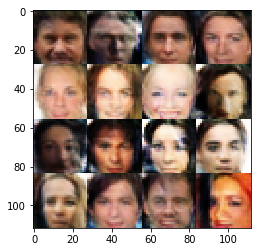

Timestamp 20170805-04-44-21.227 -  Epoch 1/1 -  Step 20610 -  D Loss: 0.9024 - G Loss: 1.1828
Timestamp 20170805-04-44-28.950 -  Epoch 1/1 -  Step 20620 -  D Loss: 1.0481 - G Loss: 1.8266
Timestamp 20170805-04-44-36.664 -  Epoch 1/1 -  Step 20630 -  D Loss: 1.1818 - G Loss: 1.1568
Timestamp 20170805-04-44-44.558 -  Epoch 1/1 -  Step 20640 -  D Loss: 1.2450 - G Loss: 0.6773
Timestamp 20170805-04-44-52.486 -  Epoch 1/1 -  Step 20650 -  D Loss: 0.9265 - G Loss: 1.8272
Timestamp 20170805-04-45-00.165 -  Epoch 1/1 -  Step 20660 -  D Loss: 1.4494 - G Loss: 1.4110
Timestamp 20170805-04-45-07.923 -  Epoch 1/1 -  Step 20670 -  D Loss: 1.2821 - G Loss: 1.4555
Timestamp 20170805-04-45-15.785 -  Epoch 1/1 -  Step 20680 -  D Loss: 0.8734 - G Loss: 1.7573
Timestamp 20170805-04-45-23.609 -  Epoch 1/1 -  Step 20690 -  D Loss: 0.9843 - G Loss: 1.4533
Timestamp 20170805-04-45-31.366 -  Epoch 1/1 -  Step 20700 -  D Loss: 0.9620 - G Loss: 0.7364


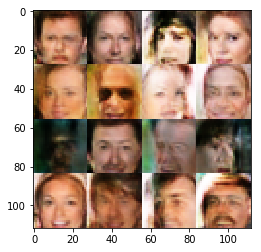

Timestamp 20170805-04-45-40.022 -  Epoch 1/1 -  Step 20710 -  D Loss: 1.5935 - G Loss: 1.6713
Timestamp 20170805-04-45-47.826 -  Epoch 1/1 -  Step 20720 -  D Loss: 0.6547 - G Loss: 1.8555
Timestamp 20170805-04-45-55.703 -  Epoch 1/1 -  Step 20730 -  D Loss: 0.8807 - G Loss: 1.8160
Timestamp 20170805-04-46-03.455 -  Epoch 1/1 -  Step 20740 -  D Loss: 0.7539 - G Loss: 1.4190
Timestamp 20170805-04-46-11.178 -  Epoch 1/1 -  Step 20750 -  D Loss: 0.9689 - G Loss: 1.7895
Timestamp 20170805-04-46-18.947 -  Epoch 1/1 -  Step 20760 -  D Loss: 1.1461 - G Loss: 1.3896
Timestamp 20170805-04-46-26.860 -  Epoch 1/1 -  Step 20770 -  D Loss: 1.3243 - G Loss: 1.2685
Timestamp 20170805-04-46-34.792 -  Epoch 1/1 -  Step 20780 -  D Loss: 0.8654 - G Loss: 1.1611
Timestamp 20170805-04-46-42.536 -  Epoch 1/1 -  Step 20790 -  D Loss: 0.9663 - G Loss: 1.9132
Timestamp 20170805-04-46-50.293 -  Epoch 1/1 -  Step 20800 -  D Loss: 0.7929 - G Loss: 1.2378


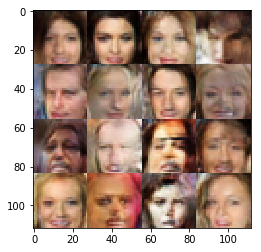

Timestamp 20170805-04-46-58.816 -  Epoch 1/1 -  Step 20810 -  D Loss: 1.3064 - G Loss: 1.1365
Timestamp 20170805-04-47-06.747 -  Epoch 1/1 -  Step 20820 -  D Loss: 0.8149 - G Loss: 1.8166
Timestamp 20170805-04-47-14.572 -  Epoch 1/1 -  Step 20830 -  D Loss: 1.0228 - G Loss: 2.2282
Timestamp 20170805-04-47-22.362 -  Epoch 1/1 -  Step 20840 -  D Loss: 0.6318 - G Loss: 2.1548
Timestamp 20170805-04-47-30.065 -  Epoch 1/1 -  Step 20850 -  D Loss: 0.8601 - G Loss: 1.5133
Timestamp 20170805-04-47-37.978 -  Epoch 1/1 -  Step 20860 -  D Loss: 1.0969 - G Loss: 0.6347
Timestamp 20170805-04-47-45.763 -  Epoch 1/1 -  Step 20870 -  D Loss: 0.5637 - G Loss: 1.0827
Timestamp 20170805-04-47-53.657 -  Epoch 1/1 -  Step 20880 -  D Loss: 0.7622 - G Loss: 1.8746
Timestamp 20170805-04-48-01.541 -  Epoch 1/1 -  Step 20890 -  D Loss: 1.0273 - G Loss: 0.7402
Timestamp 20170805-04-48-09.352 -  Epoch 1/1 -  Step 20900 -  D Loss: 1.0519 - G Loss: 1.0978


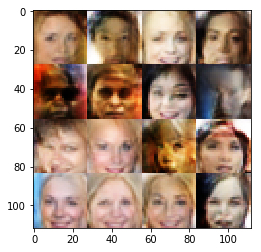

Timestamp 20170805-04-48-18.031 -  Epoch 1/1 -  Step 20910 -  D Loss: 0.5536 - G Loss: 1.8198
Timestamp 20170805-04-48-25.938 -  Epoch 1/1 -  Step 20920 -  D Loss: 0.8089 - G Loss: 2.1691
Timestamp 20170805-04-48-33.796 -  Epoch 1/1 -  Step 20930 -  D Loss: 0.9300 - G Loss: 1.1296
Timestamp 20170805-04-48-41.716 -  Epoch 1/1 -  Step 20940 -  D Loss: 1.1776 - G Loss: 1.2466
Timestamp 20170805-04-48-49.626 -  Epoch 1/1 -  Step 20950 -  D Loss: 1.2562 - G Loss: 2.4256
Timestamp 20170805-04-48-57.481 -  Epoch 1/1 -  Step 20960 -  D Loss: 0.9981 - G Loss: 1.7984
Timestamp 20170805-04-49-05.290 -  Epoch 1/1 -  Step 20970 -  D Loss: 0.6392 - G Loss: 1.5186
Timestamp 20170805-04-49-13.147 -  Epoch 1/1 -  Step 20980 -  D Loss: 0.8880 - G Loss: 1.5687
Timestamp 20170805-04-49-21.472 -  Epoch 1/1 -  Step 20990 -  D Loss: 1.1042 - G Loss: 1.7824
Timestamp 20170805-04-49-29.390 -  Epoch 1/1 -  Step 21000 -  D Loss: 1.1660 - G Loss: 1.1610


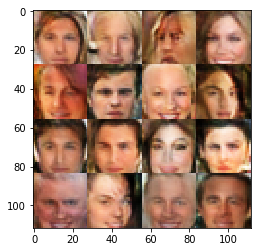

Timestamp 20170805-04-49-38.118 -  Epoch 1/1 -  Step 21010 -  D Loss: 1.0271 - G Loss: 1.2742
Timestamp 20170805-04-49-45.899 -  Epoch 1/1 -  Step 21020 -  D Loss: 1.0527 - G Loss: 0.8231
Timestamp 20170805-04-49-53.761 -  Epoch 1/1 -  Step 21030 -  D Loss: 1.1335 - G Loss: 1.6580
Timestamp 20170805-04-50-01.625 -  Epoch 1/1 -  Step 21040 -  D Loss: 1.0602 - G Loss: 1.4210
Timestamp 20170805-04-50-09.568 -  Epoch 1/1 -  Step 21050 -  D Loss: 1.2059 - G Loss: 1.3855
Timestamp 20170805-04-50-17.562 -  Epoch 1/1 -  Step 21060 -  D Loss: 1.2313 - G Loss: 1.9745
Timestamp 20170805-04-50-25.674 -  Epoch 1/1 -  Step 21070 -  D Loss: 0.9778 - G Loss: 1.2959
Timestamp 20170805-04-50-33.694 -  Epoch 1/1 -  Step 21080 -  D Loss: 1.1821 - G Loss: 1.5582
Timestamp 20170805-04-50-41.767 -  Epoch 1/1 -  Step 21090 -  D Loss: 0.8687 - G Loss: 1.3546
Timestamp 20170805-04-50-49.738 -  Epoch 1/1 -  Step 21100 -  D Loss: 0.8987 - G Loss: 1.6577


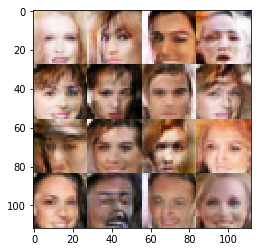

Timestamp 20170805-04-50-58.487 -  Epoch 1/1 -  Step 21110 -  D Loss: 0.7135 - G Loss: 1.8492
Timestamp 20170805-04-51-06.405 -  Epoch 1/1 -  Step 21120 -  D Loss: 1.1323 - G Loss: 1.0939
Timestamp 20170805-04-51-14.399 -  Epoch 1/1 -  Step 21130 -  D Loss: 1.3519 - G Loss: 1.6107
Timestamp 20170805-04-51-22.212 -  Epoch 1/1 -  Step 21140 -  D Loss: 0.9846 - G Loss: 1.6351
Timestamp 20170805-04-51-29.850 -  Epoch 1/1 -  Step 21150 -  D Loss: 1.0094 - G Loss: 1.6277
Timestamp 20170805-04-51-37.607 -  Epoch 1/1 -  Step 21160 -  D Loss: 0.7437 - G Loss: 1.8507
Timestamp 20170805-04-51-45.286 -  Epoch 1/1 -  Step 21170 -  D Loss: 0.7090 - G Loss: 0.8366
Timestamp 20170805-04-51-53.011 -  Epoch 1/1 -  Step 21180 -  D Loss: 0.9855 - G Loss: 0.7754
Timestamp 20170805-04-52-00.742 -  Epoch 1/1 -  Step 21190 -  D Loss: 1.9476 - G Loss: 0.8355
Timestamp 20170805-04-52-08.420 -  Epoch 1/1 -  Step 21200 -  D Loss: 1.5065 - G Loss: 1.6277


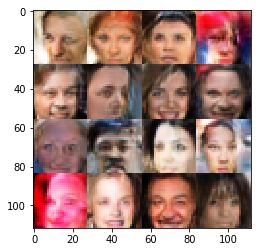

Timestamp 20170805-04-52-16.889 -  Epoch 1/1 -  Step 21210 -  D Loss: 1.2334 - G Loss: 1.4522
Timestamp 20170805-04-52-24.607 -  Epoch 1/1 -  Step 21220 -  D Loss: 0.9663 - G Loss: 1.0579
Timestamp 20170805-04-52-32.450 -  Epoch 1/1 -  Step 21230 -  D Loss: 1.0215 - G Loss: 1.3170
Timestamp 20170805-04-52-41.201 -  Epoch 1/1 -  Step 21240 -  D Loss: 0.9844 - G Loss: 0.8857
Timestamp 20170805-04-52-49.201 -  Epoch 1/1 -  Step 21250 -  D Loss: 0.9595 - G Loss: 1.0531
Timestamp 20170805-04-52-56.693 -  Epoch 1/1 -  Step 21260 -  D Loss: 1.1668 - G Loss: 1.9041
Timestamp 20170805-04-53-04.453 -  Epoch 1/1 -  Step 21270 -  D Loss: 1.5293 - G Loss: 0.7255
Timestamp 20170805-04-53-12.144 -  Epoch 1/1 -  Step 21280 -  D Loss: 1.1300 - G Loss: 1.2292
Timestamp 20170805-04-53-19.817 -  Epoch 1/1 -  Step 21290 -  D Loss: 0.9819 - G Loss: 1.7875
Timestamp 20170805-04-53-27.259 -  Epoch 1/1 -  Step 21300 -  D Loss: 0.8591 - G Loss: 0.8199


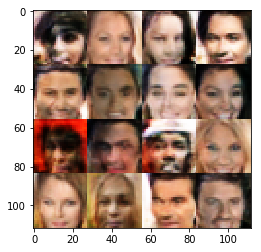

Timestamp 20170805-04-53-35.581 -  Epoch 1/1 -  Step 21310 -  D Loss: 0.6530 - G Loss: 1.5932
Timestamp 20170805-04-53-42.988 -  Epoch 1/1 -  Step 21320 -  D Loss: 0.8803 - G Loss: 1.0864
Timestamp 20170805-04-53-50.509 -  Epoch 1/1 -  Step 21330 -  D Loss: 1.1210 - G Loss: 2.3745
Timestamp 20170805-04-53-58.102 -  Epoch 1/1 -  Step 21340 -  D Loss: 1.1601 - G Loss: 1.3061
Timestamp 20170805-04-54-05.706 -  Epoch 1/1 -  Step 21350 -  D Loss: 1.3022 - G Loss: 0.8594
Timestamp 20170805-04-54-13.325 -  Epoch 1/1 -  Step 21360 -  D Loss: 0.8441 - G Loss: 0.7138
Timestamp 20170805-04-54-21.280 -  Epoch 1/1 -  Step 21370 -  D Loss: 1.4603 - G Loss: 0.9266
Timestamp 20170805-04-54-28.936 -  Epoch 1/1 -  Step 21380 -  D Loss: 0.7211 - G Loss: 1.3283
Timestamp 20170805-04-54-36.594 -  Epoch 1/1 -  Step 21390 -  D Loss: 1.0730 - G Loss: 1.8469
Timestamp 20170805-04-54-44.133 -  Epoch 1/1 -  Step 21400 -  D Loss: 1.1052 - G Loss: 0.9792


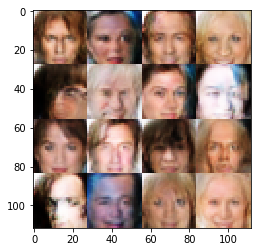

Timestamp 20170805-04-54-52.444 -  Epoch 1/1 -  Step 21410 -  D Loss: 0.8950 - G Loss: 1.1668
Timestamp 20170805-04-55-00.010 -  Epoch 1/1 -  Step 21420 -  D Loss: 0.9549 - G Loss: 1.0704
Timestamp 20170805-04-55-07.720 -  Epoch 1/1 -  Step 21430 -  D Loss: 1.2217 - G Loss: 1.2541
Timestamp 20170805-04-55-15.366 -  Epoch 1/1 -  Step 21440 -  D Loss: 1.1080 - G Loss: 1.1448
Timestamp 20170805-04-55-23.000 -  Epoch 1/1 -  Step 21450 -  D Loss: 1.5756 - G Loss: 0.9287
Timestamp 20170805-04-55-30.550 -  Epoch 1/1 -  Step 21460 -  D Loss: 0.7441 - G Loss: 1.4081
Timestamp 20170805-04-55-38.582 -  Epoch 1/1 -  Step 21470 -  D Loss: 1.1020 - G Loss: 1.1528
Timestamp 20170805-04-55-46.368 -  Epoch 1/1 -  Step 21480 -  D Loss: 0.7742 - G Loss: 1.3590
Timestamp 20170805-04-55-54.028 -  Epoch 1/1 -  Step 21490 -  D Loss: 0.8728 - G Loss: 1.5929
Timestamp 20170805-04-56-01.816 -  Epoch 1/1 -  Step 21500 -  D Loss: 0.9547 - G Loss: 1.4256


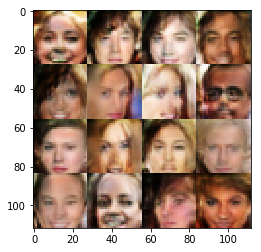

Timestamp 20170805-04-56-10.275 -  Epoch 1/1 -  Step 21510 -  D Loss: 0.6736 - G Loss: 1.3916
Timestamp 20170805-04-56-17.977 -  Epoch 1/1 -  Step 21520 -  D Loss: 1.0352 - G Loss: 1.5365
Timestamp 20170805-04-56-25.724 -  Epoch 1/1 -  Step 21530 -  D Loss: 0.9179 - G Loss: 1.4766
Timestamp 20170805-04-56-33.416 -  Epoch 1/1 -  Step 21540 -  D Loss: 1.0539 - G Loss: 0.6832
Timestamp 20170805-04-56-41.170 -  Epoch 1/1 -  Step 21550 -  D Loss: 0.7943 - G Loss: 1.2129
Timestamp 20170805-04-56-48.988 -  Epoch 1/1 -  Step 21560 -  D Loss: 1.0757 - G Loss: 1.0049
Timestamp 20170805-04-56-56.679 -  Epoch 1/1 -  Step 21570 -  D Loss: 0.8783 - G Loss: 1.1052
Timestamp 20170805-04-57-04.378 -  Epoch 1/1 -  Step 21580 -  D Loss: 1.0037 - G Loss: 1.9113
Timestamp 20170805-04-57-12.159 -  Epoch 1/1 -  Step 21590 -  D Loss: 0.9416 - G Loss: 2.4530
Timestamp 20170805-04-57-20.136 -  Epoch 1/1 -  Step 21600 -  D Loss: 0.8862 - G Loss: 1.3210


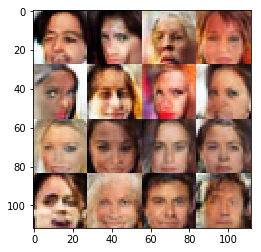

Timestamp 20170805-04-57-28.609 -  Epoch 1/1 -  Step 21610 -  D Loss: 0.9451 - G Loss: 1.7528
Timestamp 20170805-04-57-36.410 -  Epoch 1/1 -  Step 21620 -  D Loss: 0.9098 - G Loss: 1.4981
Timestamp 20170805-04-57-44.339 -  Epoch 1/1 -  Step 21630 -  D Loss: 1.1987 - G Loss: 0.5171
Timestamp 20170805-04-57-52.242 -  Epoch 1/1 -  Step 21640 -  D Loss: 0.6453 - G Loss: 0.7728
Timestamp 20170805-04-58-00.027 -  Epoch 1/1 -  Step 21650 -  D Loss: 1.0505 - G Loss: 0.7953
Timestamp 20170805-04-58-08.071 -  Epoch 1/1 -  Step 21660 -  D Loss: 0.9898 - G Loss: 0.9056
Timestamp 20170805-04-58-15.946 -  Epoch 1/1 -  Step 21670 -  D Loss: 0.9464 - G Loss: 0.5448
Timestamp 20170805-04-58-23.834 -  Epoch 1/1 -  Step 21680 -  D Loss: 0.9452 - G Loss: 1.3518
Timestamp 20170805-04-58-31.527 -  Epoch 1/1 -  Step 21690 -  D Loss: 0.8636 - G Loss: 0.6556
Timestamp 20170805-04-58-39.308 -  Epoch 1/1 -  Step 21700 -  D Loss: 1.2066 - G Loss: 1.7254


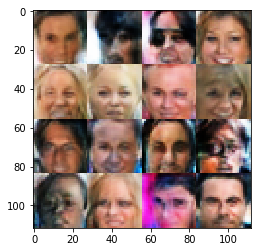

Timestamp 20170805-04-58-47.962 -  Epoch 1/1 -  Step 21710 -  D Loss: 0.7142 - G Loss: 1.5757
Timestamp 20170805-04-58-55.727 -  Epoch 1/1 -  Step 21720 -  D Loss: 1.0430 - G Loss: 1.0793
Timestamp 20170805-04-59-03.381 -  Epoch 1/1 -  Step 21730 -  D Loss: 0.7953 - G Loss: 1.8833
Timestamp 20170805-04-59-11.252 -  Epoch 1/1 -  Step 21740 -  D Loss: 1.0774 - G Loss: 1.0535
Timestamp 20170805-04-59-19.093 -  Epoch 1/1 -  Step 21750 -  D Loss: 0.9731 - G Loss: 1.0287
Timestamp 20170805-04-59-26.945 -  Epoch 1/1 -  Step 21760 -  D Loss: 1.0823 - G Loss: 1.2348
Timestamp 20170805-04-59-34.857 -  Epoch 1/1 -  Step 21770 -  D Loss: 1.1653 - G Loss: 1.5700
Timestamp 20170805-04-59-42.748 -  Epoch 1/1 -  Step 21780 -  D Loss: 0.8181 - G Loss: 1.5409
Timestamp 20170805-04-59-50.517 -  Epoch 1/1 -  Step 21790 -  D Loss: 0.7862 - G Loss: 1.8658
Timestamp 20170805-04-59-58.206 -  Epoch 1/1 -  Step 21800 -  D Loss: 0.9744 - G Loss: 1.0958


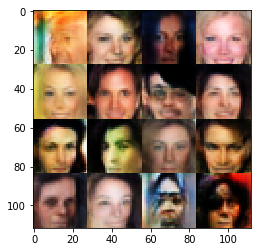

Timestamp 20170805-05-00-06.771 -  Epoch 1/1 -  Step 21810 -  D Loss: 1.2108 - G Loss: 0.9201
Timestamp 20170805-05-00-14.360 -  Epoch 1/1 -  Step 21820 -  D Loss: 0.7054 - G Loss: 1.4392
Timestamp 20170805-05-00-21.815 -  Epoch 1/1 -  Step 21830 -  D Loss: 0.8632 - G Loss: 1.1129
Timestamp 20170805-05-00-29.274 -  Epoch 1/1 -  Step 21840 -  D Loss: 2.1765 - G Loss: 0.7140
Timestamp 20170805-05-00-36.941 -  Epoch 1/1 -  Step 21850 -  D Loss: 0.9524 - G Loss: 1.3668
Timestamp 20170805-05-00-44.897 -  Epoch 1/1 -  Step 21860 -  D Loss: 1.4522 - G Loss: 1.3419
Timestamp 20170805-05-00-52.721 -  Epoch 1/1 -  Step 21870 -  D Loss: 0.6901 - G Loss: 1.8059
Timestamp 20170805-05-01-00.286 -  Epoch 1/1 -  Step 21880 -  D Loss: 1.0033 - G Loss: 1.0563
Timestamp 20170805-05-01-08.048 -  Epoch 1/1 -  Step 21890 -  D Loss: 0.8076 - G Loss: 1.2787
Timestamp 20170805-05-01-15.890 -  Epoch 1/1 -  Step 21900 -  D Loss: 1.2280 - G Loss: 1.3858


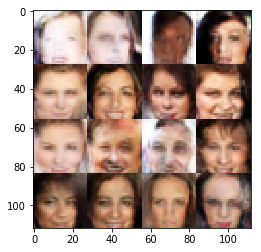

Timestamp 20170805-05-01-24.445 -  Epoch 1/1 -  Step 21910 -  D Loss: 0.7861 - G Loss: 1.6558
Timestamp 20170805-05-01-32.140 -  Epoch 1/1 -  Step 21920 -  D Loss: 0.9070 - G Loss: 1.3733
Timestamp 20170805-05-01-39.710 -  Epoch 1/1 -  Step 21930 -  D Loss: 1.5841 - G Loss: 1.1656
Timestamp 20170805-05-01-47.309 -  Epoch 1/1 -  Step 21940 -  D Loss: 0.5366 - G Loss: 2.1918
Timestamp 20170805-05-01-54.766 -  Epoch 1/1 -  Step 21950 -  D Loss: 0.8580 - G Loss: 2.1512
Timestamp 20170805-05-02-02.364 -  Epoch 1/1 -  Step 21960 -  D Loss: 0.7944 - G Loss: 1.3648
Timestamp 20170805-05-02-09.864 -  Epoch 1/1 -  Step 21970 -  D Loss: 1.3301 - G Loss: 1.3271
Timestamp 20170805-05-02-17.419 -  Epoch 1/1 -  Step 21980 -  D Loss: 1.0671 - G Loss: 1.7779
Timestamp 20170805-05-02-24.947 -  Epoch 1/1 -  Step 21990 -  D Loss: 0.8565 - G Loss: 0.9714
Timestamp 20170805-05-02-32.656 -  Epoch 1/1 -  Step 22000 -  D Loss: 1.4952 - G Loss: 0.6811


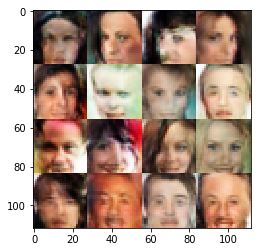

Timestamp 20170805-05-02-41.231 -  Epoch 1/1 -  Step 22010 -  D Loss: 0.8219 - G Loss: 1.2446
Timestamp 20170805-05-02-48.786 -  Epoch 1/1 -  Step 22020 -  D Loss: 1.4369 - G Loss: 0.7659
Timestamp 20170805-05-02-56.562 -  Epoch 1/1 -  Step 22030 -  D Loss: 1.0012 - G Loss: 0.6168
Timestamp 20170805-05-03-04.146 -  Epoch 1/1 -  Step 22040 -  D Loss: 1.4358 - G Loss: 0.5481
Timestamp 20170805-05-03-11.592 -  Epoch 1/1 -  Step 22050 -  D Loss: 0.9215 - G Loss: 1.2473
Timestamp 20170805-05-03-19.274 -  Epoch 1/1 -  Step 22060 -  D Loss: 0.6434 - G Loss: 1.6481
Timestamp 20170805-05-03-26.943 -  Epoch 1/1 -  Step 22070 -  D Loss: 0.8847 - G Loss: 1.4016
Timestamp 20170805-05-03-34.490 -  Epoch 1/1 -  Step 22080 -  D Loss: 0.8440 - G Loss: 1.2099
Timestamp 20170805-05-03-42.049 -  Epoch 1/1 -  Step 22090 -  D Loss: 1.3055 - G Loss: 0.6094
Timestamp 20170805-05-03-49.647 -  Epoch 1/1 -  Step 22100 -  D Loss: 0.7415 - G Loss: 1.4763


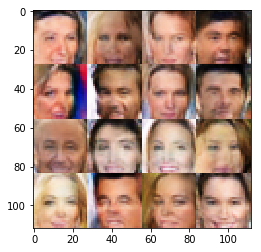

Timestamp 20170805-05-03-58.313 -  Epoch 1/1 -  Step 22110 -  D Loss: 0.7937 - G Loss: 1.3394
Timestamp 20170805-05-04-06.038 -  Epoch 1/1 -  Step 22120 -  D Loss: 0.8656 - G Loss: 1.2424
Timestamp 20170805-05-04-13.786 -  Epoch 1/1 -  Step 22130 -  D Loss: 1.6209 - G Loss: 0.6357
Timestamp 20170805-05-04-21.790 -  Epoch 1/1 -  Step 22140 -  D Loss: 0.9615 - G Loss: 1.9473
Timestamp 20170805-05-04-29.461 -  Epoch 1/1 -  Step 22150 -  D Loss: 1.0101 - G Loss: 1.7796
Timestamp 20170805-05-04-37.268 -  Epoch 1/1 -  Step 22160 -  D Loss: 1.1918 - G Loss: 0.9482
Timestamp 20170805-05-04-45.012 -  Epoch 1/1 -  Step 22170 -  D Loss: 1.1364 - G Loss: 0.8721
Timestamp 20170805-05-04-52.745 -  Epoch 1/1 -  Step 22180 -  D Loss: 0.7221 - G Loss: 2.3547
Timestamp 20170805-05-05-00.504 -  Epoch 1/1 -  Step 22190 -  D Loss: 1.1092 - G Loss: 1.2645
Timestamp 20170805-05-05-08.351 -  Epoch 1/1 -  Step 22200 -  D Loss: 0.5499 - G Loss: 1.5484


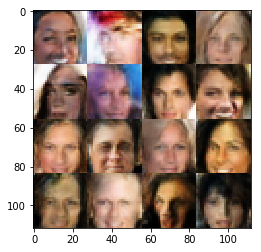

Timestamp 20170805-05-05-16.888 -  Epoch 1/1 -  Step 22210 -  D Loss: 1.3784 - G Loss: 1.0837
Timestamp 20170805-05-05-24.707 -  Epoch 1/1 -  Step 22220 -  D Loss: 1.0657 - G Loss: 1.6689
Timestamp 20170805-05-05-32.321 -  Epoch 1/1 -  Step 22230 -  D Loss: 1.1350 - G Loss: 1.4693
Timestamp 20170805-05-05-40.002 -  Epoch 1/1 -  Step 22240 -  D Loss: 1.0332 - G Loss: 1.0085
Timestamp 20170805-05-05-47.715 -  Epoch 1/1 -  Step 22250 -  D Loss: 1.1752 - G Loss: 0.7928
Timestamp 20170805-05-05-55.459 -  Epoch 1/1 -  Step 22260 -  D Loss: 1.0208 - G Loss: 0.9466
Timestamp 20170805-05-06-03.228 -  Epoch 1/1 -  Step 22270 -  D Loss: 0.7325 - G Loss: 1.0211
Timestamp 20170805-05-06-10.779 -  Epoch 1/1 -  Step 22280 -  D Loss: 0.9550 - G Loss: 1.0634
Timestamp 20170805-05-06-18.651 -  Epoch 1/1 -  Step 22290 -  D Loss: 0.8215 - G Loss: 1.2286
Timestamp 20170805-05-06-26.178 -  Epoch 1/1 -  Step 22300 -  D Loss: 1.1329 - G Loss: 0.9085


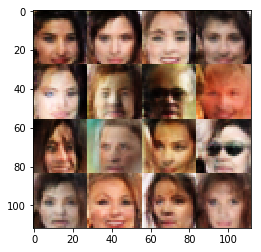

Timestamp 20170805-05-06-34.412 -  Epoch 1/1 -  Step 22310 -  D Loss: 0.9490 - G Loss: 0.8125
Timestamp 20170805-05-06-41.932 -  Epoch 1/1 -  Step 22320 -  D Loss: 0.8013 - G Loss: 1.9243
Timestamp 20170805-05-06-49.486 -  Epoch 1/1 -  Step 22330 -  D Loss: 0.8924 - G Loss: 1.6571
Timestamp 20170805-05-06-57.008 -  Epoch 1/1 -  Step 22340 -  D Loss: 1.0455 - G Loss: 3.0813
Timestamp 20170805-05-07-04.532 -  Epoch 1/1 -  Step 22350 -  D Loss: 1.1405 - G Loss: 1.2669
Timestamp 20170805-05-07-12.154 -  Epoch 1/1 -  Step 22360 -  D Loss: 0.7247 - G Loss: 1.5162
Timestamp 20170805-05-07-19.742 -  Epoch 1/1 -  Step 22370 -  D Loss: 1.0159 - G Loss: 1.6397
Timestamp 20170805-05-07-27.638 -  Epoch 1/1 -  Step 22380 -  D Loss: 0.7126 - G Loss: 1.8244
Timestamp 20170805-05-07-35.321 -  Epoch 1/1 -  Step 22390 -  D Loss: 1.0772 - G Loss: 1.7535
Timestamp 20170805-05-07-42.903 -  Epoch 1/1 -  Step 22400 -  D Loss: 0.8245 - G Loss: 0.8381


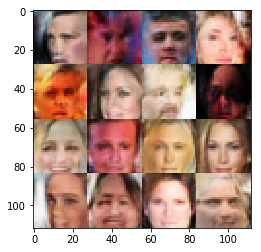

Timestamp 20170805-05-07-51.390 -  Epoch 1/1 -  Step 22410 -  D Loss: 1.0315 - G Loss: 1.1345
Timestamp 20170805-05-07-59.106 -  Epoch 1/1 -  Step 22420 -  D Loss: 1.0251 - G Loss: 1.5238
Timestamp 20170805-05-08-06.762 -  Epoch 1/1 -  Step 22430 -  D Loss: 0.9436 - G Loss: 1.6080
Timestamp 20170805-05-08-14.357 -  Epoch 1/1 -  Step 22440 -  D Loss: 0.7350 - G Loss: 1.1952
Timestamp 20170805-05-08-22.144 -  Epoch 1/1 -  Step 22450 -  D Loss: 0.9755 - G Loss: 2.0348
Timestamp 20170805-05-08-30.117 -  Epoch 1/1 -  Step 22460 -  D Loss: 1.1452 - G Loss: 1.5916
Timestamp 20170805-05-08-37.844 -  Epoch 1/1 -  Step 22470 -  D Loss: 1.0320 - G Loss: 1.0384
Timestamp 20170805-05-08-45.866 -  Epoch 1/1 -  Step 22480 -  D Loss: 0.9563 - G Loss: 0.7179
Timestamp 20170805-05-08-53.447 -  Epoch 1/1 -  Step 22490 -  D Loss: 0.9742 - G Loss: 1.1900
Timestamp 20170805-05-09-01.342 -  Epoch 1/1 -  Step 22500 -  D Loss: 0.9542 - G Loss: 1.4353


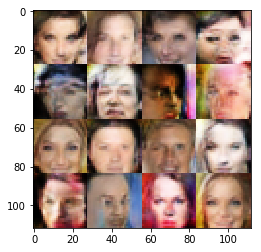

Timestamp 20170805-05-09-09.997 -  Epoch 1/1 -  Step 22510 -  D Loss: 1.0151 - G Loss: 1.2757
Timestamp 20170805-05-09-17.884 -  Epoch 1/1 -  Step 22520 -  D Loss: 0.8400 - G Loss: 1.6625
Timestamp 20170805-05-09-25.363 -  Epoch 1/1 -  Step 22530 -  D Loss: 0.8441 - G Loss: 1.0421
Timestamp 20170805-05-09-33.061 -  Epoch 1/1 -  Step 22540 -  D Loss: 1.2508 - G Loss: 1.1871
Timestamp 20170805-05-09-40.591 -  Epoch 1/1 -  Step 22550 -  D Loss: 1.3129 - G Loss: 0.4949
Timestamp 20170805-05-09-48.139 -  Epoch 1/1 -  Step 22560 -  D Loss: 0.9326 - G Loss: 1.0549
Timestamp 20170805-05-09-55.650 -  Epoch 1/1 -  Step 22570 -  D Loss: 0.7039 - G Loss: 1.7626
Timestamp 20170805-05-10-03.125 -  Epoch 1/1 -  Step 22580 -  D Loss: 1.5136 - G Loss: 0.9968
Timestamp 20170805-05-10-10.907 -  Epoch 1/1 -  Step 22590 -  D Loss: 0.8385 - G Loss: 1.2939
Timestamp 20170805-05-10-18.616 -  Epoch 1/1 -  Step 22600 -  D Loss: 1.0681 - G Loss: 0.8539


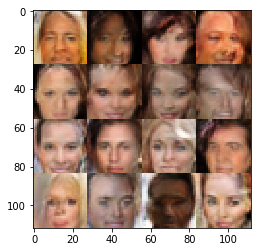

Timestamp 20170805-05-10-27.135 -  Epoch 1/1 -  Step 22610 -  D Loss: 1.4544 - G Loss: 0.7908
Timestamp 20170805-05-10-34.878 -  Epoch 1/1 -  Step 22620 -  D Loss: 1.1489 - G Loss: 1.7681
Timestamp 20170805-05-10-42.481 -  Epoch 1/1 -  Step 22630 -  D Loss: 0.8355 - G Loss: 0.8258
Timestamp 20170805-05-10-50.274 -  Epoch 1/1 -  Step 22640 -  D Loss: 1.0141 - G Loss: 1.3703
Timestamp 20170805-05-10-57.784 -  Epoch 1/1 -  Step 22650 -  D Loss: 0.6830 - G Loss: 1.5708
Timestamp 20170805-05-11-05.203 -  Epoch 1/1 -  Step 22660 -  D Loss: 0.9246 - G Loss: 0.7870
Timestamp 20170805-05-11-12.645 -  Epoch 1/1 -  Step 22670 -  D Loss: 1.0138 - G Loss: 1.5922
Timestamp 20170805-05-11-20.275 -  Epoch 1/1 -  Step 22680 -  D Loss: 0.8082 - G Loss: 1.5559
Timestamp 20170805-05-11-27.959 -  Epoch 1/1 -  Step 22690 -  D Loss: 0.9895 - G Loss: 1.5102
Timestamp 20170805-05-11-35.540 -  Epoch 1/1 -  Step 22700 -  D Loss: 1.0401 - G Loss: 1.8239


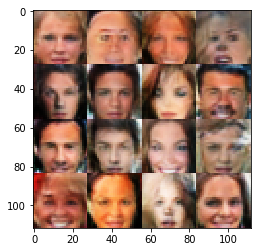

Timestamp 20170805-05-11-43.992 -  Epoch 1/1 -  Step 22710 -  D Loss: 1.0076 - G Loss: 1.1277
Timestamp 20170805-05-11-51.738 -  Epoch 1/1 -  Step 22720 -  D Loss: 0.9752 - G Loss: 1.6013
Timestamp 20170805-05-11-59.258 -  Epoch 1/1 -  Step 22730 -  D Loss: 1.3460 - G Loss: 1.1905
Timestamp 20170805-05-12-06.786 -  Epoch 1/1 -  Step 22740 -  D Loss: 1.4018 - G Loss: 1.2809
Timestamp 20170805-05-12-14.309 -  Epoch 1/1 -  Step 22750 -  D Loss: 0.9370 - G Loss: 1.5293
Timestamp 20170805-05-12-21.848 -  Epoch 1/1 -  Step 22760 -  D Loss: 0.9360 - G Loss: 0.7404
Timestamp 20170805-05-12-29.441 -  Epoch 1/1 -  Step 22770 -  D Loss: 1.0904 - G Loss: 1.0790
Timestamp 20170805-05-12-36.935 -  Epoch 1/1 -  Step 22780 -  D Loss: 0.5912 - G Loss: 2.3158
Timestamp 20170805-05-12-44.521 -  Epoch 1/1 -  Step 22790 -  D Loss: 1.3431 - G Loss: 0.7753
Timestamp 20170805-05-12-51.959 -  Epoch 1/1 -  Step 22800 -  D Loss: 1.0205 - G Loss: 1.5665


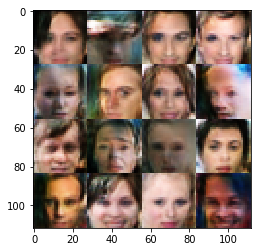

Timestamp 20170805-05-13-00.294 -  Epoch 1/1 -  Step 22810 -  D Loss: 0.8648 - G Loss: 2.2018
Timestamp 20170805-05-13-07.854 -  Epoch 1/1 -  Step 22820 -  D Loss: 1.2065 - G Loss: 0.6883
Timestamp 20170805-05-13-15.236 -  Epoch 1/1 -  Step 22830 -  D Loss: 1.2313 - G Loss: 0.9722
Timestamp 20170805-05-13-22.767 -  Epoch 1/1 -  Step 22840 -  D Loss: 1.2315 - G Loss: 1.6137
Timestamp 20170805-05-13-30.235 -  Epoch 1/1 -  Step 22850 -  D Loss: 0.6734 - G Loss: 1.3347
Timestamp 20170805-05-13-37.727 -  Epoch 1/1 -  Step 22860 -  D Loss: 0.9760 - G Loss: 1.6490
Timestamp 20170805-05-13-45.365 -  Epoch 1/1 -  Step 22870 -  D Loss: 1.0394 - G Loss: 0.9443
Timestamp 20170805-05-13-53.008 -  Epoch 1/1 -  Step 22880 -  D Loss: 0.9120 - G Loss: 1.1523
Timestamp 20170805-05-14-00.790 -  Epoch 1/1 -  Step 22890 -  D Loss: 1.2395 - G Loss: 0.5634
Timestamp 20170805-05-14-08.464 -  Epoch 1/1 -  Step 22900 -  D Loss: 1.2278 - G Loss: 0.9391


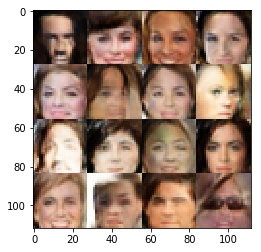

Timestamp 20170805-05-14-17.994 -  Epoch 1/1 -  Step 22910 -  D Loss: 1.1531 - G Loss: 0.9396
Timestamp 20170805-05-14-25.701 -  Epoch 1/1 -  Step 22920 -  D Loss: 0.9894 - G Loss: 1.4664
Timestamp 20170805-05-14-33.361 -  Epoch 1/1 -  Step 22930 -  D Loss: 1.0108 - G Loss: 1.5952
Timestamp 20170805-05-14-41.242 -  Epoch 1/1 -  Step 22940 -  D Loss: 1.4539 - G Loss: 1.6285
Timestamp 20170805-05-14-48.901 -  Epoch 1/1 -  Step 22950 -  D Loss: 0.8711 - G Loss: 1.4105
Timestamp 20170805-05-14-56.435 -  Epoch 1/1 -  Step 22960 -  D Loss: 1.1807 - G Loss: 0.9130
Timestamp 20170805-05-15-04.069 -  Epoch 1/1 -  Step 22970 -  D Loss: 0.8314 - G Loss: 1.8136
Timestamp 20170805-05-15-11.816 -  Epoch 1/1 -  Step 22980 -  D Loss: 0.9386 - G Loss: 2.2352
Timestamp 20170805-05-15-19.322 -  Epoch 1/1 -  Step 22990 -  D Loss: 1.0918 - G Loss: 2.4170
Timestamp 20170805-05-15-26.986 -  Epoch 1/1 -  Step 23000 -  D Loss: 1.2578 - G Loss: 1.6717


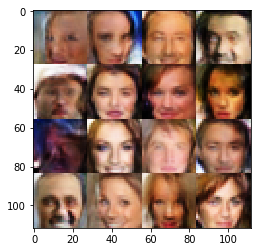

Timestamp 20170805-05-15-35.226 -  Epoch 1/1 -  Step 23010 -  D Loss: 0.7999 - G Loss: 0.6073
Timestamp 20170805-05-15-42.822 -  Epoch 1/1 -  Step 23020 -  D Loss: 0.6963 - G Loss: 1.8157
Timestamp 20170805-05-15-50.325 -  Epoch 1/1 -  Step 23030 -  D Loss: 0.9236 - G Loss: 1.8764
Timestamp 20170805-05-15-57.727 -  Epoch 1/1 -  Step 23040 -  D Loss: 1.1218 - G Loss: 0.9531
Timestamp 20170805-05-16-05.246 -  Epoch 1/1 -  Step 23050 -  D Loss: 1.3400 - G Loss: 0.8983
Timestamp 20170805-05-16-12.735 -  Epoch 1/1 -  Step 23060 -  D Loss: 1.6378 - G Loss: 1.1030
Timestamp 20170805-05-16-20.193 -  Epoch 1/1 -  Step 23070 -  D Loss: 0.6930 - G Loss: 1.2882
Timestamp 20170805-05-16-27.677 -  Epoch 1/1 -  Step 23080 -  D Loss: 0.9815 - G Loss: 0.8539
Timestamp 20170805-05-16-35.144 -  Epoch 1/1 -  Step 23090 -  D Loss: 1.1306 - G Loss: 1.3401
Timestamp 20170805-05-16-42.649 -  Epoch 1/1 -  Step 23100 -  D Loss: 1.1515 - G Loss: 1.1333


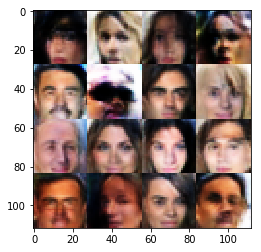

Timestamp 20170805-05-16-50.949 -  Epoch 1/1 -  Step 23110 -  D Loss: 0.6371 - G Loss: 2.1953
Timestamp 20170805-05-16-58.380 -  Epoch 1/1 -  Step 23120 -  D Loss: 0.6243 - G Loss: 2.2418
Timestamp 20170805-05-17-05.729 -  Epoch 1/1 -  Step 23130 -  D Loss: 1.0557 - G Loss: 1.4066
Timestamp 20170805-05-17-13.273 -  Epoch 1/1 -  Step 23140 -  D Loss: 0.9454 - G Loss: 1.8364
Timestamp 20170805-05-17-20.773 -  Epoch 1/1 -  Step 23150 -  D Loss: 1.8647 - G Loss: 1.0713
Timestamp 20170805-05-17-28.212 -  Epoch 1/1 -  Step 23160 -  D Loss: 1.0204 - G Loss: 0.6236
Timestamp 20170805-05-17-35.622 -  Epoch 1/1 -  Step 23170 -  D Loss: 0.6958 - G Loss: 1.1465
Timestamp 20170805-05-17-43.074 -  Epoch 1/1 -  Step 23180 -  D Loss: 0.7665 - G Loss: 1.2240
Timestamp 20170805-05-17-50.581 -  Epoch 1/1 -  Step 23190 -  D Loss: 1.2238 - G Loss: 1.2244
Timestamp 20170805-05-17-58.032 -  Epoch 1/1 -  Step 23200 -  D Loss: 0.8888 - G Loss: 1.3348


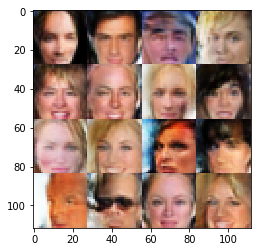

Timestamp 20170805-05-18-06.453 -  Epoch 1/1 -  Step 23210 -  D Loss: 0.8007 - G Loss: 0.9412
Timestamp 20170805-05-18-13.845 -  Epoch 1/1 -  Step 23220 -  D Loss: 1.0332 - G Loss: 0.9182
Timestamp 20170805-05-18-21.391 -  Epoch 1/1 -  Step 23230 -  D Loss: 0.9203 - G Loss: 2.3875
Timestamp 20170805-05-18-28.849 -  Epoch 1/1 -  Step 23240 -  D Loss: 0.8646 - G Loss: 1.4060
Timestamp 20170805-05-18-36.328 -  Epoch 1/1 -  Step 23250 -  D Loss: 1.1698 - G Loss: 1.0447
Timestamp 20170805-05-18-43.848 -  Epoch 1/1 -  Step 23260 -  D Loss: 1.0944 - G Loss: 1.6239
Timestamp 20170805-05-18-51.396 -  Epoch 1/1 -  Step 23270 -  D Loss: 1.0030 - G Loss: 1.2562
Timestamp 20170805-05-18-58.873 -  Epoch 1/1 -  Step 23280 -  D Loss: 0.9255 - G Loss: 0.9627
Timestamp 20170805-05-19-06.216 -  Epoch 1/1 -  Step 23290 -  D Loss: 1.0624 - G Loss: 0.8692
Timestamp 20170805-05-19-13.635 -  Epoch 1/1 -  Step 23300 -  D Loss: 1.1049 - G Loss: 1.5480


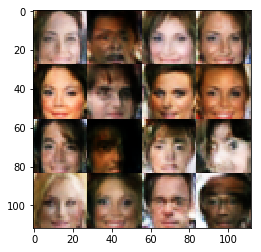

Timestamp 20170805-05-19-21.914 -  Epoch 1/1 -  Step 23310 -  D Loss: 1.1795 - G Loss: 1.0638
Timestamp 20170805-05-19-29.404 -  Epoch 1/1 -  Step 23320 -  D Loss: 1.3728 - G Loss: 0.9384
Timestamp 20170805-05-19-36.819 -  Epoch 1/1 -  Step 23330 -  D Loss: 1.0285 - G Loss: 0.5861
Timestamp 20170805-05-19-44.206 -  Epoch 1/1 -  Step 23340 -  D Loss: 0.7829 - G Loss: 1.5000
Timestamp 20170805-05-19-51.630 -  Epoch 1/1 -  Step 23350 -  D Loss: 0.8728 - G Loss: 1.5904
Timestamp 20170805-05-19-59.009 -  Epoch 1/1 -  Step 23360 -  D Loss: 1.1188 - G Loss: 1.0949
Timestamp 20170805-05-20-06.387 -  Epoch 1/1 -  Step 23370 -  D Loss: 0.7354 - G Loss: 1.4313
Timestamp 20170805-05-20-13.781 -  Epoch 1/1 -  Step 23380 -  D Loss: 0.9299 - G Loss: 1.9903
Timestamp 20170805-05-20-21.171 -  Epoch 1/1 -  Step 23390 -  D Loss: 0.5922 - G Loss: 2.2518
Timestamp 20170805-05-20-28.643 -  Epoch 1/1 -  Step 23400 -  D Loss: 1.0073 - G Loss: 1.8680


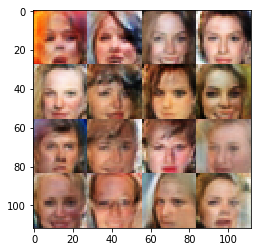

Timestamp 20170805-05-20-36.925 -  Epoch 1/1 -  Step 23410 -  D Loss: 1.0681 - G Loss: 0.9228
Timestamp 20170805-05-20-44.460 -  Epoch 1/1 -  Step 23420 -  D Loss: 0.9282 - G Loss: 0.8135
Timestamp 20170805-05-20-51.872 -  Epoch 1/1 -  Step 23430 -  D Loss: 0.8763 - G Loss: 1.1575
Timestamp 20170805-05-20-59.388 -  Epoch 1/1 -  Step 23440 -  D Loss: 1.1580 - G Loss: 1.0862
Timestamp 20170805-05-21-06.785 -  Epoch 1/1 -  Step 23450 -  D Loss: 1.0356 - G Loss: 1.7312
Timestamp 20170805-05-21-14.168 -  Epoch 1/1 -  Step 23460 -  D Loss: 1.0993 - G Loss: 1.6896
Timestamp 20170805-05-21-21.666 -  Epoch 1/1 -  Step 23470 -  D Loss: 1.0290 - G Loss: 1.2844
Timestamp 20170805-05-21-29.080 -  Epoch 1/1 -  Step 23480 -  D Loss: 1.5093 - G Loss: 0.9134
Timestamp 20170805-05-21-36.583 -  Epoch 1/1 -  Step 23490 -  D Loss: 1.1018 - G Loss: 1.1462
Timestamp 20170805-05-21-44.163 -  Epoch 1/1 -  Step 23500 -  D Loss: 0.9100 - G Loss: 1.2812


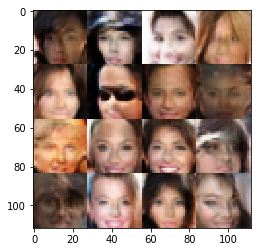

Timestamp 20170805-05-21-52.441 -  Epoch 1/1 -  Step 23510 -  D Loss: 1.1382 - G Loss: 0.7691
Timestamp 20170805-05-21-59.901 -  Epoch 1/1 -  Step 23520 -  D Loss: 0.9546 - G Loss: 1.9373
Timestamp 20170805-05-22-07.295 -  Epoch 1/1 -  Step 23530 -  D Loss: 0.9706 - G Loss: 1.0908
Timestamp 20170805-05-22-14.702 -  Epoch 1/1 -  Step 23540 -  D Loss: 1.0350 - G Loss: 1.3463
Timestamp 20170805-05-22-22.099 -  Epoch 1/1 -  Step 23550 -  D Loss: 0.8674 - G Loss: 0.9961
Timestamp 20170805-05-22-29.561 -  Epoch 1/1 -  Step 23560 -  D Loss: 1.1958 - G Loss: 1.2907
Timestamp 20170805-05-22-36.997 -  Epoch 1/1 -  Step 23570 -  D Loss: 0.7366 - G Loss: 1.8237
Timestamp 20170805-05-22-44.396 -  Epoch 1/1 -  Step 23580 -  D Loss: 1.0679 - G Loss: 1.1250
Timestamp 20170805-05-22-51.820 -  Epoch 1/1 -  Step 23590 -  D Loss: 0.9566 - G Loss: 1.6235
Timestamp 20170805-05-22-59.161 -  Epoch 1/1 -  Step 23600 -  D Loss: 1.2247 - G Loss: 0.8860


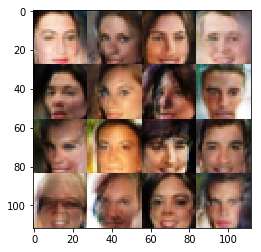

Timestamp 20170805-05-23-07.443 -  Epoch 1/1 -  Step 23610 -  D Loss: 0.9330 - G Loss: 1.4632
Timestamp 20170805-05-23-15.038 -  Epoch 1/1 -  Step 23620 -  D Loss: 0.9430 - G Loss: 1.2275
Timestamp 20170805-05-23-22.458 -  Epoch 1/1 -  Step 23630 -  D Loss: 0.8309 - G Loss: 1.7257
Timestamp 20170805-05-23-29.942 -  Epoch 1/1 -  Step 23640 -  D Loss: 1.2957 - G Loss: 0.8110
Timestamp 20170805-05-23-37.492 -  Epoch 1/1 -  Step 23650 -  D Loss: 0.8252 - G Loss: 1.5489
Timestamp 20170805-05-23-45.022 -  Epoch 1/1 -  Step 23660 -  D Loss: 0.8402 - G Loss: 1.5028
Timestamp 20170805-05-23-52.469 -  Epoch 1/1 -  Step 23670 -  D Loss: 0.9986 - G Loss: 1.8074
Timestamp 20170805-05-23-59.954 -  Epoch 1/1 -  Step 23680 -  D Loss: 1.4860 - G Loss: 0.9187
Timestamp 20170805-05-24-07.421 -  Epoch 1/1 -  Step 23690 -  D Loss: 1.0562 - G Loss: 1.6151
Timestamp 20170805-05-24-14.944 -  Epoch 1/1 -  Step 23700 -  D Loss: 0.9458 - G Loss: 1.6394


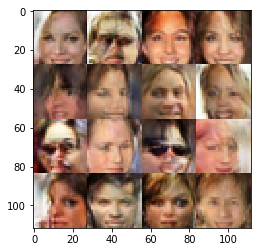

Timestamp 20170805-05-24-23.170 -  Epoch 1/1 -  Step 23710 -  D Loss: 0.8867 - G Loss: 1.5751
Timestamp 20170805-05-24-30.583 -  Epoch 1/1 -  Step 23720 -  D Loss: 1.0403 - G Loss: 1.0636
Timestamp 20170805-05-24-38.031 -  Epoch 1/1 -  Step 23730 -  D Loss: 1.1063 - G Loss: 1.7175
Timestamp 20170805-05-24-45.460 -  Epoch 1/1 -  Step 23740 -  D Loss: 0.8134 - G Loss: 0.8720
Timestamp 20170805-05-24-52.891 -  Epoch 1/1 -  Step 23750 -  D Loss: 0.8806 - G Loss: 1.4439
Timestamp 20170805-05-25-00.290 -  Epoch 1/1 -  Step 23760 -  D Loss: 1.1603 - G Loss: 1.0258
Timestamp 20170805-05-25-07.878 -  Epoch 1/1 -  Step 23770 -  D Loss: 1.0606 - G Loss: 0.9721
Timestamp 20170805-05-25-15.311 -  Epoch 1/1 -  Step 23780 -  D Loss: 0.8337 - G Loss: 1.4507
Timestamp 20170805-05-25-22.711 -  Epoch 1/1 -  Step 23790 -  D Loss: 1.2250 - G Loss: 0.8376
Timestamp 20170805-05-25-30.115 -  Epoch 1/1 -  Step 23800 -  D Loss: 1.4188 - G Loss: 1.1015


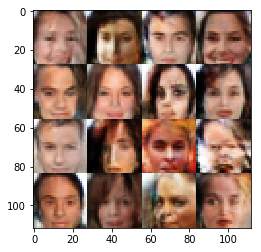

Timestamp 20170805-05-25-38.354 -  Epoch 1/1 -  Step 23810 -  D Loss: 1.2723 - G Loss: 1.2047
Timestamp 20170805-05-25-45.702 -  Epoch 1/1 -  Step 23820 -  D Loss: 0.9700 - G Loss: 1.8141
Timestamp 20170805-05-25-53.051 -  Epoch 1/1 -  Step 23830 -  D Loss: 0.9959 - G Loss: 0.8168
Timestamp 20170805-05-26-00.560 -  Epoch 1/1 -  Step 23840 -  D Loss: 1.0973 - G Loss: 1.5105
Timestamp 20170805-05-26-07.984 -  Epoch 1/1 -  Step 23850 -  D Loss: 0.8623 - G Loss: 1.5915
Timestamp 20170805-05-26-15.358 -  Epoch 1/1 -  Step 23860 -  D Loss: 1.0706 - G Loss: 0.9300
Timestamp 20170805-05-26-22.815 -  Epoch 1/1 -  Step 23870 -  D Loss: 1.2303 - G Loss: 1.7396
Timestamp 20170805-05-26-30.339 -  Epoch 1/1 -  Step 23880 -  D Loss: 0.8244 - G Loss: 1.1609
Timestamp 20170805-05-26-37.757 -  Epoch 1/1 -  Step 23890 -  D Loss: 0.7764 - G Loss: 1.4261
Timestamp 20170805-05-26-45.269 -  Epoch 1/1 -  Step 23900 -  D Loss: 0.8998 - G Loss: 1.3271


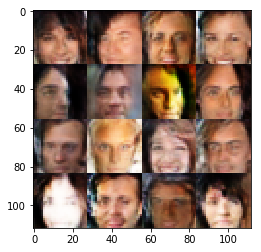

Timestamp 20170805-05-26-53.645 -  Epoch 1/1 -  Step 23910 -  D Loss: 1.0749 - G Loss: 1.5227
Timestamp 20170805-05-27-01.162 -  Epoch 1/1 -  Step 23920 -  D Loss: 0.9461 - G Loss: 1.2587
Timestamp 20170805-05-27-08.625 -  Epoch 1/1 -  Step 23930 -  D Loss: 1.3030 - G Loss: 0.8590
Timestamp 20170805-05-27-15.967 -  Epoch 1/1 -  Step 23940 -  D Loss: 0.9663 - G Loss: 1.1675
Timestamp 20170805-05-27-23.418 -  Epoch 1/1 -  Step 23950 -  D Loss: 0.9688 - G Loss: 2.3803
Timestamp 20170805-05-27-30.891 -  Epoch 1/1 -  Step 23960 -  D Loss: 1.3822 - G Loss: 2.2391
Timestamp 20170805-05-27-38.270 -  Epoch 1/1 -  Step 23970 -  D Loss: 0.9571 - G Loss: 0.6946
Timestamp 20170805-05-27-45.798 -  Epoch 1/1 -  Step 23980 -  D Loss: 0.7886 - G Loss: 1.4028
Timestamp 20170805-05-27-53.204 -  Epoch 1/1 -  Step 23990 -  D Loss: 0.9407 - G Loss: 1.2028
Timestamp 20170805-05-28-00.684 -  Epoch 1/1 -  Step 24000 -  D Loss: 1.0668 - G Loss: 0.3580


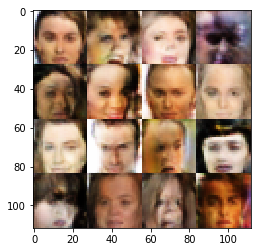

Timestamp 20170805-05-28-08.841 -  Epoch 1/1 -  Step 24010 -  D Loss: 1.0232 - G Loss: 2.0187
Timestamp 20170805-05-28-16.335 -  Epoch 1/1 -  Step 24020 -  D Loss: 0.9512 - G Loss: 1.4139
Timestamp 20170805-05-28-23.783 -  Epoch 1/1 -  Step 24030 -  D Loss: 1.0607 - G Loss: 1.2305
Timestamp 20170805-05-28-31.163 -  Epoch 1/1 -  Step 24040 -  D Loss: 1.1924 - G Loss: 1.0860
Timestamp 20170805-05-28-38.623 -  Epoch 1/1 -  Step 24050 -  D Loss: 1.1599 - G Loss: 1.5946
Timestamp 20170805-05-28-46.026 -  Epoch 1/1 -  Step 24060 -  D Loss: 0.8371 - G Loss: 1.4218
Timestamp 20170805-05-28-53.489 -  Epoch 1/1 -  Step 24070 -  D Loss: 1.8003 - G Loss: 1.0353
Timestamp 20170805-05-29-00.959 -  Epoch 1/1 -  Step 24080 -  D Loss: 1.1894 - G Loss: 1.6734
Timestamp 20170805-05-29-08.459 -  Epoch 1/1 -  Step 24090 -  D Loss: 0.9018 - G Loss: 1.2012
Timestamp 20170805-05-29-15.911 -  Epoch 1/1 -  Step 24100 -  D Loss: 0.7245 - G Loss: 1.3448


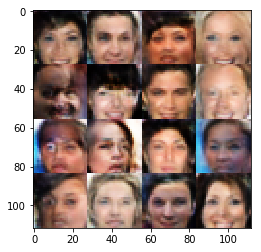

Timestamp 20170805-05-29-24.359 -  Epoch 1/1 -  Step 24110 -  D Loss: 1.1416 - G Loss: 0.9841
Timestamp 20170805-05-29-31.781 -  Epoch 1/1 -  Step 24120 -  D Loss: 1.0067 - G Loss: 0.8651
Timestamp 20170805-05-29-39.294 -  Epoch 1/1 -  Step 24130 -  D Loss: 0.8430 - G Loss: 1.0848
Timestamp 20170805-05-29-46.669 -  Epoch 1/1 -  Step 24140 -  D Loss: 0.6885 - G Loss: 1.3461
Timestamp 20170805-05-29-54.159 -  Epoch 1/1 -  Step 24150 -  D Loss: 0.7773 - G Loss: 1.7258
Timestamp 20170805-05-30-01.489 -  Epoch 1/1 -  Step 24160 -  D Loss: 0.6845 - G Loss: 1.1895
Timestamp 20170805-05-30-08.926 -  Epoch 1/1 -  Step 24170 -  D Loss: 0.6500 - G Loss: 1.5939
Timestamp 20170805-05-30-16.417 -  Epoch 1/1 -  Step 24180 -  D Loss: 0.8299 - G Loss: 1.8017
Timestamp 20170805-05-30-23.863 -  Epoch 1/1 -  Step 24190 -  D Loss: 1.2620 - G Loss: 1.0520
Timestamp 20170805-05-30-31.313 -  Epoch 1/1 -  Step 24200 -  D Loss: 0.8759 - G Loss: 1.5270


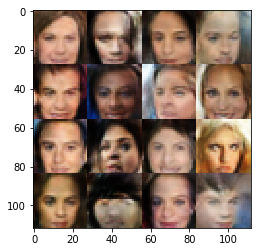

Timestamp 20170805-05-30-39.542 -  Epoch 1/1 -  Step 24210 -  D Loss: 0.9818 - G Loss: 1.5403
Timestamp 20170805-05-30-47.025 -  Epoch 1/1 -  Step 24220 -  D Loss: 1.2341 - G Loss: 1.2880
Timestamp 20170805-05-30-54.468 -  Epoch 1/1 -  Step 24230 -  D Loss: 0.7313 - G Loss: 1.4678
Timestamp 20170805-05-31-01.869 -  Epoch 1/1 -  Step 24240 -  D Loss: 1.2439 - G Loss: 1.1807
Timestamp 20170805-05-31-09.363 -  Epoch 1/1 -  Step 24250 -  D Loss: 1.1086 - G Loss: 1.8775
Timestamp 20170805-05-31-16.865 -  Epoch 1/1 -  Step 24260 -  D Loss: 1.3875 - G Loss: 2.0260
Timestamp 20170805-05-31-24.212 -  Epoch 1/1 -  Step 24270 -  D Loss: 0.9744 - G Loss: 1.3180
Timestamp 20170805-05-31-31.651 -  Epoch 1/1 -  Step 24280 -  D Loss: 0.8062 - G Loss: 1.3048
Timestamp 20170805-05-31-39.180 -  Epoch 1/1 -  Step 24290 -  D Loss: 0.8361 - G Loss: 1.0404
Timestamp 20170805-05-31-46.695 -  Epoch 1/1 -  Step 24300 -  D Loss: 0.9411 - G Loss: 0.7873


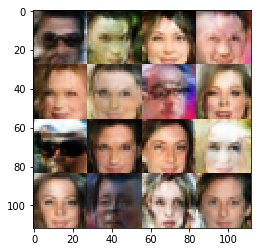

Timestamp 20170805-05-31-55.095 -  Epoch 1/1 -  Step 24310 -  D Loss: 0.7178 - G Loss: 1.1862
Timestamp 20170805-05-32-02.503 -  Epoch 1/1 -  Step 24320 -  D Loss: 1.9287 - G Loss: 1.3407
Timestamp 20170805-05-32-09.962 -  Epoch 1/1 -  Step 24330 -  D Loss: 1.0177 - G Loss: 1.8579
Timestamp 20170805-05-32-17.516 -  Epoch 1/1 -  Step 24340 -  D Loss: 0.8431 - G Loss: 1.8139
Timestamp 20170805-05-32-25.018 -  Epoch 1/1 -  Step 24350 -  D Loss: 1.5103 - G Loss: 0.9921
Timestamp 20170805-05-32-32.389 -  Epoch 1/1 -  Step 24360 -  D Loss: 0.9871 - G Loss: 1.3499
Timestamp 20170805-05-32-39.837 -  Epoch 1/1 -  Step 24370 -  D Loss: 0.9838 - G Loss: 1.2717
Timestamp 20170805-05-32-47.287 -  Epoch 1/1 -  Step 24380 -  D Loss: 1.2997 - G Loss: 1.4014
Timestamp 20170805-05-32-54.706 -  Epoch 1/1 -  Step 24390 -  D Loss: 1.8618 - G Loss: 0.6115
Timestamp 20170805-05-33-02.318 -  Epoch 1/1 -  Step 24400 -  D Loss: 0.9439 - G Loss: 1.6381


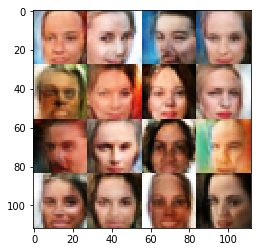

Timestamp 20170805-05-33-10.574 -  Epoch 1/1 -  Step 24410 -  D Loss: 0.8559 - G Loss: 1.3578
Timestamp 20170805-05-33-17.978 -  Epoch 1/1 -  Step 24420 -  D Loss: 0.6678 - G Loss: 1.9372
Timestamp 20170805-05-33-25.443 -  Epoch 1/1 -  Step 24430 -  D Loss: 0.7569 - G Loss: 1.3791
Timestamp 20170805-05-33-32.984 -  Epoch 1/1 -  Step 24440 -  D Loss: 0.7521 - G Loss: 1.4156
Timestamp 20170805-05-33-40.536 -  Epoch 1/1 -  Step 24450 -  D Loss: 0.7146 - G Loss: 2.2206
Timestamp 20170805-05-33-48.066 -  Epoch 1/1 -  Step 24460 -  D Loss: 1.0824 - G Loss: 0.9980
Timestamp 20170805-05-33-55.491 -  Epoch 1/1 -  Step 24470 -  D Loss: 0.8953 - G Loss: 1.8416
Timestamp 20170805-05-34-03.055 -  Epoch 1/1 -  Step 24480 -  D Loss: 1.0524 - G Loss: 0.9429
Timestamp 20170805-05-34-10.384 -  Epoch 1/1 -  Step 24490 -  D Loss: 1.1143 - G Loss: 1.2756
Timestamp 20170805-05-34-17.884 -  Epoch 1/1 -  Step 24500 -  D Loss: 0.8839 - G Loss: 1.0631


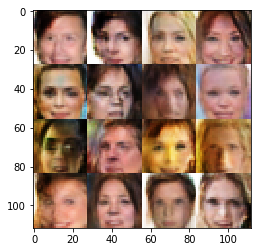

Timestamp 20170805-05-34-26.107 -  Epoch 1/1 -  Step 24510 -  D Loss: 1.0596 - G Loss: 2.1753
Timestamp 20170805-05-34-33.535 -  Epoch 1/1 -  Step 24520 -  D Loss: 0.9094 - G Loss: 1.2043
Timestamp 20170805-05-34-40.958 -  Epoch 1/1 -  Step 24530 -  D Loss: 0.5777 - G Loss: 1.5949
Timestamp 20170805-05-34-48.474 -  Epoch 1/1 -  Step 24540 -  D Loss: 0.7834 - G Loss: 1.3248
Timestamp 20170805-05-34-55.936 -  Epoch 1/1 -  Step 24550 -  D Loss: 0.9769 - G Loss: 1.4865
Timestamp 20170805-05-35-03.353 -  Epoch 1/1 -  Step 24560 -  D Loss: 1.3079 - G Loss: 1.3855
Timestamp 20170805-05-35-10.754 -  Epoch 1/1 -  Step 24570 -  D Loss: 1.0011 - G Loss: 1.6759
Timestamp 20170805-05-35-18.278 -  Epoch 1/1 -  Step 24580 -  D Loss: 0.8536 - G Loss: 1.7517
Timestamp 20170805-05-35-25.739 -  Epoch 1/1 -  Step 24590 -  D Loss: 0.9248 - G Loss: 0.7811
Timestamp 20170805-05-35-33.233 -  Epoch 1/1 -  Step 24600 -  D Loss: 0.8365 - G Loss: 1.7447


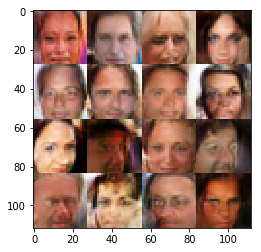

Timestamp 20170805-05-35-41.569 -  Epoch 1/1 -  Step 24610 -  D Loss: 1.4531 - G Loss: 0.8271
Timestamp 20170805-05-35-48.943 -  Epoch 1/1 -  Step 24620 -  D Loss: 0.6697 - G Loss: 1.7131
Timestamp 20170805-05-35-56.421 -  Epoch 1/1 -  Step 24630 -  D Loss: 1.1538 - G Loss: 0.9061
Timestamp 20170805-05-36-03.872 -  Epoch 1/1 -  Step 24640 -  D Loss: 0.6548 - G Loss: 1.1509
Timestamp 20170805-05-36-11.302 -  Epoch 1/1 -  Step 24650 -  D Loss: 0.8942 - G Loss: 1.5799
Timestamp 20170805-05-36-18.762 -  Epoch 1/1 -  Step 24660 -  D Loss: 1.4593 - G Loss: 1.9343
Timestamp 20170805-05-36-26.231 -  Epoch 1/1 -  Step 24670 -  D Loss: 0.9632 - G Loss: 1.9647
Timestamp 20170805-05-36-33.703 -  Epoch 1/1 -  Step 24680 -  D Loss: 1.1862 - G Loss: 1.2470
Timestamp 20170805-05-36-41.189 -  Epoch 1/1 -  Step 24690 -  D Loss: 1.1040 - G Loss: 1.3318
Timestamp 20170805-05-36-48.690 -  Epoch 1/1 -  Step 24700 -  D Loss: 1.0200 - G Loss: 1.5338


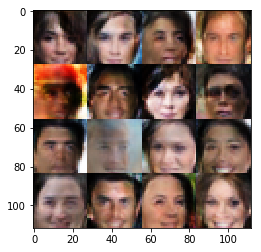

Timestamp 20170805-05-36-56.913 -  Epoch 1/1 -  Step 24710 -  D Loss: 1.0850 - G Loss: 2.2893
Timestamp 20170805-05-37-04.460 -  Epoch 1/1 -  Step 24720 -  D Loss: 0.5917 - G Loss: 1.6886
Timestamp 20170805-05-37-11.826 -  Epoch 1/1 -  Step 24730 -  D Loss: 1.3461 - G Loss: 1.3383
Timestamp 20170805-05-37-19.234 -  Epoch 1/1 -  Step 24740 -  D Loss: 1.3865 - G Loss: 2.2727
Timestamp 20170805-05-37-26.772 -  Epoch 1/1 -  Step 24750 -  D Loss: 0.8954 - G Loss: 1.2928
Timestamp 20170805-05-37-34.195 -  Epoch 1/1 -  Step 24760 -  D Loss: 0.8877 - G Loss: 1.2710
Timestamp 20170805-05-37-41.674 -  Epoch 1/1 -  Step 24770 -  D Loss: 0.8433 - G Loss: 1.5904
Timestamp 20170805-05-37-49.201 -  Epoch 1/1 -  Step 24780 -  D Loss: 0.8454 - G Loss: 1.4203
Timestamp 20170805-05-37-56.599 -  Epoch 1/1 -  Step 24790 -  D Loss: 1.2523 - G Loss: 1.5296
Timestamp 20170805-05-38-04.120 -  Epoch 1/1 -  Step 24800 -  D Loss: 0.8001 - G Loss: 1.5781


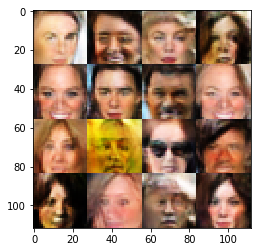

Timestamp 20170805-05-38-12.476 -  Epoch 1/1 -  Step 24810 -  D Loss: 1.2065 - G Loss: 1.7603
Timestamp 20170805-05-38-20.003 -  Epoch 1/1 -  Step 24820 -  D Loss: 0.8527 - G Loss: 1.6841
Timestamp 20170805-05-38-27.579 -  Epoch 1/1 -  Step 24830 -  D Loss: 0.6625 - G Loss: 1.8840
Timestamp 20170805-05-38-35.080 -  Epoch 1/1 -  Step 24840 -  D Loss: 1.1615 - G Loss: 1.2552
Timestamp 20170805-05-38-42.443 -  Epoch 1/1 -  Step 24850 -  D Loss: 1.0617 - G Loss: 0.8894
Timestamp 20170805-05-38-49.998 -  Epoch 1/1 -  Step 24860 -  D Loss: 1.2049 - G Loss: 0.9760
Timestamp 20170805-05-38-57.501 -  Epoch 1/1 -  Step 24870 -  D Loss: 1.2152 - G Loss: 1.9384
Timestamp 20170805-05-39-04.949 -  Epoch 1/1 -  Step 24880 -  D Loss: 0.9710 - G Loss: 1.3601
Timestamp 20170805-05-39-12.470 -  Epoch 1/1 -  Step 24890 -  D Loss: 0.7607 - G Loss: 1.2784
Timestamp 20170805-05-39-20.107 -  Epoch 1/1 -  Step 24900 -  D Loss: 1.0409 - G Loss: 1.4744


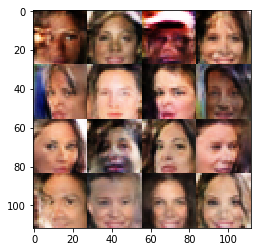

Timestamp 20170805-05-39-28.384 -  Epoch 1/1 -  Step 24910 -  D Loss: 0.7811 - G Loss: 2.1414
Timestamp 20170805-05-39-35.863 -  Epoch 1/1 -  Step 24920 -  D Loss: 1.0065 - G Loss: 1.5494
Timestamp 20170805-05-39-43.346 -  Epoch 1/1 -  Step 24930 -  D Loss: 1.0422 - G Loss: 1.1356
Timestamp 20170805-05-39-50.842 -  Epoch 1/1 -  Step 24940 -  D Loss: 1.0006 - G Loss: 1.7018
Timestamp 20170805-05-39-58.226 -  Epoch 1/1 -  Step 24950 -  D Loss: 1.0300 - G Loss: 1.1007
Timestamp 20170805-05-40-05.741 -  Epoch 1/1 -  Step 24960 -  D Loss: 1.0015 - G Loss: 1.1103
Timestamp 20170805-05-40-13.138 -  Epoch 1/1 -  Step 24970 -  D Loss: 0.7763 - G Loss: 1.4395
Timestamp 20170805-05-40-20.501 -  Epoch 1/1 -  Step 24980 -  D Loss: 0.9211 - G Loss: 1.4581
Timestamp 20170805-05-40-27.987 -  Epoch 1/1 -  Step 24990 -  D Loss: 0.8195 - G Loss: 1.3484
Timestamp 20170805-05-40-35.286 -  Epoch 1/1 -  Step 25000 -  D Loss: 1.1484 - G Loss: 1.1748


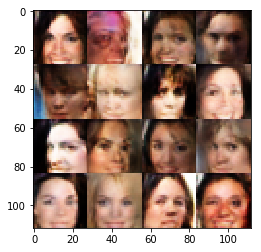

Timestamp 20170805-05-40-43.881 -  Epoch 1/1 -  Step 25010 -  D Loss: 0.7702 - G Loss: 1.3942
Timestamp 20170805-05-40-51.274 -  Epoch 1/1 -  Step 25020 -  D Loss: 0.9610 - G Loss: 1.2071
Timestamp 20170805-05-40-58.672 -  Epoch 1/1 -  Step 25030 -  D Loss: 0.6375 - G Loss: 1.1768
Timestamp 20170805-05-41-06.092 -  Epoch 1/1 -  Step 25040 -  D Loss: 0.8622 - G Loss: 1.3996
Timestamp 20170805-05-41-13.525 -  Epoch 1/1 -  Step 25050 -  D Loss: 0.9039 - G Loss: 1.0935
Timestamp 20170805-05-41-20.950 -  Epoch 1/1 -  Step 25060 -  D Loss: 1.1943 - G Loss: 1.2412
Timestamp 20170805-05-41-28.473 -  Epoch 1/1 -  Step 25070 -  D Loss: 1.2038 - G Loss: 1.2268
Timestamp 20170805-05-41-35.916 -  Epoch 1/1 -  Step 25080 -  D Loss: 1.6703 - G Loss: 0.3152
Timestamp 20170805-05-41-43.464 -  Epoch 1/1 -  Step 25090 -  D Loss: 0.9465 - G Loss: 1.0360
Timestamp 20170805-05-41-50.894 -  Epoch 1/1 -  Step 25100 -  D Loss: 0.8697 - G Loss: 1.0137


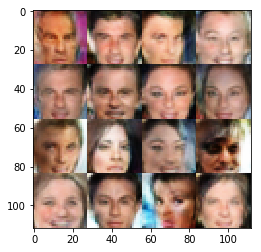

Timestamp 20170805-05-41-59.213 -  Epoch 1/1 -  Step 25110 -  D Loss: 1.1751 - G Loss: 1.0878
Timestamp 20170805-05-42-06.611 -  Epoch 1/1 -  Step 25120 -  D Loss: 0.9515 - G Loss: 1.0588
Timestamp 20170805-05-42-14.047 -  Epoch 1/1 -  Step 25130 -  D Loss: 0.9624 - G Loss: 1.6173
Timestamp 20170805-05-42-21.411 -  Epoch 1/1 -  Step 25140 -  D Loss: 0.9905 - G Loss: 2.1577
Timestamp 20170805-05-42-28.872 -  Epoch 1/1 -  Step 25150 -  D Loss: 0.7351 - G Loss: 2.7339
Timestamp 20170805-05-42-36.409 -  Epoch 1/1 -  Step 25160 -  D Loss: 1.0446 - G Loss: 1.7346
Timestamp 20170805-05-42-44.025 -  Epoch 1/1 -  Step 25170 -  D Loss: 0.7535 - G Loss: 1.0405
Timestamp 20170805-05-42-51.602 -  Epoch 1/1 -  Step 25180 -  D Loss: 0.7348 - G Loss: 1.6793
Timestamp 20170805-05-42-59.047 -  Epoch 1/1 -  Step 25190 -  D Loss: 0.9086 - G Loss: 1.2907
Timestamp 20170805-05-43-06.618 -  Epoch 1/1 -  Step 25200 -  D Loss: 1.5159 - G Loss: 0.6592


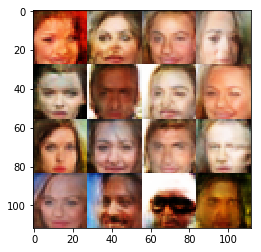

Timestamp 20170805-05-43-14.939 -  Epoch 1/1 -  Step 25210 -  D Loss: 0.7997 - G Loss: 1.5845
Timestamp 20170805-05-43-22.316 -  Epoch 1/1 -  Step 25220 -  D Loss: 1.0959 - G Loss: 1.9127
Timestamp 20170805-05-43-29.702 -  Epoch 1/1 -  Step 25230 -  D Loss: 1.0744 - G Loss: 0.6921
Timestamp 20170805-05-43-37.096 -  Epoch 1/1 -  Step 25240 -  D Loss: 0.8958 - G Loss: 1.6892
Timestamp 20170805-05-43-44.461 -  Epoch 1/1 -  Step 25250 -  D Loss: 1.0110 - G Loss: 1.2195
Timestamp 20170805-05-43-51.888 -  Epoch 1/1 -  Step 25260 -  D Loss: 2.0984 - G Loss: 0.6696
Timestamp 20170805-05-43-59.213 -  Epoch 1/1 -  Step 25270 -  D Loss: 0.6997 - G Loss: 1.2642
Timestamp 20170805-05-44-06.528 -  Epoch 1/1 -  Step 25280 -  D Loss: 1.0569 - G Loss: 1.2655
Timestamp 20170805-05-44-13.840 -  Epoch 1/1 -  Step 25290 -  D Loss: 0.8087 - G Loss: 1.5245
Timestamp 20170805-05-44-21.251 -  Epoch 1/1 -  Step 25300 -  D Loss: 1.2274 - G Loss: 0.9411


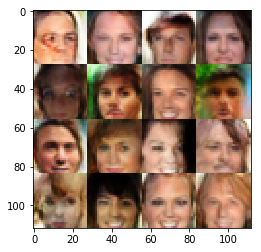

Timestamp 20170805-05-44-29.397 -  Epoch 1/1 -  Step 25310 -  D Loss: 0.9364 - G Loss: 0.7806
Timestamp 20170805-05-44-37.053 -  Epoch 1/1 -  Step 25320 -  D Loss: 0.8024 - G Loss: 1.0762
Timestamp 20170805-05-44-40.114 -  Epoch 1/1 -  Step 25324 -  D Loss: 0.9055 - G Loss: 1.7291


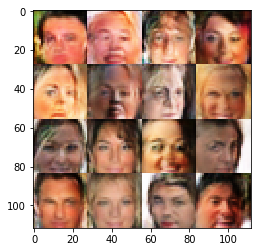

In [13]:
batch_size = 8
z_dim = 100
learning_rate = 0.0002
beta1 = 0.5

tf.reset_default_graph()

"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 1

celeba_dataset = helper.Dataset('celeba', glob(os.path.join(data_dir, 'img_align_celeba/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, celeba_dataset.get_batches,
          celeba_dataset.shape, celeba_dataset.image_mode)


### Submitting This Project
When submitting this project, make sure to run all the cells before saving the notebook. Save the notebook file as "dlnd_face_generation.ipynb" and save it as a HTML file under "File" -> "Download as". Include the "helper.py" and "problem_unittests.py" files in your submission.